In [1]:
import numpy as np
np.__version__

'1.19.5'

In [2]:
import pandas as pd
pd.__version__

'1.1.5'

In [3]:
import matplotlib
matplotlib.__version__

'3.3.4'

In [4]:
import matplotlib.pyplot as plt

In [5]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [6]:
import scipy
scipy.__version__

'1.5.4'

In [7]:
from scipy import stats

In [8]:
import seaborn as sns

In [9]:
from datetime import datetime

In [10]:
#from pandarallel import pandarallel

In [11]:
#pandarallel.initialize(progress_bar=True)

In [12]:
default_max_columns=pd.get_option('display.max_columns')

In [13]:
default_max_rows=pd.get_option('display.max_rows')

In [14]:
default_precision=pd.get_option('display.precision')

In [15]:
pd.set_option('display.precision', 2)

In [16]:
default_threshold=np.get_printoptions()['threshold']

In [17]:
np.set_printoptions(threshold=10000000)

# Read meta data

In [18]:
meta = pd.read_csv('20210428-EV/metadata.csv')

In [19]:
meta.head()

,Rand 2 Batch_order,D-plex Sequencing ID,Lexogen Sequencing ID,Diagnosis
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"


In [20]:
meta.rename(columns={"Rand 2 Batch_order": "subject"},inplace=True)
meta.rename(columns={"D-plex Sequencing ID": "dplex"},inplace=True)
meta.rename(columns={"Lexogen Sequencing ID": "lexogen"},inplace=True)
meta.rename(columns={"Diagnosis": "diag"},inplace=True)
#meta.set_index('subject',inplace=True)

In [21]:
meta

,subject,dplex,lexogen,diag
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"
5,1_6,SFHH005f,SFHH006f,"Diffuse Astrocytoma, IDH-mutant,"
6,1_7,SFHH005g,SFHH006g,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
7,1_8,SFHH005h,SFHH006h,"GBM, IDH1R132H WT,"
8,1_9,SFHH005i,SFHH006i,"GBM, IDH-mutant,"
9,1_10,SFHH005j,SFHH006j,"Diffuse Astrocytoma, IDH-mutant,"


In [22]:
meta[['disease','idh','x1p19q']] = meta['diag'].str.split(",", 2, expand=True)
#meta.drop('diag',axis='columns',inplace=True)

In [23]:
meta

,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted",Oligodendroglioma,IDH-mutant,1p19q codeleted
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
5,1_6,SFHH005f,SFHH006f,"Diffuse Astrocytoma, IDH-mutant,",Diffuse Astrocytoma,IDH-mutant,
6,1_7,SFHH005g,SFHH006g,"Oligodendroglioma, IDH-mutant, 1p19q codeleted",Oligodendroglioma,IDH-mutant,1p19q codeleted
7,1_8,SFHH005h,SFHH006h,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
8,1_9,SFHH005i,SFHH006i,"GBM, IDH-mutant,",GBM,IDH-mutant,
9,1_10,SFHH005j,SFHH006j,"Diffuse Astrocytoma, IDH-mutant,",Diffuse Astrocytoma,IDH-mutant,


# Read raw matrix CORE

In [24]:
#df = pd.read_csv('20210428-EV/dplexonlyreport.csv',index_col=0,header=None)
df = pd.read_csv('20210428-EV/20210513b-report.csv.gz',index_col=0,header=None,low_memory=False)

In [25]:
df.shape

(39, 528)

In [26]:
df.head(12)

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
---,---,---,---,---,---,---,---,---,---,---,...,---,---,---,---,---,---,---,---,---,---
Subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
Trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,4038879,4038879,4038879,4038879,4038879,4038879,3088240,3088240,3088240,3088240,...,3665258,3665258,3665258,3665258,4868169,4868169,4868169,4868169,4868169,4868169
Raw Read Length,35.0646,35.0646,35.0646,35.0646,35.0646,35.0646,48.6946,48.6946,48.6946,48.6946,...,34.0495,34.0495,34.0495,34.0495,36.2413,36.2413,36.2413,36.2413,36.2413,36.2413
Trimmed Read Count,1270784,1372973,1372997,1395891,1395893,1395893,1240850,1396651,1396740,1418066,...,3633881,3661993,3664115,3664263,4478092,4823895,4823681,4863961,4867158,4867302
Trimmed Ave Read Length,33.8185,38.2306,38.2314,43.5121,43.5142,43.524,40.8779,51.0991,51.101,64.3485,...,32.6867,33.8972,34.0071,34.0507,30.6793,34.7925,34.7983,36.0631,36.1974,36.242


In [27]:
df.drop("---",inplace=True)

In [28]:
df.shape

(38, 528)

In [29]:
df.rename({'  ':'sample'},axis='rows',inplace=True)
df.rename({'Subject':'subject'},axis='rows',inplace=True)
df.rename({'Trimmer':'trimmer'},axis='rows',inplace=True)

In [30]:
df

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
sample,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,4038879,4038879,4038879,4038879,4038879,4038879,3088240,3088240,3088240,3088240,...,3665258,3665258,3665258,3665258,4868169,4868169,4868169,4868169,4868169,4868169
Raw Read Length,35.0646,35.0646,35.0646,35.0646,35.0646,35.0646,48.6946,48.6946,48.6946,48.6946,...,34.0495,34.0495,34.0495,34.0495,36.2413,36.2413,36.2413,36.2413,36.2413,36.2413
Trimmed Read Count,1270784,1372973,1372997,1395891,1395893,1395893,1240850,1396651,1396740,1418066,...,3633881,3661993,3664115,3664263,4478092,4823895,4823681,4863961,4867158,4867302
Trimmed Ave Read Length,33.8185,38.2306,38.2314,43.5121,43.5142,43.524,40.8779,51.0991,51.101,64.3485,...,32.6867,33.8972,34.0071,34.0507,30.6793,34.7925,34.7983,36.0631,36.1974,36.242
STAR Aligned to Transcriptome,111104,112499,112492,112689,112696,112689,92673,93752,93727,92285,...,337860,337076,336880,336843,362402,363298,363259,362012,361905,361853


In [31]:
df=df.T
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,Bowtie2 Aligned to Salmonella,Bowtie2 Aligned to Salmonella %,Bowtie2 Aligned to masked Salmonella,Bowtie2 Aligned to masked Salmonella %,Bowtie2 Aligned to Burkholderia,Bowtie2 Aligned to Burkholderia %,Bowtie2 Aligned to masked Burkholderia,Bowtie2 Aligned to masked Burkholderia %,Bowtie2 Aligned to mRNA_Prot,Bowtie2 Aligned to mRNA_Prot %
1,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,45946,3.61,14700,1.15,375543,29.55,277406,21.82,58736,4.62
2,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,60133,4.37,17811,1.29,413414,30.11,298416,21.73,71735,5.22
3,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,60133,4.37,17811,1.29,413414,30.11,298416,21.73,71735,5.22
4,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,61284,4.39,18218,1.30,420290,30.10,304330,21.80,75518,5.41
5,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,61285,4.39,18218,1.30,420299,30.10,304339,21.80,75522,5.41


In [32]:
#df=df.merge(meta,left_on='Subject',right_on='subject')
df=df.merge(meta,on='subject')
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,Bowtie2 Aligned to masked Burkholderia,Bowtie2 Aligned to masked Burkholderia %,Bowtie2 Aligned to mRNA_Prot,Bowtie2 Aligned to mRNA_Prot %,dplex,lexogen,diag,disease,idh,x1p19q
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,277406,21.82,58736,4.62,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,298416,21.73,71735,5.22,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,298416,21.73,71735,5.22,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,304330,21.80,75518,5.41,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,304339,21.80,75522,5.41,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,


In [33]:
#element_counts = pd.read_csv('20210428-EV/rmsk_class_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/rmsk_family_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/rmsk_name_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/mirna_counts.csv.gz',index_col=0,low_memory=False)
element_counts = pd.read_csv('20210428-EV/gene_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/mrna_counts.csv.gz',index_col=0,low_memory=False)
# diamond_family_counts

element_counts.head()

,SFHH005aa.bbduk1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.bbduk2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.bbduk3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.cutadapt1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.cutadapt2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.cutadapt3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005ab.bbduk1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005ab.bbduk2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005ab.bbduk3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005a.bbduk1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,...,SFHH006y.bbduk3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006y.cutadapt1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006y.cutadapt2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006y.cutadapt3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.bbduk1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.bbduk2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.bbduk3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.cutadapt1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.cutadapt2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.cutadapt3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts
sequence,,,,,,,,,,,,,,,,,,,,,
A1BG,0,0,0,0,0,0,0,0,0,0,...,21,21,21,21,0,0,0,0,0,0
A1BG-AS1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A1CF,0,0,0,0,0,0,24,24,24,0,...,0,0,0,0,0,0,0,0,0,0
A2M,0,0,0,0,0,0,50,125,125,0,...,0,0,0,0,0,0,0,0,0,0
A2M-AS1,0,0,0,0,0,0,177,177,177,6,...,0,0,0,0,0,0,0,0,0,0


# Keep less than 5000 columns

In [34]:
len(element_counts)

34074

In [35]:
#element_counts=element_counts[0:5000]
#element_counts=element_counts[5000:10000]
#element_counts=element_counts[10000:15000]
#element_counts=element_counts[15000:20000]
#element_counts=element_counts[20000:25000]
#element_counts=element_counts[25000:30000]
#element_counts=element_counts[30000:35000]

In [36]:
len(element_counts)

34074

In [37]:
element_counts=element_counts.T
element_counts=element_counts.reset_index()
element_counts[['sample','trimmer','other']]=element_counts['index'].str.split(".",2,expand=True)
element_counts.drop(["index","other"],inplace=True,axis='columns')
element_counts.head()

sequence,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2MP1,A3GALT2,A4GALT,A4GNT,...,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,sample,trimmer
0,0,0,0,0,0,0,0,26,0,0,...,0,0,0,0,0,0,78,0,SFHH005aa,bbduk1
1,0,0,0,0,0,0,0,26,0,0,...,0,0,0,0,0,0,78,0,SFHH005aa,bbduk2
2,0,0,0,0,0,0,0,26,0,0,...,0,0,0,0,0,0,78,0,SFHH005aa,bbduk3
3,0,0,0,0,0,0,0,26,0,0,...,0,0,0,0,0,0,72,0,SFHH005aa,cutadapt1
4,0,0,0,0,0,0,0,26,0,0,...,0,0,0,0,0,0,72,0,SFHH005aa,cutadapt2


In [38]:
df=df.merge(element_counts,on=['sample','trimmer'])
df.shape

(528, 34118)

In [39]:
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,0,0,78,0
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,0,0,0,0,0,0,0,0,78,0
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,0,0,0,0,0,0,0,0,78,0
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,0,0,0,0,0,0,0,0,72,0
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,0,0,0,0,0,0,0,0,72,0


In [40]:
df.columns  #.tolist()

Index(['sample', 'subject', 'Lab kit', 'trimmer', 'Raw Read Count',
       'Raw Read Length', 'Trimmed Read Count', 'Trimmed Ave Read Length',
       'STAR Aligned to Transcriptome', 'STAR Aligned to Transcriptome %',
       ...
       'ZWILCH', 'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B', 'ZYX',
       'ZZEF1', 'ZZZ3'],
      dtype='object', length=34118)

In [41]:
#genes=df.columns[92:142]
#genes=df.columns[100:554]
#a=df.columns.tolist().index('STAR Gene Counts')+1
#b=df.columns.tolist().index('STAR miRNA Counts')
#genes=df.columns[a:b]
elements=element_counts.columns[:-2]
elements

Index(['A1BG', 'A1BG-AS1', 'A1CF', 'A2M', 'A2M-AS1', 'A2ML1', 'A2MP1',
       'A3GALT2', 'A4GALT', 'A4GNT',
       ...
       'ZWILCH', 'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B', 'ZYX',
       'ZZEF1', 'ZZZ3'],
      dtype='object', name='sequence', length=34074)

In [42]:
df['Raw Read Count'] = pd.to_numeric(df['Raw Read Count'], errors='coerce')

In [43]:
df['Trimmed Read Count'] = pd.to_numeric(df['Trimmed Read Count'], errors='coerce')

In [44]:
pd.set_option('display.max_rows',None)

In [45]:
#df[['subject','sample','Raw Read Count']].drop_duplicates().sort_values(by='Raw Read Count')

In [46]:
#df[['subject','sample','trimmer','Trimmed Read Count']].drop_duplicates().sort_values(by='Trimmed Read Count')

In [47]:
pd.set_option('display.max_rows',default_max_rows)

# Prepping to ttest all items against all other items

In [48]:
df['diag'].unique()

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'V01 control (S1),,', 'GBM, IDH1R132H WT,', 'blank 2 (C1),,',
       'blank1 (C1),,'], dtype=object)

In [49]:
u=df['diag'].unique()
diags=u[0:3]
diags=np.append(diags,u[4])

In [50]:
diags

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'GBM, IDH1R132H WT,'], dtype=object)

In [51]:
type(diags)

numpy.ndarray

In [52]:
diags=diags.tolist()

In [53]:
diags

['GBM, IDH-mutant,',
 'Diffuse Astrocytoma, IDH-mutant,',
 'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
 'GBM, IDH1R132H WT,']

In [54]:
# Why was this here?

#import warnings
#warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning) 

pca plots

In [55]:
def ttests_boxplots_and_heatmaps(localdf,columns,box_p=0.05,heat_p=0.15):
    select_p_values=[]
    for col in columns:

        if ( col not in localdf.columns ):
            continue

        for labkit in localdf['Lab kit'].unique():
            #"D-plex","Lexogen":
            for trimmer in 'bbduk2','cutadapt2':
                #localdf['Trimmer'].unique():
                #"bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
                for diag in diags:
                    others=diags.copy()
                    others.remove(diag)
                    for other in others:
                        t, p = stats.ttest_ind(
                            localdf[((localdf["Lab kit"]==labkit) &
                                     (localdf["trimmer"]==trimmer) & 
                                (localdf["diag"]==diag))][col],
                            localdf[((localdf["Lab kit"]==labkit) &
                                     (localdf["trimmer"]==trimmer) & 
                                (localdf["diag"]==other))][col])
                        if p < heat_p:
                            select_p_values.append([abs(t),p,col,labkit,trimmer])

    pdf = pd.DataFrame(select_p_values, columns=['t','p','col','labkit','trimmer'])                        
    pdf=pdf.drop_duplicates().sort_values('p')

    for index, row in pdf.iterrows():
        if row['p'] < box_p:
            print(" p : "+str(row['p'])+"  ( t : "+str(row['t'])+" ) :  "+
                  row['labkit']+"  :  "+row['trimmer']+"  :  "+row['col'])
            print("Control and blanks")
            print(localdf[
                (localdf['diag']=='V01 control (S1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
            print(localdf[
                (localdf['diag']=='blank 2 (C1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
            print(localdf[
                (localdf['diag']=='blank1 (C1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
                        
            localdf[((localdf["Lab kit"]==row['labkit']) &
                     (localdf["trimmer"]==row['trimmer']))].boxplot(
                column=row['col'],by=['diag'])
            plt.title(row['col'] + " Normalized by Trimmed Read Count")
            plt.xticks(rotation=75,ha='right')
            plt.show()

    selected=['subject','sample','Lab kit','trimmer','diag','idh']
    selected=np.append(selected,pdf['col'])
    selected=np.unique(selected)

    #['Lab kit' 'NR_029609.1' 'trimmer' 'diag' 'idh' 'sample' 'subject']
    if len(selected) > 7:
        for trimmer in 'bbduk2','cutadapt2':
            for labkit in dfn['Lab kit'].unique():
                tmp=localdf[selected].copy()
                tmp=tmp[(tmp['trimmer']==trimmer) & (tmp['Lab kit']==labkit)]
                tmp=tmp.drop('trimmer',axis='columns')
                tmp=tmp.drop('Lab kit',axis='columns')
                tmp.set_index(['subject','sample','diag','idh'],inplace=True)
                
                #tmp-=tmp.min() # This may almost always be 0 now.
                tmp/=tmp.max() # given that there should be no NAs now, coule let clustermap do this
                # ...
                #standard_scale int or None, optional
                #Either 0 (rows) or 1 (columns).
                #Whether or not to standardize that dimension, meaning for each row or column,
                #subtract the minimum and divide each by its maximum.
                # how would that deal with 0s or empty cells

                tmp=tmp.fillna(0) # Somehow, some scaled values become NaN so keep this
                
                tmp.reset_index(inplace=True)

                #tmp1=tmp.sort_values(['diag']).T
                tmp=tmp.sort_values(['idh','diag'])
                #print(tmp.head())
                tmp.drop(['subject'],inplace=True,axis='columns')
                tmp.set_index(['sample','idh'],inplace=True)
                
                diagnoses=tmp.pop('diag')
                #lut = dict(zip(diagnoses.unique(), "rgbcmykb"))
                #col_colors = diagnoses.map(lut)
                #print(col_colors)
                #print(tmp.columns)
                
                tmp=tmp.T

                #print('pal')
                network_pal = sns.cubehelix_palette(len(diagnoses.unique()),
                                    light=.9, dark=.1, reverse=True,
                                    start=1, rot=-2)
                #print(network_pal)
                network_pal
                #print('lut')
                network_lut = dict(zip(diagnoses.unique(), network_pal))
                #print(network_lut)
                #print('labels')
                # Convert the palette to vectors that will be drawn on the side of the matrix
                network_labels = diagnoses
                #print(network_labels)
                network_colors = pd.Series(network_labels, index=tmp.columns).map(network_lut)                
                #print('colors')
                #print(network_colors)
                
                # from http://dawnmy.github.io/2016/10/24/Plot-heatmaap-with-side-color-indicating-the-class-of-variables/
                # Create a custom palette to identify the networks
                #network_pal = sns.cubehelix_palette(len(used_networks),
                #                    light=.9, dark=.1, reverse=True,
                #                    start=1, rot=-2)
                #network_lut = dict(zip(map(str, used_networks), network_pal))

                # Convert the palette to vectors that will be drawn on the side of the matrix
                #network_labels = df.columns.get_level_values("network")
                #network_colors = pd.Series(network_labels, index=df.columns).map(network_lut)                
   
                # Create a custom colormap for the heatmap values
                #cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

                # Draw the full plot
                #g = sns.clustermap(df.corr(),

                #                 # Turn off the clustering
                #                 row_cluster=False, col_cluster=False,

                #                  # Add colored class labels
                #                  row_colors=network_colors, col_colors=network_colors,

                #                  # Make the plot look better when many rows/cols
                #                  linewidths=0, xticklabels=False, yticklabels=False)

                # Draw the legend bar for the classes                 
                #for label in network_labels.unique():
                #    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                #                            label=label, linewidth=0)
                #g.ax_col_dendrogram.legend(loc="center", ncol=5)

                
                g=sns.clustermap(tmp,col_cluster=False,figsize=(15,20),cmap="Spectral",col_colors=network_colors)
                g.fig.suptitle("Clustermap 1 : "+trimmer+" "+labkit)
                plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

                # Draw the legend bar for the classes                 
                for label in network_labels.unique():
                    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                            label=label, linewidth=0)
                g.ax_col_dendrogram.legend(loc="center", ncol=4)
                
                # Adjust the postion of the main colorbar for the heatmap
                #g.cax.set_position([.97, .2, .03, .45])
                g.cax.set_position([0, .15, .005, .65])
                plt.show()

                g=sns.clustermap(tmp,figsize=(15,20),cmap="Spectral",col_colors=network_colors)
                g.fig.suptitle("Clustermap 2 : "+trimmer+" "+labkit)
                plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

                # Draw the legend bar for the classes                 
                for label in network_labels.unique():
                    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                            label=label, linewidth=0)
                g.ax_col_dendrogram.legend(loc="center", ncol=4)
                                
                # Adjust the postion of the main colorbar for the heatmap
                # [dist from left,dist from bottom?,width?,height?]
                g.cax.set_position([0, .15, .005, .65])
                plt.show()  
    else:
        print("Not enough data to produce cluster maps")

# Normalize by Trimmed Read Count

In [56]:
dfn=df.copy()

In [57]:
dfn.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,0,0,78,0
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,0,0,0,0,0,0,0,0,78,0
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,0,0,0,0,0,0,0,0,78,0
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,0,0,0,0,0,0,0,0,72,0
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,0,0,0,0,0,0,0,0,72,0


In [58]:
datetime.now().strftime("%H:%M:%S")

'07:29:47'

In [59]:
dfn[elements]=(1e9*dfn[elements].values)/dfn[['Trimmed Read Count']].values

In [60]:
datetime.now().strftime("%H:%M:%S")

'07:45:25'

In [61]:
dfn.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,61379.43,0.0
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56811.02,0.0
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56810.03,0.0
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,51579.96,0.0
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,51579.88,0.0


In [62]:
datetime.now().strftime("%H:%M:%S")

'07:45:25'

In [63]:
for c in ['CDKN2A','CDKN2A-DT','CDKN2AIP','CDKN2AIPNL','CDKN2B','CDKN2B-AS1',
    'EGFR','EGFR-AS1','IDH1','IDH1-AS1','IDH2','IDH2-DT','NF1','NOTCH1',
    'RB1','RB1CC1','RB1-DT','TERT','TP53']:
        if( c not in dfn.columns ):
            print("Missing "+c) 

In [64]:
datetime.now().strftime("%H:%M:%S")

'07:45:25'

# Select Genes (if using Genes)

 p : 0.04520587862677298  ( t : 2.15213364120796 ) :  D-plex  :  cutadapt2  :  CDKN2AIPNL
Control and blanks
76     0.0
340    0.0
Name: CDKN2AIPNL, dtype: float64
208    0.0
Name: CDKN2AIPNL, dtype: float64
472    2311.82
Name: CDKN2AIPNL, dtype: float64


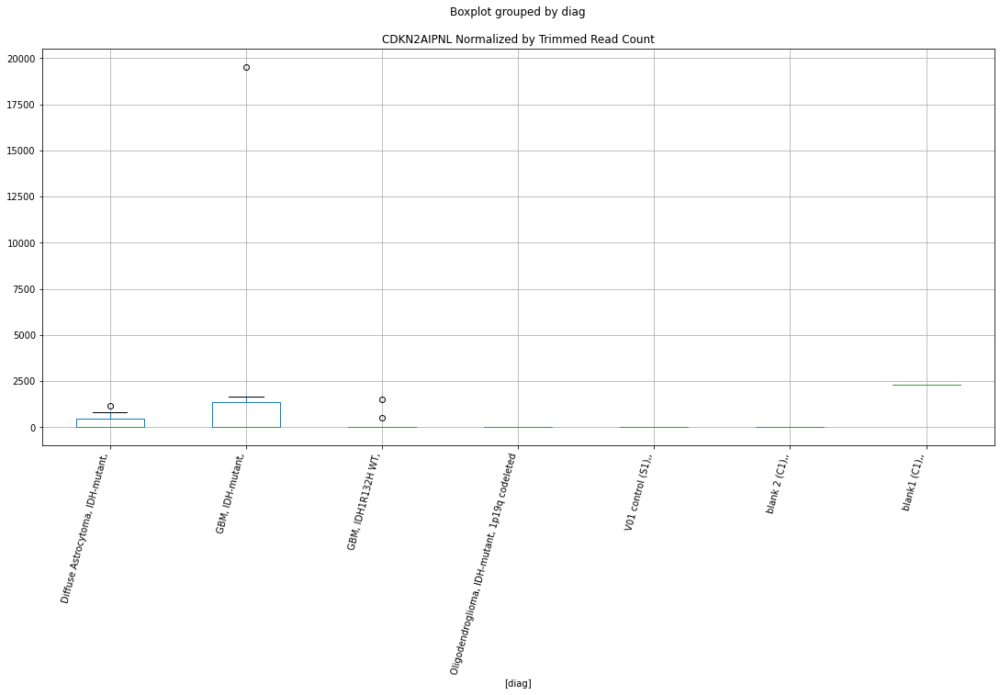

 p : 0.04536327784074556  ( t : 2.15037522407249 ) :  Lexogen  :  bbduk2  :  EGFR
Control and blanks
79     0.0
343    0.0
Name: EGFR, dtype: float64
211    0.0
Name: EGFR, dtype: float64
475    0.0
Name: EGFR, dtype: float64


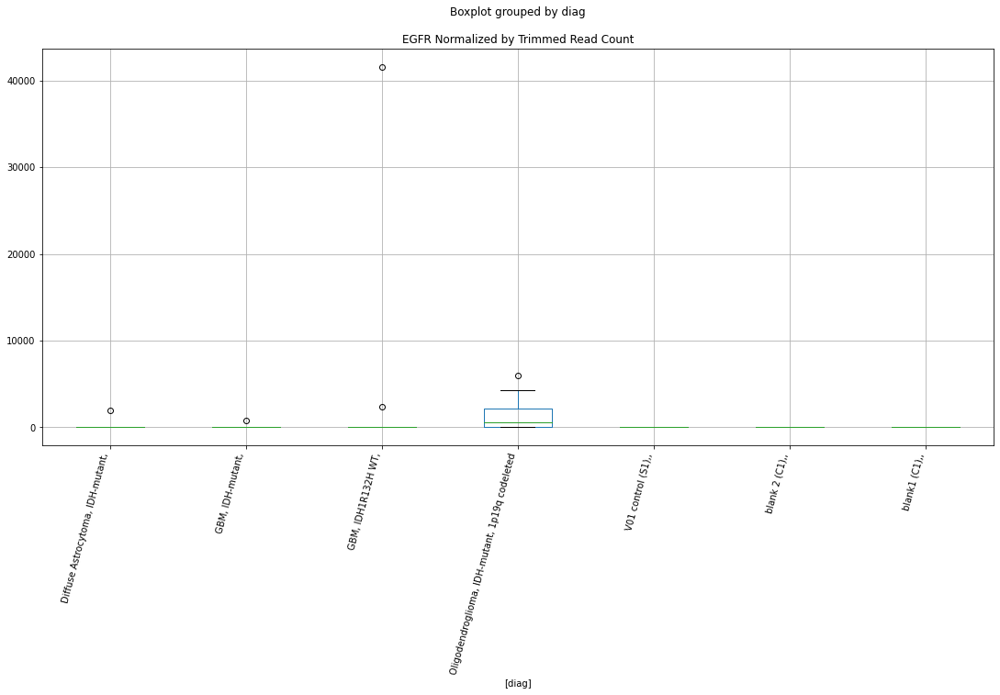

 p : 0.06726034214901823  ( t : 1.9473913018343938 ) :  D-plex  :  bbduk2  :  IDH1
Control and blanks
73     0.0
337    0.0
Name: IDH1, dtype: float64
205    179.09
Name: IDH1, dtype: float64
469    0.0
Name: IDH1, dtype: float64


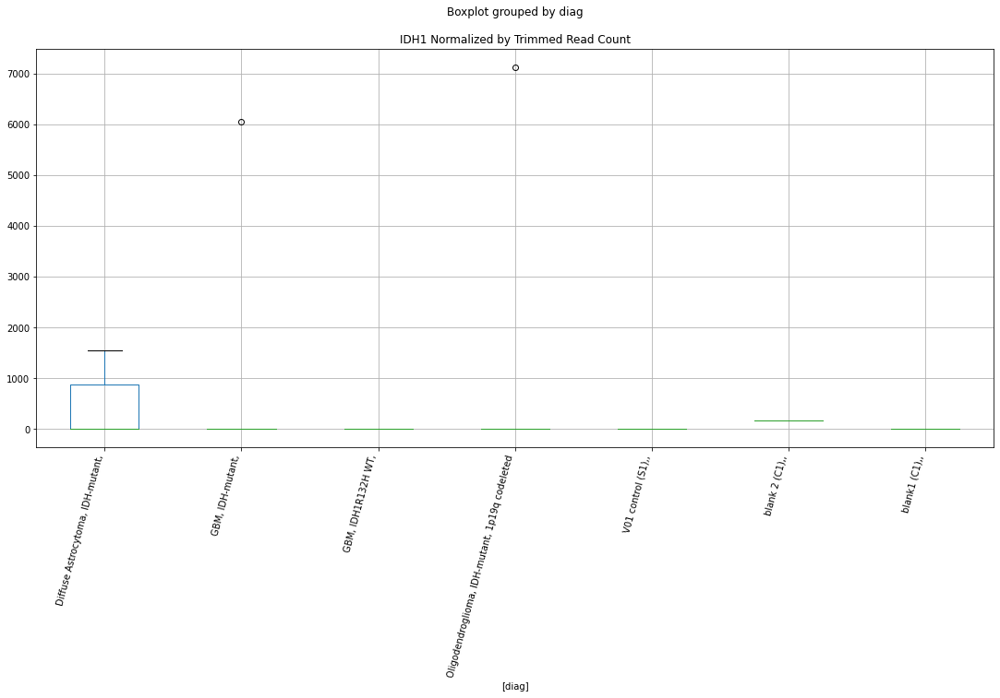

 p : 0.07098875237655615  ( t : 1.9189522234450682 ) :  Lexogen  :  bbduk2  :  EGFR
Control and blanks
79     0.0
343    0.0
Name: EGFR, dtype: float64
211    0.0
Name: EGFR, dtype: float64
475    0.0
Name: EGFR, dtype: float64


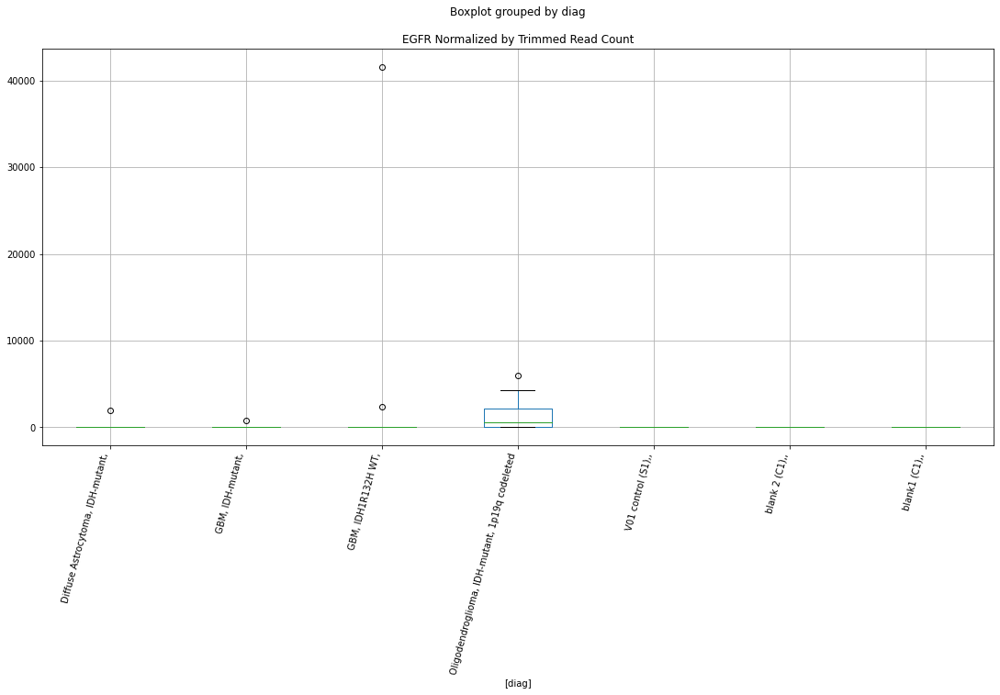

 p : 0.08168258736232811  ( t : 1.8441695860266962 ) :  Lexogen  :  cutadapt2  :  NOTCH1
Control and blanks
82         0.00
346    28198.23
Name: NOTCH1, dtype: float64
214    8679.25
Name: NOTCH1, dtype: float64
478    474.92
Name: NOTCH1, dtype: float64


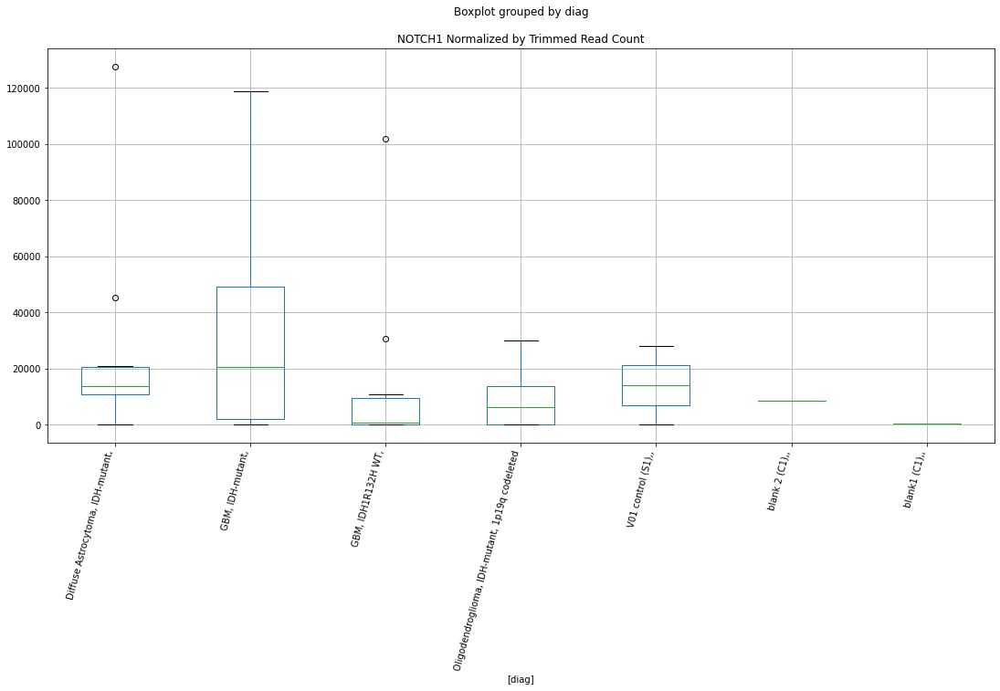

 p : 0.08399794007946997  ( t : 1.8291248879059394 ) :  D-plex  :  cutadapt2  :  RB1-DT
Control and blanks
76     0.0
340    0.0
Name: RB1-DT, dtype: float64
208    0.0
Name: RB1-DT, dtype: float64
472    577.96
Name: RB1-DT, dtype: float64


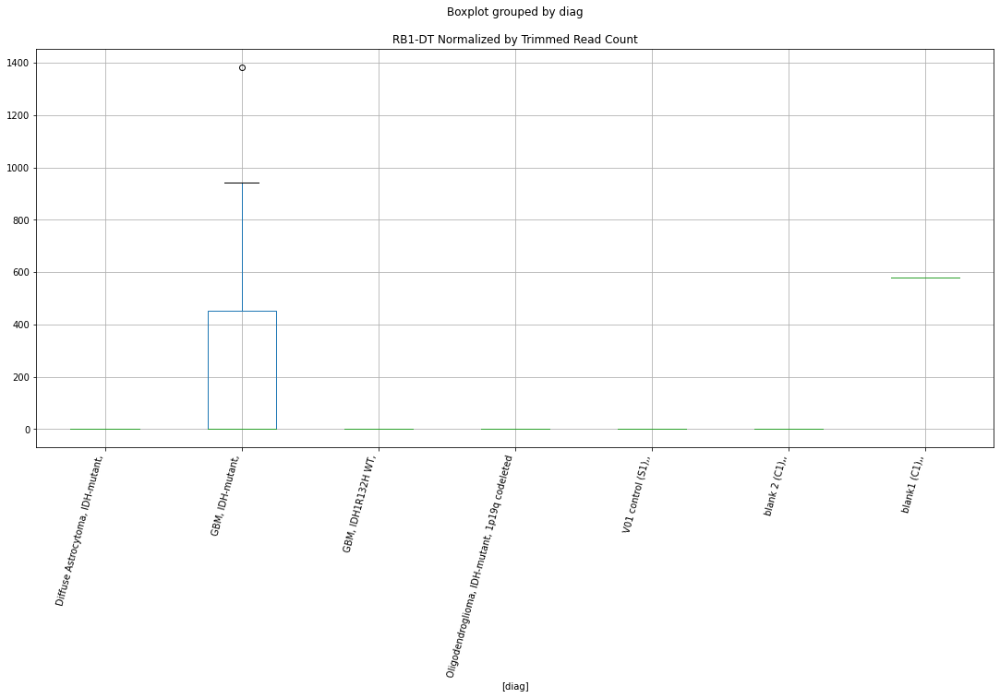

 p : 0.08716809345492967  ( t : 1.809105554324742 ) :  Lexogen  :  bbduk2  :  NOTCH1
Control and blanks
79         0.00
343    28450.12
Name: NOTCH1, dtype: float64
211    8745.8
Name: NOTCH1, dtype: float64
475    479.03
Name: NOTCH1, dtype: float64


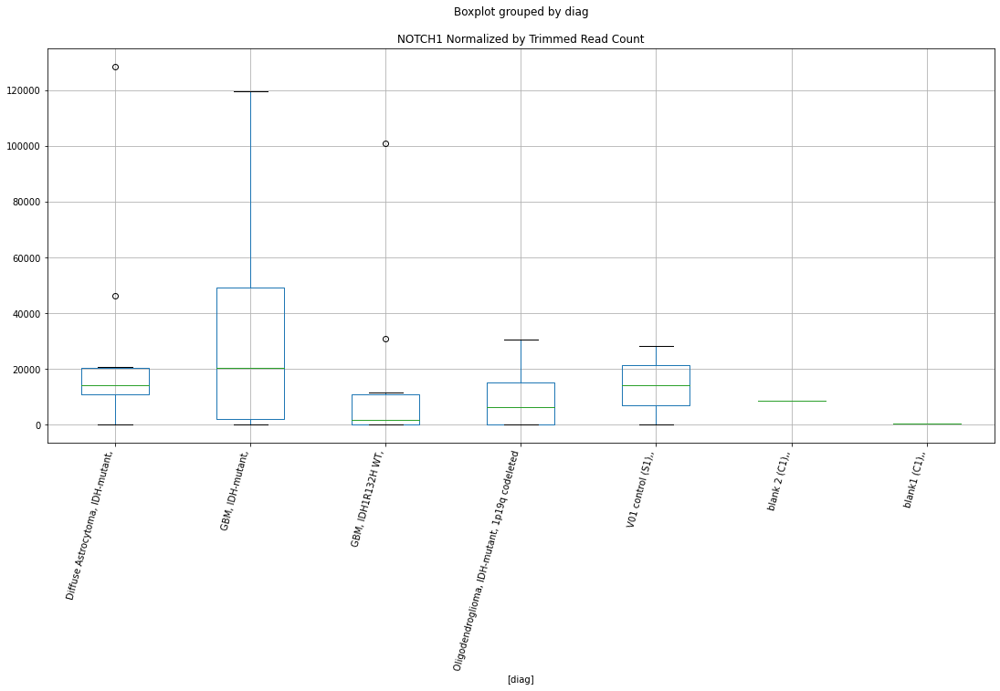

 p : 0.09008191140708462  ( t : 1.791259327015946 ) :  D-plex  :  bbduk2  :  NOTCH1
Control and blanks
73     12368.13
337    85455.10
Name: NOTCH1, dtype: float64
205    64651.83
Name: NOTCH1, dtype: float64
469    403421.63
Name: NOTCH1, dtype: float64


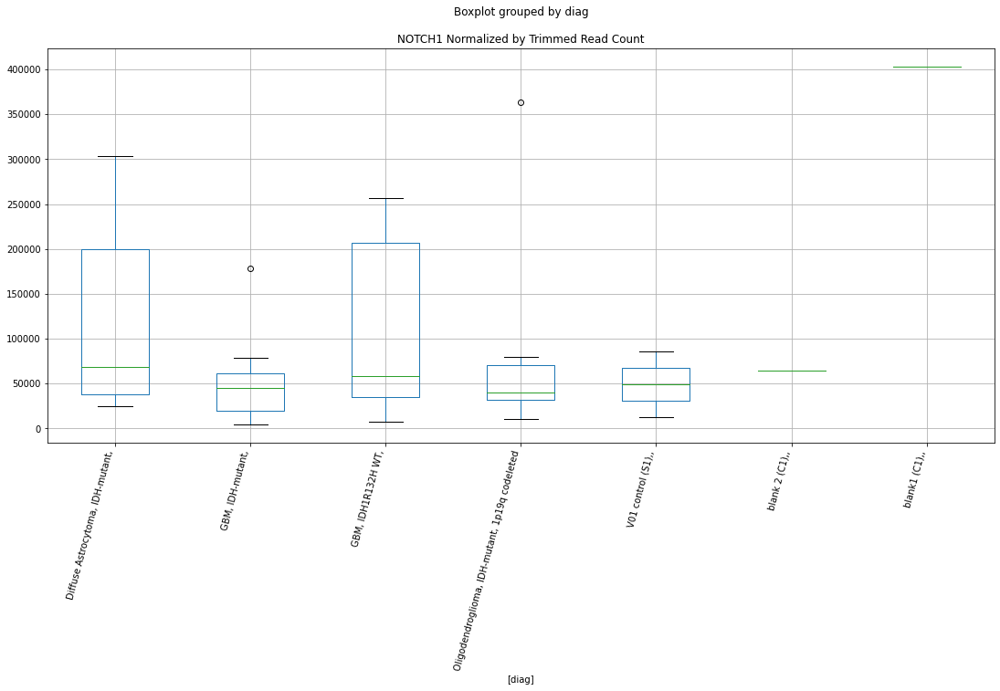

 p : 0.09338100118932555  ( t : 1.7716516052356617 ) :  D-plex  :  cutadapt2  :  NOTCH1
Control and blanks
76     12121.83
340    84550.28
Name: NOTCH1, dtype: float64
208    64371.48
Name: NOTCH1, dtype: float64
472    394165.88
Name: NOTCH1, dtype: float64


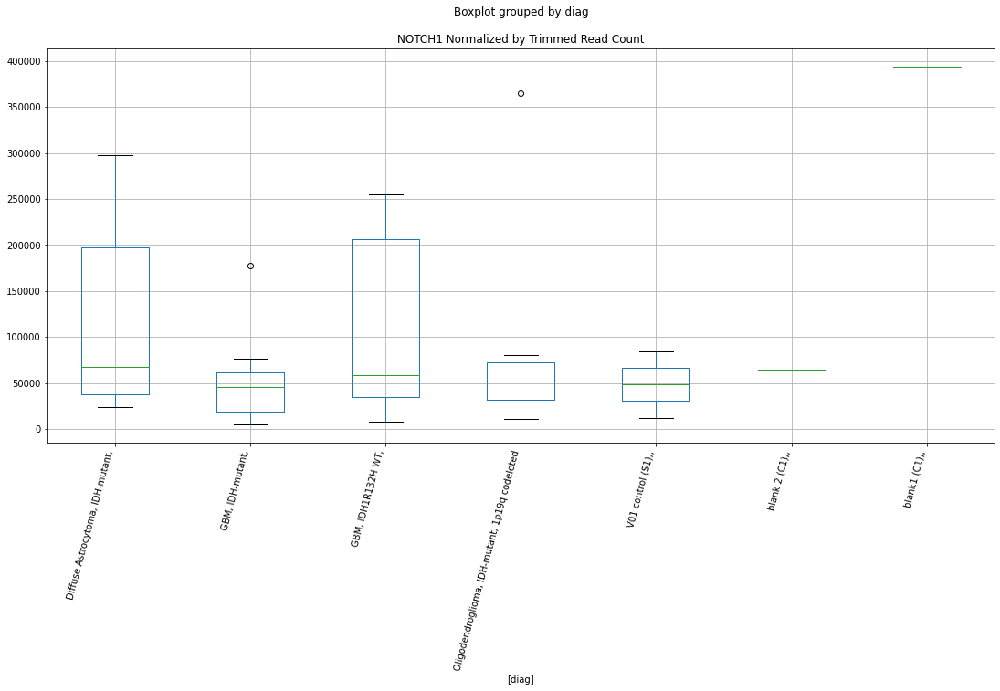

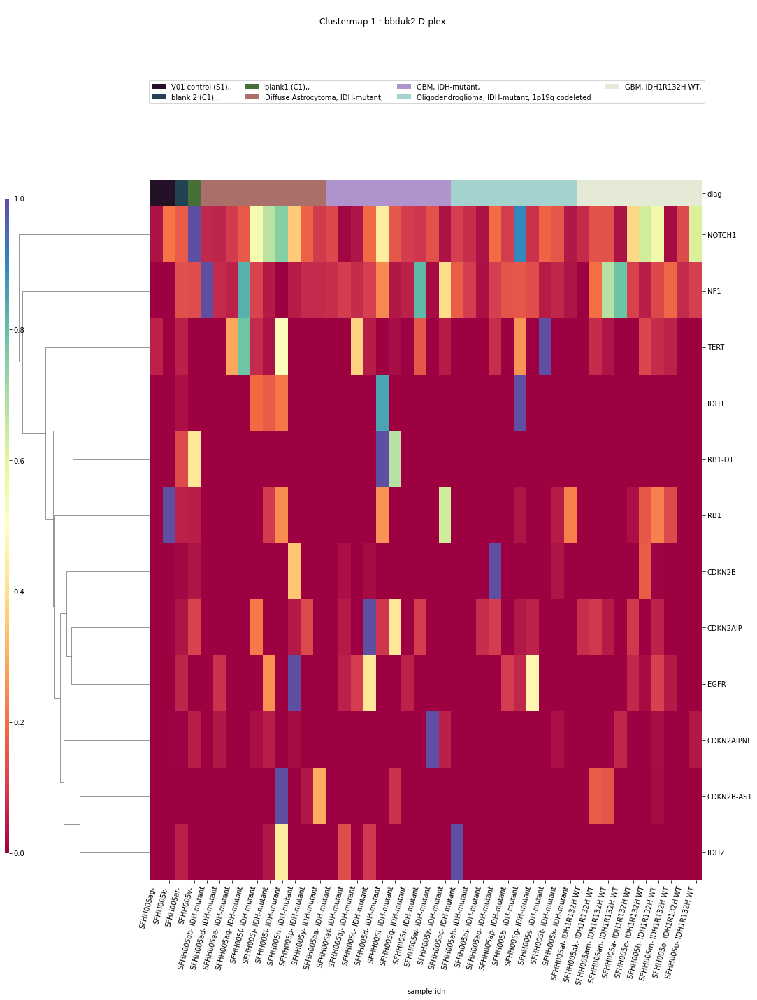

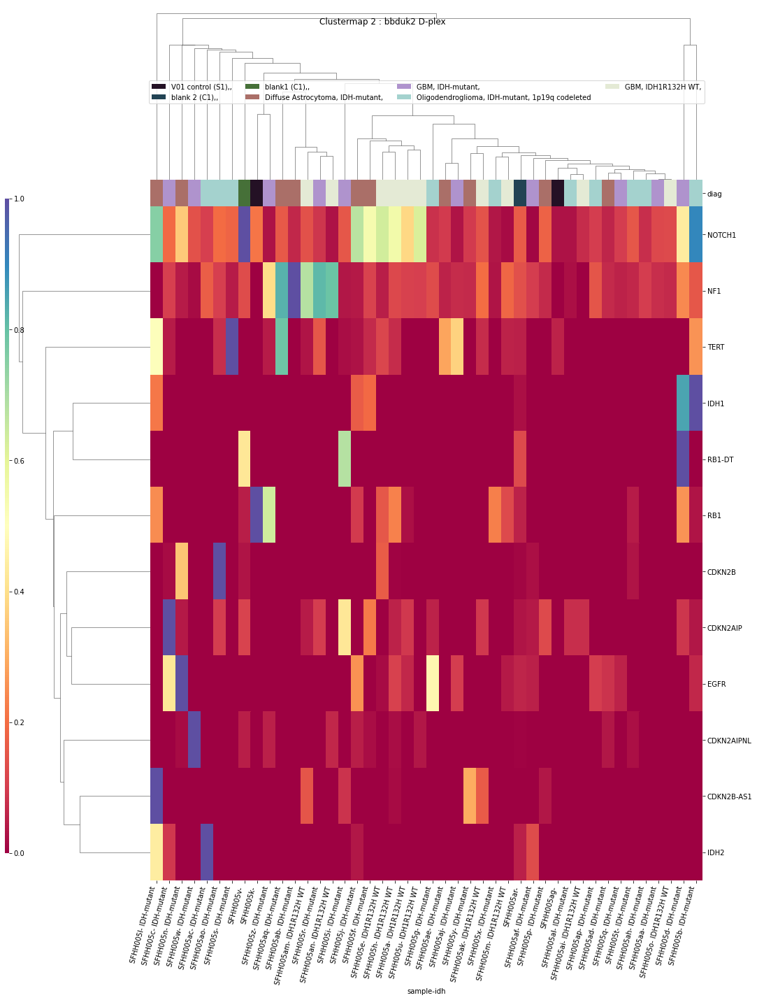

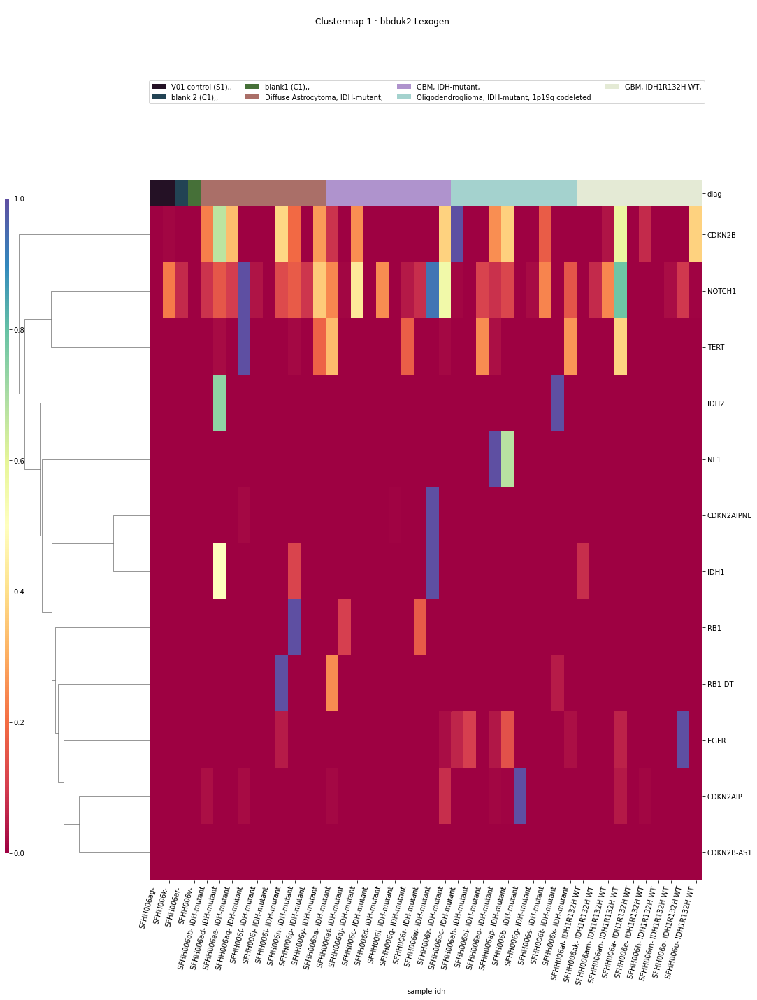

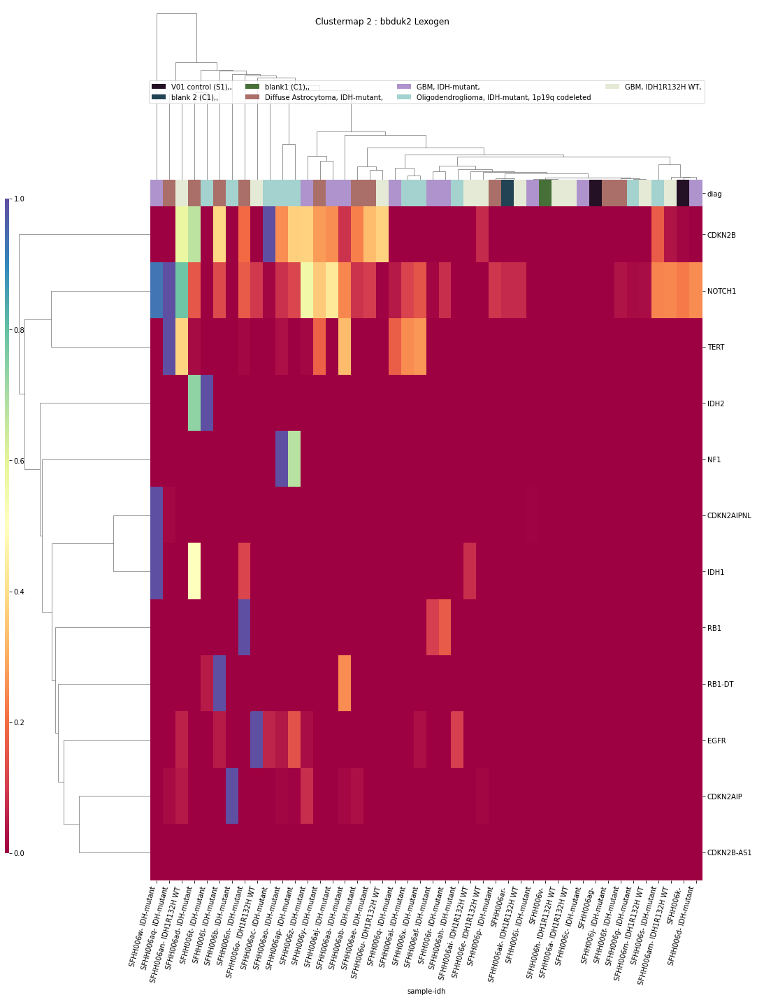

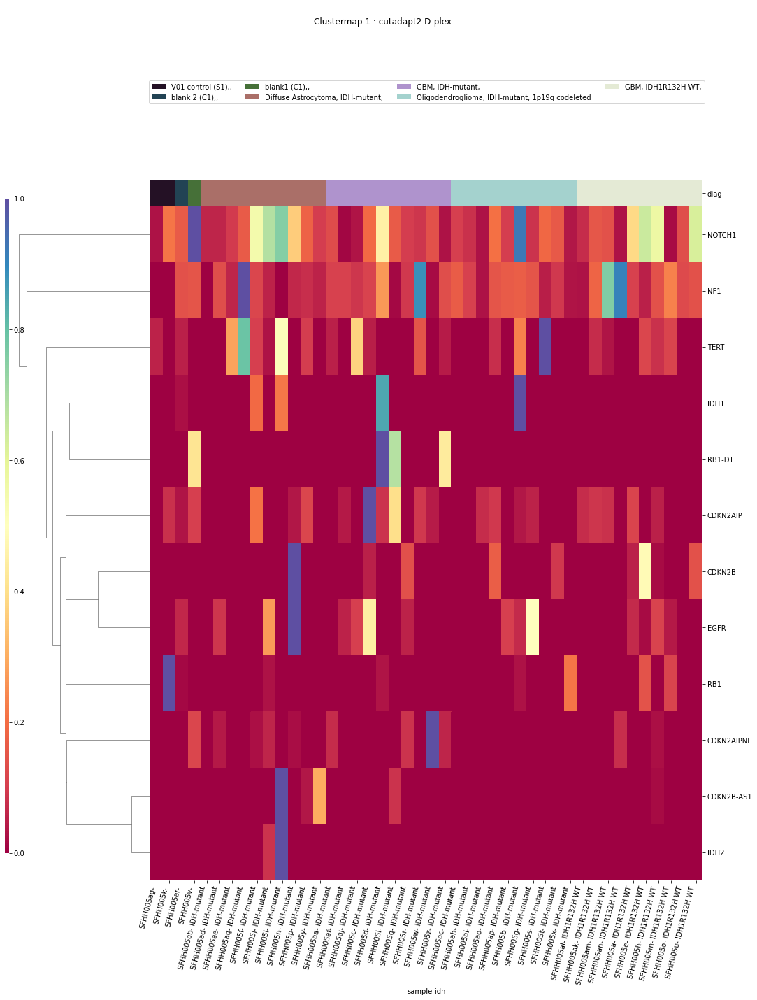

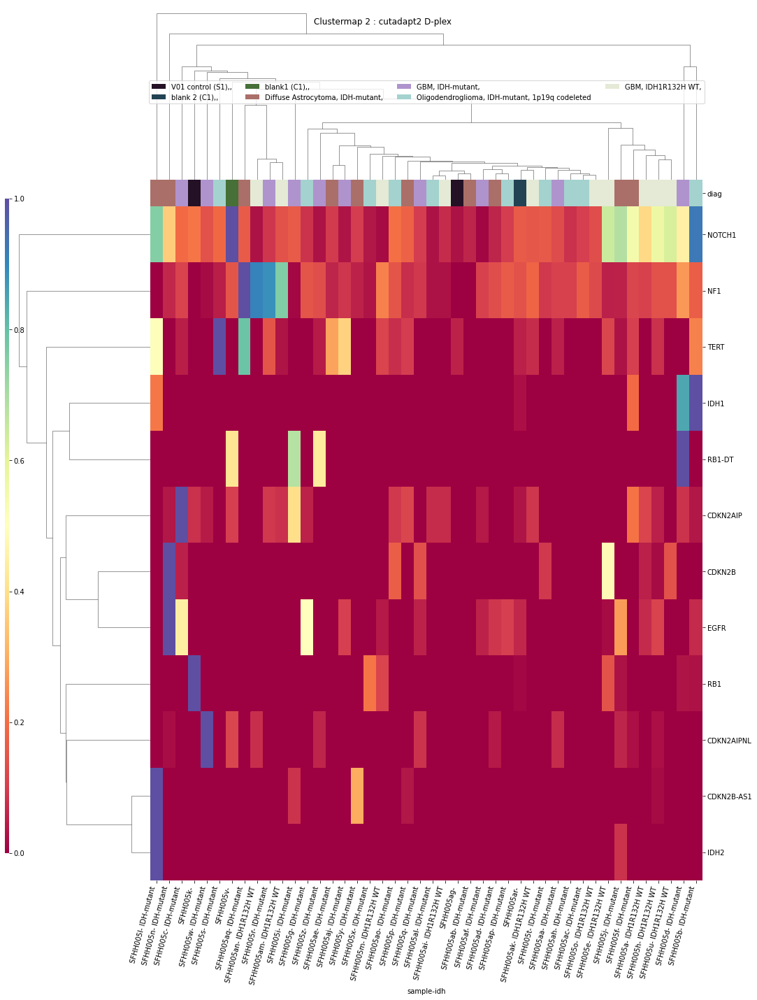

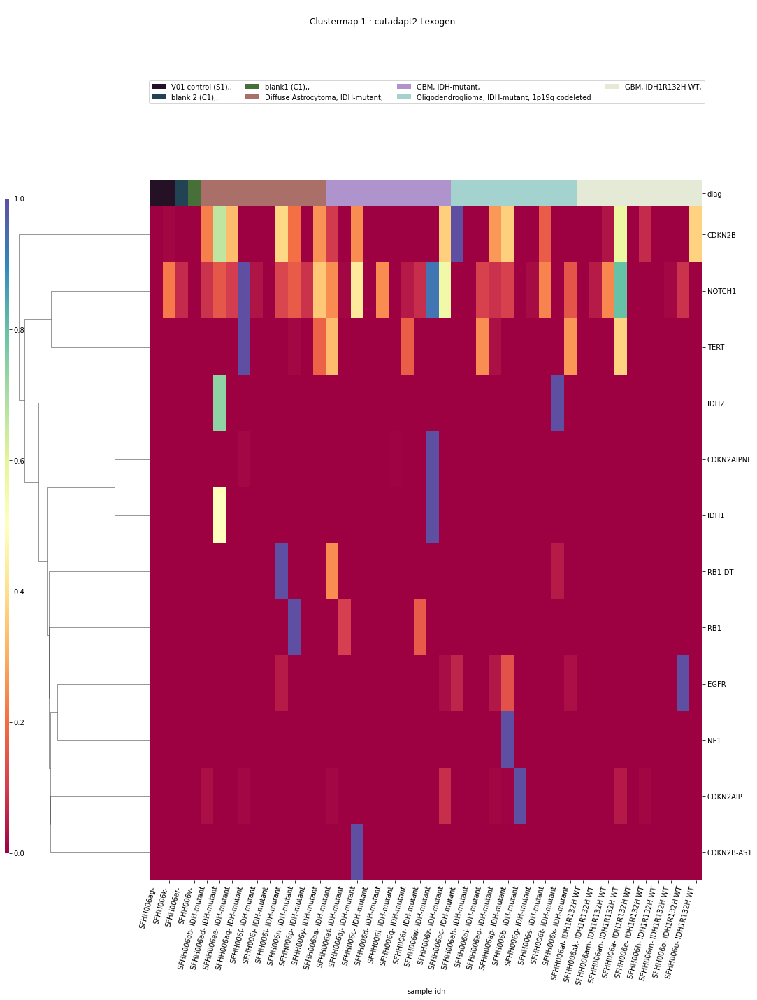

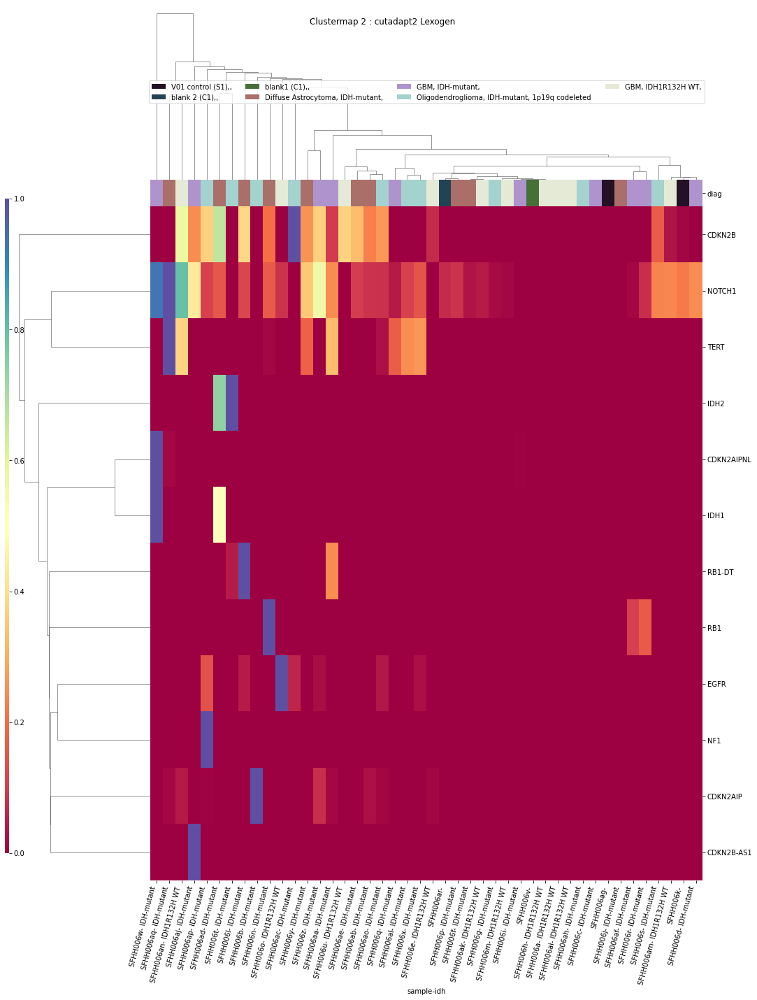

In [65]:
ttests_boxplots_and_heatmaps(dfn,['CDKN2A','CDKN2A-DT','CDKN2AIP','CDKN2AIPNL','CDKN2B','CDKN2B-AS1','EGFR',
                                  'EGFR-AS1','IDH1','IDH1-AS1','IDH2','IDH2-DT','NF1','NOTCH1','RB1','RB1CC1',
                                  'RB1-DT','TERT','TP53'],box_p=0.1,heat_p=0.2)

In [66]:
datetime.now().strftime("%H:%M:%S")

'07:45:57'

# Elements

 p : 0.00029357455816208063  ( t : 4.4736605082045395 ) :  Lexogen  :  bbduk2  :  ZNF142
Control and blanks
79     248924.19
343    839066.17
Name: ZNF142, dtype: float64
211    948646.29
Name: ZNF142, dtype: float64
475    893633.22
Name: ZNF142, dtype: float64


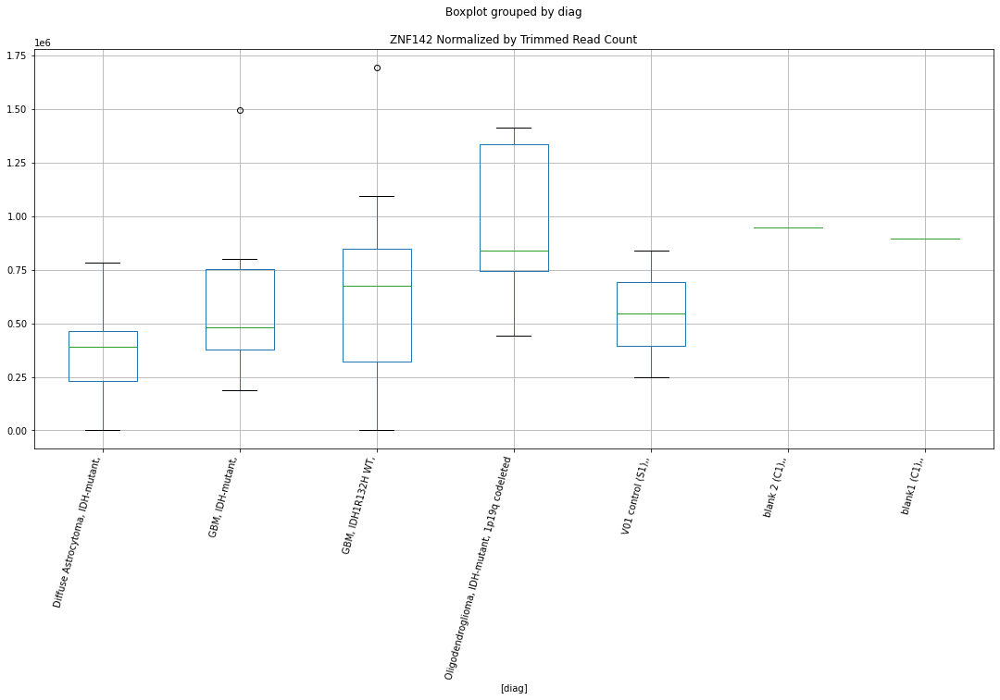

 p : 0.0003072477104855675  ( t : 4.453042674356471 ) :  Lexogen  :  cutadapt2  :  ZNF142
Control and blanks
82     247088.90
346    837108.53
Name: ZNF142, dtype: float64
214    952004.85
Name: ZNF142, dtype: float64
478    892139.04
Name: ZNF142, dtype: float64


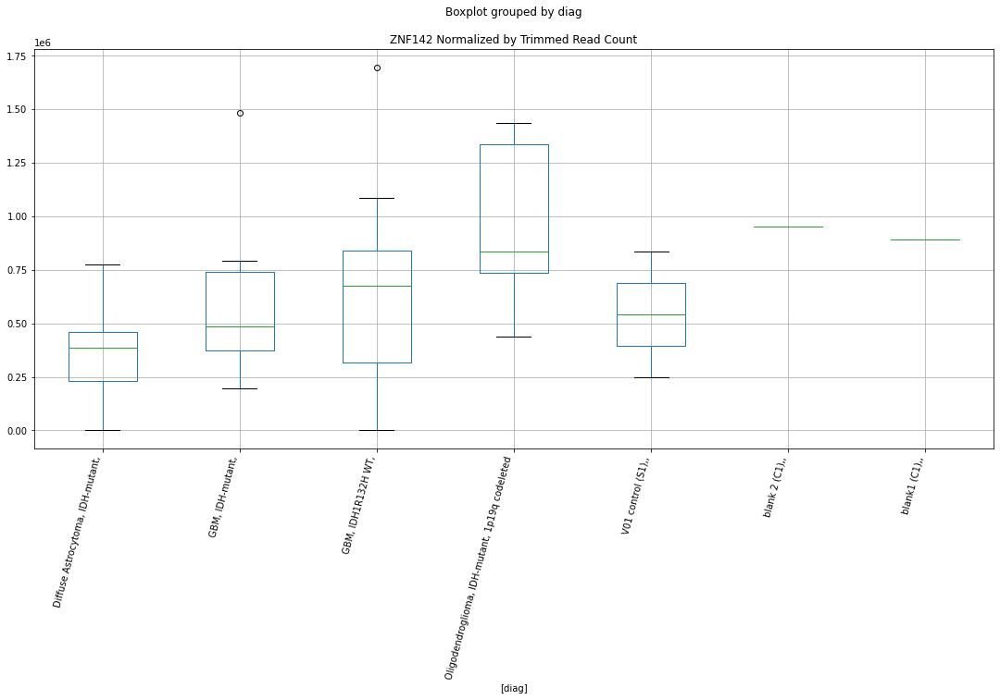

 p : 0.0004776145361679385  ( t : 4.253803152783907 ) :  D-plex  :  cutadapt2  :  PRKX
Control and blanks
76     1515.23
340       0.00
Name: PRKX, dtype: float64
208    36859.29
Name: PRKX, dtype: float64
472    0.0
Name: PRKX, dtype: float64


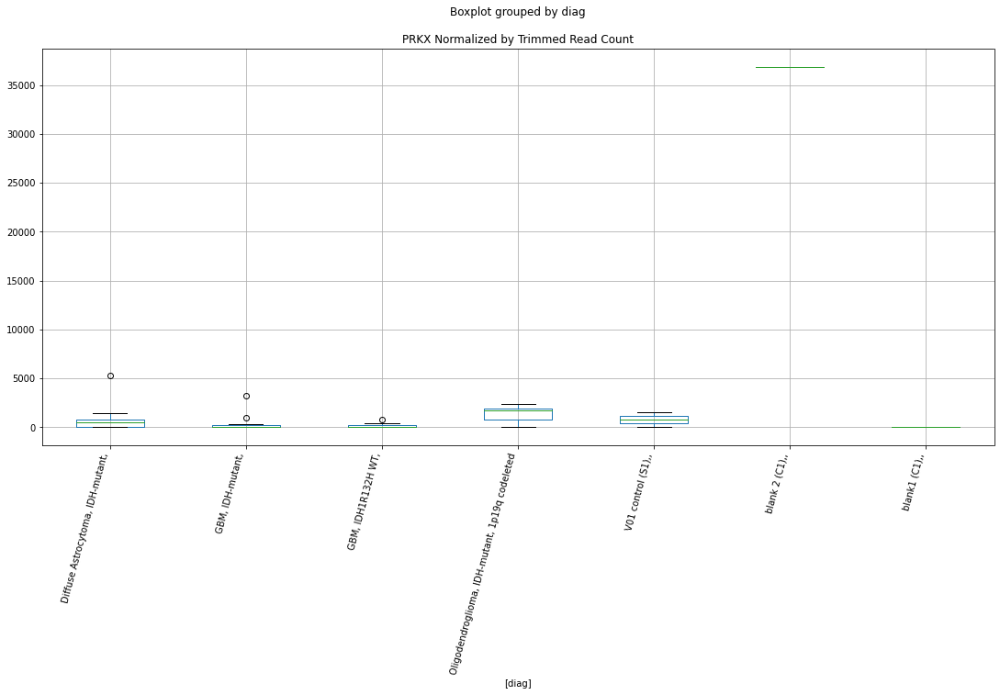

 p : 0.0006646608595179704  ( t : 4.105083834296748 ) :  D-plex  :  bbduk2  :  PRKX
Control and blanks
73     1546.02
337       0.00
Name: PRKX, dtype: float64
205    37430.01
Name: PRKX, dtype: float64
469    591.53
Name: PRKX, dtype: float64


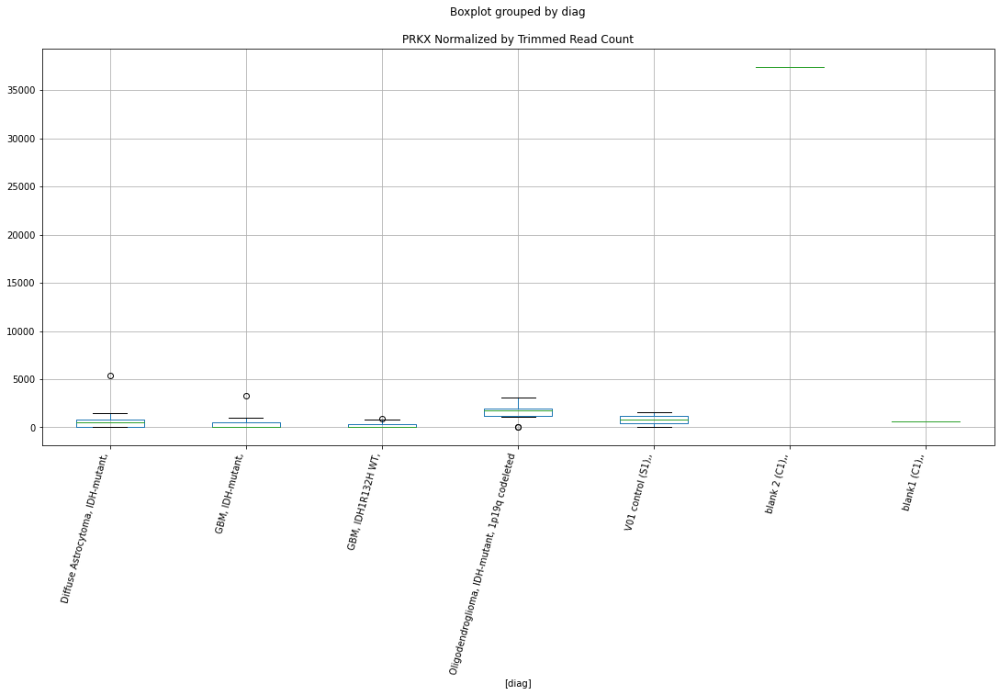

 p : 0.0007165852070366561  ( t : 4.071279640053069 ) :  Lexogen  :  bbduk2  :  MAST1
Control and blanks
79     41487.36
343    15711.26
Name: MAST1, dtype: float64
211    20224.67
Name: MAST1, dtype: float64
475    45507.99
Name: MAST1, dtype: float64


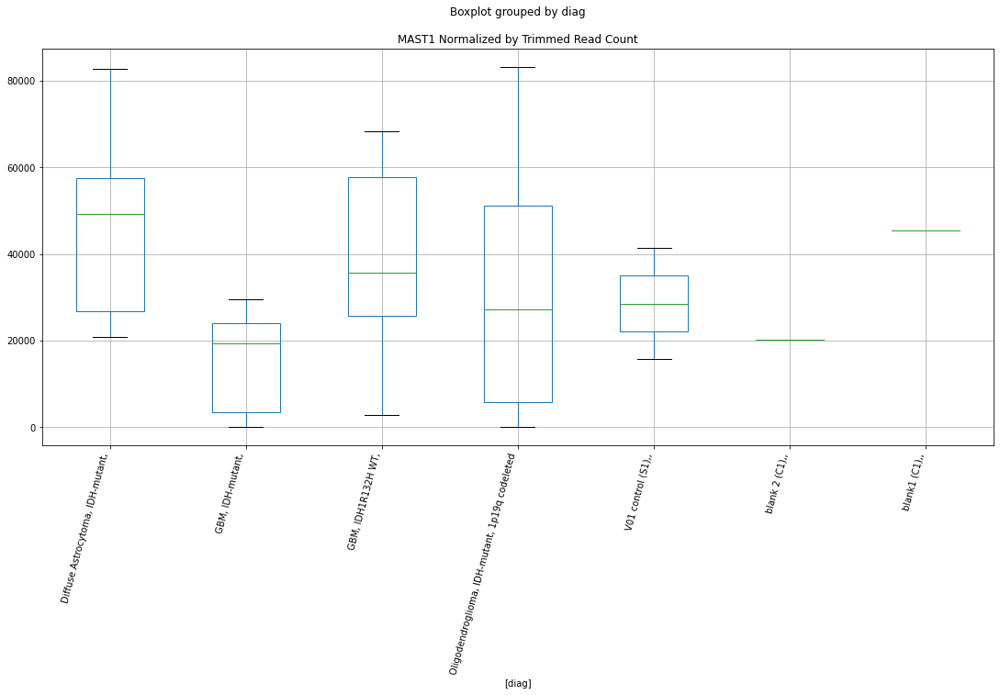

 p : 0.0007313215644939645  ( t : 4.062133913601702 ) :  D-plex  :  cutadapt2  :  TMEM97
Control and blanks
76     1515.23
340       0.00
Name: TMEM97, dtype: float64
208    352.72
Name: TMEM97, dtype: float64
472    577.96
Name: TMEM97, dtype: float64


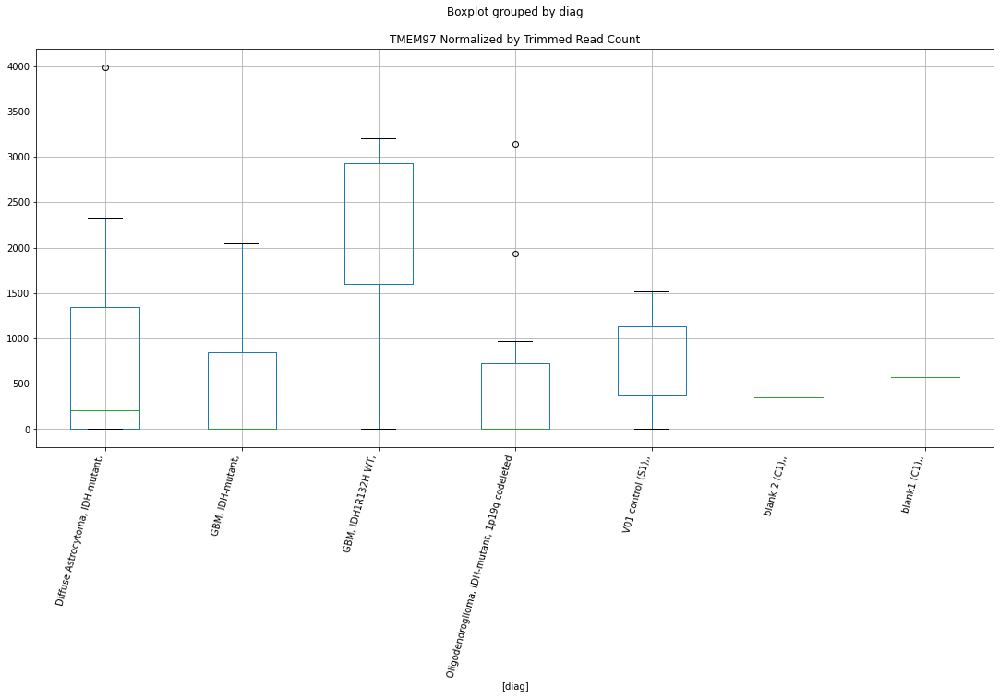

 p : 0.0007996878127283024  ( t : 4.021992549230216 ) :  Lexogen  :  cutadapt2  :  MAST1
Control and blanks
82     41181.48
346    15782.59
Name: MAST1, dtype: float64
214    20070.76
Name: MAST1, dtype: float64
478    45117.49
Name: MAST1, dtype: float64


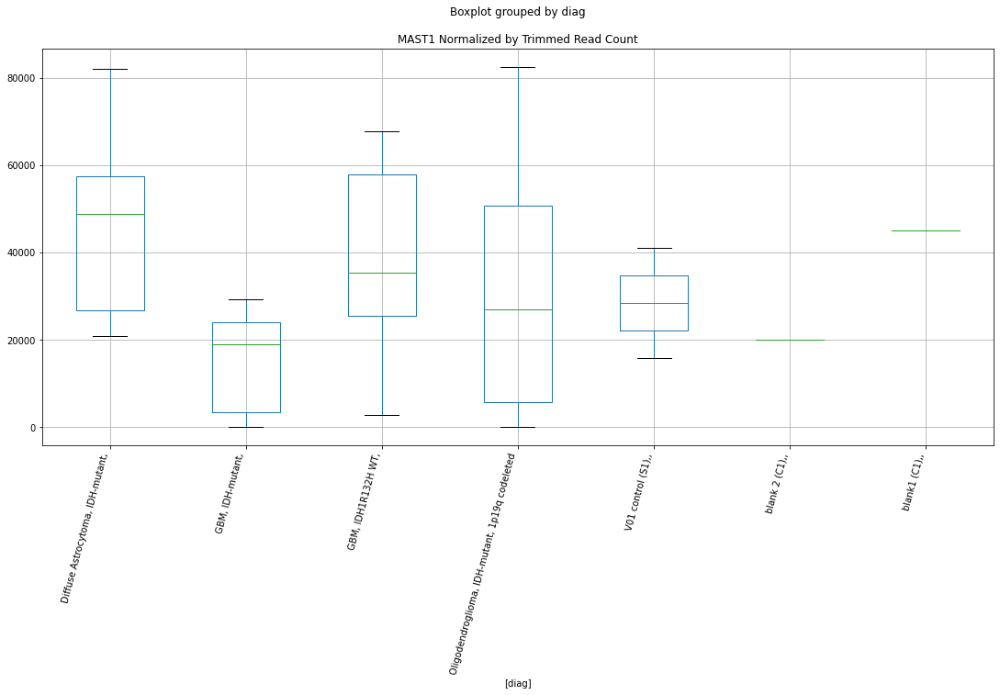

 p : 0.0009111552343303183  ( t : 3.9634054225847795 ) :  D-plex  :  bbduk2  :  LINGO2
Control and blanks
73     71116.77
337    71212.58
Name: LINGO2, dtype: float64
205    22565.46
Name: LINGO2, dtype: float64
469    41406.91
Name: LINGO2, dtype: float64


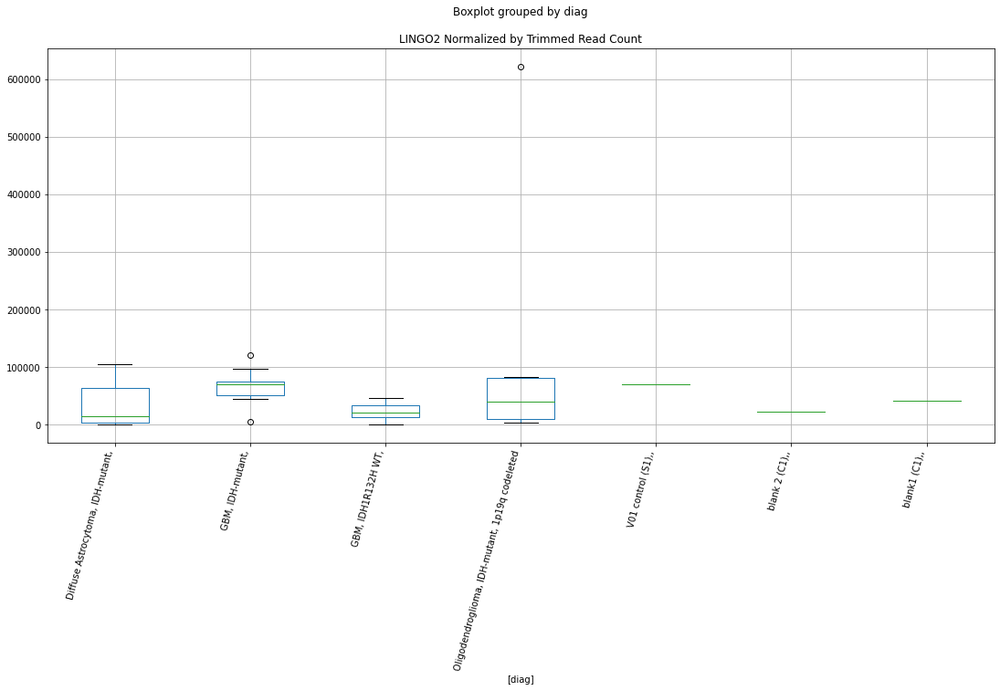

 p : 0.0009121052160676683  ( t : 3.9629376627768598 ) :  D-plex  :  cutadapt2  :  LINGO2
Control and blanks
76     67427.66
340    70458.57
Name: LINGO2, dtype: float64
208    23279.55
Name: LINGO2, dtype: float64
472    25430.06
Name: LINGO2, dtype: float64


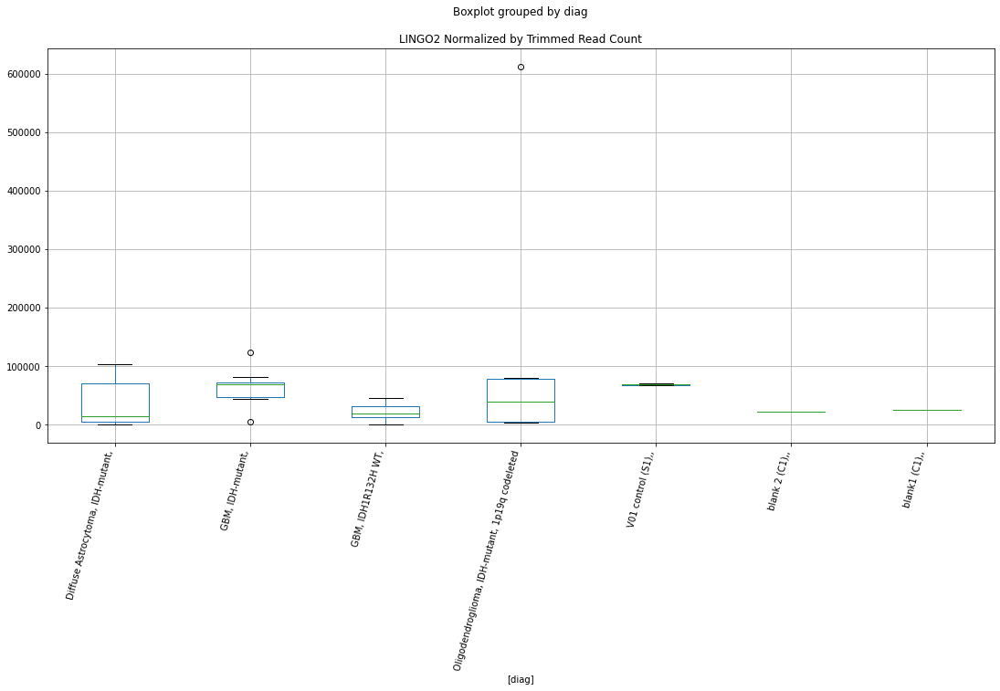

 p : 0.0010407032774559597  ( t : 3.90374153515437 ) :  D-plex  :  cutadapt2  :  SNORC
Control and blanks
76     0.0
340    0.0
Name: SNORC, dtype: float64
208    3527.2
Name: SNORC, dtype: float64
472    6357.51
Name: SNORC, dtype: float64


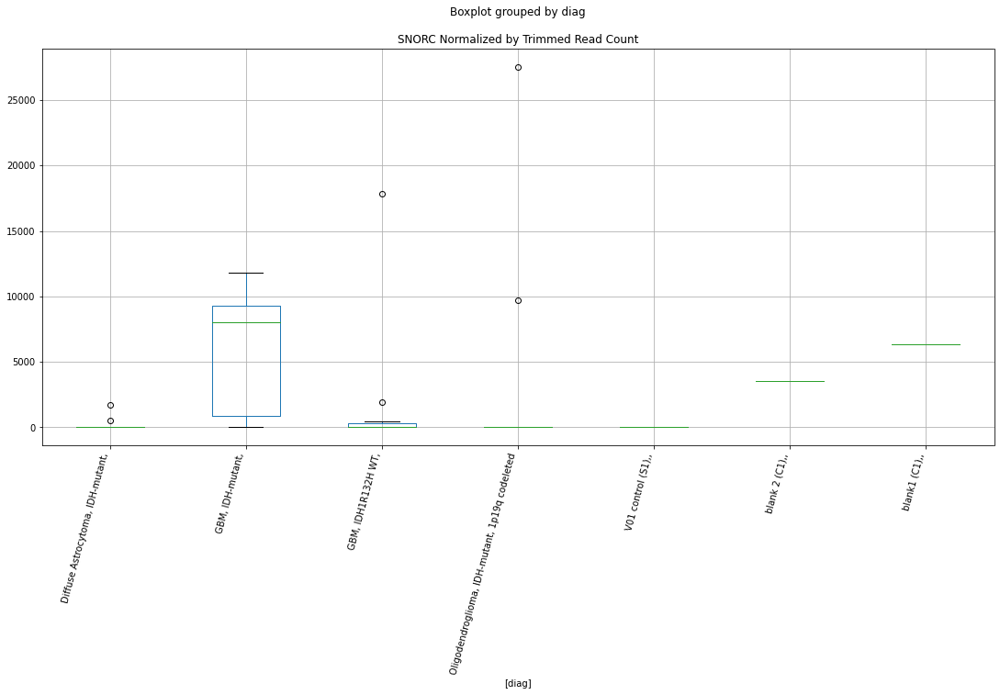

 p : 0.0011827515944232644  ( t : 3.8463283250805347 ) :  D-plex  :  bbduk2  :  TRIP6
Control and blanks
73     0.0
337    0.0
Name: TRIP6, dtype: float64
205    2149.09
Name: TRIP6, dtype: float64
469    1183.05
Name: TRIP6, dtype: float64


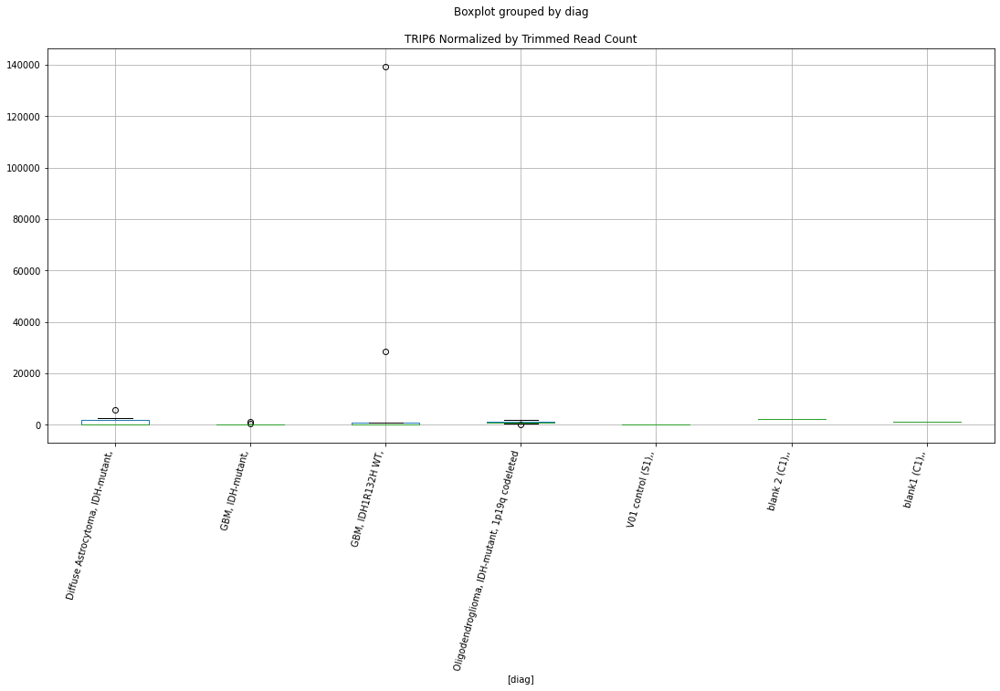

 p : 0.0013064702978653278  ( t : 3.80168671554784 ) :  D-plex  :  cutadapt2  :  COL9A2
Control and blanks
76     21213.2
340        0.0
Name: COL9A2, dtype: float64
208    5290.81
Name: COL9A2, dtype: float64
472    25430.06
Name: COL9A2, dtype: float64


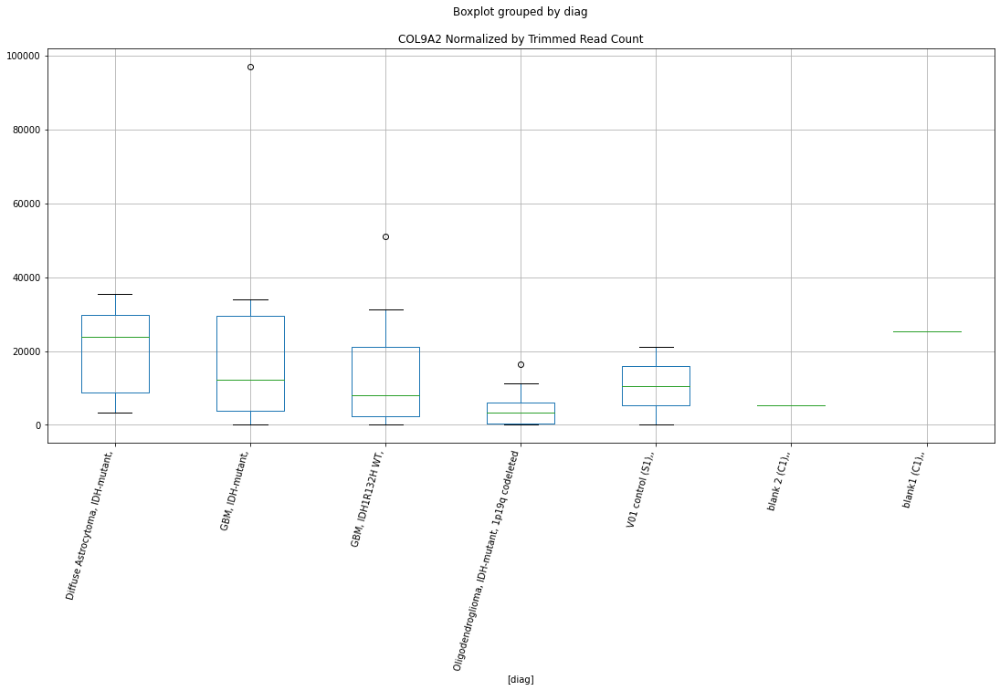

 p : 0.001418734925371321  ( t : 3.7646915604871727 ) :  D-plex  :  bbduk2  :  KIF15
Control and blanks
73     0.0
337    0.0
Name: KIF15, dtype: float64
205    3581.82
Name: KIF15, dtype: float64
469    21294.98
Name: KIF15, dtype: float64


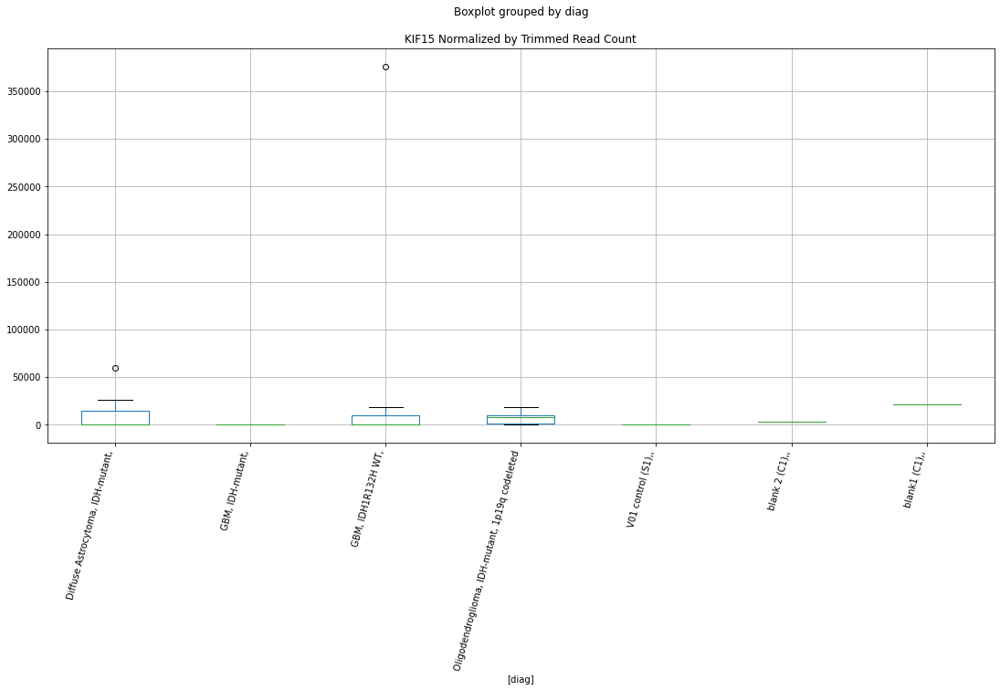

 p : 0.0014313517330719848  ( t : 3.7607179343481807 ) :  Lexogen  :  cutadapt2  :  CAMTA1
Control and blanks
82          0.00
346    235476.23
Name: CAMTA1, dtype: float64
214    0.0
Name: CAMTA1, dtype: float64
478    0.0
Name: CAMTA1, dtype: float64


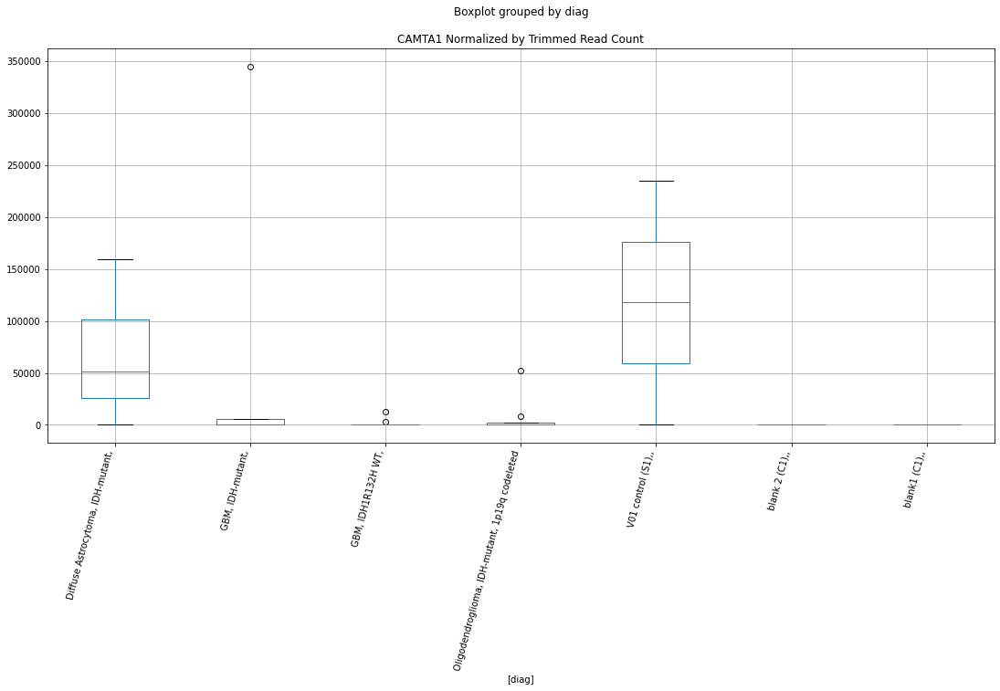

 p : 0.0014532292831060134  ( t : 3.7539097847605514 ) :  D-plex  :  cutadapt2  :  KIF15
Control and blanks
76     0.0
340    0.0
Name: KIF15, dtype: float64
208    3527.2
Name: KIF15, dtype: float64
472    20806.41
Name: KIF15, dtype: float64


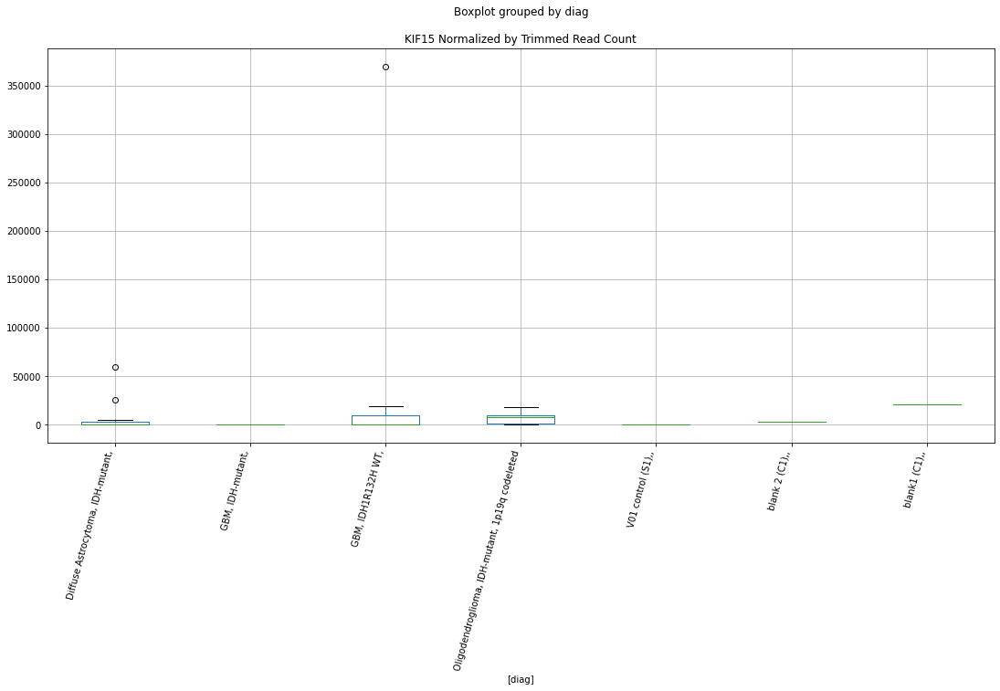

 p : 0.0014572782737351003  ( t : 3.752660985664604 ) :  D-plex  :  cutadapt2  :  ZNF507
Control and blanks
76         0.00
340    17614.64
Name: ZNF507, dtype: float64
208    2116.32
Name: ZNF507, dtype: float64
472    0.0
Name: ZNF507, dtype: float64


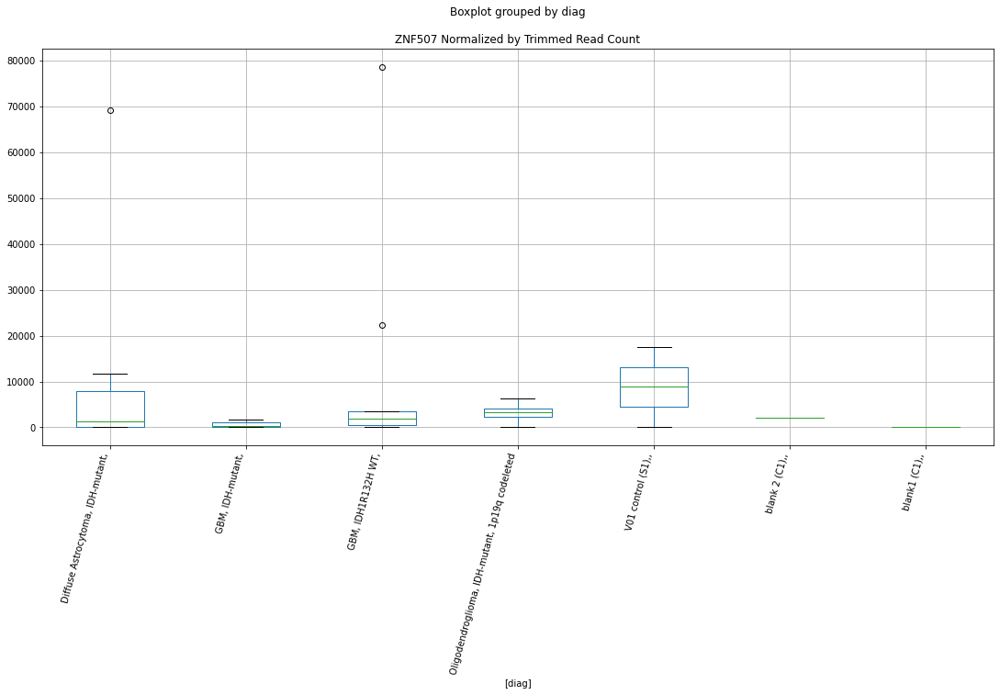

 p : 0.0015045464552558712  ( t : 3.7383331553947996 ) :  Lexogen  :  bbduk2  :  CAMTA1
Control and blanks
79          0.00
343    237579.72
Name: CAMTA1, dtype: float64
211    0.0
Name: CAMTA1, dtype: float64
475    0.0
Name: CAMTA1, dtype: float64


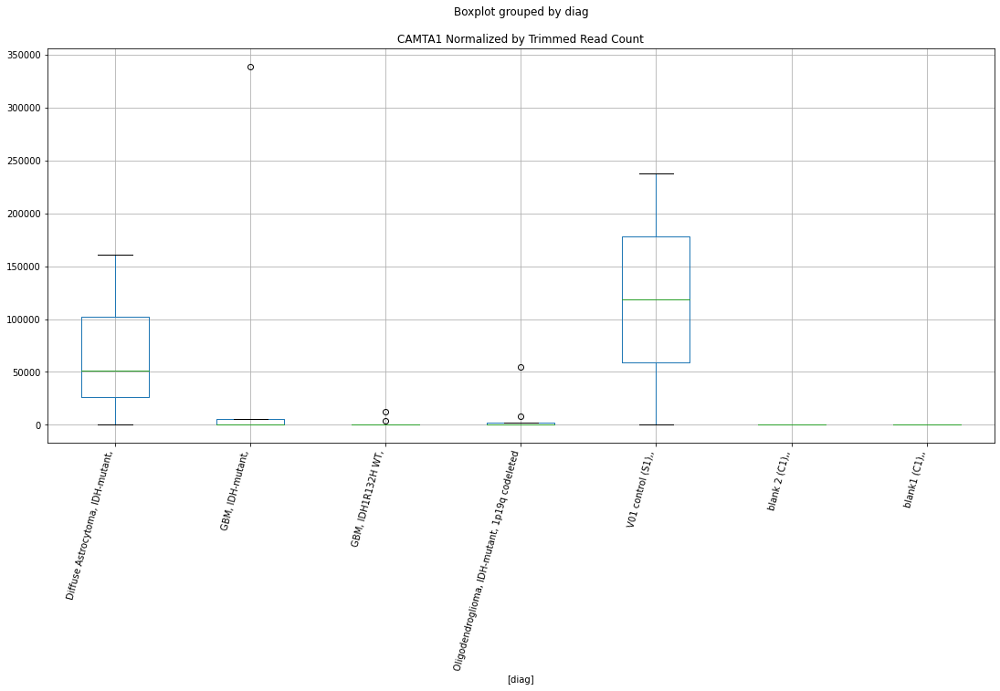

 p : 0.0015326762262049772  ( t : 3.730018063107694 ) :  D-plex  :  cutadapt2  :  ZNF800
Control and blanks
76     152280.46
340     11449.52
Name: ZNF800, dtype: float64
208    56964.35
Name: ZNF800, dtype: float64
472    43924.64
Name: ZNF800, dtype: float64


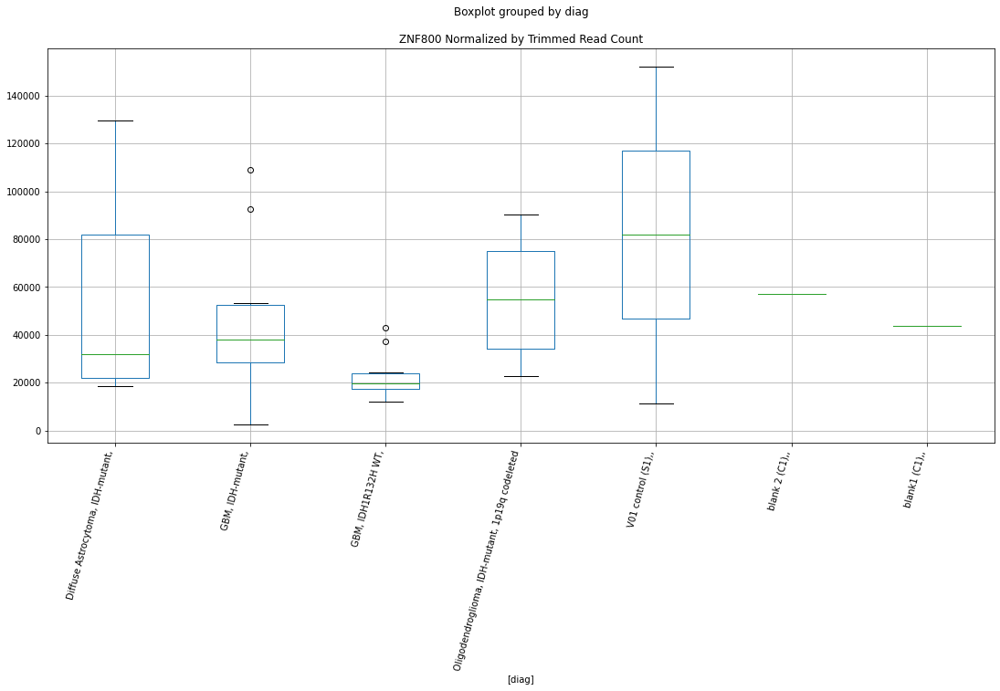

 p : 0.0015746854577744441  ( t : 3.7178792651816637 ) :  D-plex  :  bbduk2  :  CMC1
Control and blanks
73         0.00
337    48068.49
Name: CMC1, dtype: float64
205    3044.55
Name: CMC1, dtype: float64
469    5915.27
Name: CMC1, dtype: float64


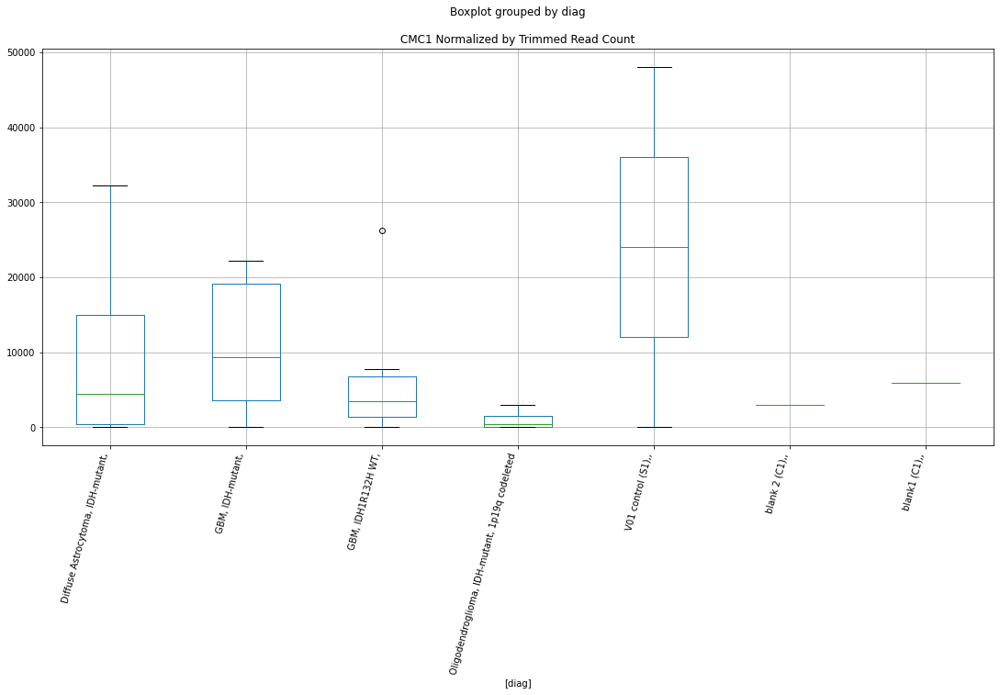

 p : 0.0016741707399748498  ( t : 3.6903731457809887 ) :  D-plex  :  bbduk2  :  FBXO28
Control and blanks
73     2319.03
337       0.00
Name: FBXO28, dtype: float64
205    3223.64
Name: FBXO28, dtype: float64
469    7098.33
Name: FBXO28, dtype: float64


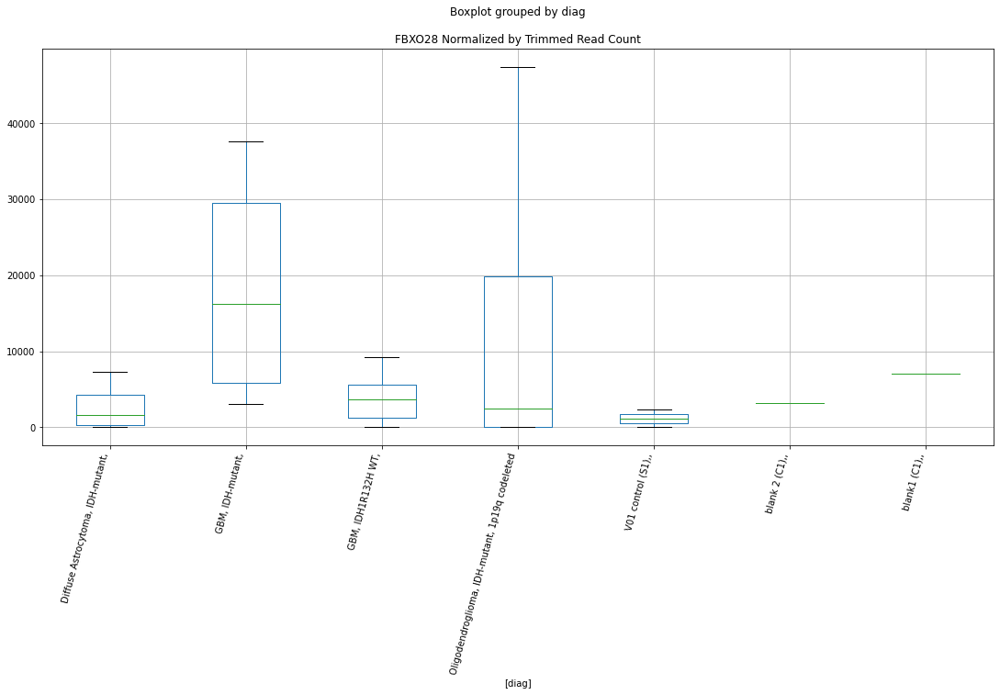

 p : 0.0017191900446345122  ( t : 3.678456967241574 ) :  D-plex  :  cutadapt2  :  FBXO28
Control and blanks
76     2272.84
340       0.00
Name: FBXO28, dtype: float64
208    2645.4
Name: FBXO28, dtype: float64
472    6935.47
Name: FBXO28, dtype: float64


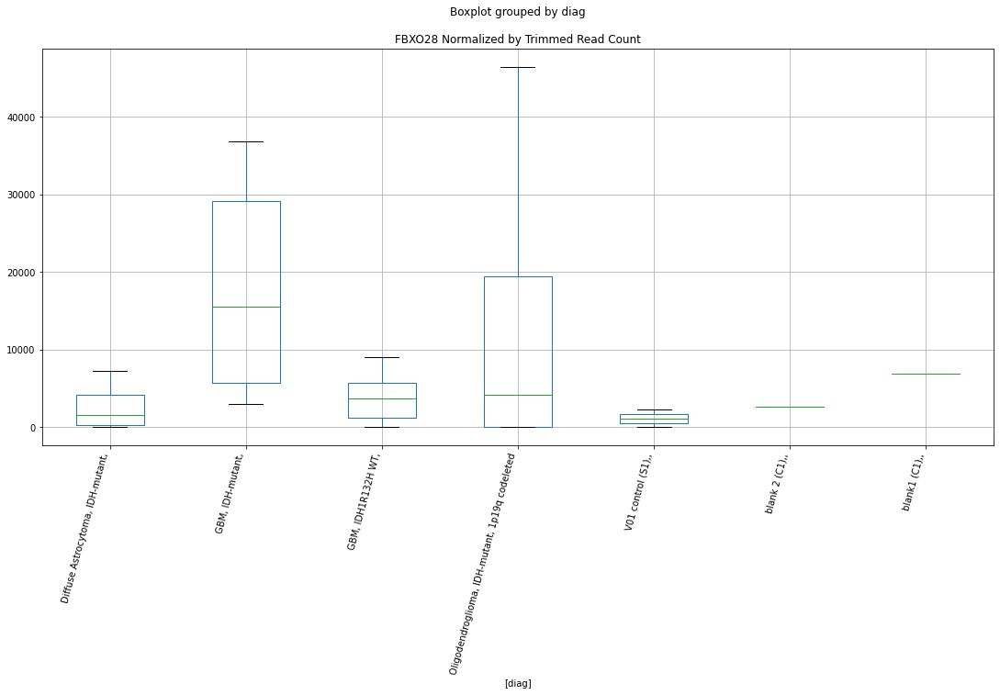

 p : 0.0017359321410301363  ( t : 3.6741045769108505 ) :  D-plex  :  bbduk2  :  MED12
Control and blanks
73     15460.17
337        0.00
Name: MED12, dtype: float64
205    895.45
Name: MED12, dtype: float64
469    1774.58
Name: MED12, dtype: float64


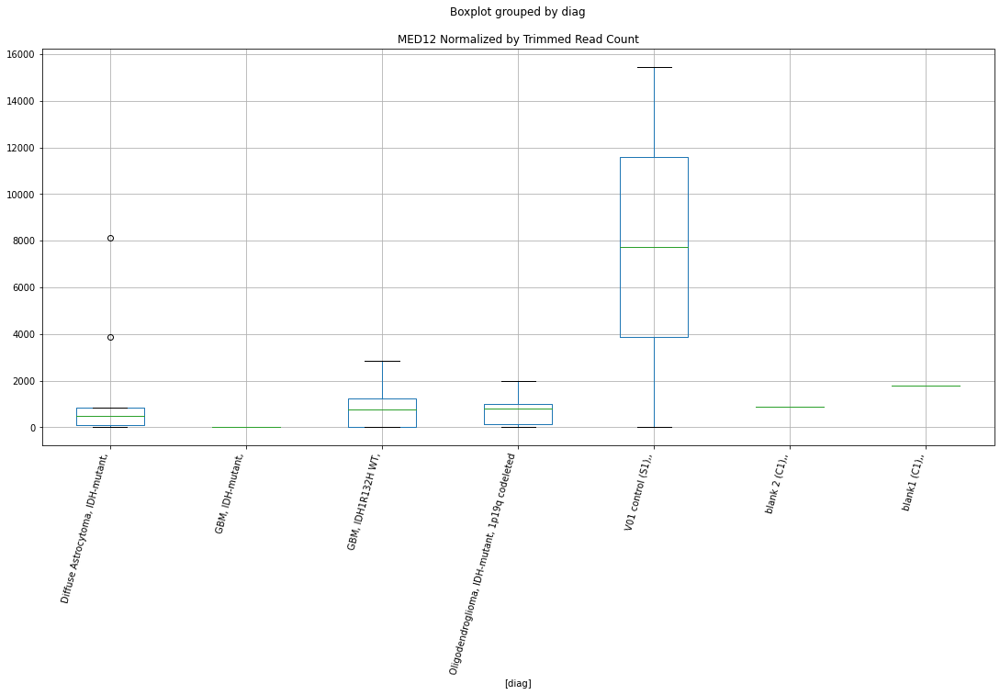

 p : 0.0018115740595171334  ( t : 3.6549471167934255 ) :  D-plex  :  bbduk2  :  EVC
Control and blanks
73     3092.03
337       0.00
Name: EVC, dtype: float64
205    19341.82
Name: EVC, dtype: float64
469    15971.24
Name: EVC, dtype: float64


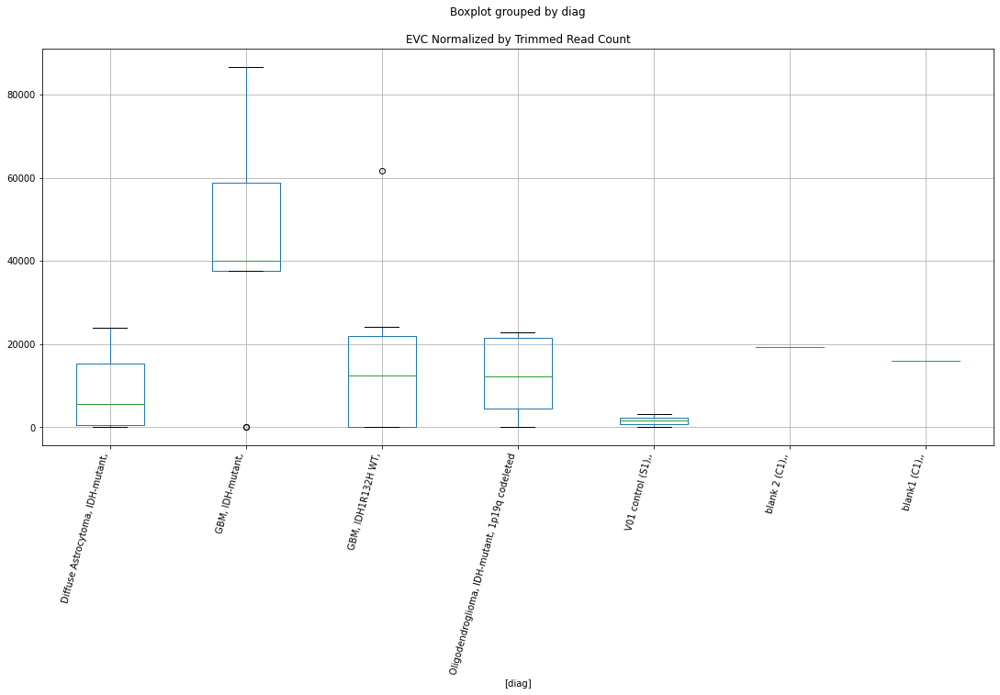

 p : 0.0019480480941637646  ( t : 3.6223136382527366 ) :  Lexogen  :  cutadapt2  :  HTATSF1P2
Control and blanks
82       0.00
346    420.87
Name: HTATSF1P2, dtype: float64
214    0.0
Name: HTATSF1P2, dtype: float64
478    0.0
Name: HTATSF1P2, dtype: float64


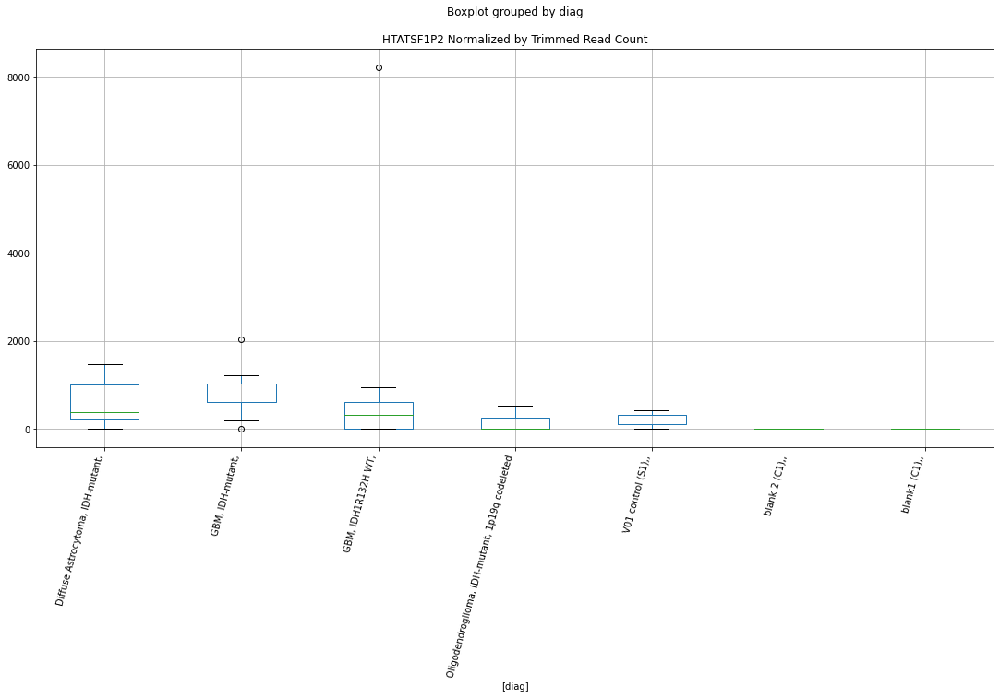

 p : 0.0024147729851546076  ( t : 3.5257196593540203 ) :  D-plex  :  cutadapt2  :  IL11
Control and blanks
76     0.0
340    0.0
Name: IL11, dtype: float64
208    1058.16
Name: IL11, dtype: float64
472    2311.82
Name: IL11, dtype: float64


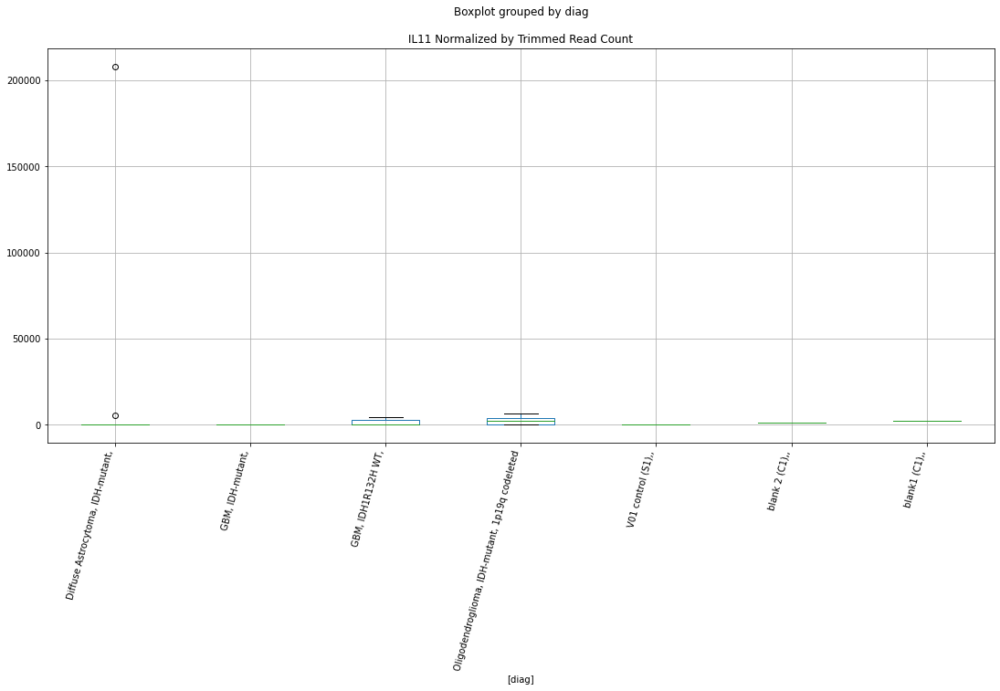

 p : 0.00244784940335801  ( t : 3.5195954326151906 ) :  D-plex  :  cutadapt2  :  CYFIP2
Control and blanks
76     0.0
340    0.0
Name: CYFIP2, dtype: float64
208    7583.49
Name: CYFIP2, dtype: float64
472    6935.47
Name: CYFIP2, dtype: float64


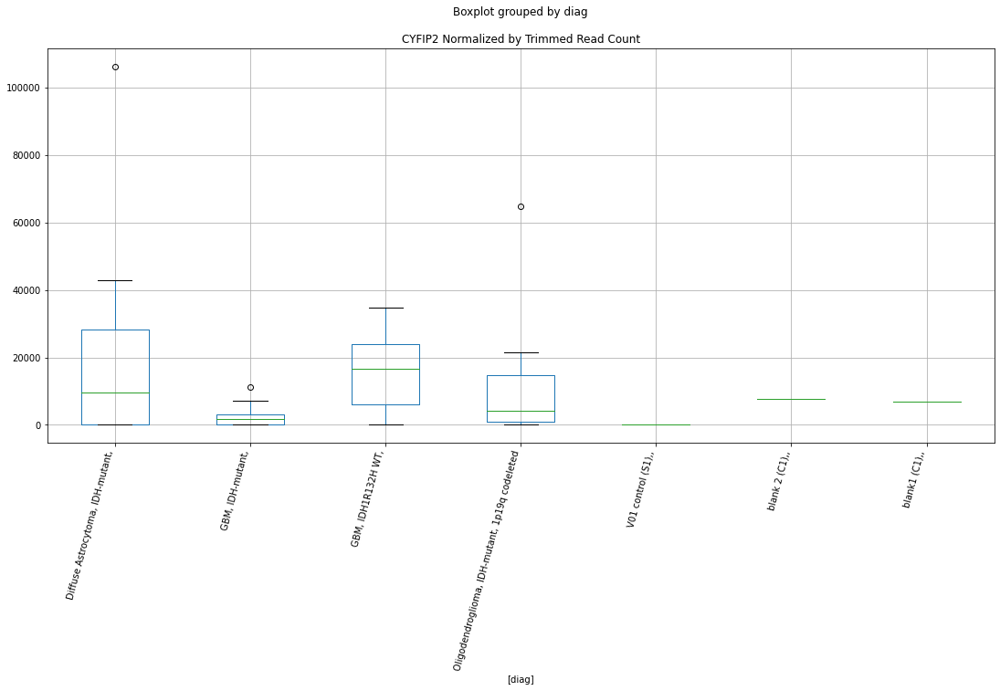

 p : 0.002492909908412313  ( t : 3.51138293117185 ) :  Lexogen  :  bbduk2  :  LOC101929679
Control and blanks
79     0.0
343    0.0
Name: LOC101929679, dtype: float64
211    0.0
Name: LOC101929679, dtype: float64
475    0.0
Name: LOC101929679, dtype: float64


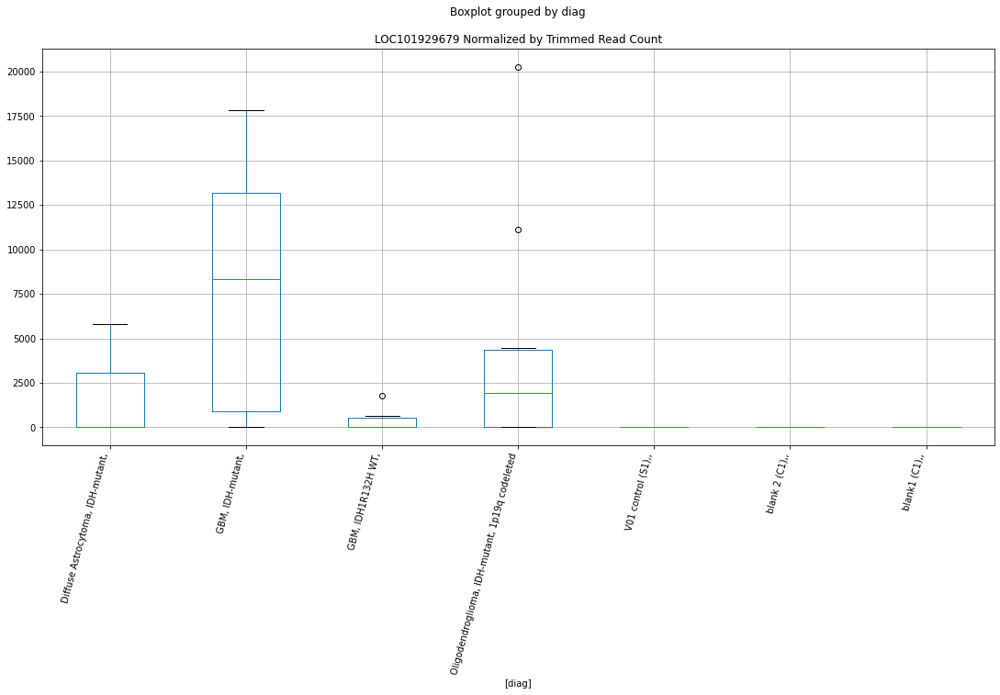

 p : 0.0024953889087938313  ( t : 3.5109353984536606 ) :  D-plex  :  bbduk2  :  RAB11FIP1
Control and blanks
73     0.0
337    0.0
Name: RAB11FIP1, dtype: float64
205    71099.11
Name: RAB11FIP1, dtype: float64
469    3549.16
Name: RAB11FIP1, dtype: float64


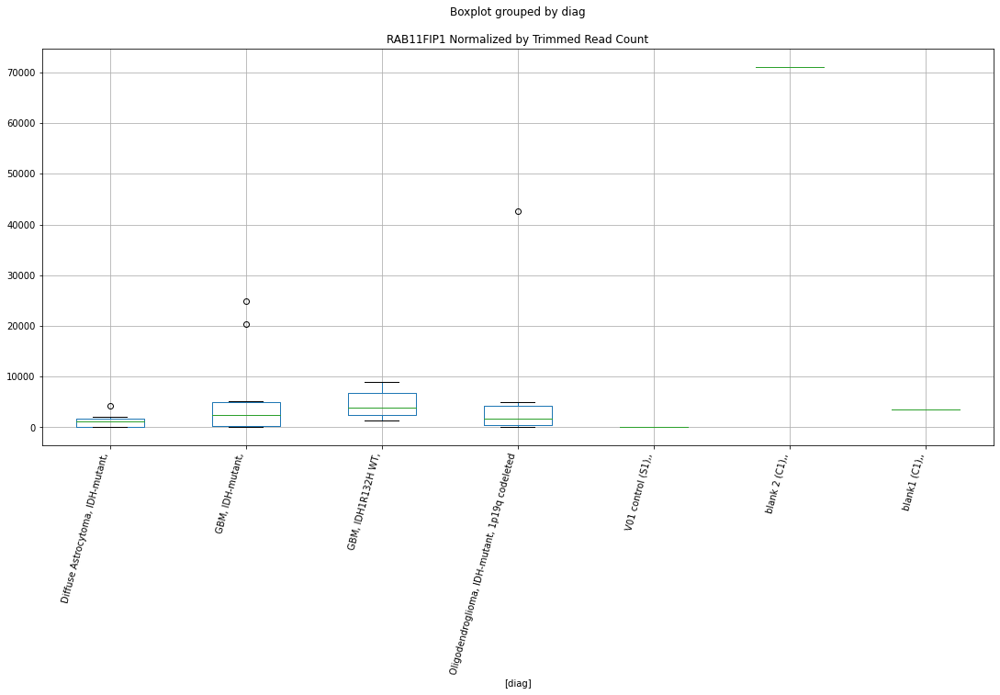

 p : 0.0024954677194864564  ( t : 3.510921178021227 ) :  D-plex  :  bbduk2  :  CYFIP2
Control and blanks
73     0.0
337    0.0
Name: CYFIP2, dtype: float64
205    6268.18
Name: CYFIP2, dtype: float64
469    7098.33
Name: CYFIP2, dtype: float64


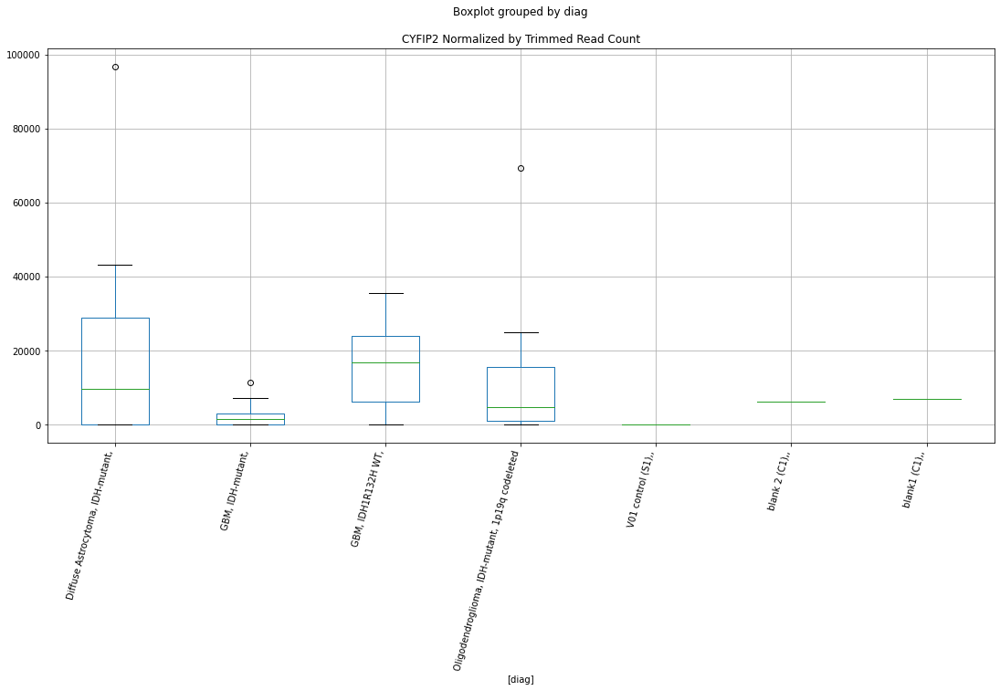

 p : 0.002496618359986424  ( t : 3.5107136095555056 ) :  D-plex  :  cutadapt2  :  CMC1
Control and blanks
76         0.0
340    49321.0
Name: CMC1, dtype: float64
208    2645.4
Name: CMC1, dtype: float64
472    5779.56
Name: CMC1, dtype: float64


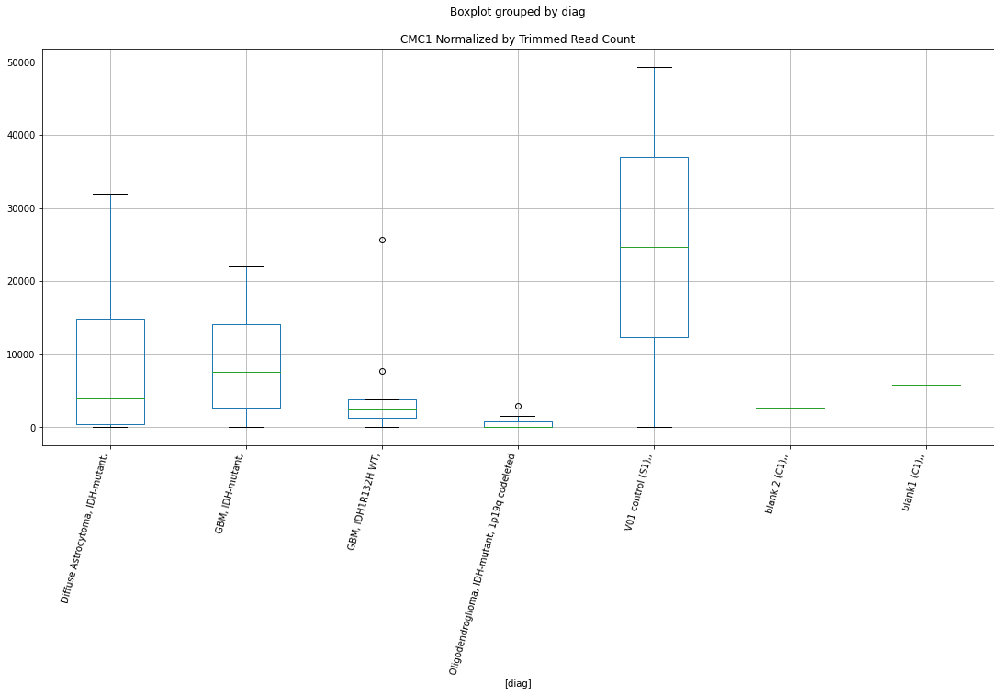

 p : 0.002600870724070525  ( t : 3.492289703663537 ) :  Lexogen  :  cutadapt2  :  IGDCC4
Control and blanks
82     0.0
346    0.0
Name: IGDCC4, dtype: float64
214    0.0
Name: IGDCC4, dtype: float64
478    0.0
Name: IGDCC4, dtype: float64


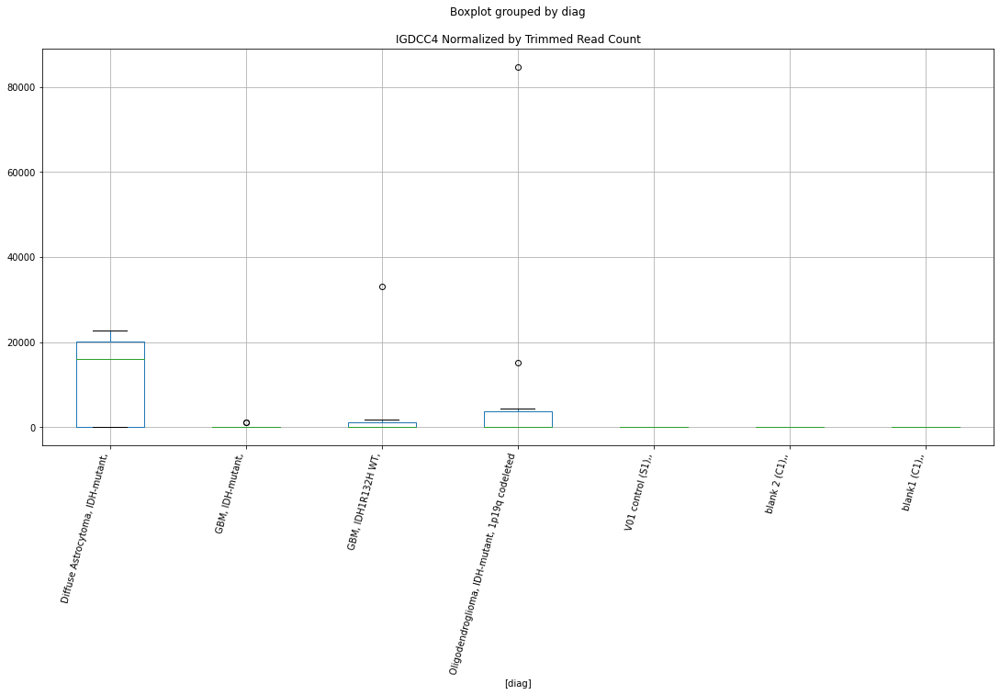

 p : 0.0026308351632711264  ( t : 3.48712942592403 ) :  Lexogen  :  cutadapt2  :  LOC101929679
Control and blanks
82     0.0
346    0.0
Name: LOC101929679, dtype: float64
214    0.0
Name: LOC101929679, dtype: float64
478    0.0
Name: LOC101929679, dtype: float64


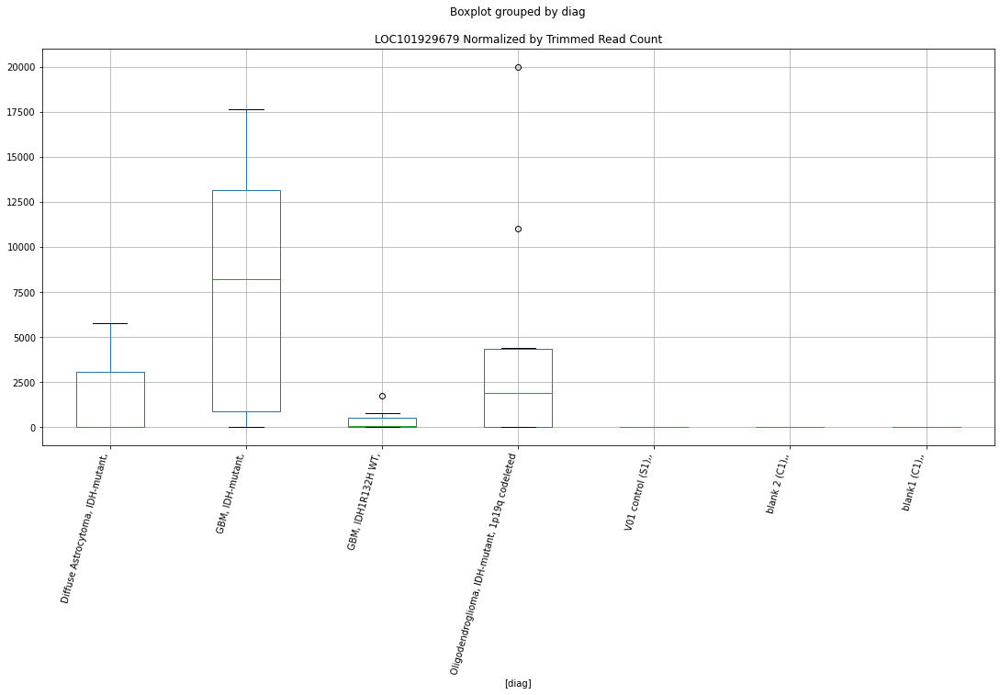

 p : 0.002681129303978816  ( t : 3.4785974598820304 ) :  D-plex  :  cutadapt2  :  RBM6
Control and blanks
76     757.61
340      0.00
Name: RBM6, dtype: float64
208    38093.81
Name: RBM6, dtype: float64
472    17916.63
Name: RBM6, dtype: float64


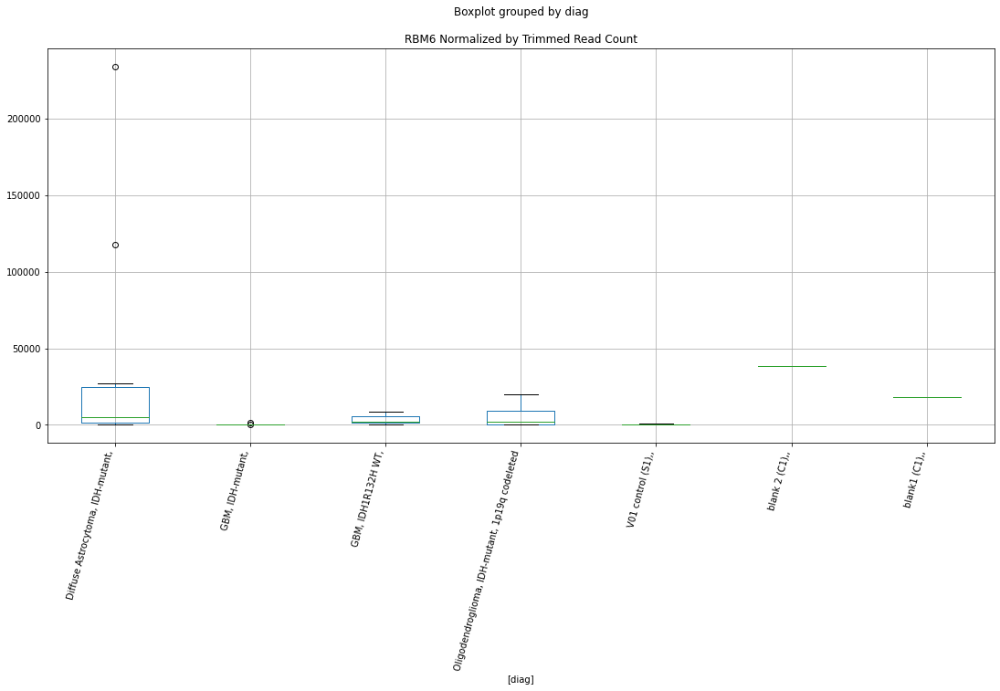

 p : 0.00269800505884393  ( t : 3.4757700818710298 ) :  D-plex  :  bbduk2  :  SNORC
Control and blanks
73     0.0
337    0.0
Name: SNORC, dtype: float64
205    3581.82
Name: SNORC, dtype: float64
469    6506.8
Name: SNORC, dtype: float64


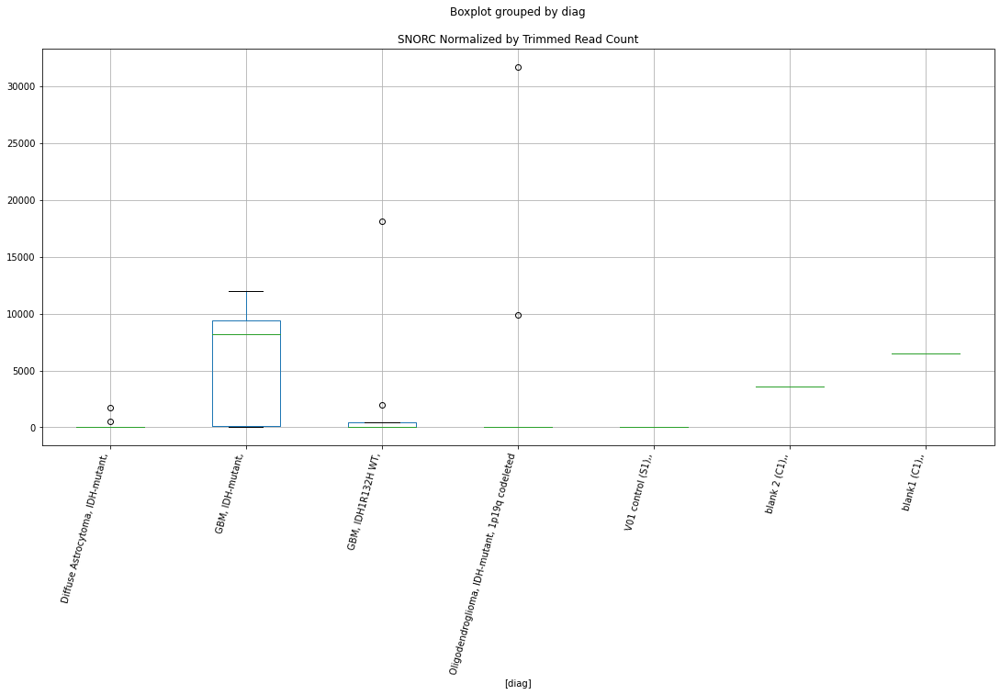

 p : 0.0027019887962629052  ( t : 3.4751051959793204 ) :  Lexogen  :  cutadapt2  :  MIR122
Control and blanks
82     0.0
346    0.0
Name: MIR122, dtype: float64
214    0.0
Name: MIR122, dtype: float64
478    0.0
Name: MIR122, dtype: float64


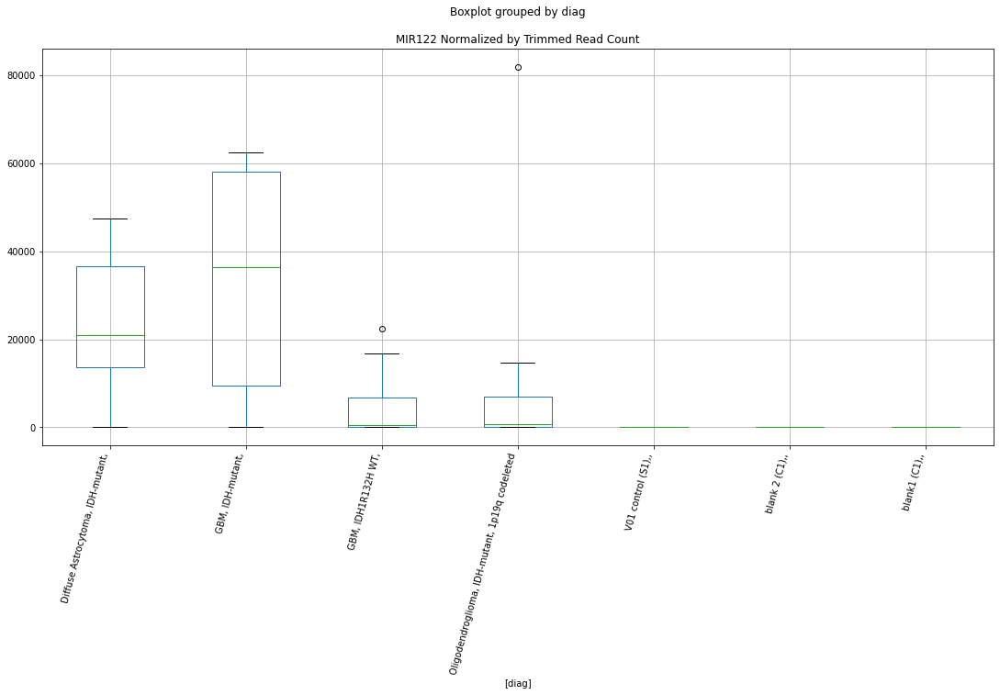

 p : 0.0027019887962629052  ( t : 3.4751051959793204 ) :  Lexogen  :  cutadapt2  :  MIR3591
Control and blanks
82     0.0
346    0.0
Name: MIR3591, dtype: float64
214    0.0
Name: MIR3591, dtype: float64
478    0.0
Name: MIR3591, dtype: float64


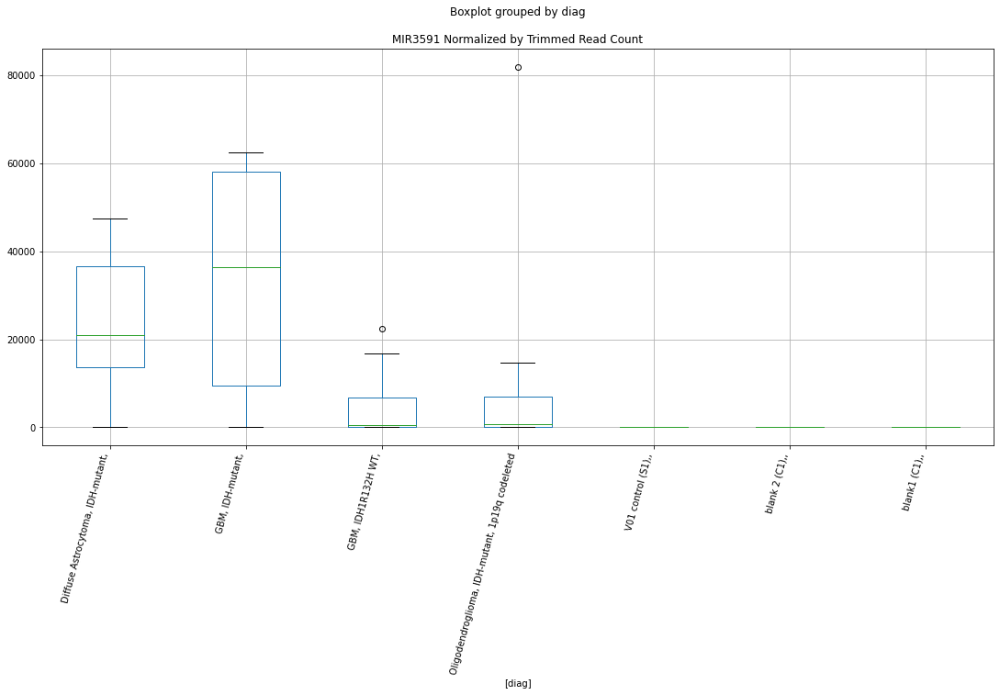

 p : 0.0028020332641484273  ( t : 3.4587181821440245 ) :  Lexogen  :  bbduk2  :  MIR3591
Control and blanks
79     0.0
343    0.0
Name: MIR3591, dtype: float64
211    0.0
Name: MIR3591, dtype: float64
475    0.0
Name: MIR3591, dtype: float64


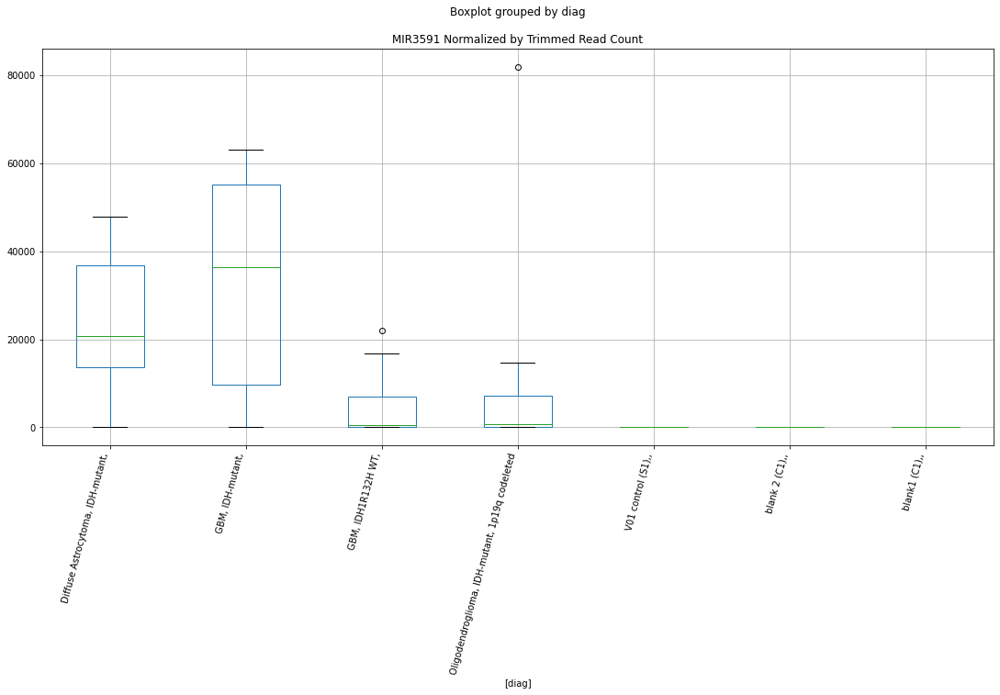

 p : 0.0028020332641484273  ( t : 3.4587181821440245 ) :  Lexogen  :  bbduk2  :  MIR122
Control and blanks
79     0.0
343    0.0
Name: MIR122, dtype: float64
211    0.0
Name: MIR122, dtype: float64
475    0.0
Name: MIR122, dtype: float64


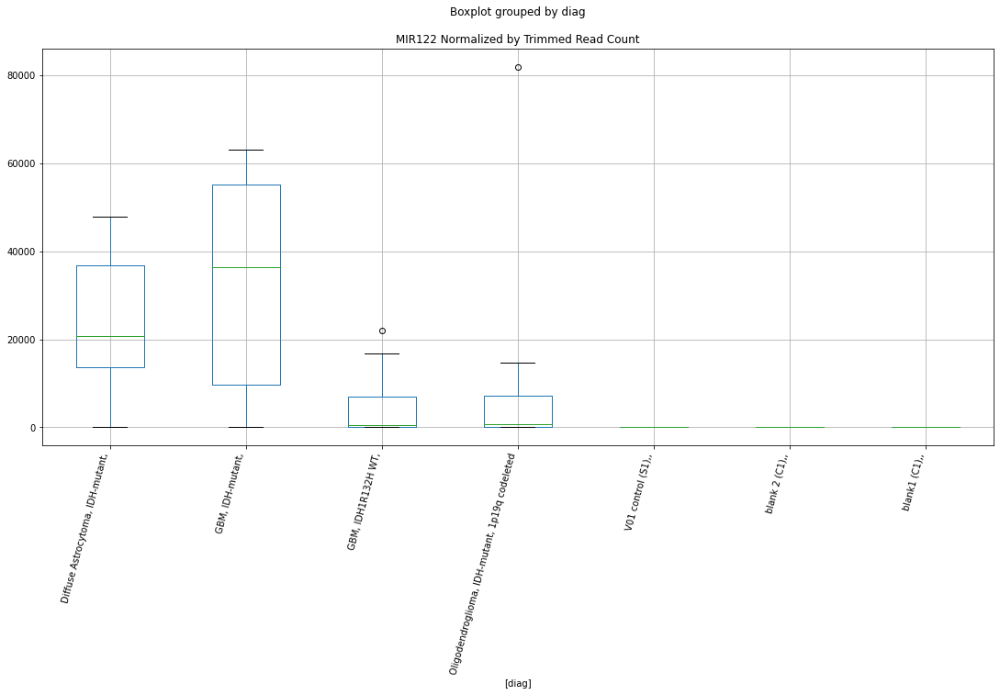

 p : 0.002986653025076685  ( t : 3.4299420533004716 ) :  D-plex  :  cutadapt2  :  SLITRK2
Control and blanks
76     0.0
340    0.0
Name: SLITRK2, dtype: float64
208    6348.97
Name: SLITRK2, dtype: float64
472    6935.47
Name: SLITRK2, dtype: float64


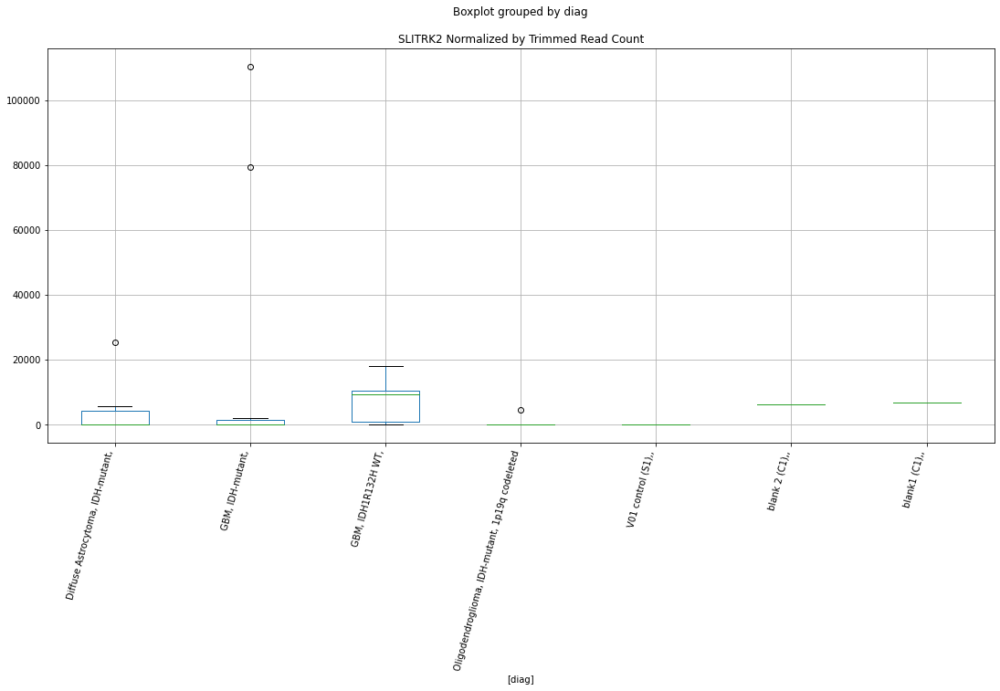

 p : 0.0030363021998289883  ( t : 3.422503167244863 ) :  D-plex  :  bbduk2  :  FBXO28
Control and blanks
73     2319.03
337       0.00
Name: FBXO28, dtype: float64
205    3223.64
Name: FBXO28, dtype: float64
469    7098.33
Name: FBXO28, dtype: float64


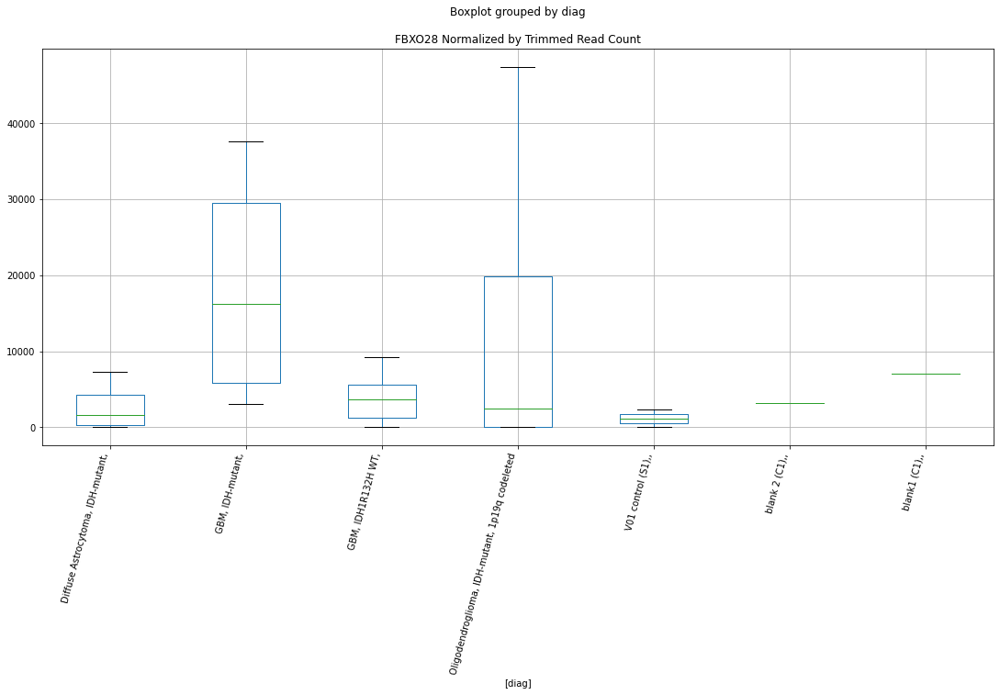

 p : 0.0030525726352265622  ( t : 3.420091498546384 ) :  D-plex  :  bbduk2  :  TLE6
Control and blanks
73     0.0
337    0.0
Name: TLE6, dtype: float64
205    7521.82
Name: TLE6, dtype: float64
469    5323.75
Name: TLE6, dtype: float64


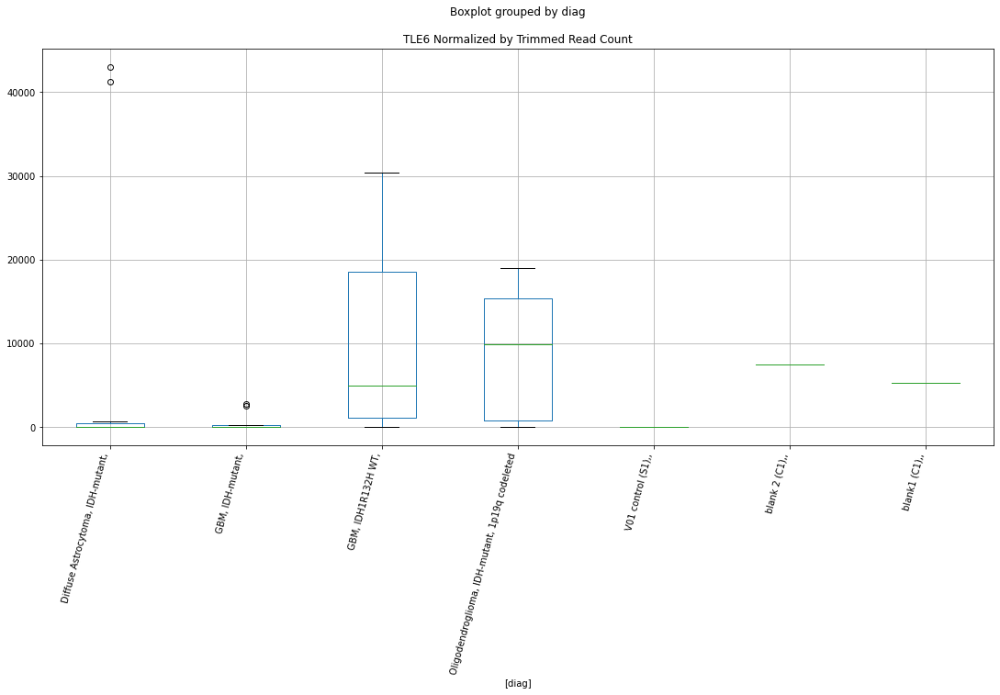

 p : 0.00313073540492772  ( t : 3.4086800497435408 ) :  Lexogen  :  bbduk2  :  IGDCC4
Control and blanks
79     0.0
343    0.0
Name: IGDCC4, dtype: float64
211    0.0
Name: IGDCC4, dtype: float64
475    0.0
Name: IGDCC4, dtype: float64


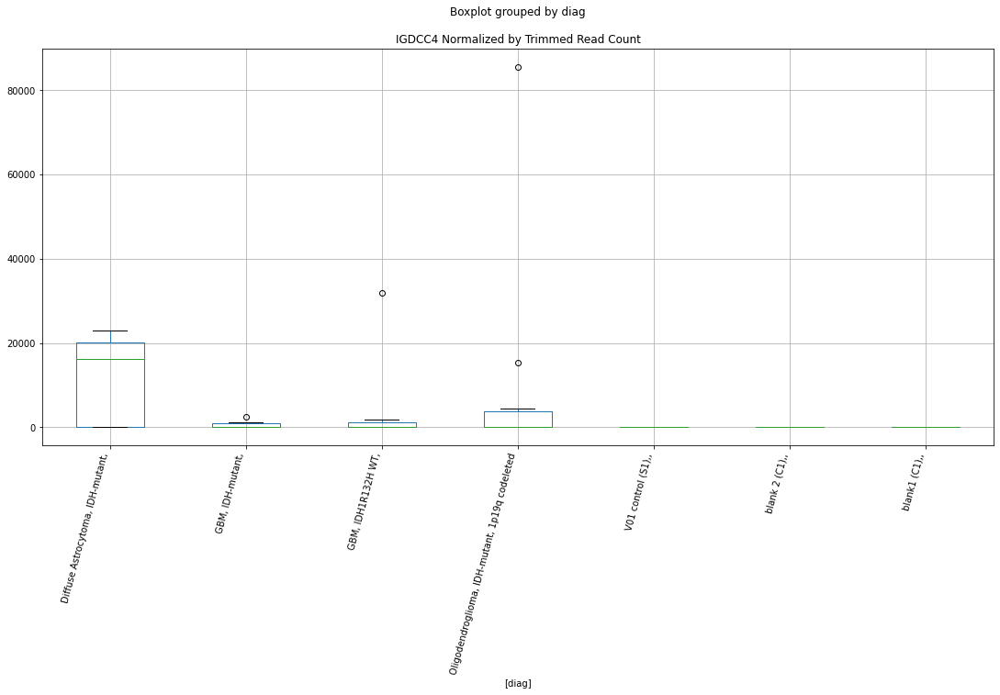

 p : 0.0031776617225312957  ( t : 3.401963343229951 ) :  Lexogen  :  bbduk2  :  RAB25
Control and blanks
79     0.0
343    0.0
Name: RAB25, dtype: float64
211    0.0
Name: RAB25, dtype: float64
475    479.03
Name: RAB25, dtype: float64


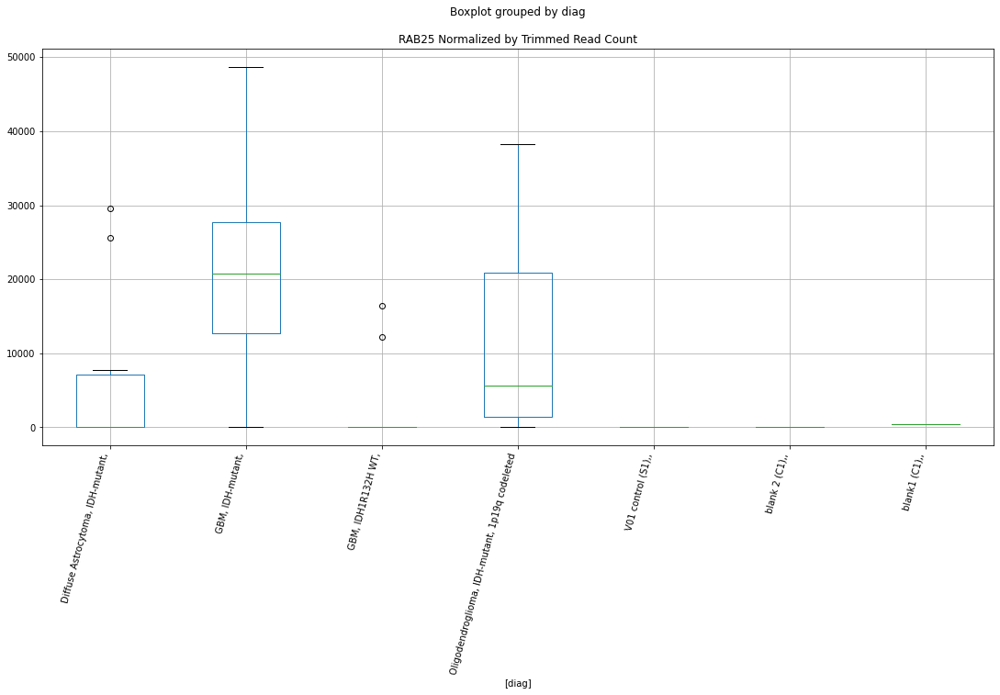

 p : 0.003185754523487767  ( t : 3.4008149008176383 ) :  D-plex  :  bbduk2  :  PLEKHB1
Control and blanks
73     0.0
337    0.0
Name: PLEKHB1, dtype: float64
205    1253.64
Name: PLEKHB1, dtype: float64
469    4140.69
Name: PLEKHB1, dtype: float64


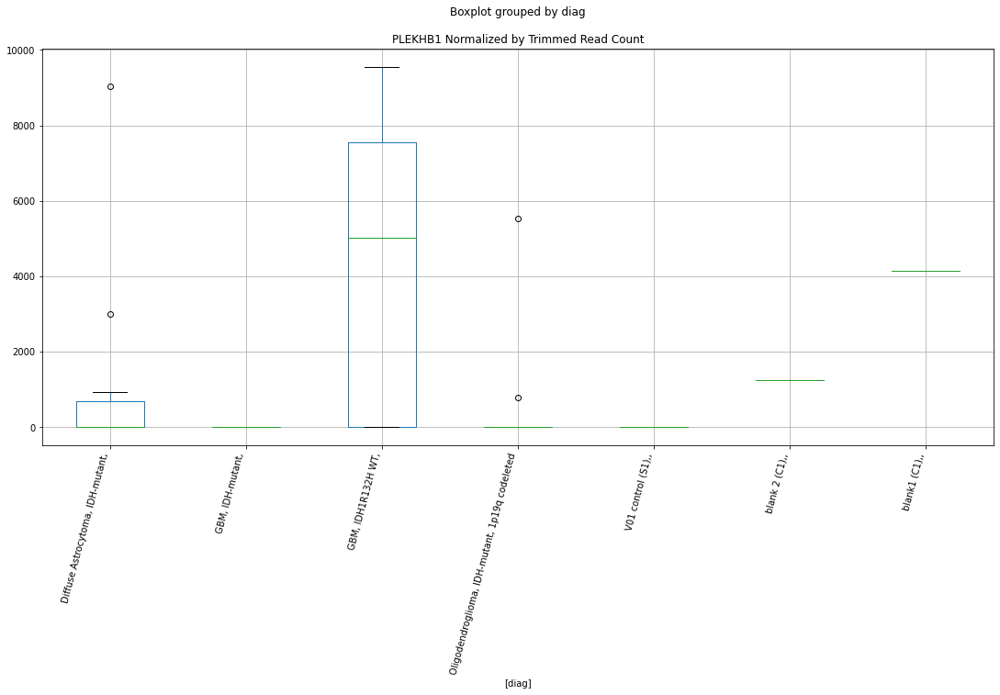

 p : 0.003207180817930921  ( t : 3.397788158872889 ) :  D-plex  :  cutadapt2  :  LINC02641
Control and blanks
76     7576.14
340    8807.32
Name: LINC02641, dtype: float64
208    12697.94
Name: LINC02641, dtype: float64
472    16182.76
Name: LINC02641, dtype: float64


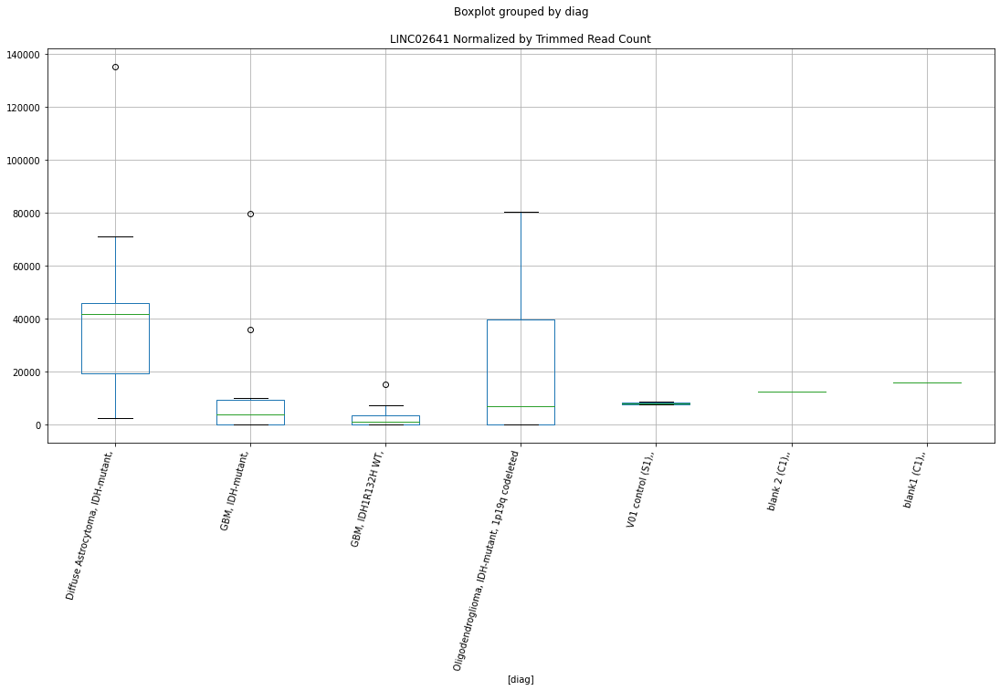

 p : 0.003226656134553768  ( t : 3.395054277511114 ) :  D-plex  :  bbduk2  :  POU2F2
Control and blanks
73         0.00
337    47178.33
Name: POU2F2, dtype: float64
205    42981.83
Name: POU2F2, dtype: float64
469    21294.98
Name: POU2F2, dtype: float64


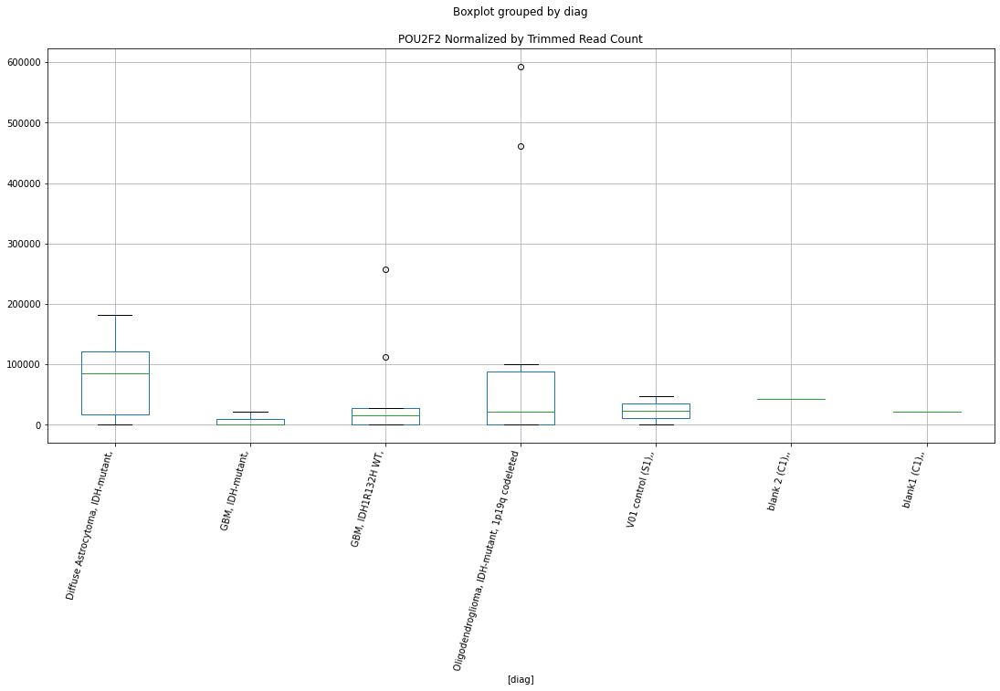

 p : 0.003296202004775431  ( t : 3.385422778908734 ) :  D-plex  :  bbduk2  :  PALM2AKAP2
Control and blanks
73      3865.04
337    73883.05
Name: PALM2AKAP2, dtype: float64
205    20237.28
Name: PALM2AKAP2, dtype: float64
469    12422.07
Name: PALM2AKAP2, dtype: float64


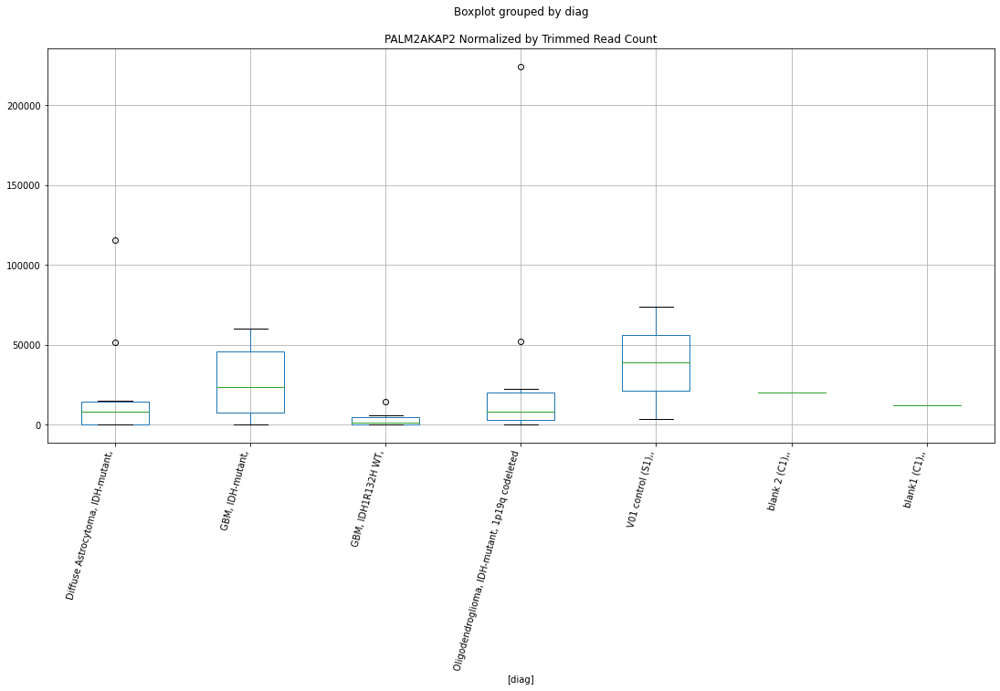

 p : 0.0033163232840556257  ( t : 3.3826735250588715 ) :  D-plex  :  cutadapt2  :  IL2
Control and blanks
76     3030.46
340    5284.39
Name: IL2, dtype: float64
208    11639.77
Name: IL2, dtype: float64
472    528251.64
Name: IL2, dtype: float64


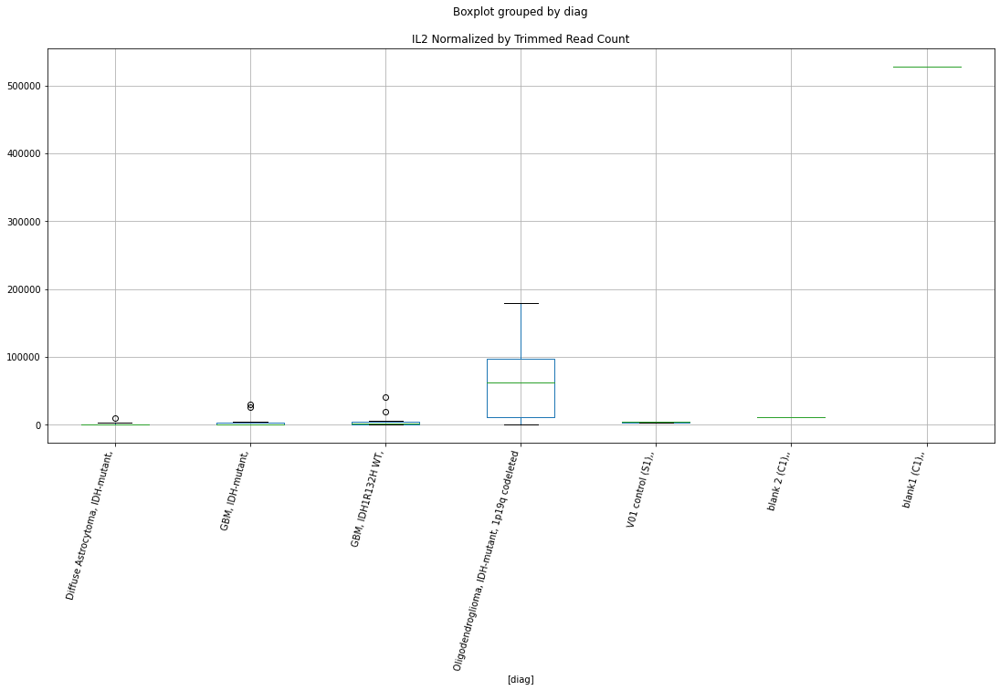

 p : 0.0033460228861361607  ( t : 3.378645458258302 ) :  D-plex  :  cutadapt2  :  RAB11FIP1
Control and blanks
76     0.0
340    0.0
Name: RAB11FIP1, dtype: float64
208    73189.49
Name: RAB11FIP1, dtype: float64
472    3467.74
Name: RAB11FIP1, dtype: float64


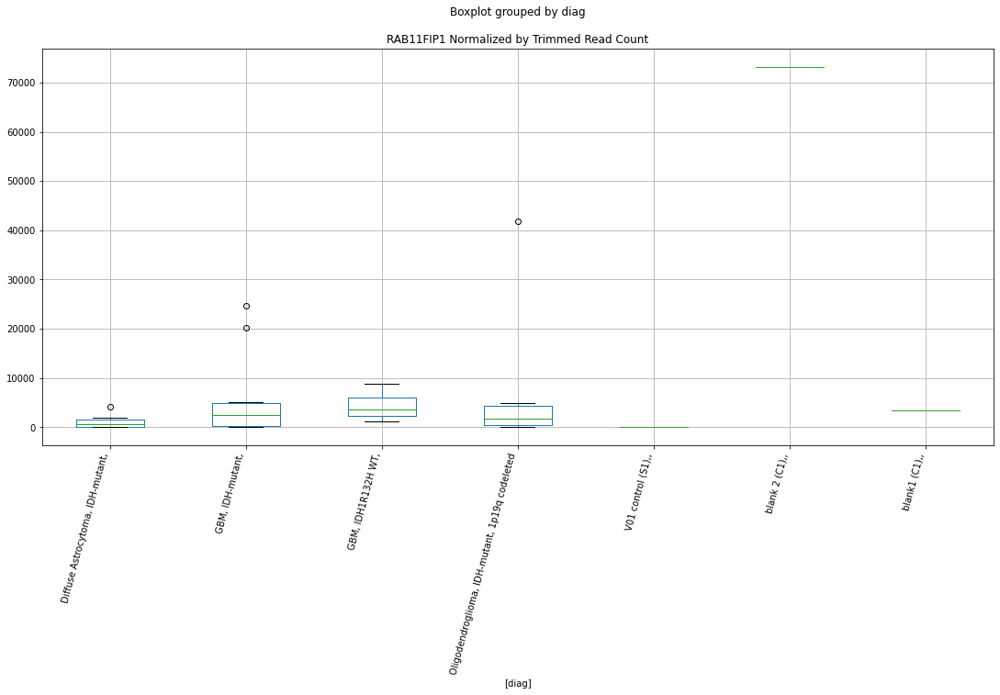

 p : 0.0033651815069025326  ( t : 3.3760656964310023 ) :  D-plex  :  cutadapt2  :  FBXO28
Control and blanks
76     2272.84
340       0.00
Name: FBXO28, dtype: float64
208    2645.4
Name: FBXO28, dtype: float64
472    6935.47
Name: FBXO28, dtype: float64


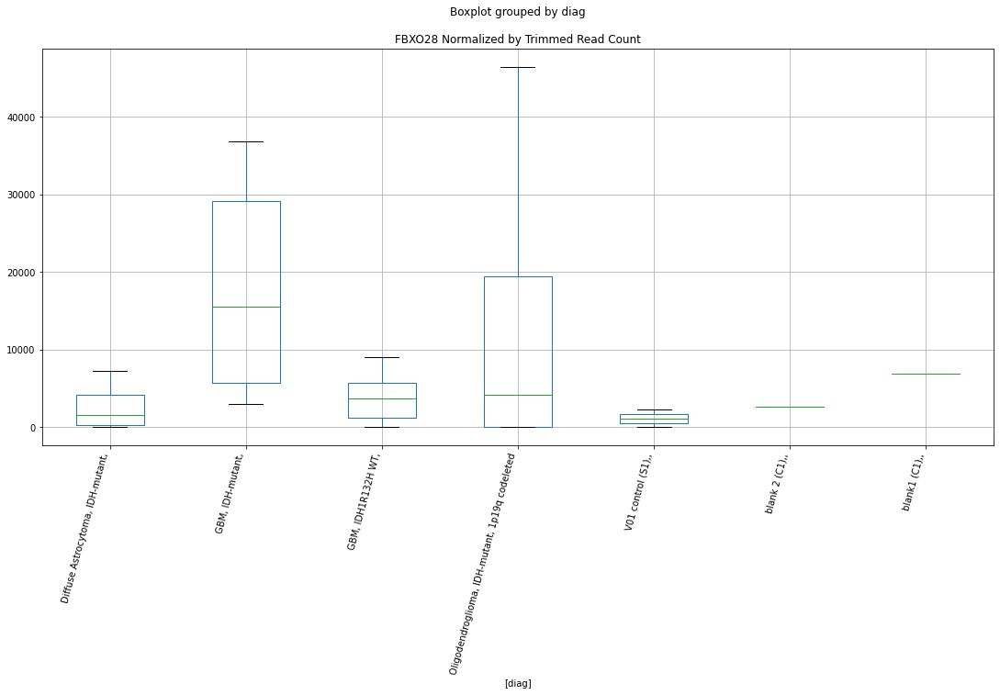

 p : 0.0033765437502753662  ( t : 3.37454257054198 ) :  D-plex  :  cutadapt2  :  LOC105375463
Control and blanks
76     0.0
340    0.0
Name: LOC105375463, dtype: float64
208    6878.05
Name: LOC105375463, dtype: float64
472    28897.79
Name: LOC105375463, dtype: float64


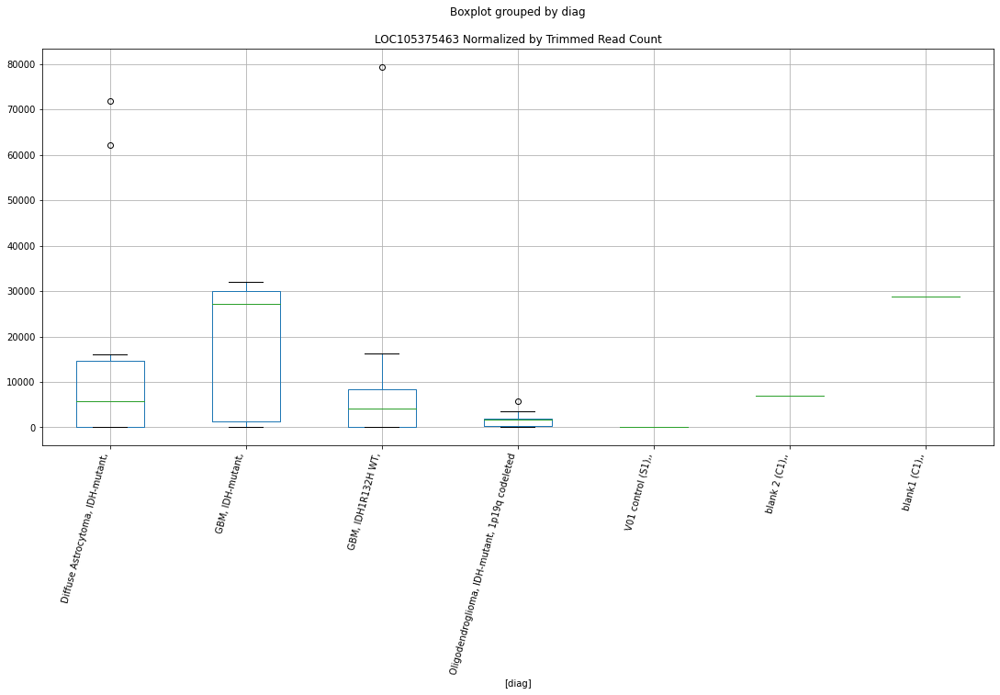

 p : 0.0033840547017114668  ( t : 3.373538487870508 ) :  Lexogen  :  cutadapt2  :  RAB25
Control and blanks
82     0.0
346    0.0
Name: RAB25, dtype: float64
214    0.0
Name: RAB25, dtype: float64
478    474.92
Name: RAB25, dtype: float64


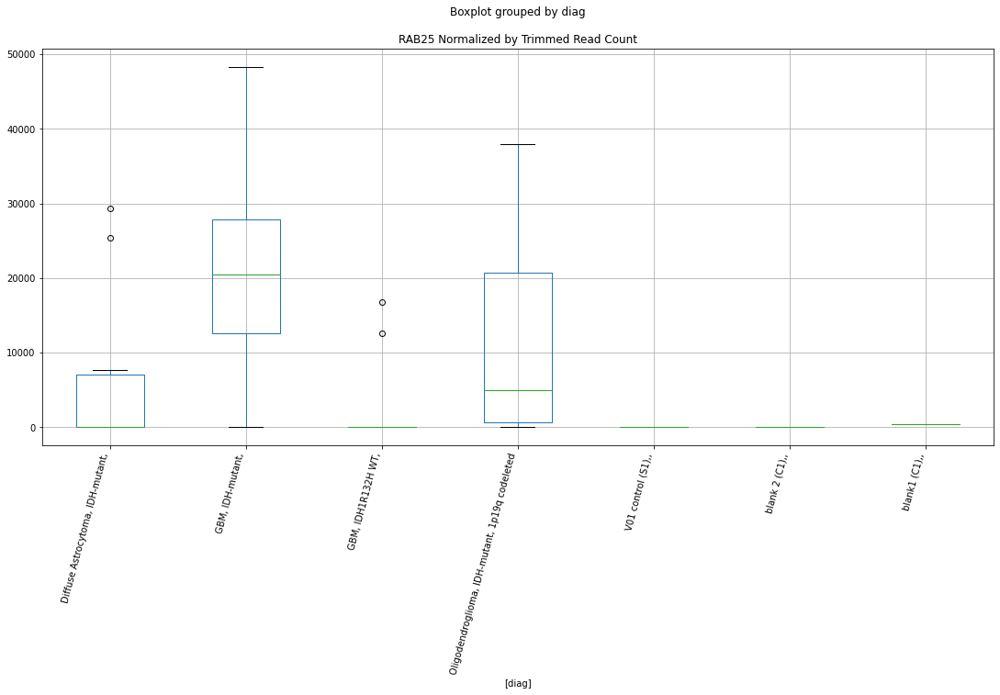

 p : 0.0034108653943695933  ( t : 3.369972198761856 ) :  D-plex  :  bbduk2  :  LOC105373481
Control and blanks
73     0.0
337    0.0
Name: LOC105373481, dtype: float64
205    537.27
Name: LOC105373481, dtype: float64
469    0.0
Name: LOC105373481, dtype: float64


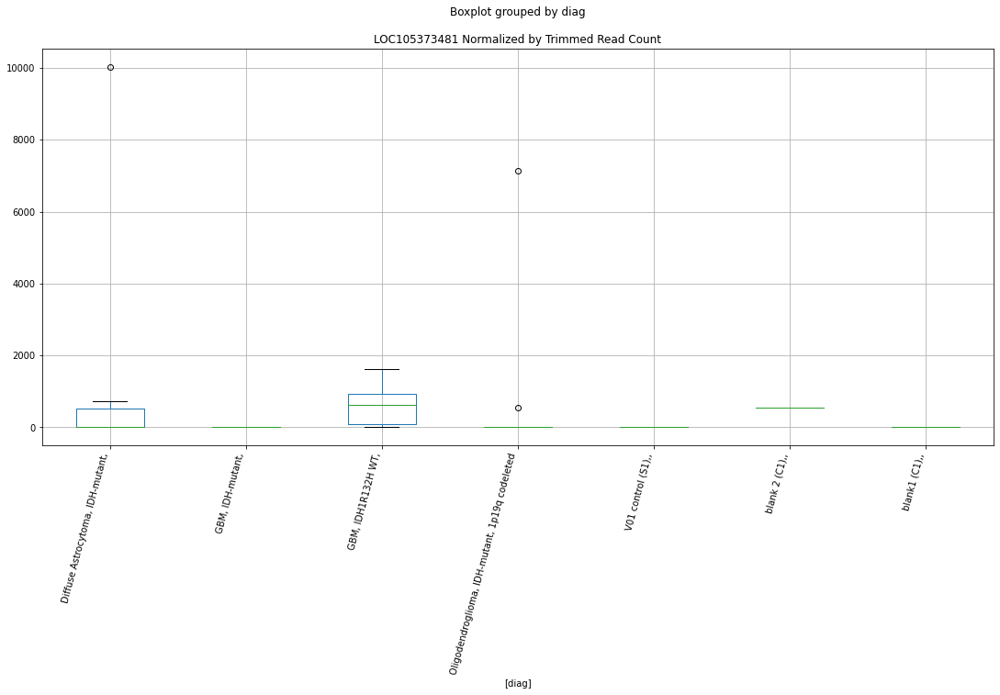

 p : 0.003423607335378015  ( t : 3.3682869747207493 ) :  D-plex  :  bbduk2  :  IL2
Control and blanks
73     3092.03
337    5340.94
Name: IL2, dtype: float64
205    11461.82
Name: IL2, dtype: float64
469    538289.86
Name: IL2, dtype: float64


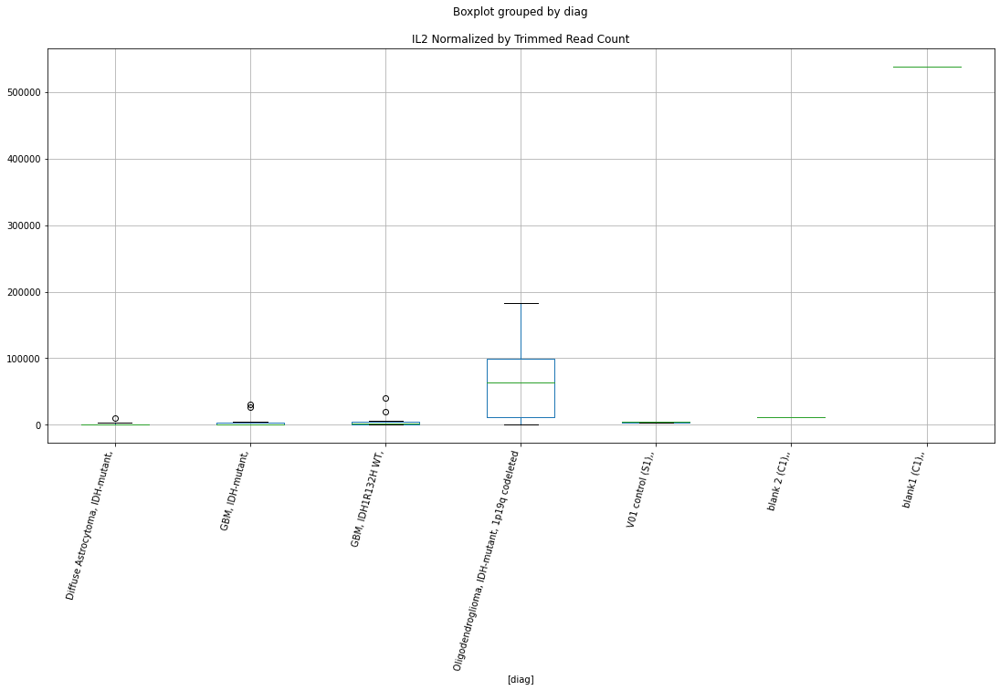

 p : 0.003427951427781038  ( t : 3.3677138464541505 ) :  D-plex  :  bbduk2  :  LINC02641
Control and blanks
73     7730.08
337    8901.57
Name: LINC02641, dtype: float64
205    13610.91
Name: LINC02641, dtype: float64
469    16562.76
Name: LINC02641, dtype: float64


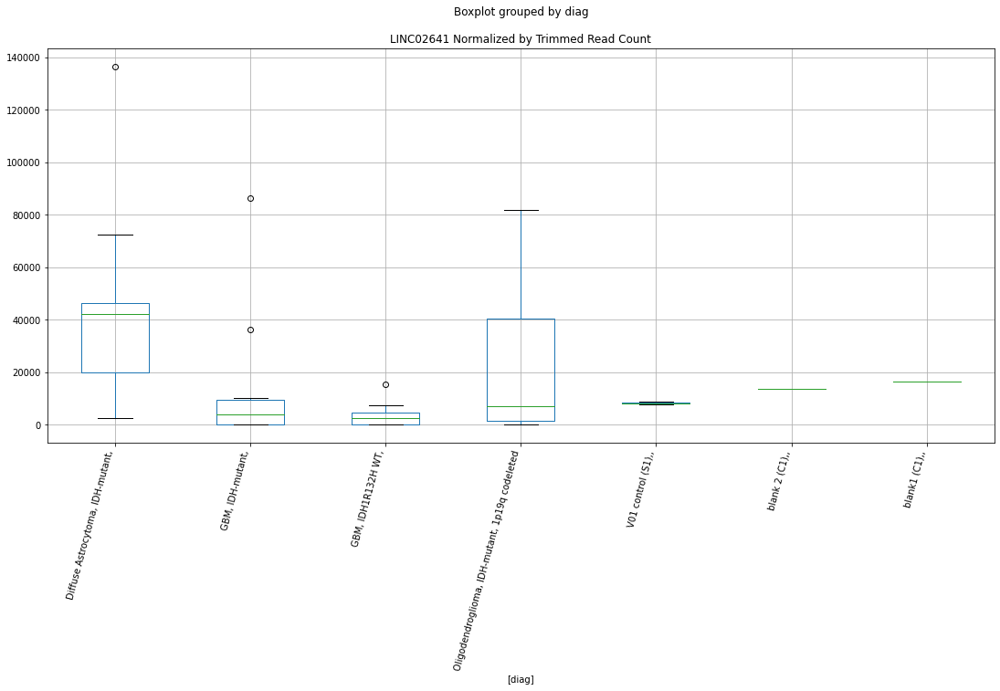

 p : 0.003440584674140582  ( t : 3.3660511659655312 ) :  D-plex  :  bbduk2  :  ACTA1
Control and blanks
73     0.0
337    0.0
Name: ACTA1, dtype: float64
205    1074.55
Name: ACTA1, dtype: float64
469    1183.05
Name: ACTA1, dtype: float64


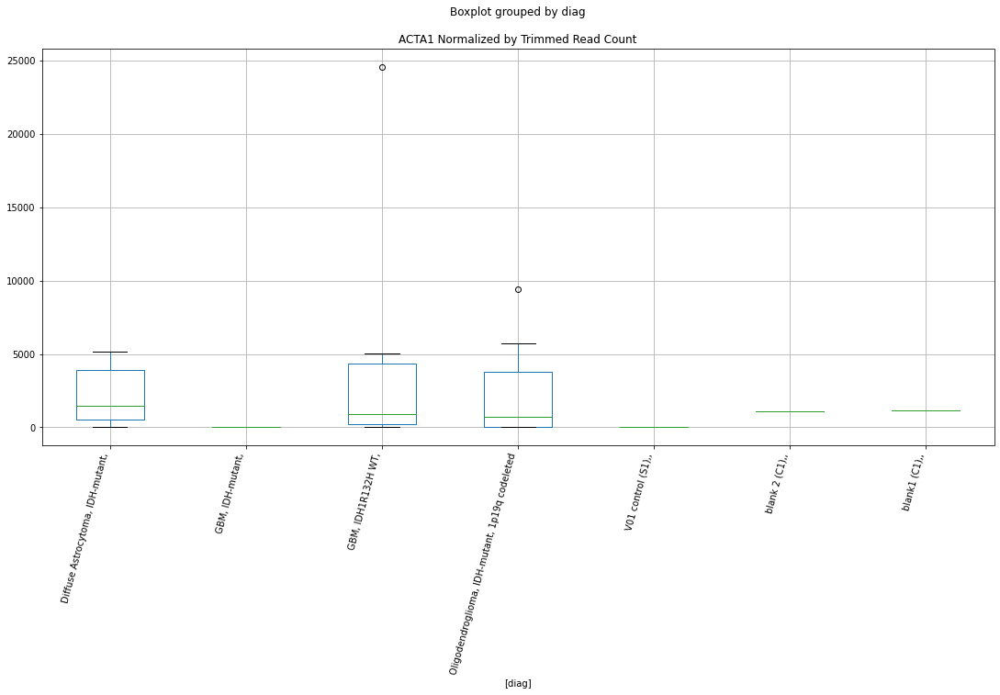

 p : 0.003481033970107393  ( t : 3.3607677598396464 ) :  D-plex  :  cutadapt2  :  LOC105373481
Control and blanks
76     0.0
340    0.0
Name: LOC105373481, dtype: float64
208    529.08
Name: LOC105373481, dtype: float64
472    0.0
Name: LOC105373481, dtype: float64


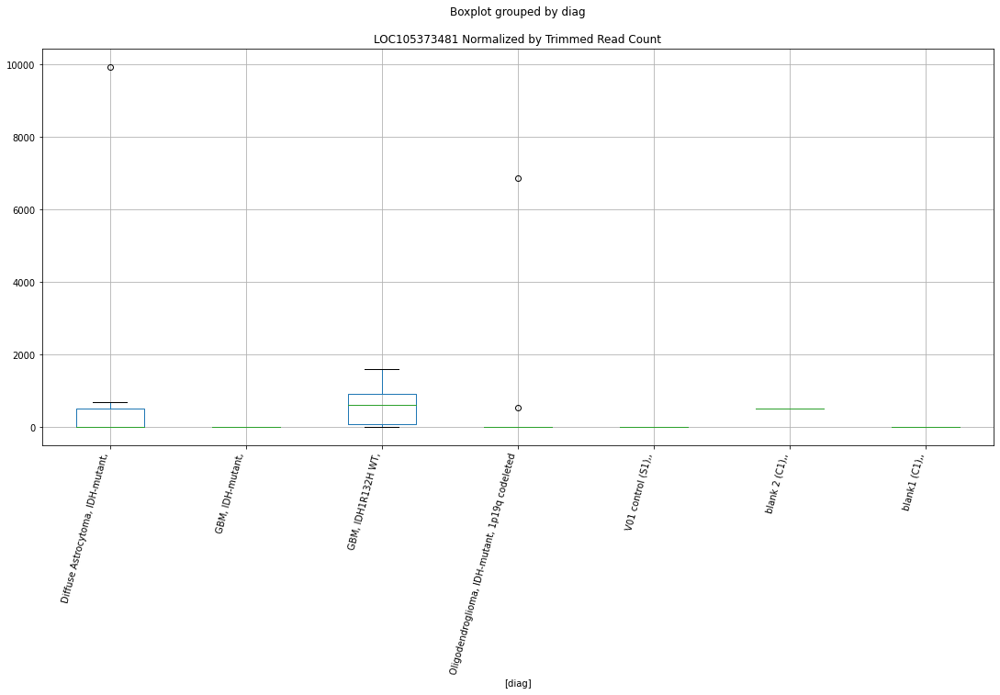

 p : 0.003702151174257556  ( t : 3.332913928761056 ) :  D-plex  :  cutadapt2  :  CYP27B1
Control and blanks
76     0.0
340    0.0
Name: CYP27B1, dtype: float64
208    176.36
Name: CYP27B1, dtype: float64
472    1155.91
Name: CYP27B1, dtype: float64


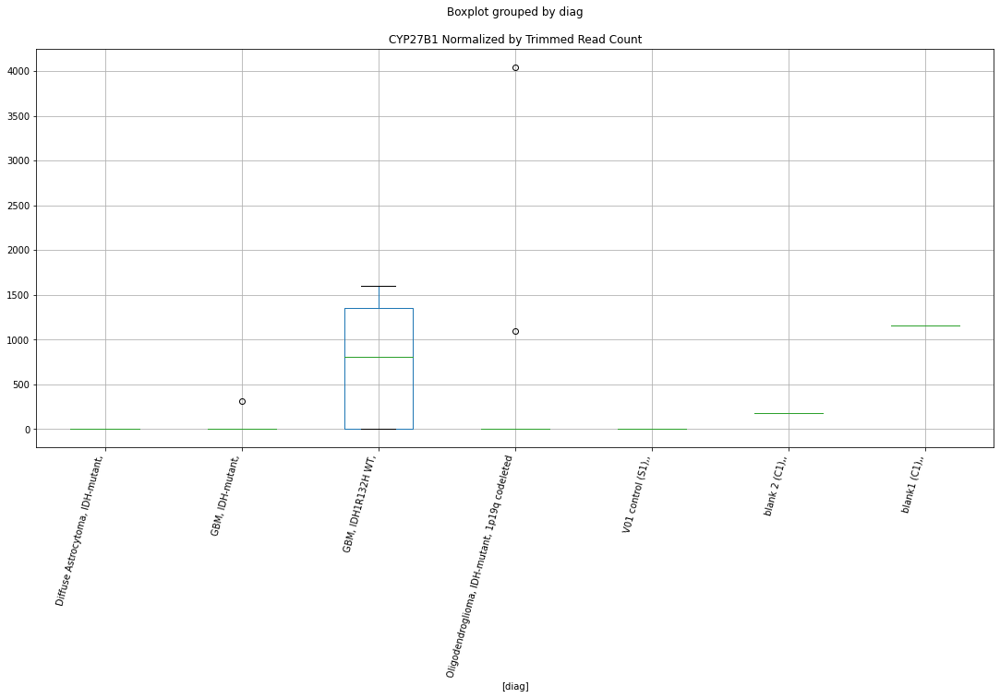

 p : 0.003716949047734678  ( t : 3.331108799133445 ) :  Lexogen  :  bbduk2  :  FRK
Control and blanks
79     0.0
343    0.0
Name: FRK, dtype: float64
211    0.0
Name: FRK, dtype: float64
475    0.0
Name: FRK, dtype: float64


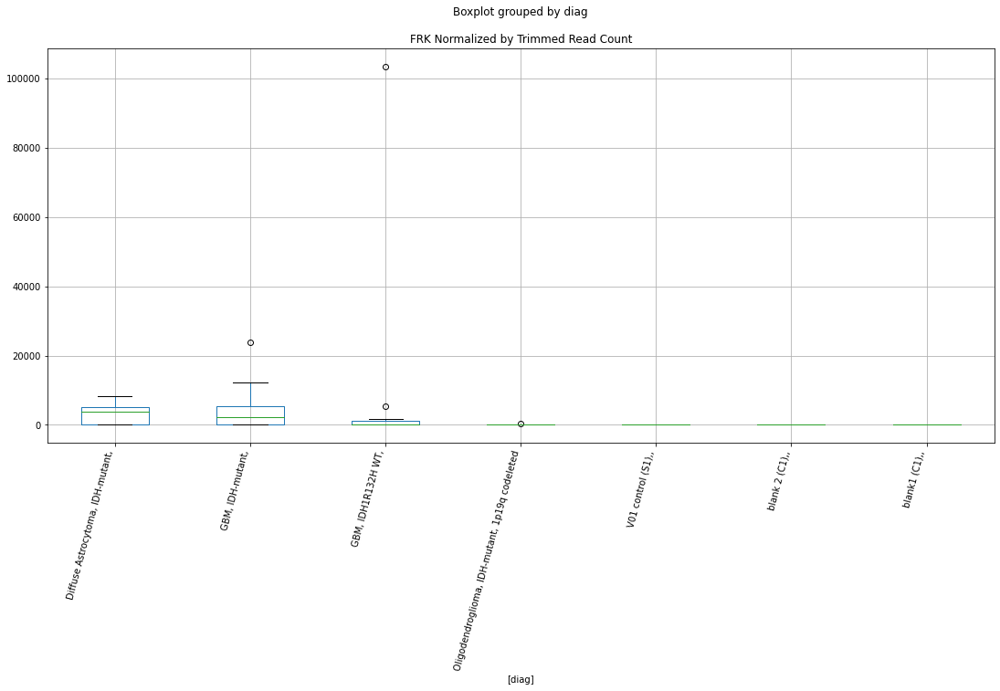

 p : 0.003786447600456847  ( t : 3.32272449666146 ) :  Lexogen  :  cutadapt2  :  CAMTA1
Control and blanks
82          0.00
346    235476.23
Name: CAMTA1, dtype: float64
214    0.0
Name: CAMTA1, dtype: float64
478    0.0
Name: CAMTA1, dtype: float64


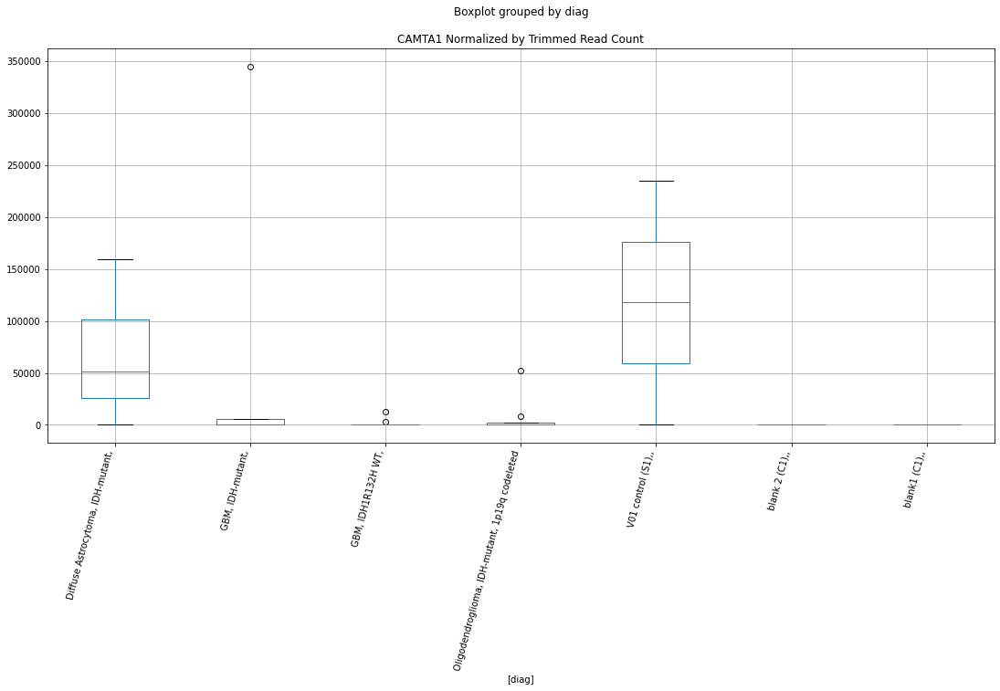

 p : 0.0037876987231471072  ( t : 3.3225749530725937 ) :  D-plex  :  bbduk2  :  CYP27B1
Control and blanks
73     0.0
337    0.0
Name: CYP27B1, dtype: float64
205    179.09
Name: CYP27B1, dtype: float64
469    1183.05
Name: CYP27B1, dtype: float64


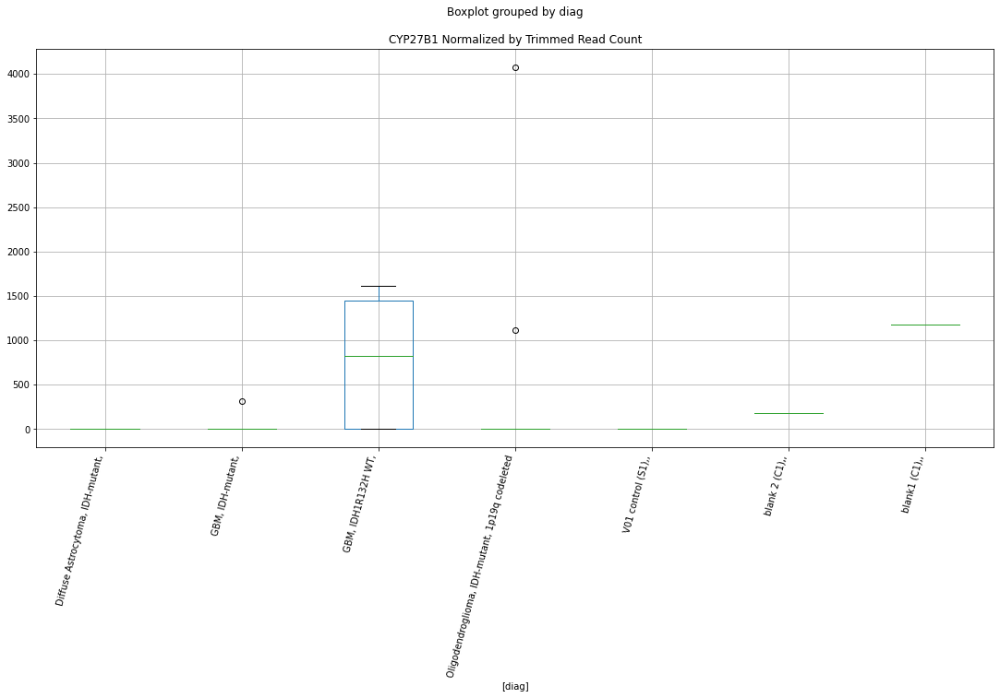

 p : 0.003806603085622255  ( t : 3.320321258304656 ) :  D-plex  :  bbduk2  :  MUC16
Control and blanks
73      10049.11
337    196724.76
Name: MUC16, dtype: float64
205    73248.2
Name: MUC16, dtype: float64
469    1.91e+06
Name: MUC16, dtype: float64


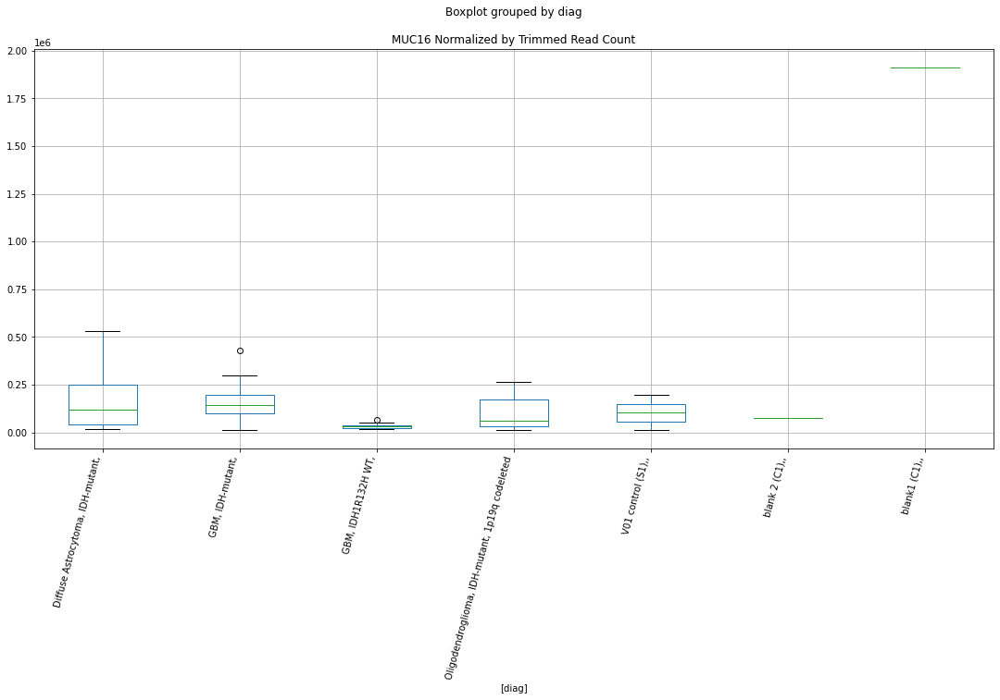

 p : 0.003806778543570393  ( t : 3.3203003926056516 ) :  D-plex  :  cutadapt2  :  GPRC6A
Control and blanks
76       0.00
340    880.73
Name: GPRC6A, dtype: float64
208    4409.01
Name: GPRC6A, dtype: float64
472    4045.69
Name: GPRC6A, dtype: float64


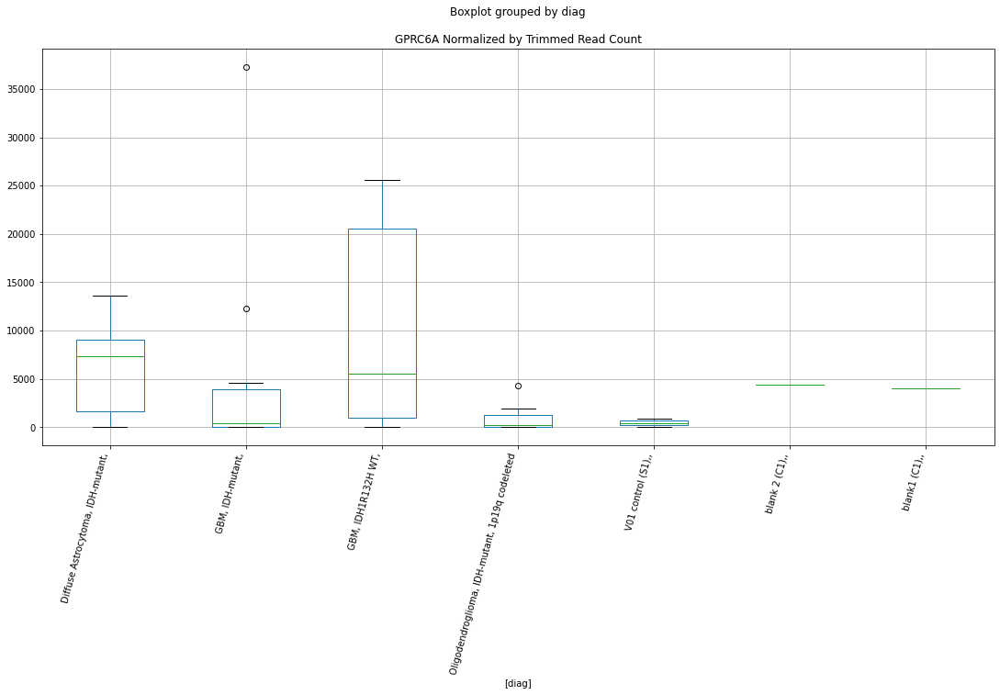

 p : 0.0038366048180519256  ( t : 3.3167670928105535 ) :  D-plex  :  bbduk2  :  TESK2
Control and blanks
73      97399.06
337    320456.62
Name: TESK2, dtype: float64
205    171569.13
Name: TESK2, dtype: float64
469    63884.95
Name: TESK2, dtype: float64


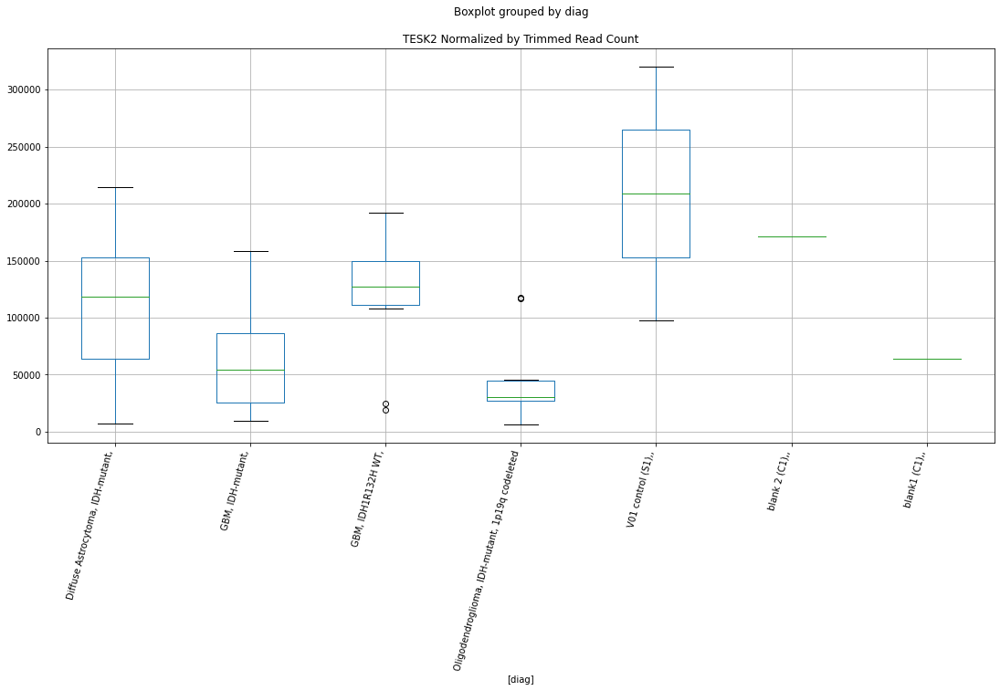

 p : 0.003848141767921065  ( t : 3.315407638585019 ) :  Lexogen  :  cutadapt2  :  FRK
Control and blanks
82     0.0
346    0.0
Name: FRK, dtype: float64
214    0.0
Name: FRK, dtype: float64
478    0.0
Name: FRK, dtype: float64


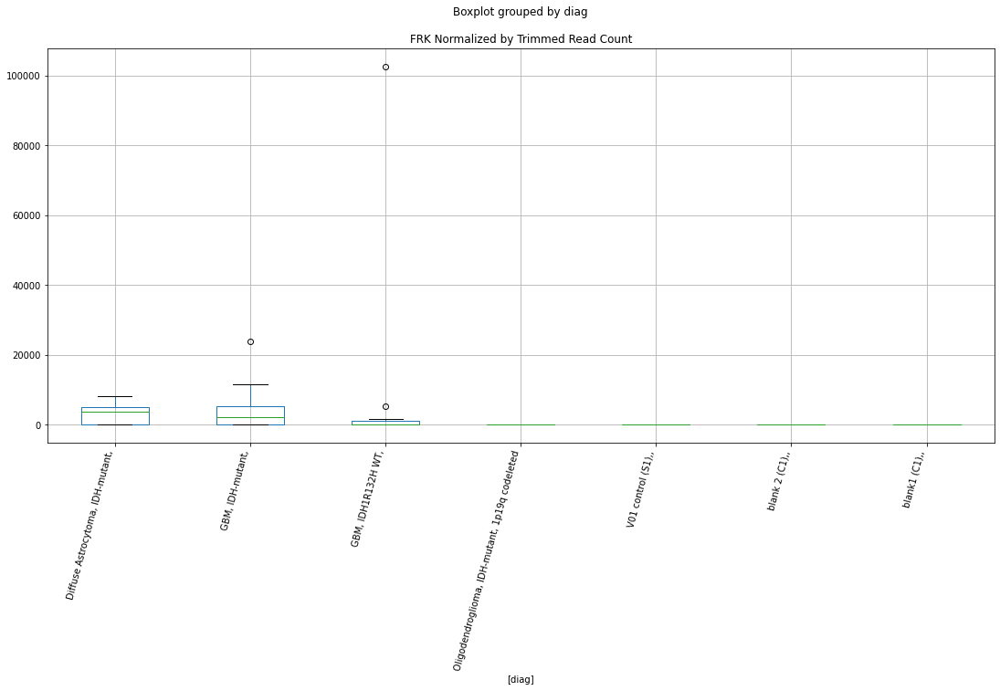

 p : 0.0039549354843494595  ( t : 3.303010609569249 ) :  Lexogen  :  bbduk2  :  IL17RB
Control and blanks
79         0.00
343    10191.09
Name: IL17RB, dtype: float64
211    9839.03
Name: IL17RB, dtype: float64
475    5748.38
Name: IL17RB, dtype: float64


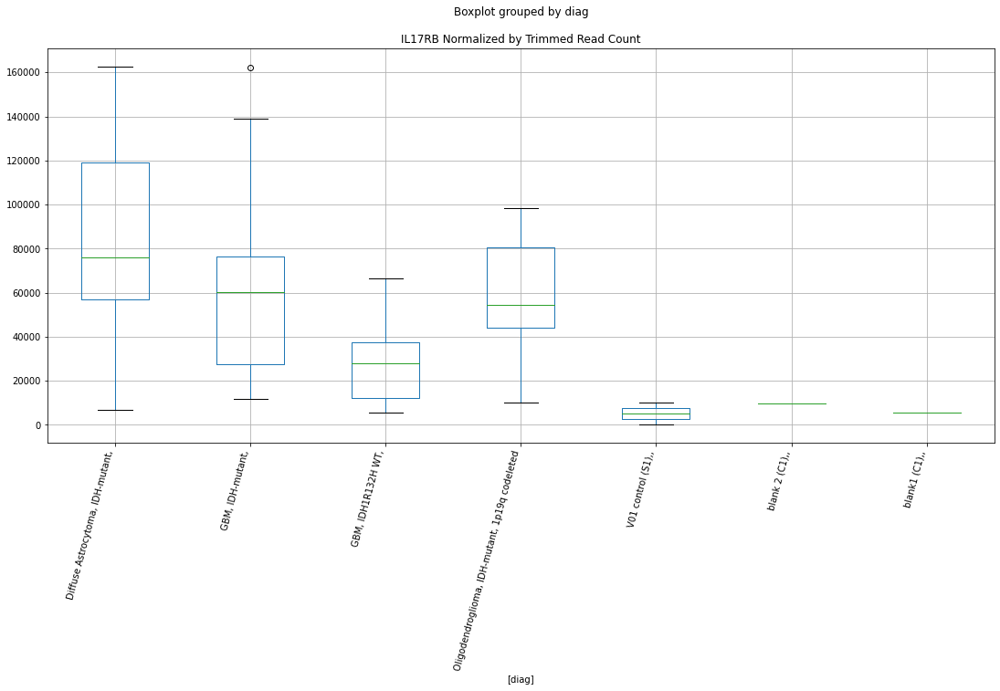

 p : 0.003993853049170482  ( t : 3.2985745977764824 ) :  D-plex  :  bbduk2  :  ZNF800
Control and blanks
73     136822.49
337     11572.04
Name: ZNF800, dtype: float64
205    43340.01
Name: ZNF800, dtype: float64
469    39632.33
Name: ZNF800, dtype: float64


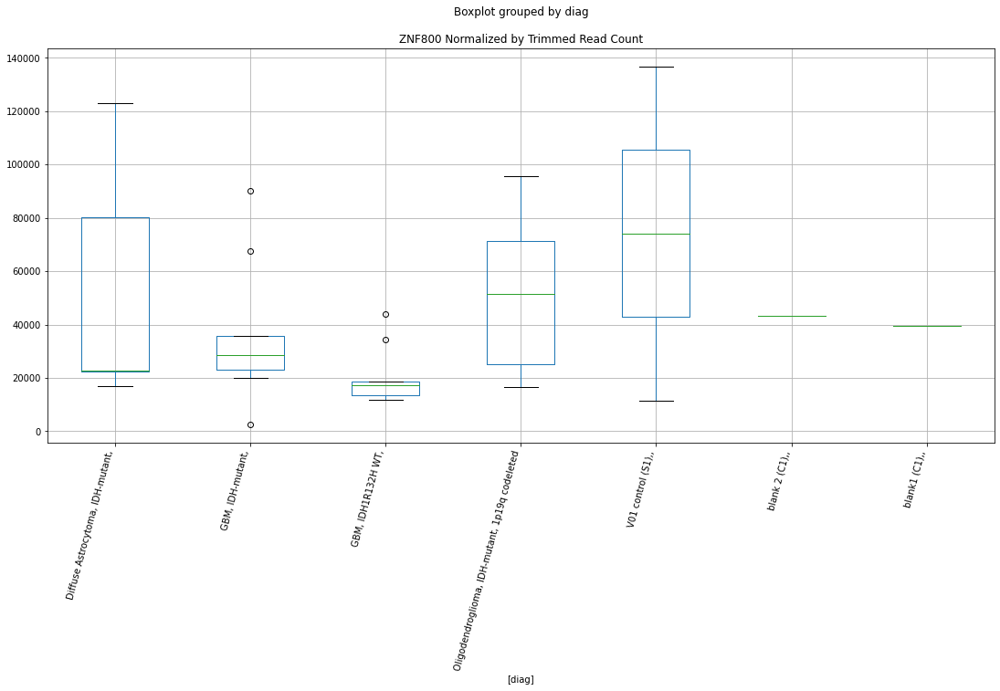

 p : 0.004085053591730965  ( t : 3.288343395551014 ) :  D-plex  :  cutadapt2  :  TMEM97
Control and blanks
76     1515.23
340       0.00
Name: TMEM97, dtype: float64
208    352.72
Name: TMEM97, dtype: float64
472    577.96
Name: TMEM97, dtype: float64


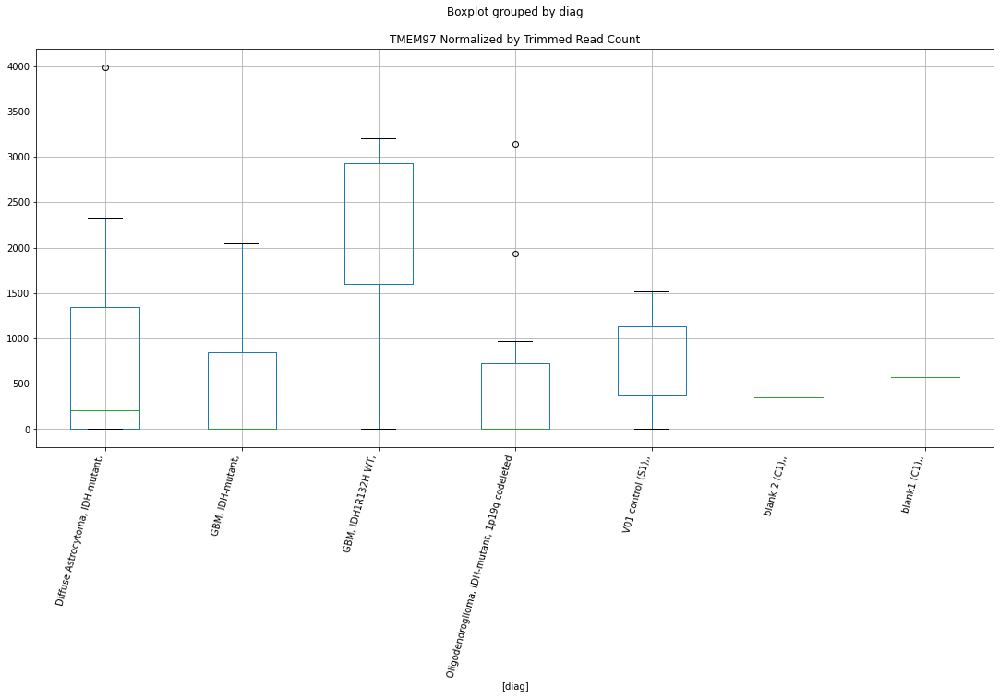

 p : 0.004111667429680416  ( t : 3.2854000557523952 ) :  D-plex  :  bbduk2  :  ARL4D
Control and blanks
73     773.01
337      0.00
Name: ARL4D, dtype: float64
205    34027.28
Name: ARL4D, dtype: float64
469    2366.11
Name: ARL4D, dtype: float64


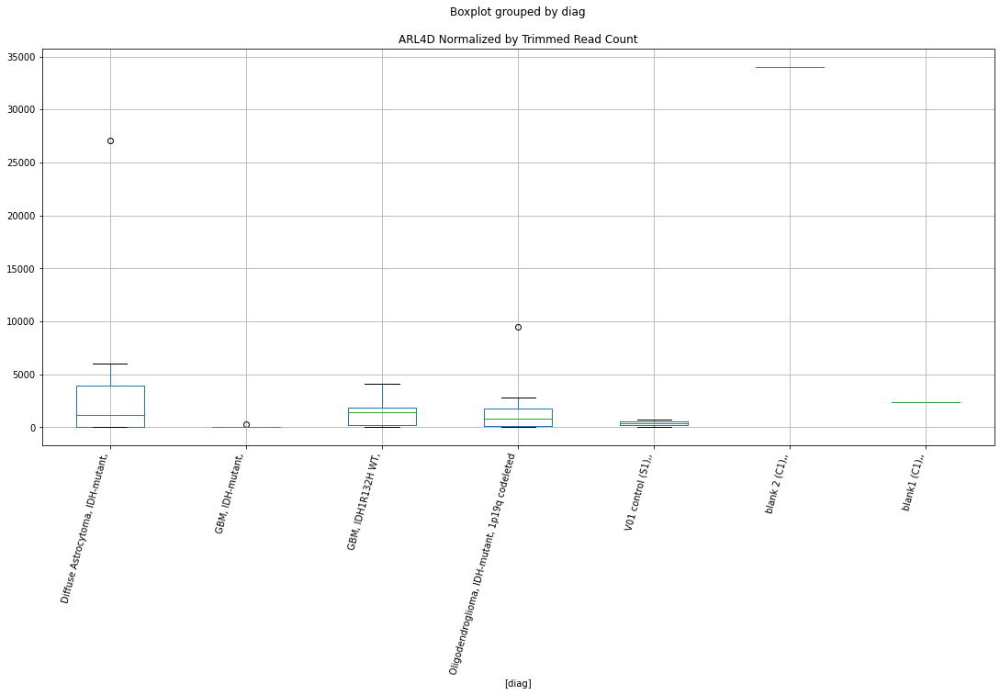

 p : 0.0041257199004476495  ( t : 3.283853475770231 ) :  D-plex  :  cutadapt2  :  TESK2
Control and blanks
76      95459.39
340    320586.50
Name: TESK2, dtype: float64
208    171422.13
Name: TESK2, dtype: float64
472    61263.32
Name: TESK2, dtype: float64


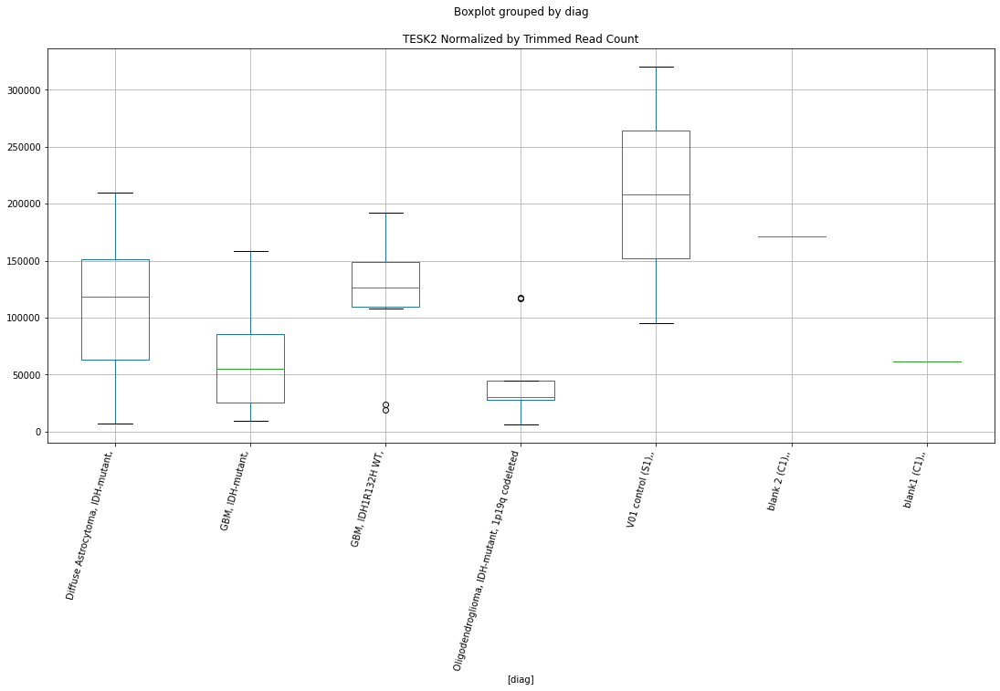

 p : 0.004162828874813565  ( t : 3.2797941034171254 ) :  D-plex  :  bbduk2  :  CHST4
Control and blanks
73      72662.79
337    197614.91
Name: CHST4, dtype: float64
205    360689.18
Name: CHST4, dtype: float64
469    22478.04
Name: CHST4, dtype: float64


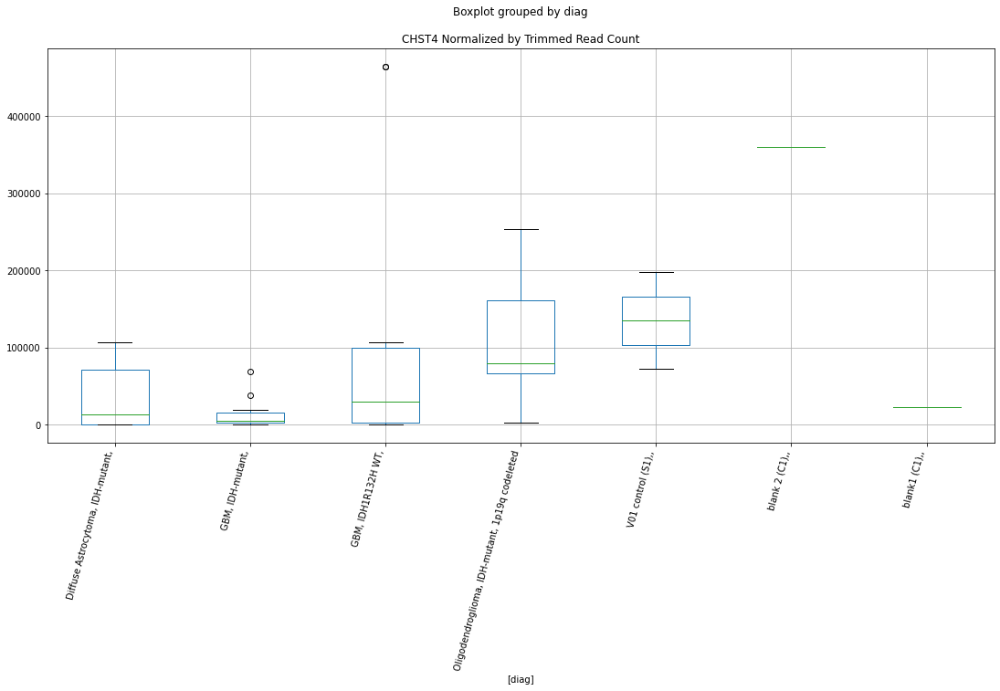

 p : 0.004188335153660307  ( t : 3.277024521036483 ) :  Lexogen  :  bbduk2  :  CAMTA1
Control and blanks
79          0.00
343    237579.72
Name: CAMTA1, dtype: float64
211    0.0
Name: CAMTA1, dtype: float64
475    0.0
Name: CAMTA1, dtype: float64


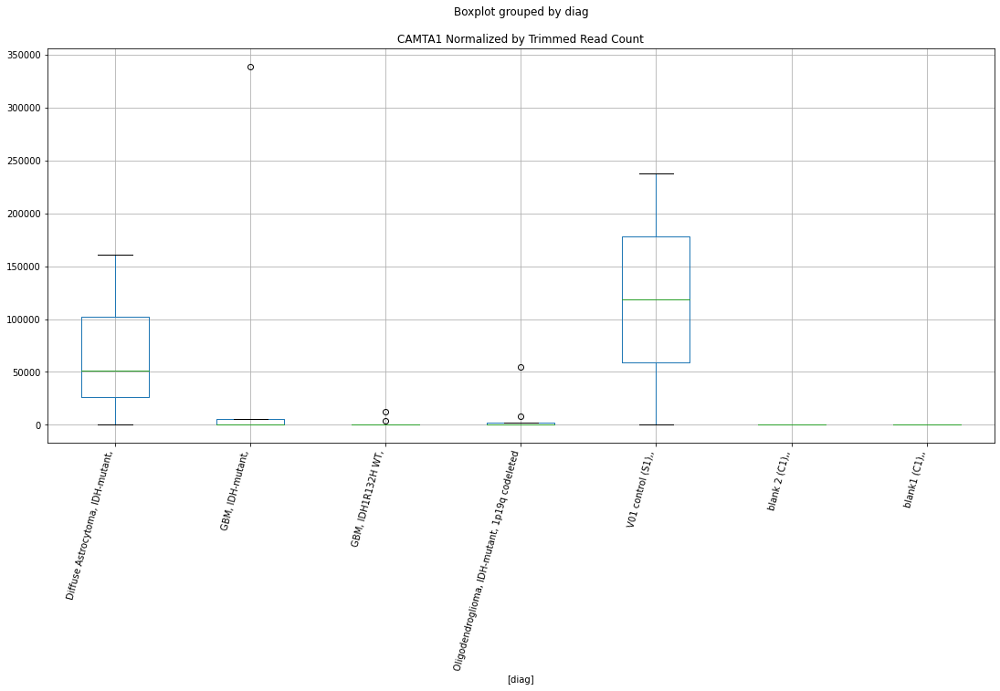

 p : 0.004211648249018493  ( t : 3.2745075388952394 ) :  D-plex  :  cutadapt2  :  ARL4D
Control and blanks
76     757.61
340      0.00
Name: ARL4D, dtype: float64
208    33861.16
Name: ARL4D, dtype: float64
472    2311.82
Name: ARL4D, dtype: float64


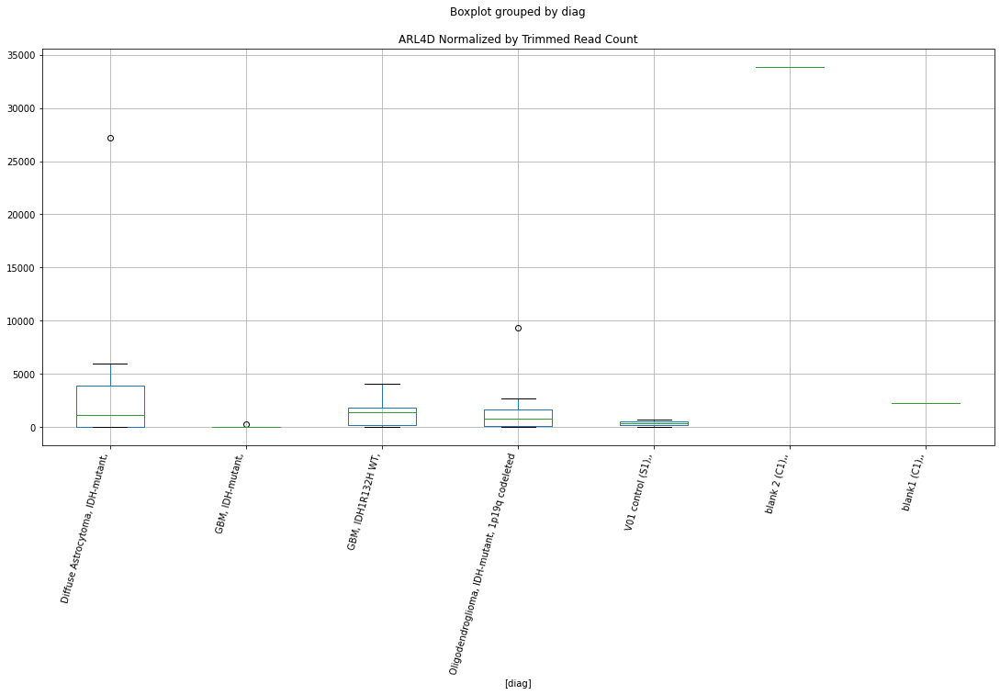

 p : 0.0042192732441658515  ( t : 3.2736872809165716 ) :  D-plex  :  bbduk2  :  EVC
Control and blanks
73     3092.03
337       0.00
Name: EVC, dtype: float64
205    19341.82
Name: EVC, dtype: float64
469    15971.24
Name: EVC, dtype: float64


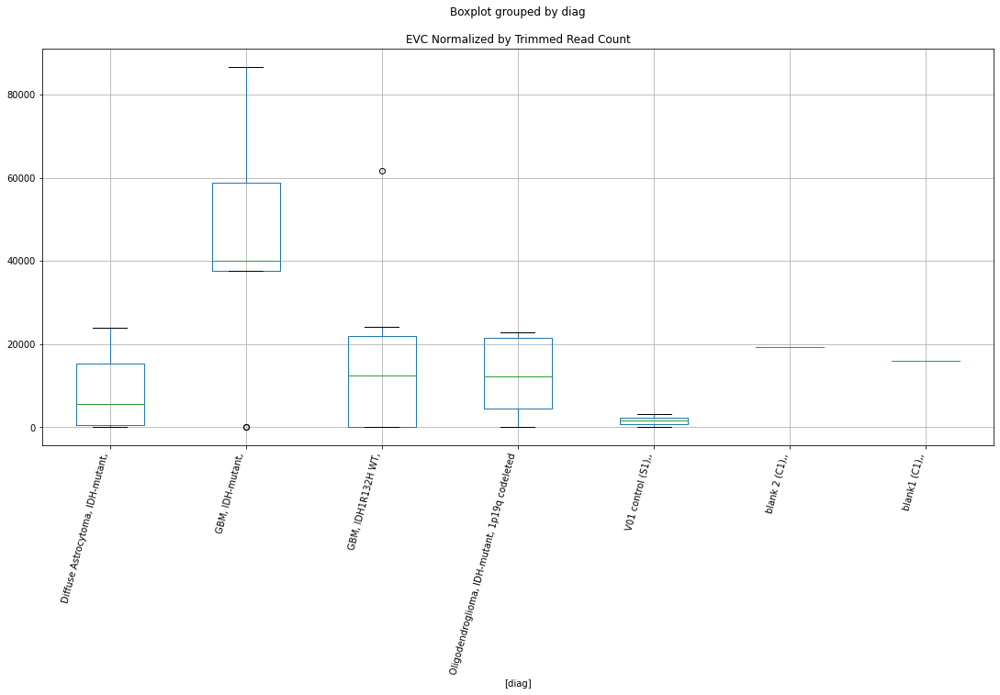

 p : 0.004224479219765717  ( t : 3.2731280846757302 ) :  D-plex  :  bbduk2  :  GPRC6A
Control and blanks
73       0.00
337    890.16
Name: GPRC6A, dtype: float64
205    4298.18
Name: GPRC6A, dtype: float64
469    4140.69
Name: GPRC6A, dtype: float64


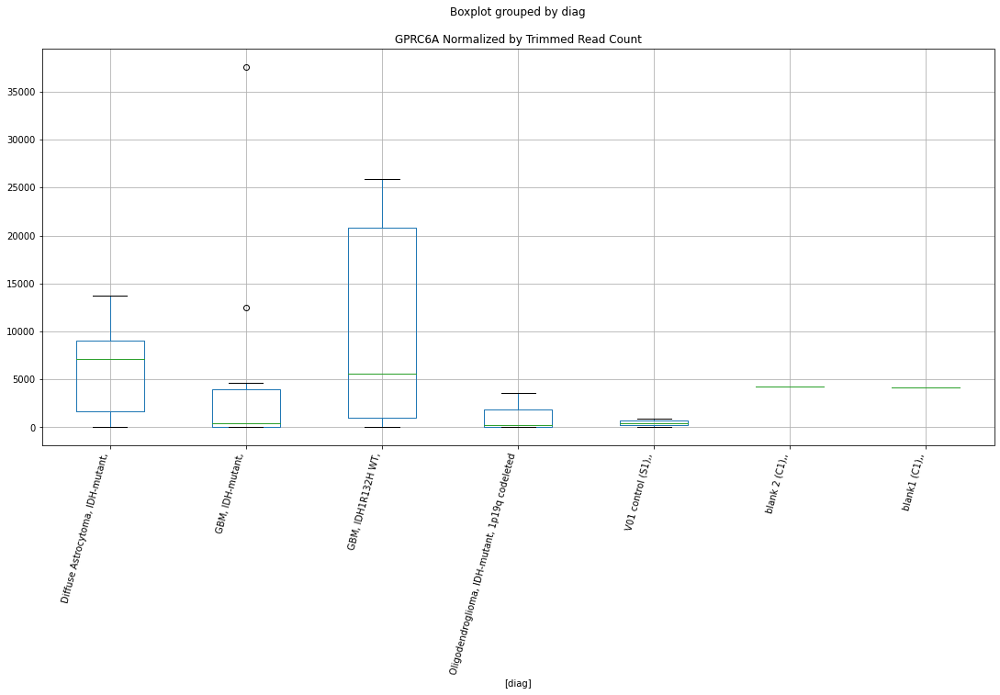

 p : 0.0042447211081530056  ( t : 3.2709602295544884 ) :  Lexogen  :  bbduk2  :  MIR3591
Control and blanks
79     0.0
343    0.0
Name: MIR3591, dtype: float64
211    0.0
Name: MIR3591, dtype: float64
475    0.0
Name: MIR3591, dtype: float64


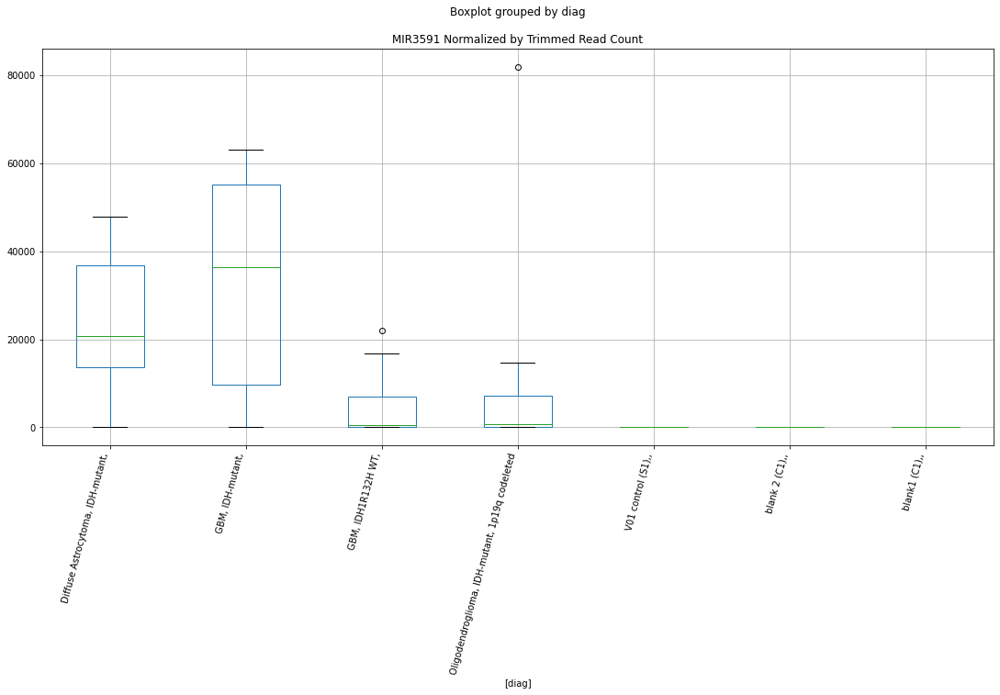

 p : 0.0042447211081530056  ( t : 3.2709602295544884 ) :  Lexogen  :  bbduk2  :  MIR122
Control and blanks
79     0.0
343    0.0
Name: MIR122, dtype: float64
211    0.0
Name: MIR122, dtype: float64
475    0.0
Name: MIR122, dtype: float64


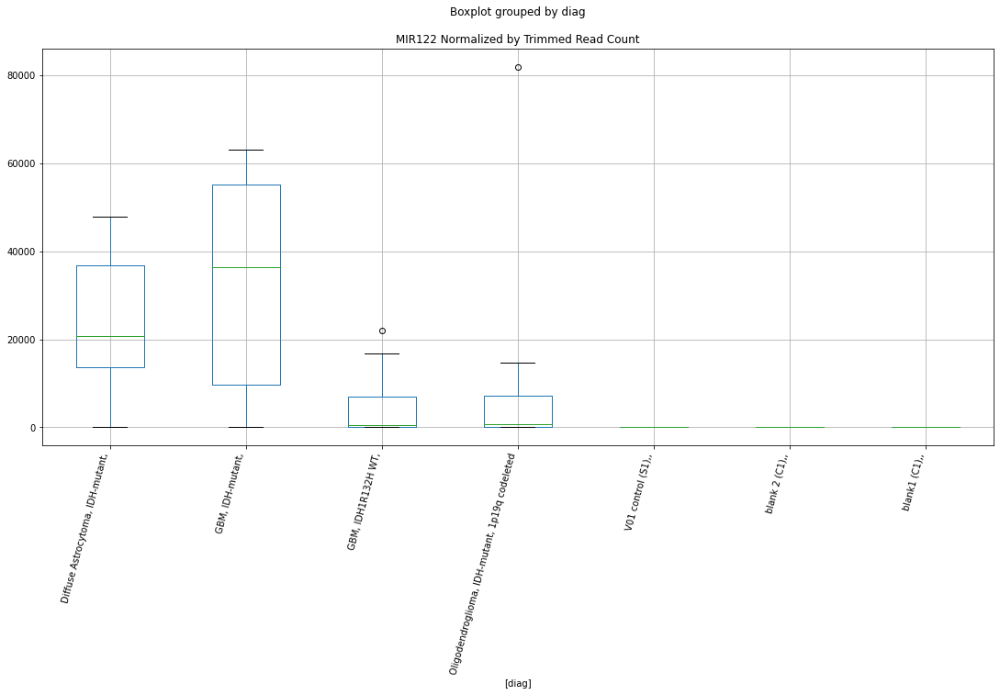

 p : 0.004271486810826445  ( t : 3.2681092270829732 ) :  D-plex  :  bbduk2  :  LOC105378969
Control and blanks
73     0.0
337    0.0
Name: LOC105378969, dtype: float64
205    895.45
Name: LOC105378969, dtype: float64
469    1183.05
Name: LOC105378969, dtype: float64


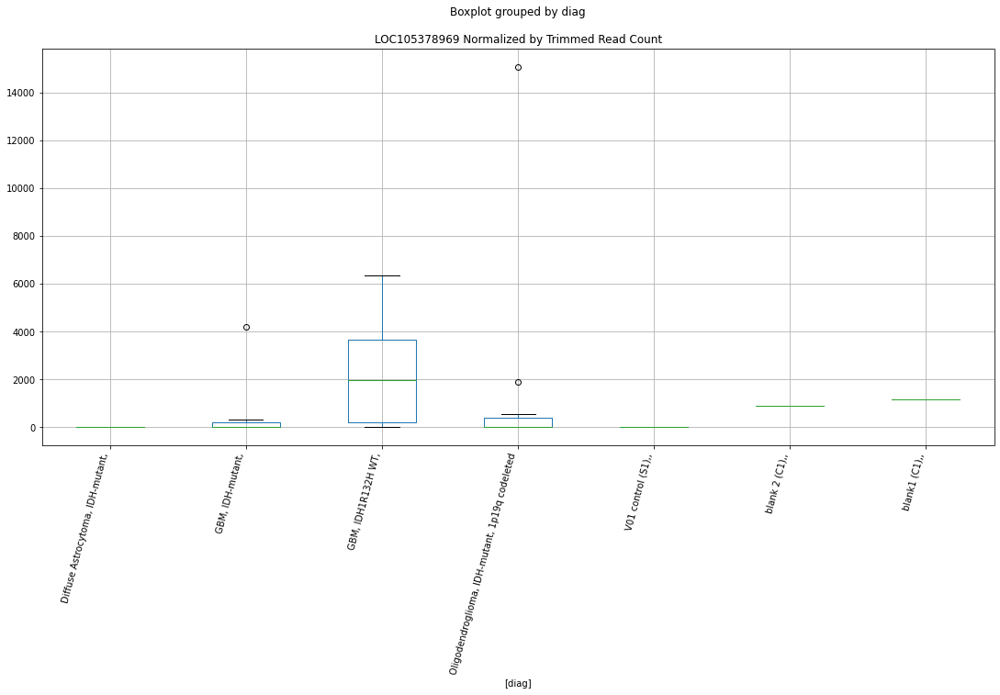

 p : 0.004273995287944557  ( t : 3.267842931391011 ) :  D-plex  :  cutadapt2  :  TSPYL5
Control and blanks
76     757.61
340      0.00
Name: TSPYL5, dtype: float64
208    352.72
Name: TSPYL5, dtype: float64
472    0.0
Name: TSPYL5, dtype: float64


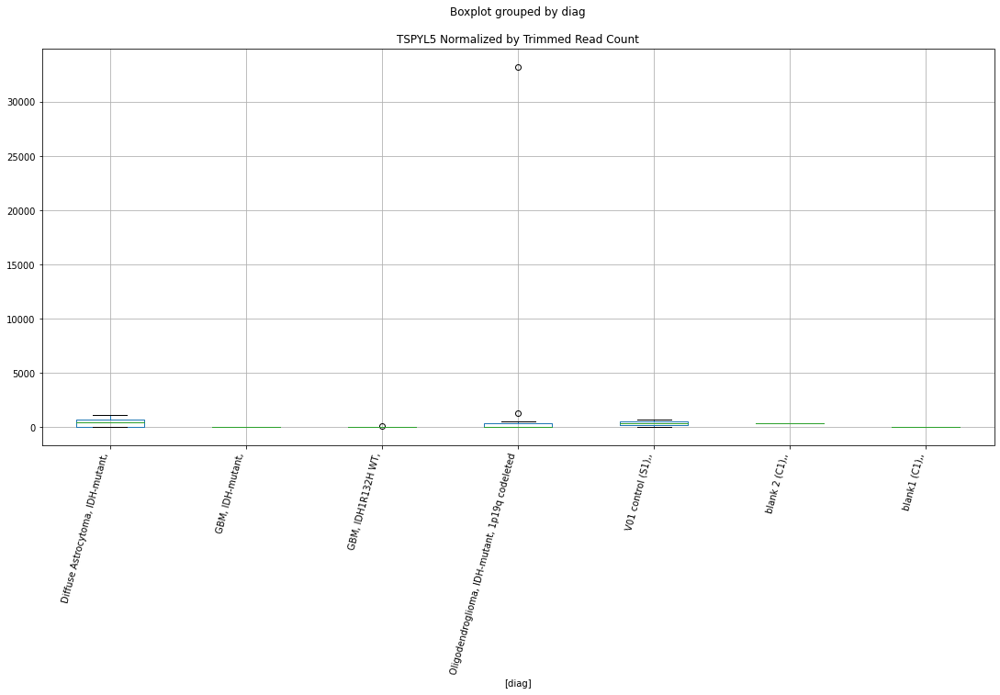

 p : 0.004279934348692297  ( t : 3.267213062098422 ) :  D-plex  :  cutadapt2  :  POU2F2
Control and blanks
76         0.00
340    45798.07
Name: POU2F2, dtype: float64
208    46382.74
Name: POU2F2, dtype: float64
472    20806.41
Name: POU2F2, dtype: float64


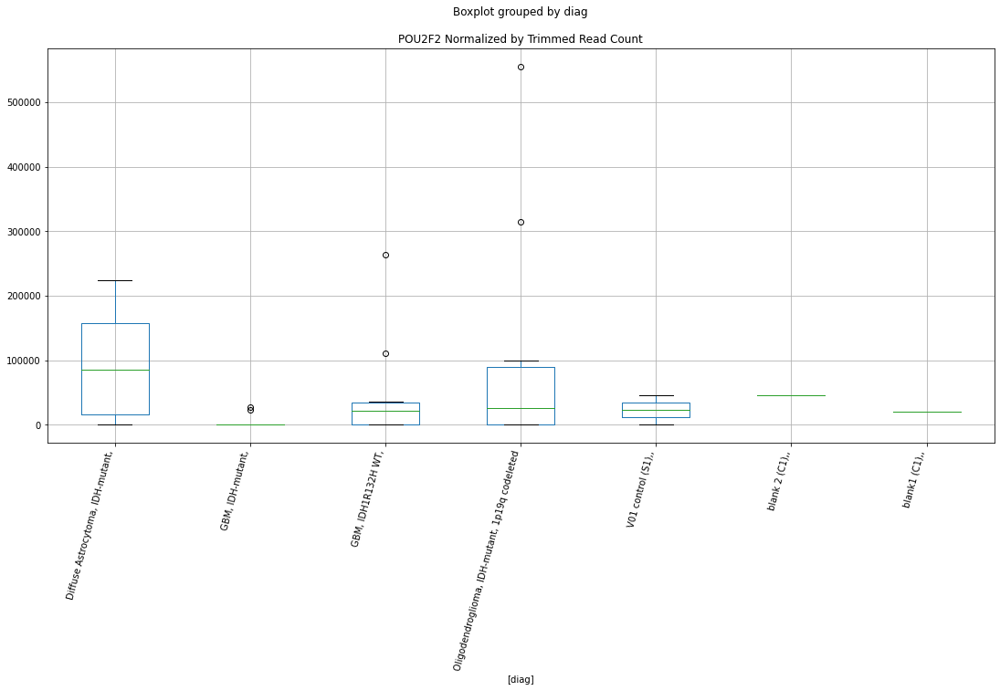

 p : 0.004281902095791052  ( t : 3.2670045612337546 ) :  D-plex  :  cutadapt2  :  CHST4
Control and blanks
76      71215.74
340    197284.00
Name: CHST4, dtype: float64
208    359774.84
Name: CHST4, dtype: float64
472    21962.32
Name: CHST4, dtype: float64


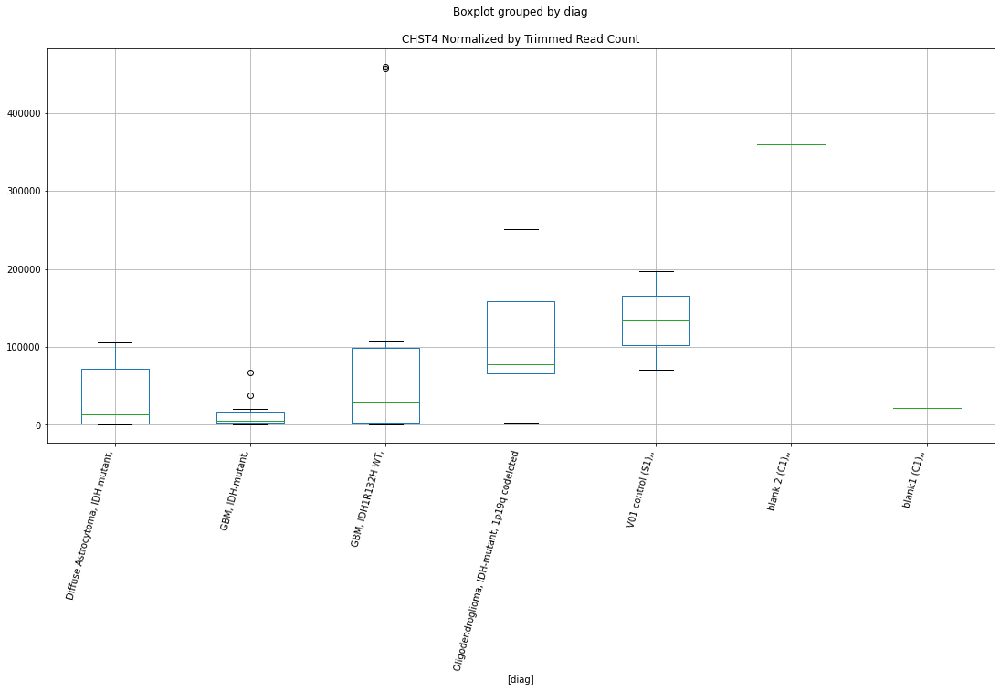

 p : 0.004323739652233338  ( t : 3.262593613281245 ) :  D-plex  :  cutadapt2  :  LOC105378969
Control and blanks
76     0.0
340    0.0
Name: LOC105378969, dtype: float64
208    529.08
Name: LOC105378969, dtype: float64
472    577.96
Name: LOC105378969, dtype: float64


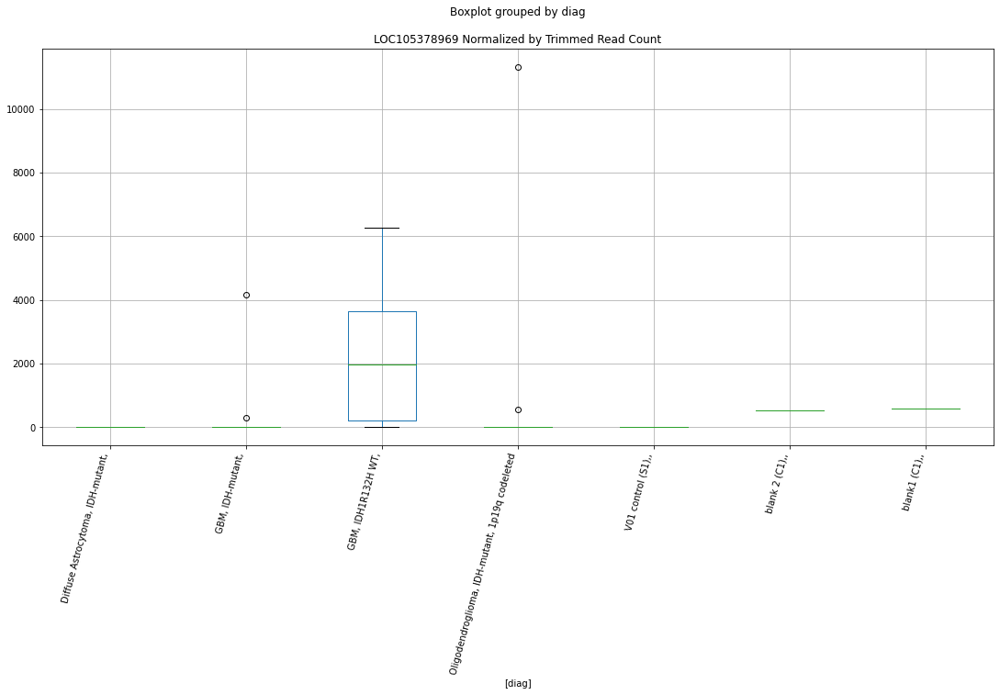

 p : 0.0043499962131949  ( t : 3.259846727025504 ) :  Lexogen  :  cutadapt2  :  MIR3591
Control and blanks
82     0.0
346    0.0
Name: MIR3591, dtype: float64
214    0.0
Name: MIR3591, dtype: float64
478    0.0
Name: MIR3591, dtype: float64


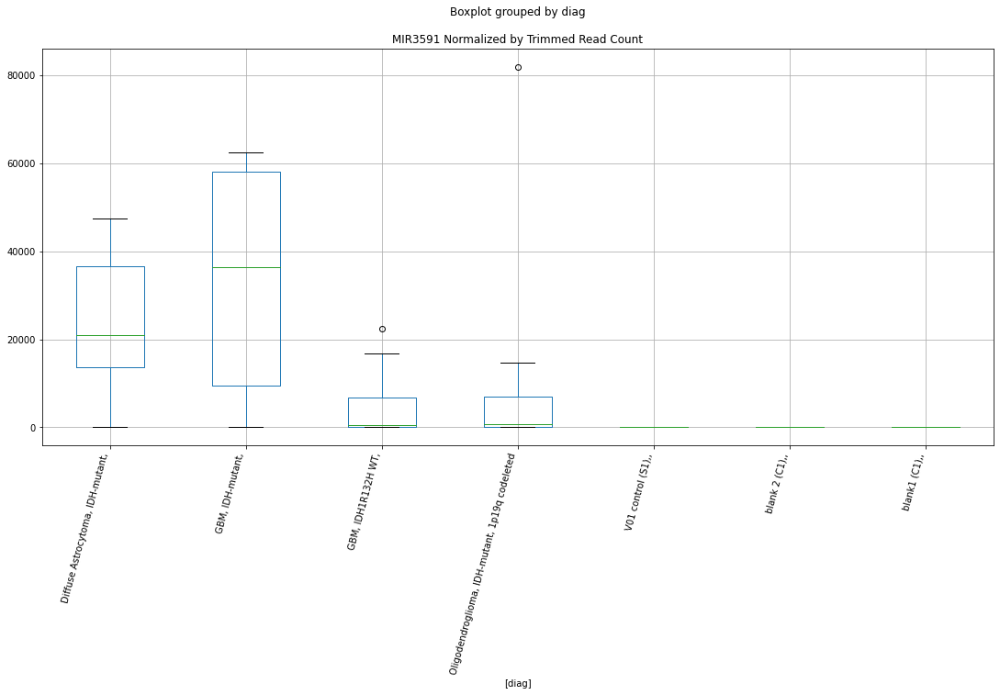

 p : 0.0043499962131949  ( t : 3.259846727025504 ) :  Lexogen  :  cutadapt2  :  MIR122
Control and blanks
82     0.0
346    0.0
Name: MIR122, dtype: float64
214    0.0
Name: MIR122, dtype: float64
478    0.0
Name: MIR122, dtype: float64


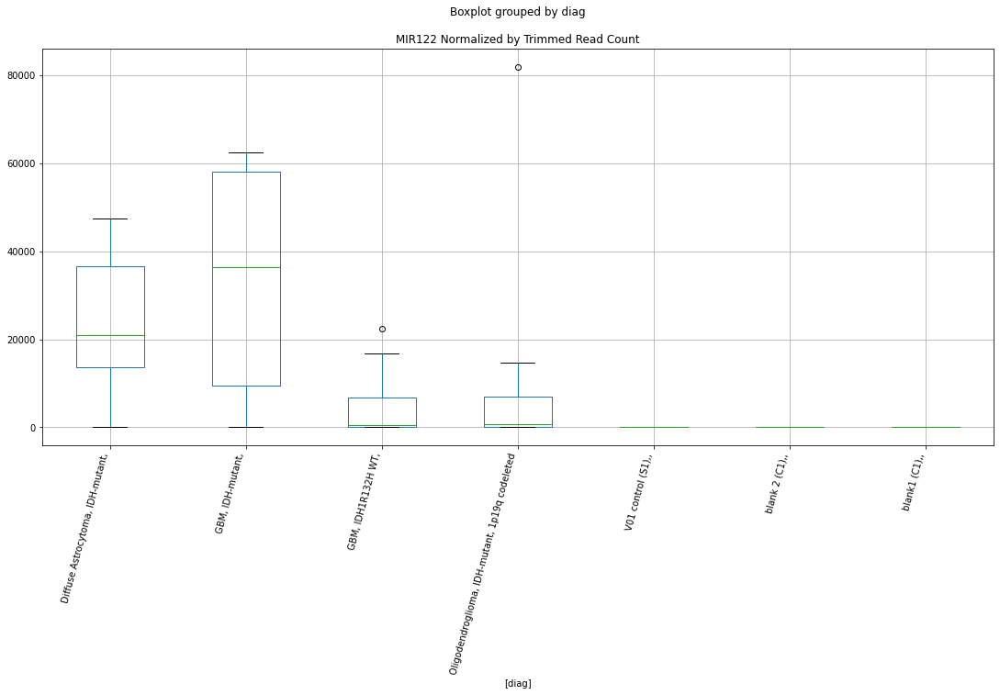

 p : 0.004440656406899215  ( t : 3.2504856657738217 ) :  D-plex  :  cutadapt2  :  IL6R
Control and blanks
76     7576.14
340       0.00
Name: IL6R, dtype: float64
208    5290.81
Name: IL6R, dtype: float64
472    3467.74
Name: IL6R, dtype: float64


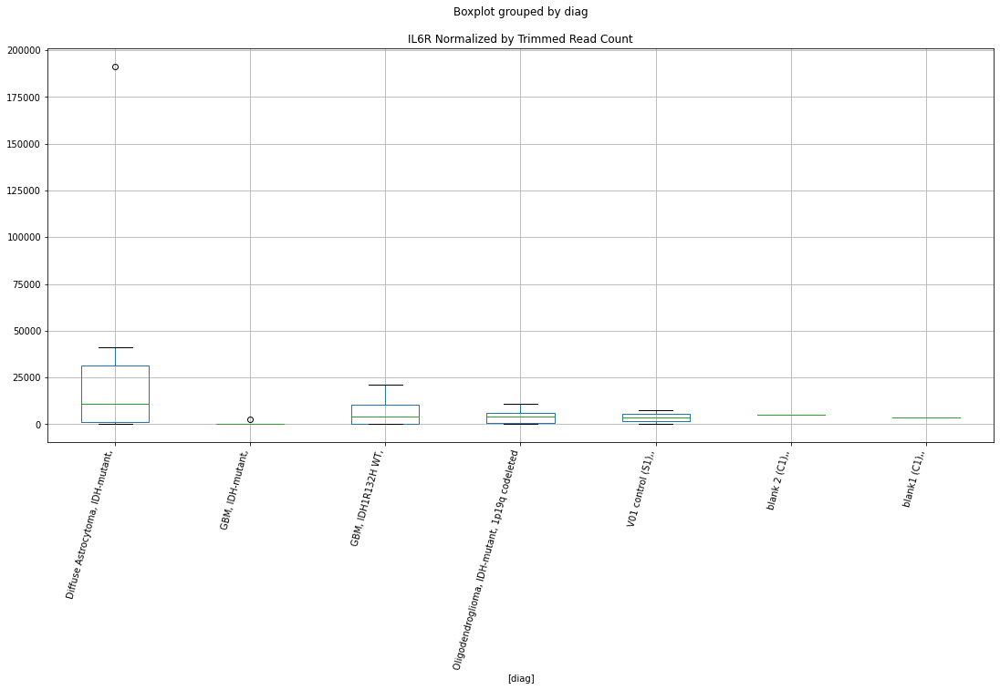

 p : 0.004444332823890503  ( t : 3.250110028750164 ) :  Lexogen  :  cutadapt2  :  CYREN
Control and blanks
82     0.0
346    0.0
Name: CYREN, dtype: float64
214    0.0
Name: CYREN, dtype: float64
478    0.0
Name: CYREN, dtype: float64


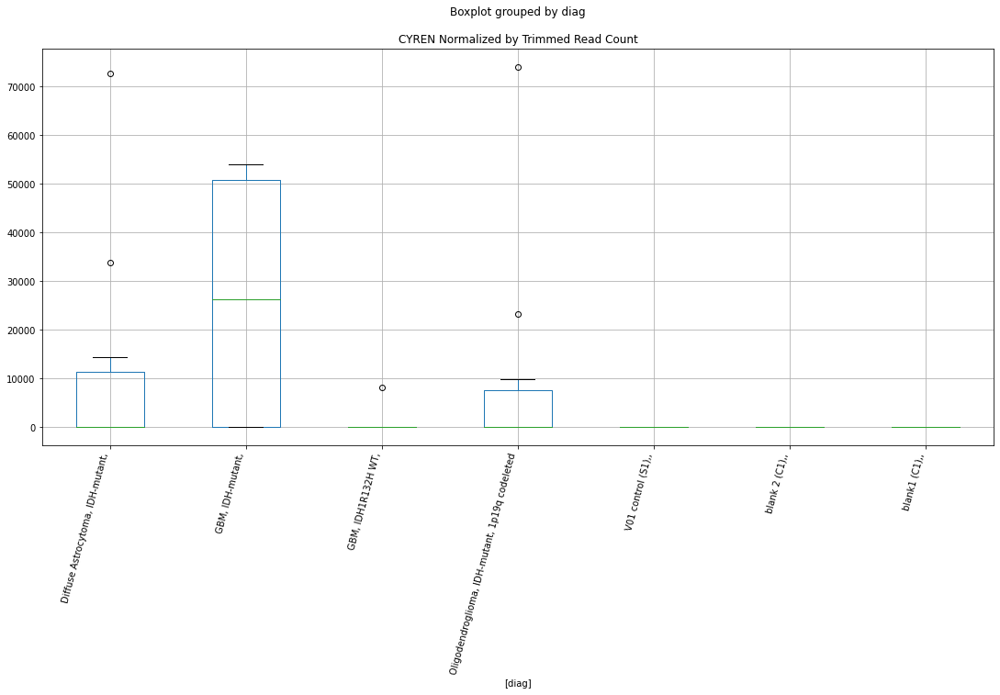

 p : 0.004454848065367489  ( t : 3.249037317434547 ) :  D-plex  :  bbduk2  :  LOC105375463
Control and blanks
73     0.0
337    0.0
Name: LOC105375463, dtype: float64
205    7342.73
Name: LOC105375463, dtype: float64
469    26027.2
Name: LOC105375463, dtype: float64


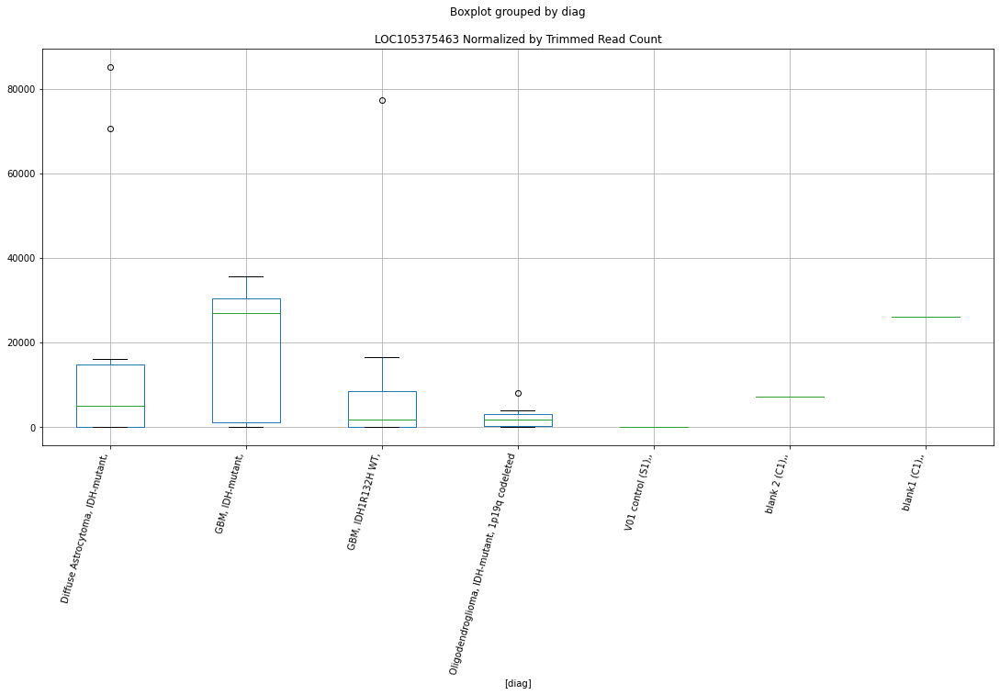

 p : 0.004475942241248392  ( t : 3.2468928684118556 ) :  D-plex  :  cutadapt2  :  TRHDE-AS1
Control and blanks
76     3030.46
340    1761.46
Name: TRHDE-AS1, dtype: float64
208    8112.57
Name: TRHDE-AS1, dtype: float64
472    1155.91
Name: TRHDE-AS1, dtype: float64


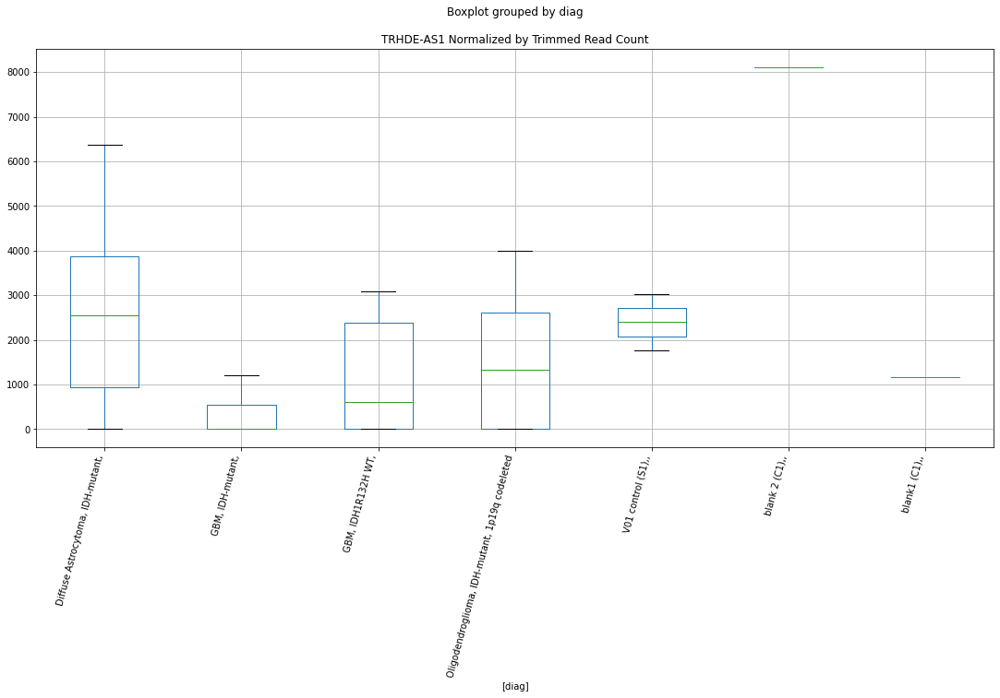

 p : 0.004492509235625432  ( t : 3.245215597038631 ) :  D-plex  :  bbduk2  :  DGKB
Control and blanks
73     0.0
337    0.0
Name: DGKB, dtype: float64
205    16118.19
Name: DGKB, dtype: float64
469    21886.51
Name: DGKB, dtype: float64


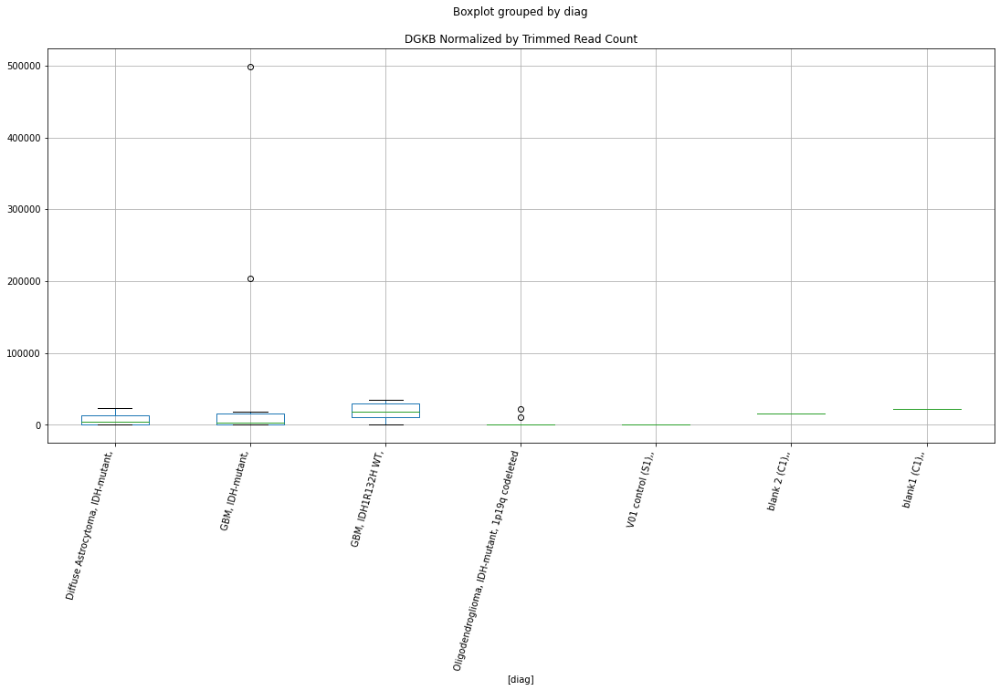

 p : 0.004494357805307385  ( t : 3.2450288211188987 ) :  D-plex  :  bbduk2  :  ANKRD45
Control and blanks
73     0.0
337    0.0
Name: ANKRD45, dtype: float64
205    1253.64
Name: ANKRD45, dtype: float64
469    2957.64
Name: ANKRD45, dtype: float64


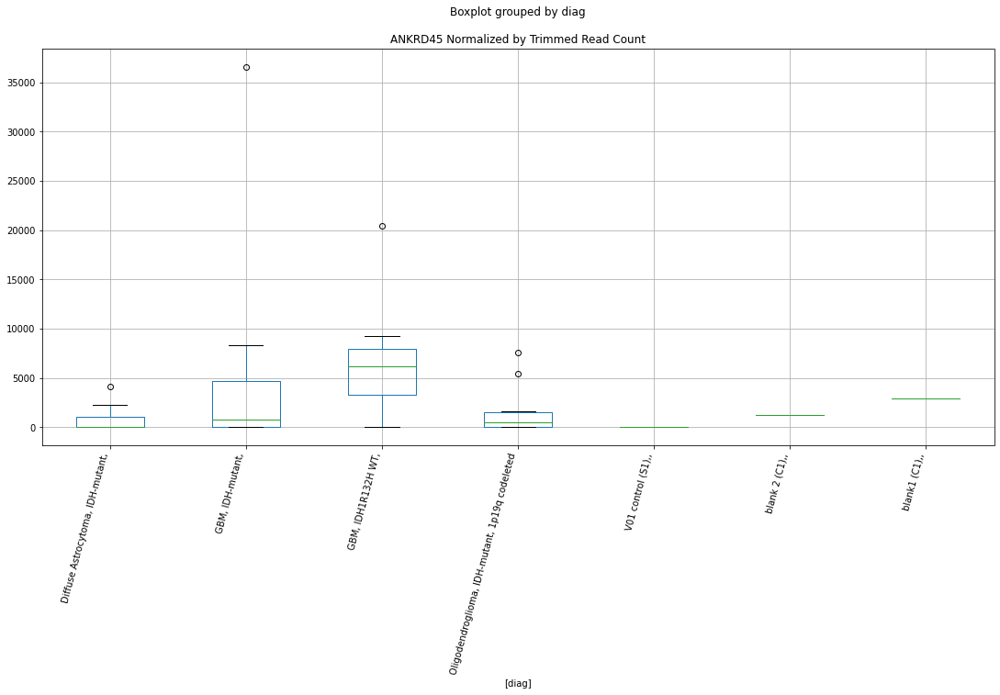

 p : 0.004509333840222108  ( t : 3.2435184442715874 ) :  D-plex  :  bbduk2  :  ERICH1
Control and blanks
73     7730.08
337     890.16
Name: ERICH1, dtype: float64
205    59816.38
Name: ERICH1, dtype: float64
469    53237.46
Name: ERICH1, dtype: float64


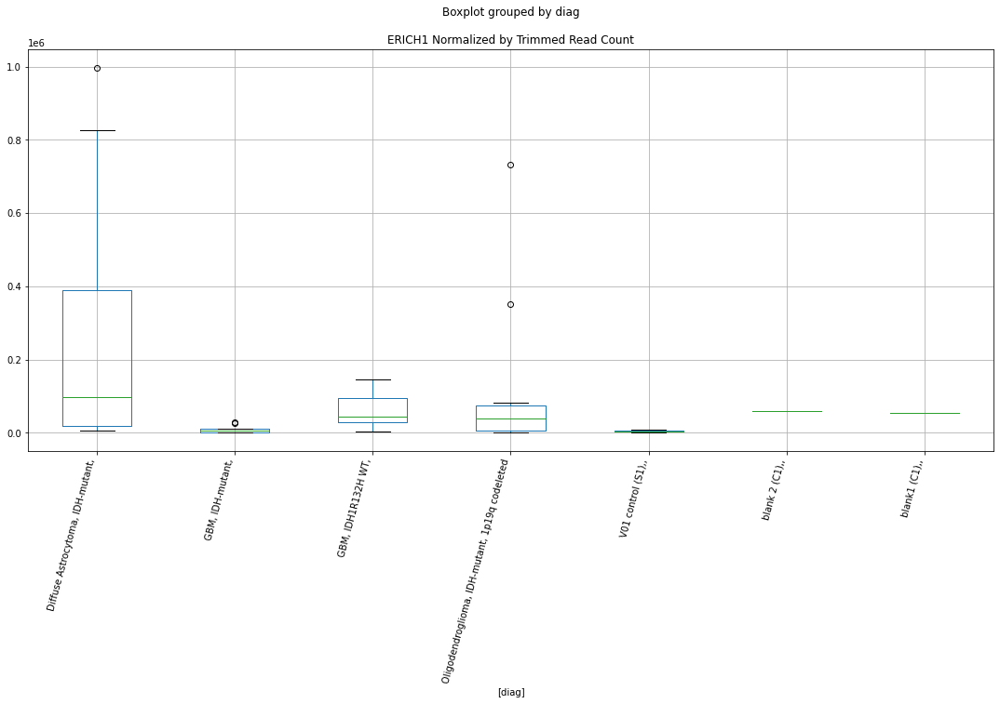

 p : 0.004537392040081109  ( t : 3.2407018931986022 ) :  D-plex  :  cutadapt2  :  TNFSF14
Control and blanks
76     9091.37
340       0.00
Name: TNFSF14, dtype: float64
208    16754.22
Name: TNFSF14, dtype: float64
472    16182.76
Name: TNFSF14, dtype: float64


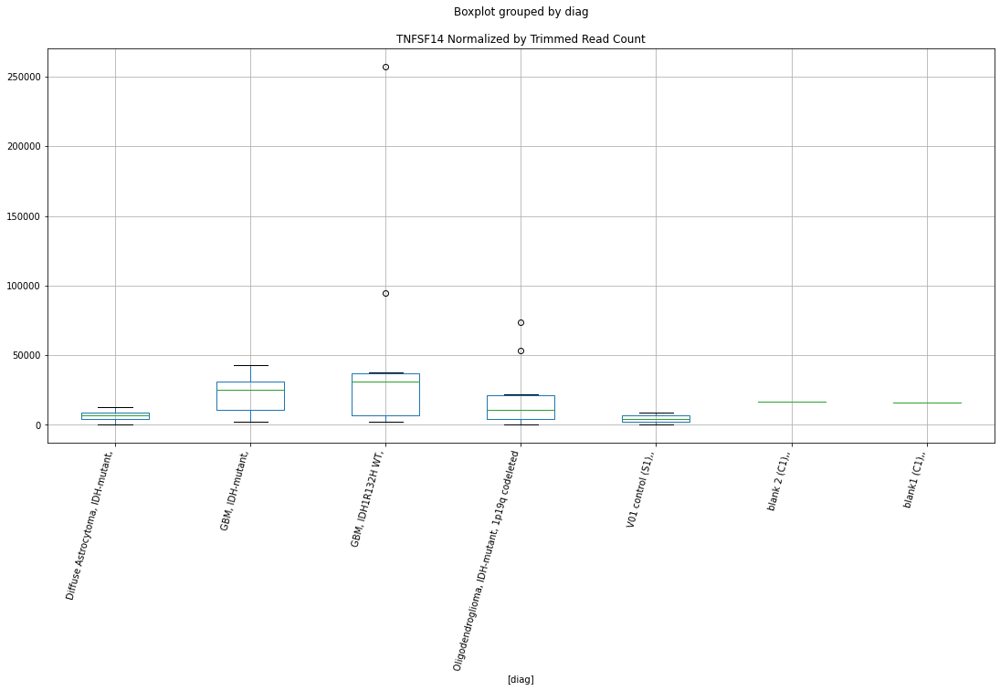

 p : 0.0046356831725478205  ( t : 3.23096817960373 ) :  Lexogen  :  bbduk2  :  CYREN
Control and blanks
79        0.00
343    1273.89
Name: CYREN, dtype: float64
211    0.0
Name: CYREN, dtype: float64
475    0.0
Name: CYREN, dtype: float64


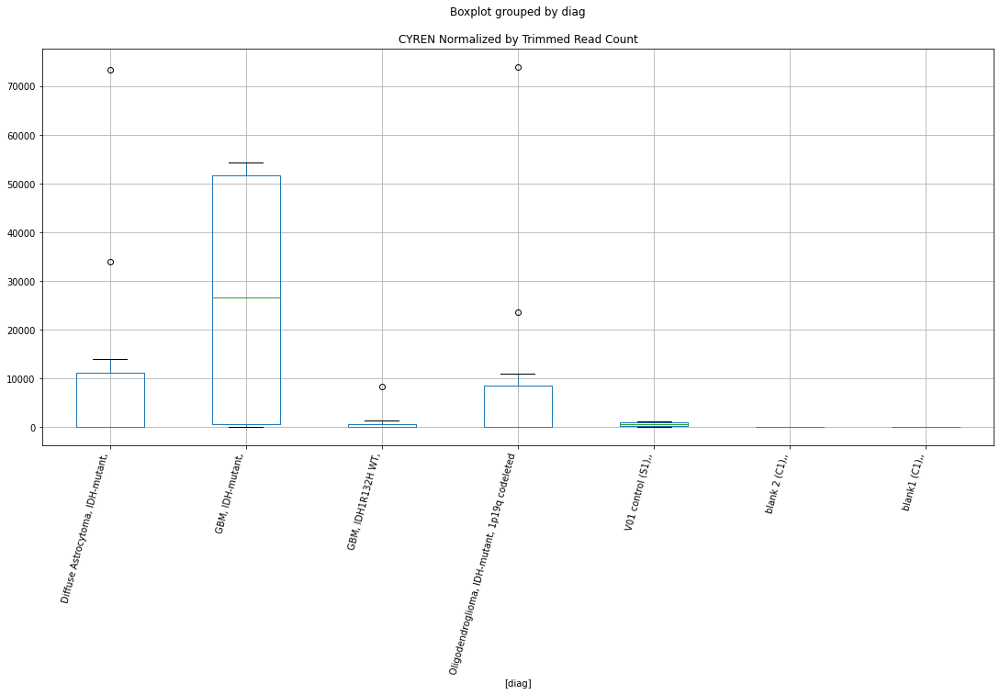

 p : 0.0046764676851414454  ( t : 3.2269885990379565 ) :  D-plex  :  cutadapt2  :  LGALS3
Control and blanks
76        0.0
340    2642.2
Name: LGALS3, dtype: float64
208    107403.37
Name: LGALS3, dtype: float64
472    889474.04
Name: LGALS3, dtype: float64


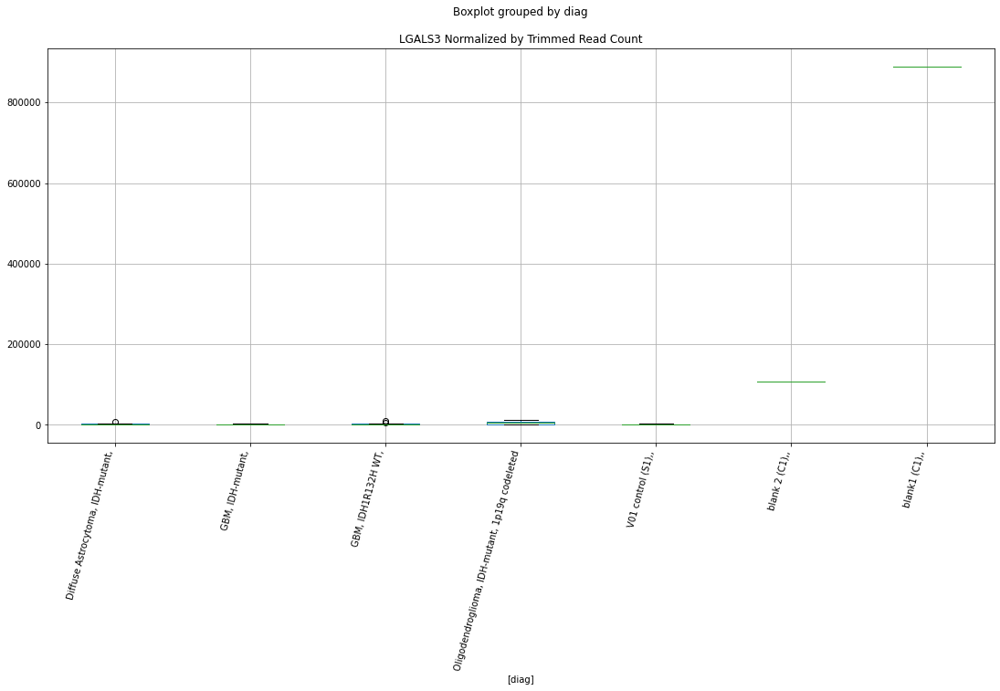

 p : 0.004678227883977361  ( t : 3.2268176132471815 ) :  D-plex  :  bbduk2  :  IL11
Control and blanks
73     0.0
337    0.0
Name: IL11, dtype: float64
205    1074.55
Name: IL11, dtype: float64
469    2366.11
Name: IL11, dtype: float64


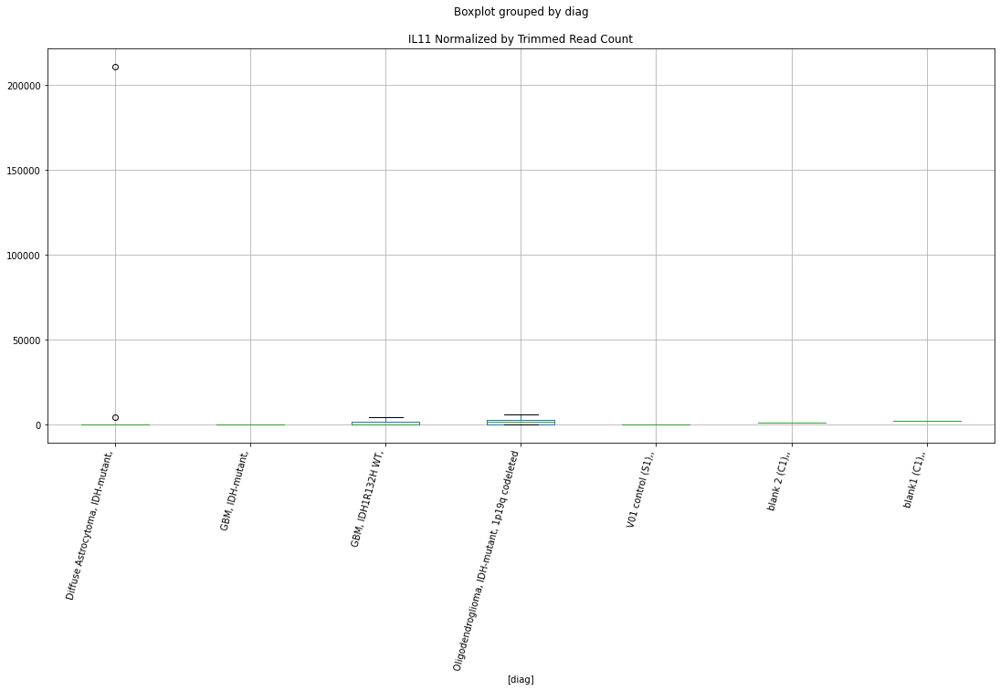

 p : 0.004696429746841266  ( t : 3.225053172714782 ) :  D-plex  :  bbduk2  :  LGALS3
Control and blanks
73        0.00
337    2670.47
Name: LGALS3, dtype: float64
205    109066.39
Name: LGALS3, dtype: float64
469    910360.54
Name: LGALS3, dtype: float64


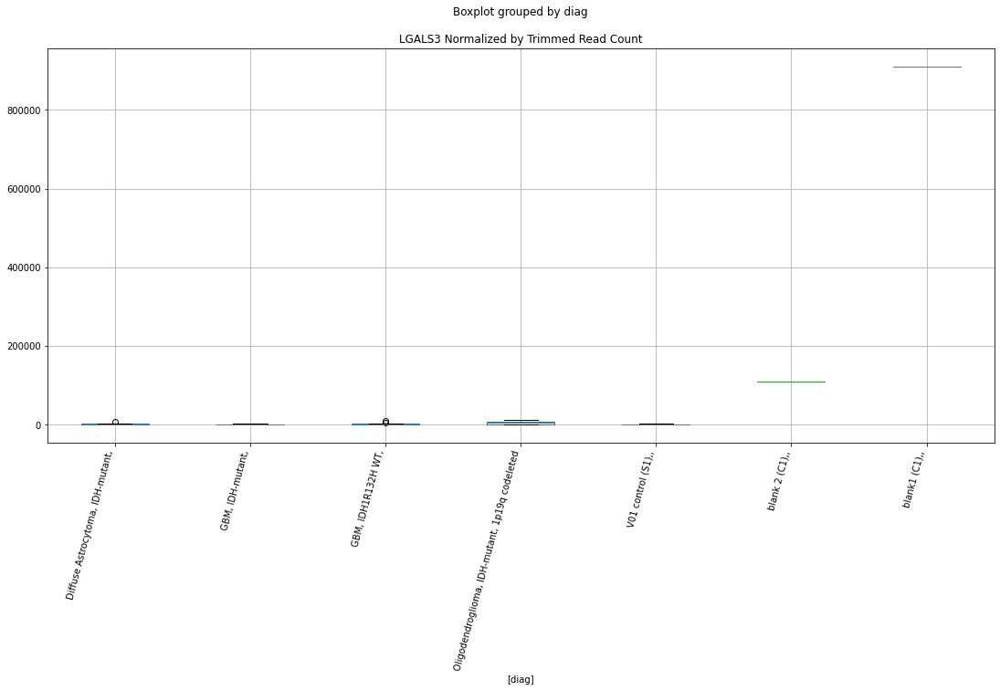

 p : 0.0047145277113498545  ( t : 3.2233054382017934 ) :  D-plex  :  bbduk2  :  NUPR1
Control and blanks
73     1546.02
337    7121.26
Name: NUPR1, dtype: float64
205    1790.91
Name: NUPR1, dtype: float64
469    2366.11
Name: NUPR1, dtype: float64


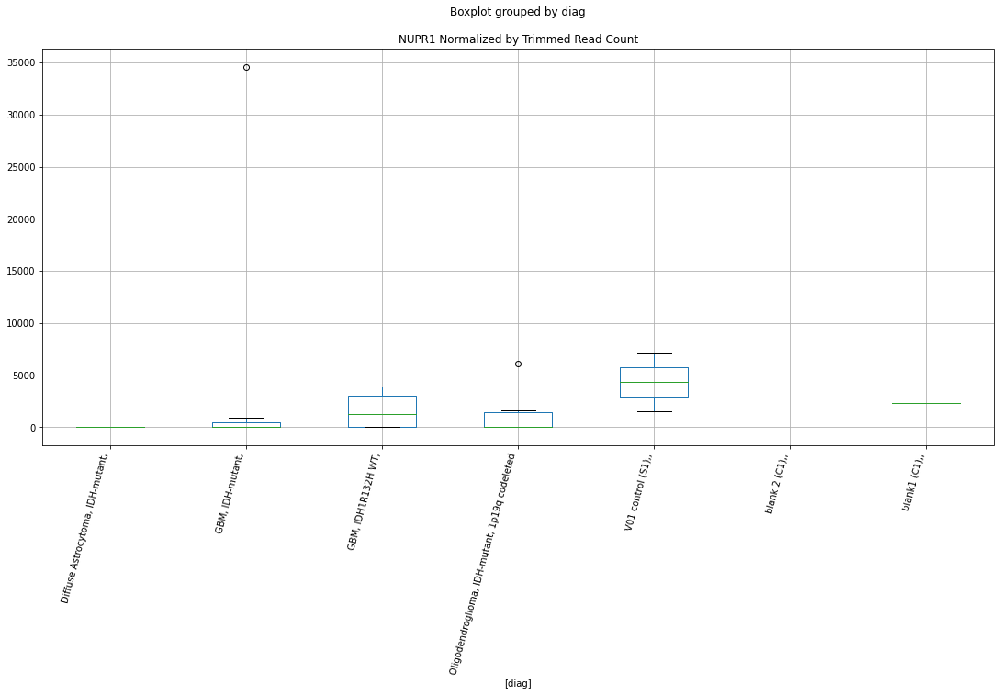

 p : 0.00472696018211038  ( t : 3.2221086316208756 ) :  D-plex  :  cutadapt2  :  PLEKHB1
Control and blanks
76     0.0
340    0.0
Name: PLEKHB1, dtype: float64
208    1234.52
Name: PLEKHB1, dtype: float64
472    4045.69
Name: PLEKHB1, dtype: float64


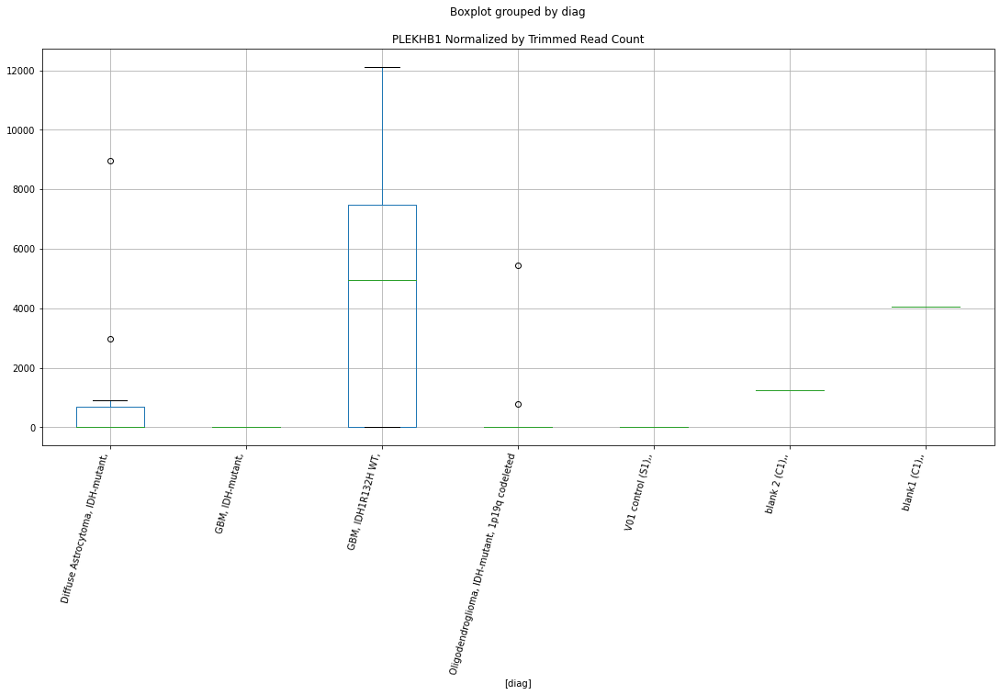

 p : 0.004737605782158649  ( t : 3.2210862871023744 ) :  D-plex  :  cutadapt2  :  PHF23
Control and blanks
76     0.0
340    0.0
Name: PHF23, dtype: float64
208    5819.89
Name: PHF23, dtype: float64
472    577.96
Name: PHF23, dtype: float64


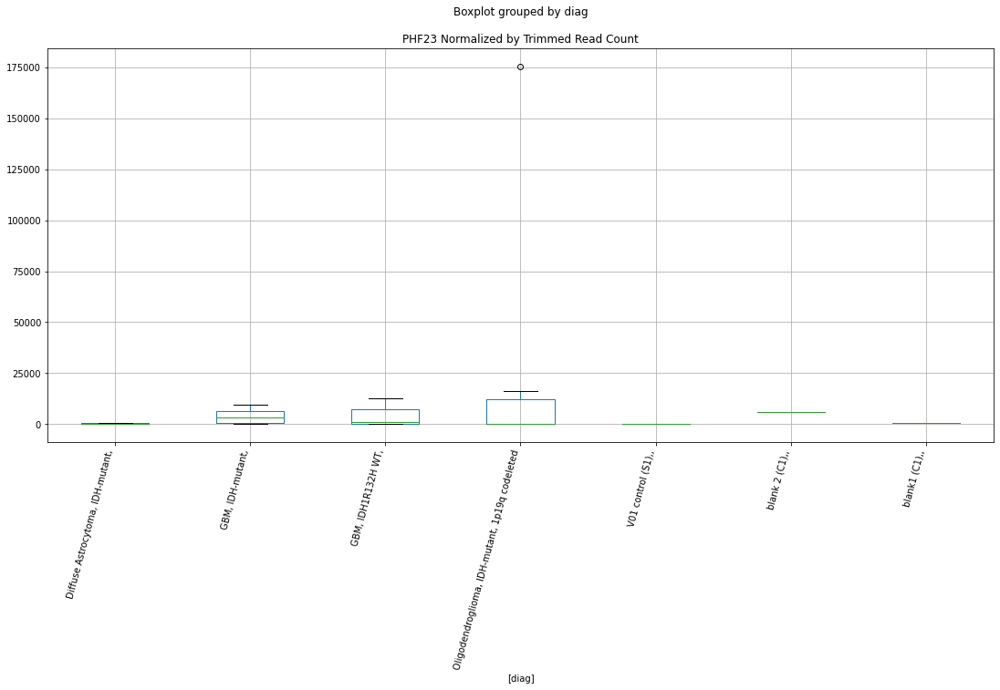

 p : 0.004891379073402271  ( t : 3.2065647298536213 ) :  Lexogen  :  cutadapt2  :  WHAMM
Control and blanks
82         0.00
346    40403.43
Name: WHAMM, dtype: float64
214    0.0
Name: WHAMM, dtype: float64
478    0.0
Name: WHAMM, dtype: float64


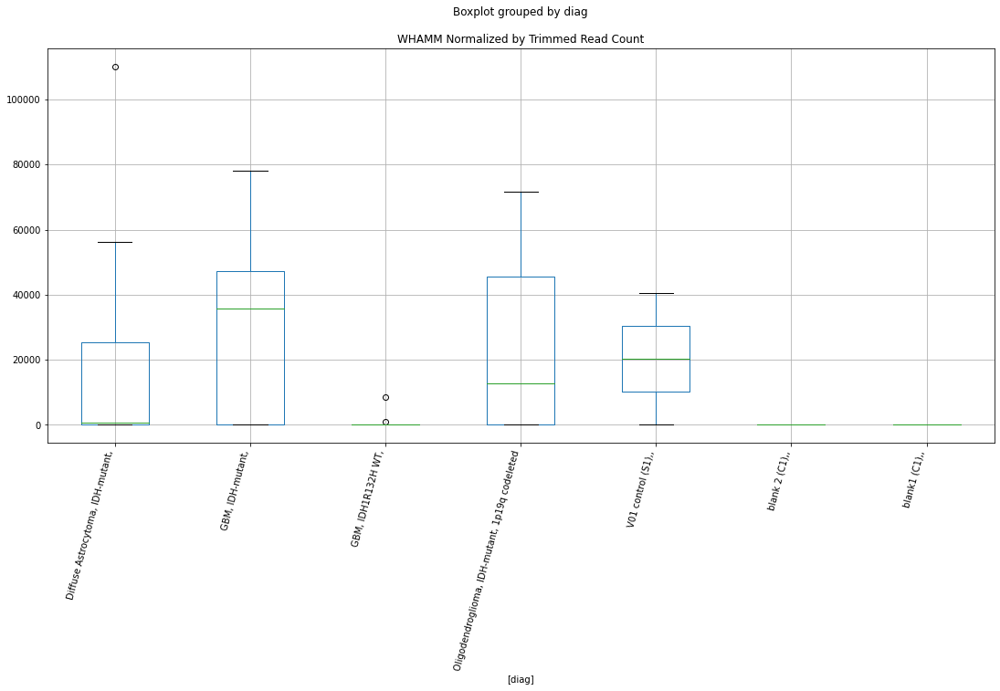

 p : 0.004943746199355224  ( t : 3.2017213794557895 ) :  D-plex  :  cutadapt2  :  ERICH1
Control and blanks
76     10606.60
340      880.73
Name: ERICH1, dtype: float64
208    56611.63
Name: ERICH1, dtype: float64
472    52016.03
Name: ERICH1, dtype: float64


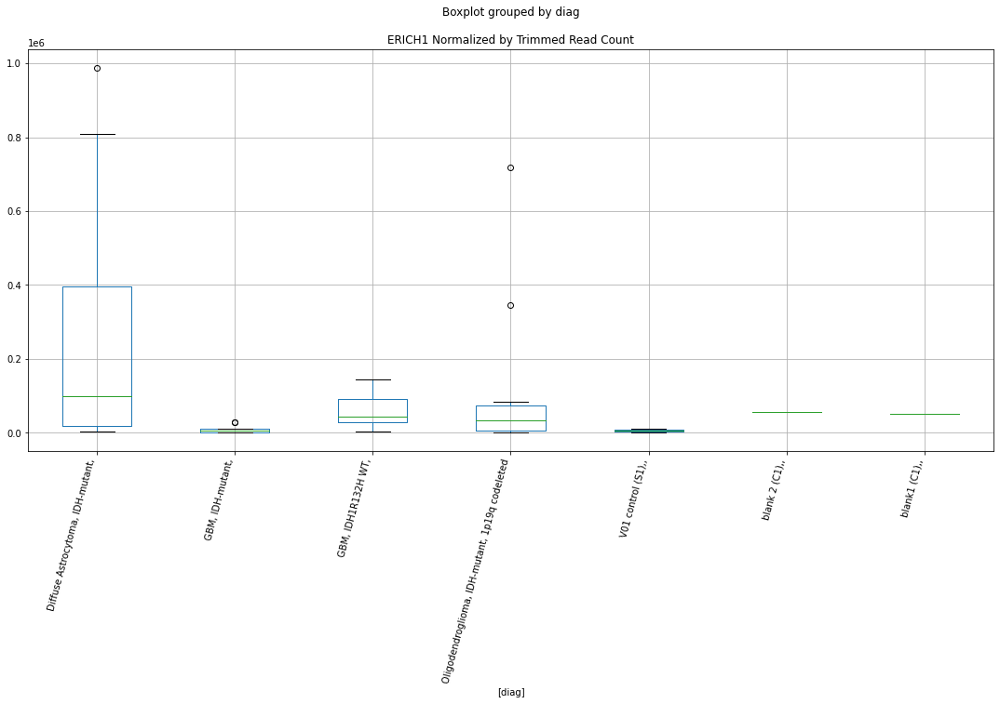

 p : 0.004958264612241042  ( t : 3.2003874911605426 ) :  Lexogen  :  bbduk2  :  TMEM45A
Control and blanks
79     0.0
343    0.0
Name: TMEM45A, dtype: float64
211    0.0
Name: TMEM45A, dtype: float64
475    0.0
Name: TMEM45A, dtype: float64


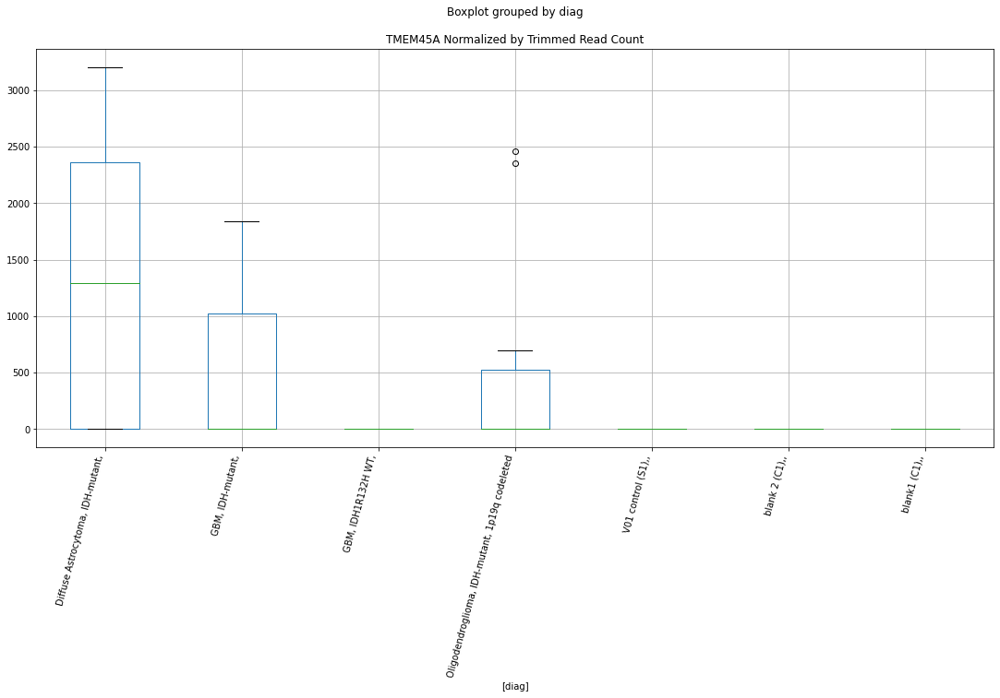

 p : 0.00497032970333646  ( t : 3.199281910474588 ) :  Lexogen  :  cutadapt2  :  LOC105375322
Control and blanks
82     0.0
346    0.0
Name: LOC105375322, dtype: float64
214    2712.26
Name: LOC105375322, dtype: float64
478    0.0
Name: LOC105375322, dtype: float64


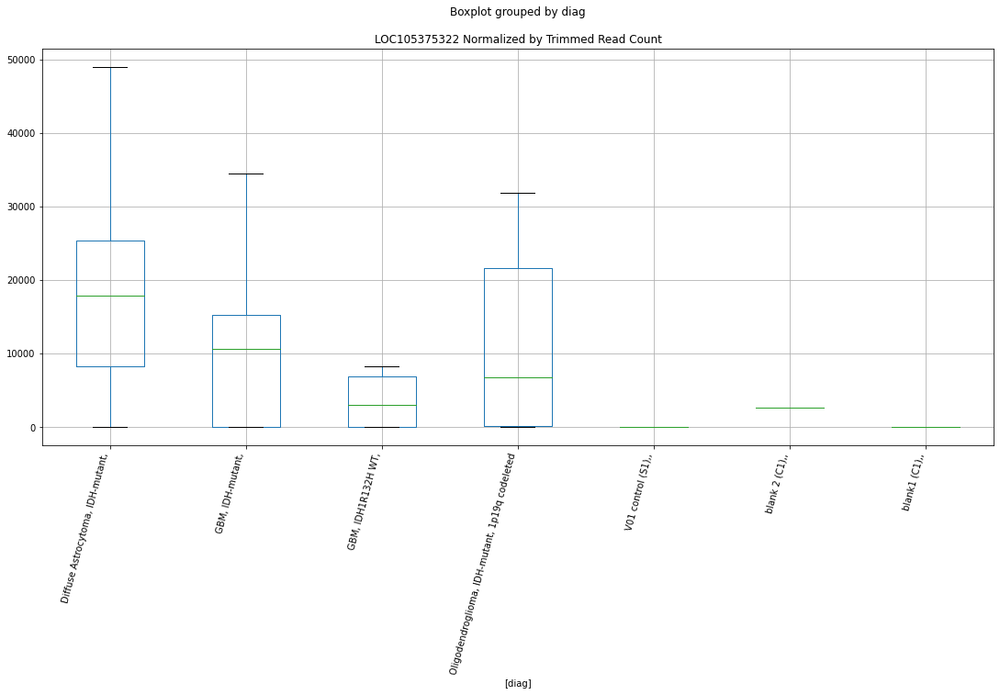

 p : 0.005017548992171758  ( t : 3.1949801106177524 ) :  Lexogen  :  bbduk2  :  WHAMM
Control and blanks
79         0.00
343    40764.35
Name: WHAMM, dtype: float64
211    0.0
Name: WHAMM, dtype: float64
475    0.0
Name: WHAMM, dtype: float64


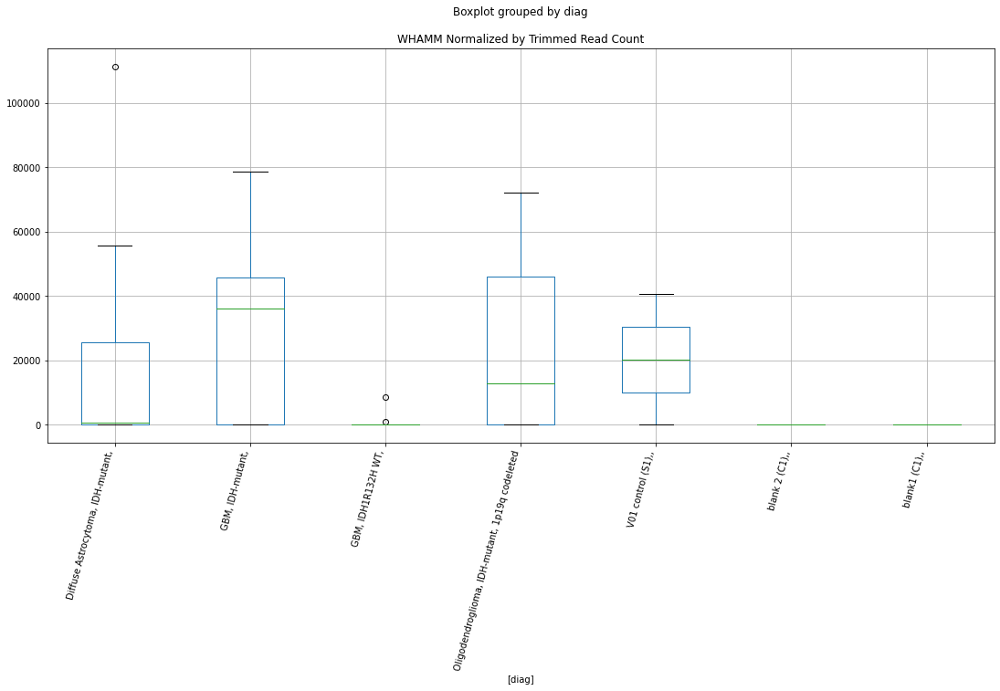

 p : 0.00508522864579147  ( t : 3.188882944429498 ) :  Lexogen  :  cutadapt2  :  CHRD
Control and blanks
82     0.0
346    0.0
Name: CHRD, dtype: float64
214    5153.3
Name: CHRD, dtype: float64
478    0.0
Name: CHRD, dtype: float64


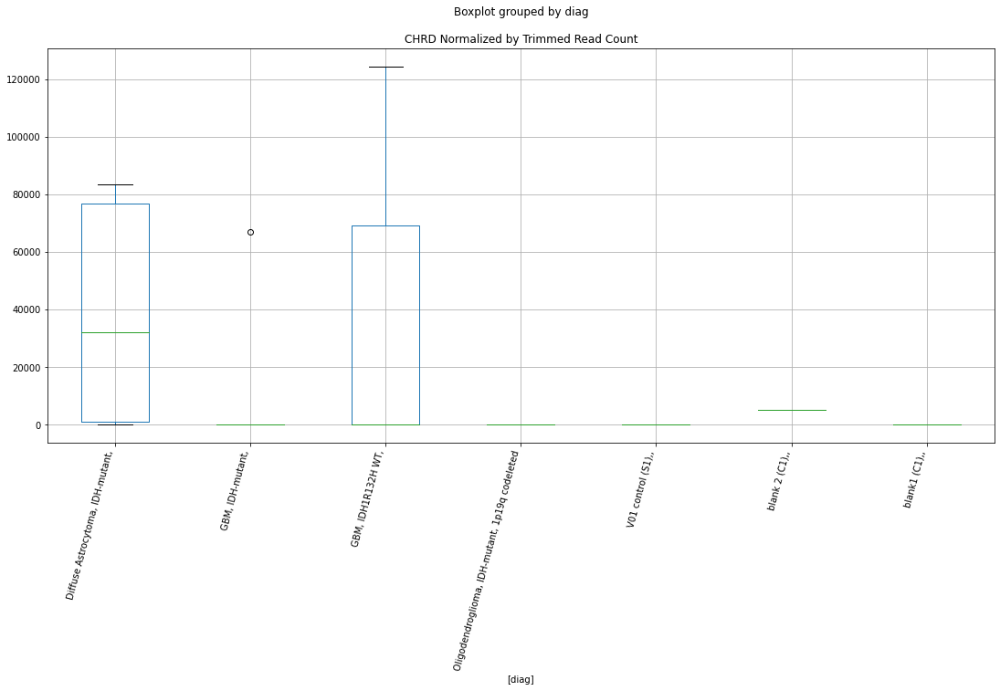

 p : 0.005126408537855493  ( t : 3.185211859885432 ) :  D-plex  :  bbduk2  :  PTPRCAP
Control and blanks
73      8503.09
337    98807.46
Name: PTPRCAP, dtype: float64
205    30803.64
Name: PTPRCAP, dtype: float64
469    334212.93
Name: PTPRCAP, dtype: float64


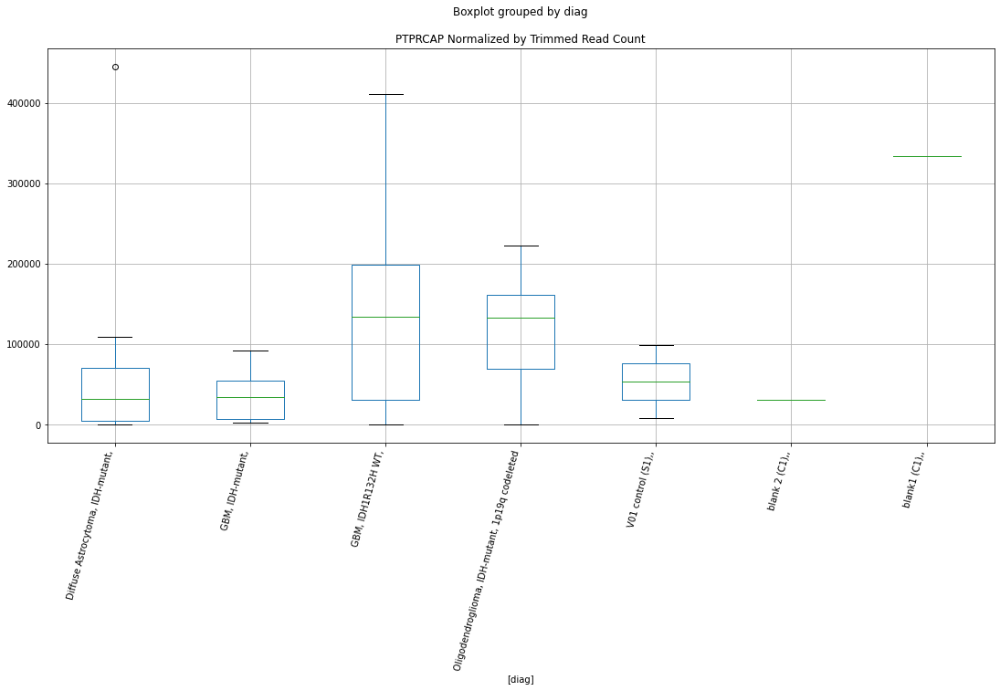

 p : 0.005142296025566482  ( t : 3.183803241232318 ) :  D-plex  :  bbduk2  :  RASSF9
Control and blanks
73     3092.03
337       0.00
Name: RASSF9, dtype: float64
205    2328.18
Name: RASSF9, dtype: float64
469    7098.33
Name: RASSF9, dtype: float64


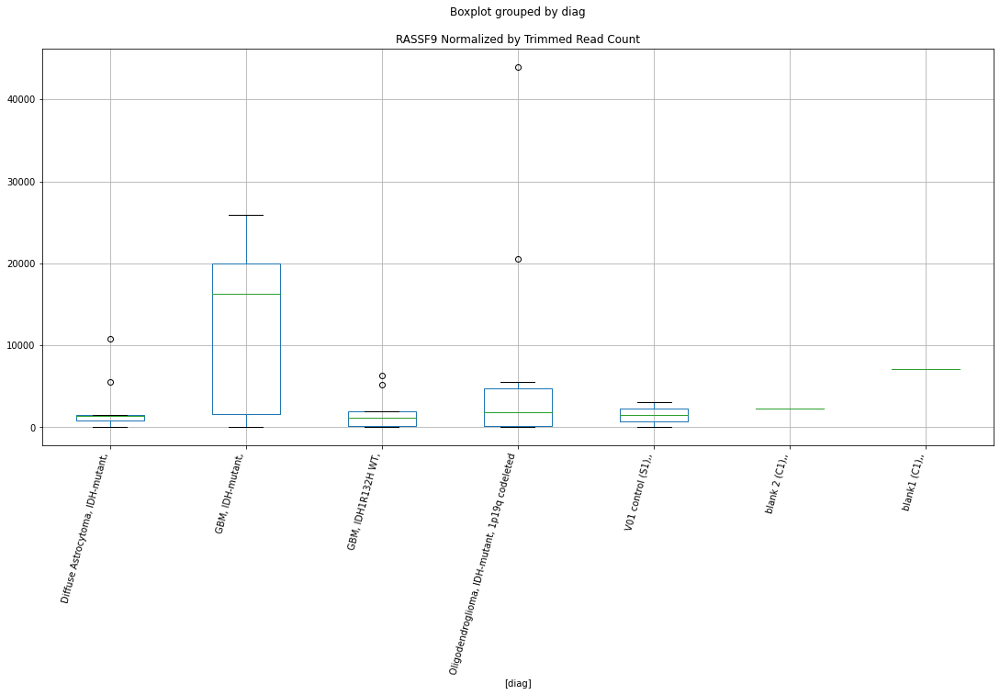

 p : 0.005152996590899288  ( t : 3.1828569047501167 ) :  D-plex  :  cutadapt2  :  TSPYL5
Control and blanks
76     757.61
340      0.00
Name: TSPYL5, dtype: float64
208    352.72
Name: TSPYL5, dtype: float64
472    0.0
Name: TSPYL5, dtype: float64


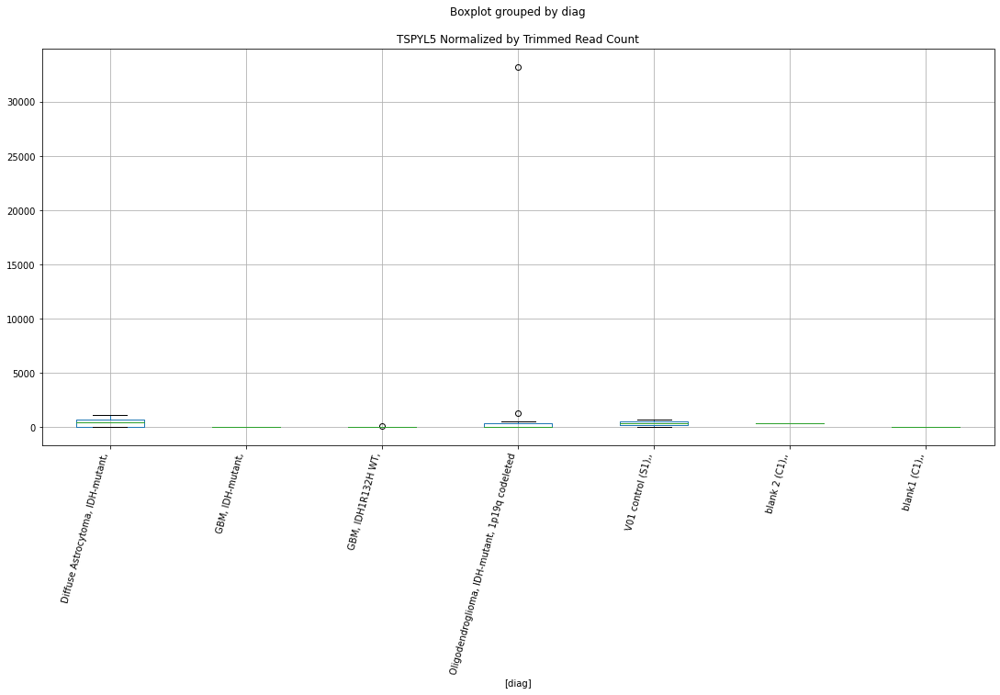

 p : 0.005164551245738267  ( t : 3.1818371915486847 ) :  D-plex  :  cutadapt2  :  PTPRCAP
Control and blanks
76      8333.76
340    97761.27
Name: PTPRCAP, dtype: float64
208    30333.96
Name: PTPRCAP, dtype: float64
472    327700.96
Name: PTPRCAP, dtype: float64


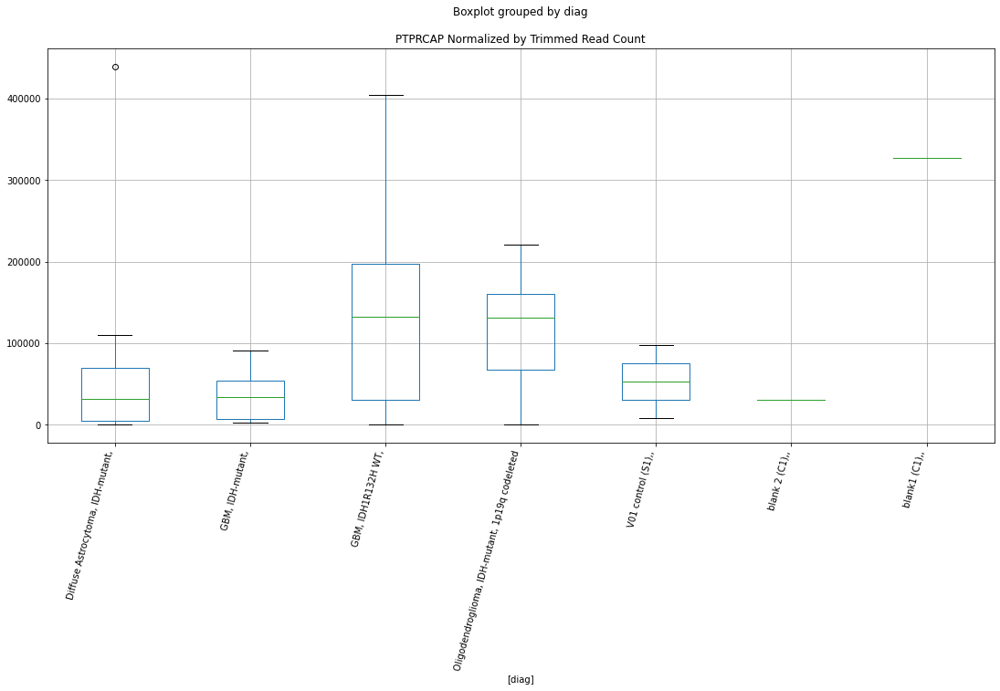

 p : 0.0051930138357907  ( t : 3.1793348240010566 ) :  D-plex  :  bbduk2  :  GJA8
Control and blanks
73     0.0
337    0.0
Name: GJA8, dtype: float64
205    895.45
Name: GJA8, dtype: float64
469    591.53
Name: GJA8, dtype: float64


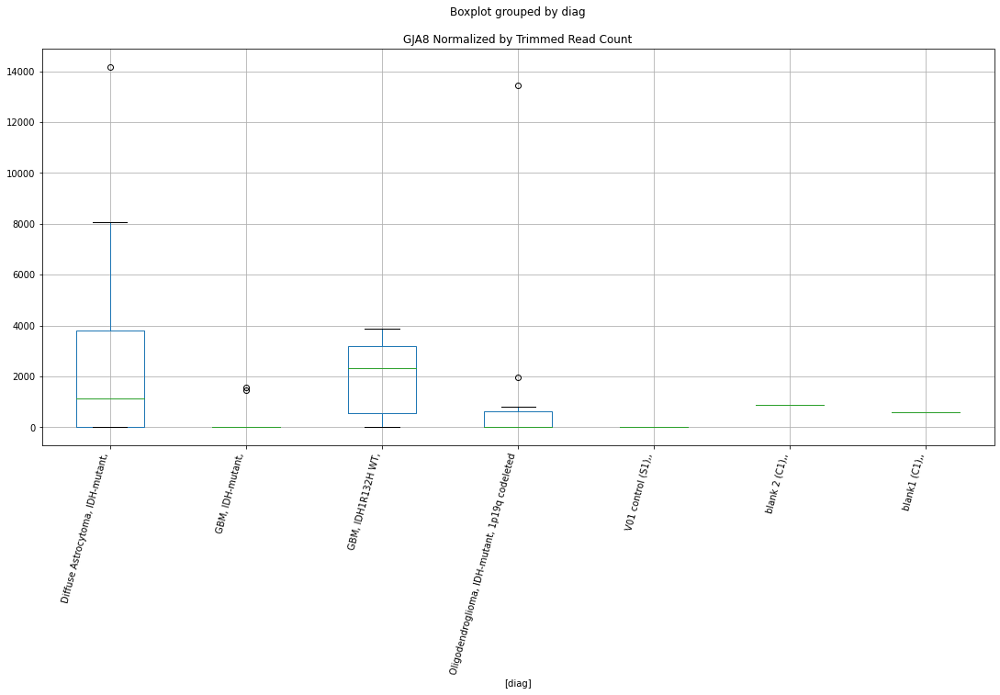

 p : 0.00520022113917785  ( t : 3.178703303581385 ) :  D-plex  :  cutadapt2  :  LOC112268020
Control and blanks
76         0.00
340    17614.64
Name: LOC112268020, dtype: float64
208    352.72
Name: LOC112268020, dtype: float64
472    1733.87
Name: LOC112268020, dtype: float64


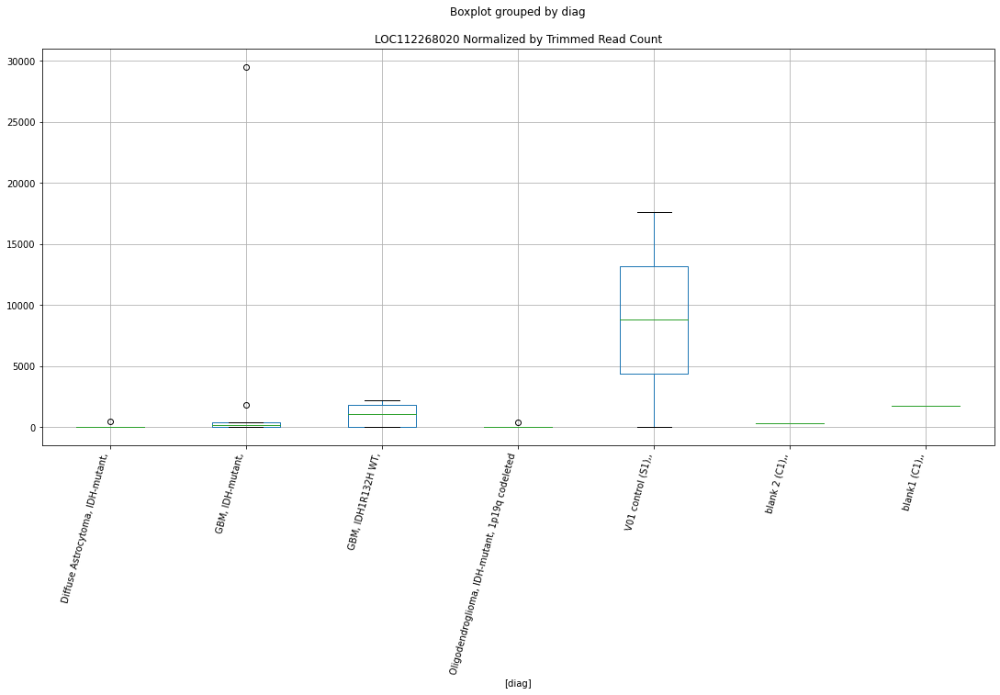

 p : 0.00527853251139948  ( t : 3.1718961585759344 ) :  D-plex  :  bbduk2  :  CORO1B
Control and blanks
73     25509.28
337    98807.46
Name: CORO1B, dtype: float64
205    31161.83
Name: CORO1B, dtype: float64
469    335987.52
Name: CORO1B, dtype: float64


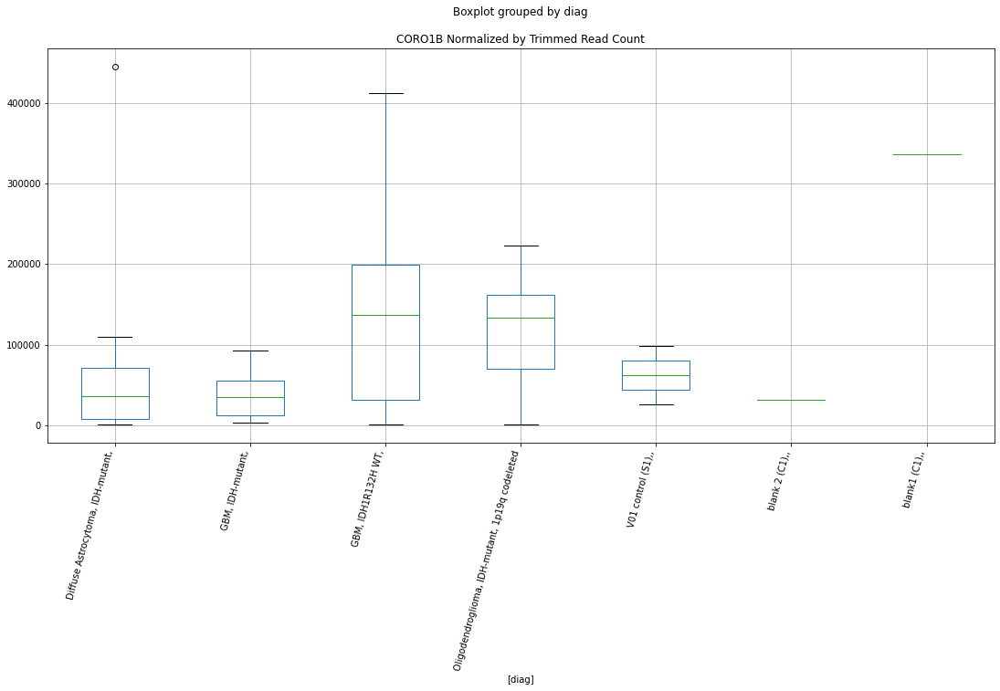

 p : 0.0053050434874177725  ( t : 3.1696140838157216 ) :  D-plex  :  cutadapt2  :  CORO1B
Control and blanks
76     20455.58
340    97761.27
Name: CORO1B, dtype: float64
208    30510.32
Name: CORO1B, dtype: float64
472    328856.87
Name: CORO1B, dtype: float64


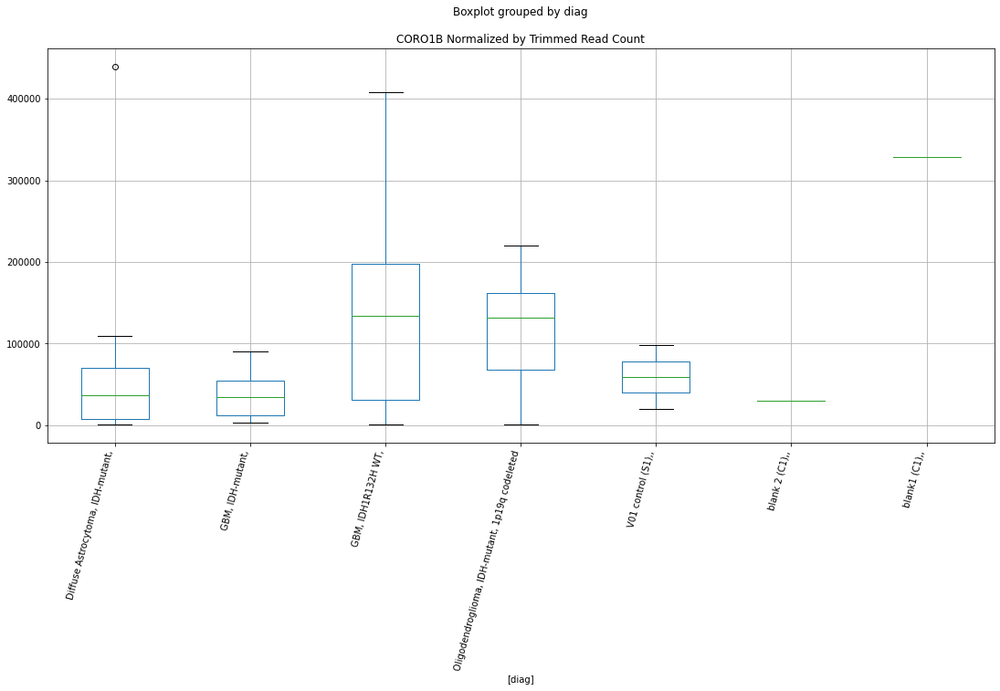

 p : 0.005355528850120216  ( t : 3.1652989662243627 ) :  D-plex  :  bbduk2  :  LOC112268020
Control and blanks
73         0.00
337    17803.15
Name: LOC112268020, dtype: float64
205    358.18
Name: LOC112268020, dtype: float64
469    1774.58
Name: LOC112268020, dtype: float64


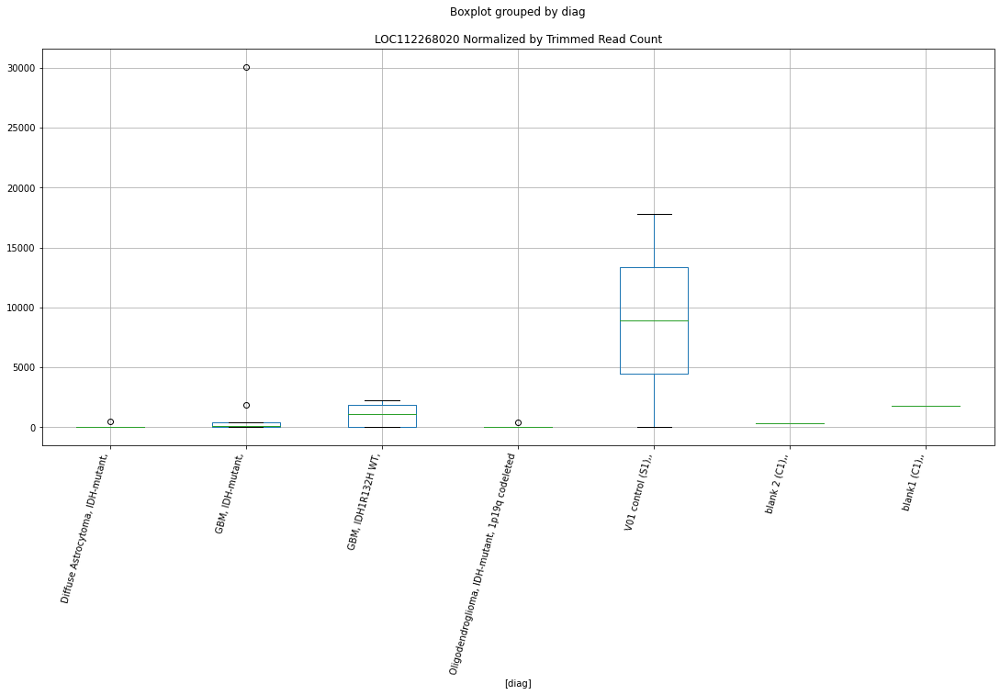

 p : 0.005419787524949166  ( t : 3.159863789539093 ) :  D-plex  :  cutadapt2  :  TRIP6
Control and blanks
76     0.0
340    0.0
Name: TRIP6, dtype: float64
208    2116.32
Name: TRIP6, dtype: float64
472    1155.91
Name: TRIP6, dtype: float64


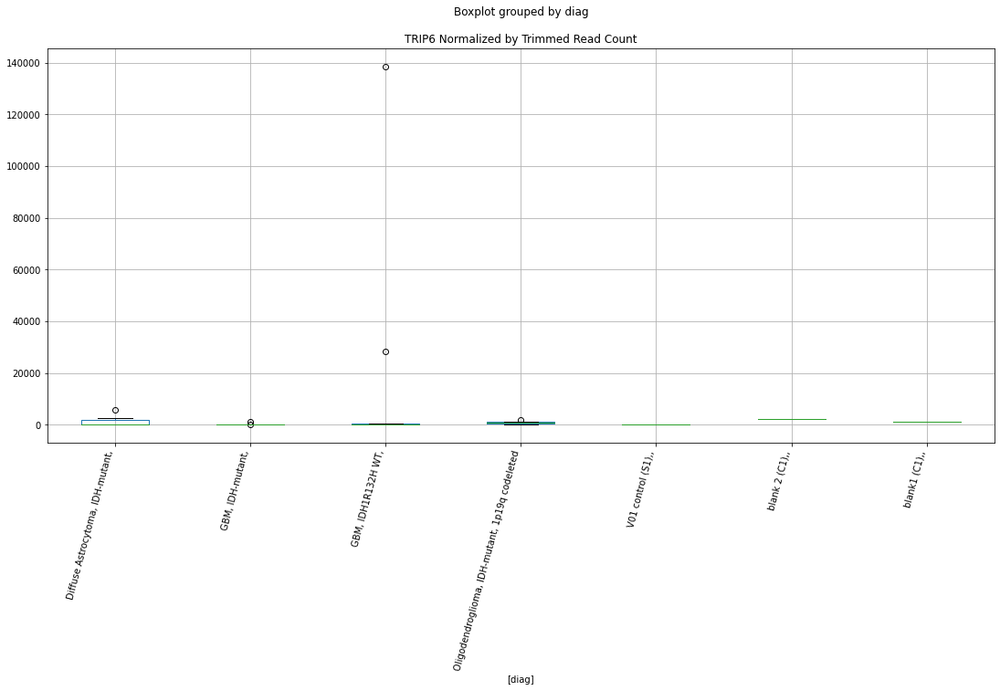

 p : 0.005429416400926915  ( t : 3.159054785696568 ) :  Lexogen  :  bbduk2  :  HOXB7
Control and blanks
79         0.00
343    10191.09
Name: HOXB7, dtype: float64
211    0.0
Name: HOXB7, dtype: float64
475    0.0
Name: HOXB7, dtype: float64


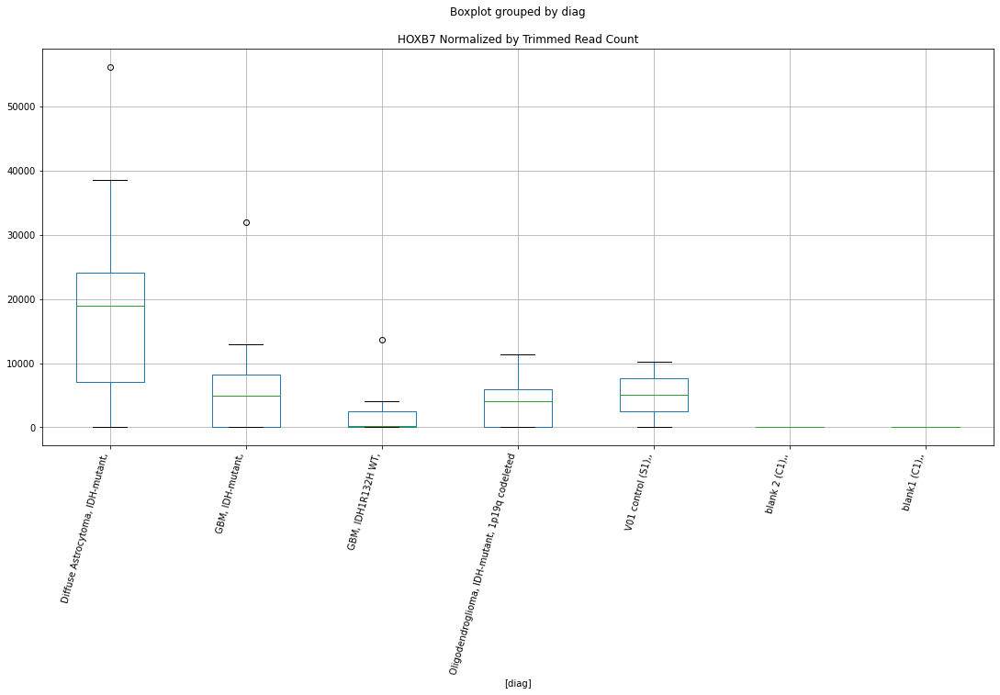

 p : 0.005437502442627451  ( t : 3.15837649140768 ) :  D-plex  :  bbduk2  :  LOC105379549
Control and blanks
73      773.01
337    3560.63
Name: LOC105379549, dtype: float64
205    3940.0
Name: LOC105379549, dtype: float64
469    1774.58
Name: LOC105379549, dtype: float64


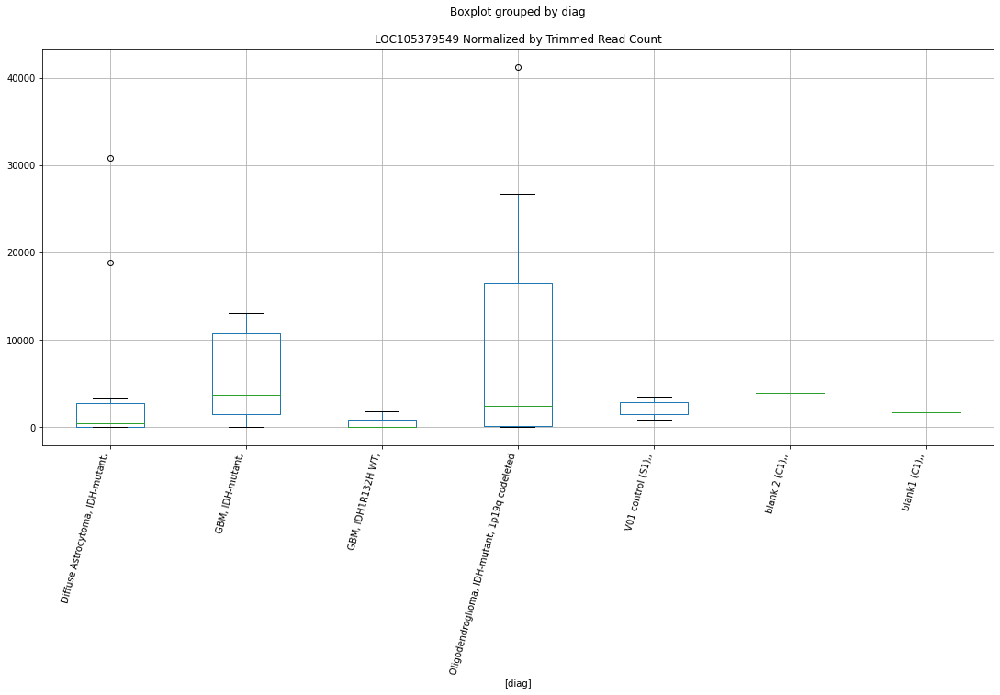

 p : 0.005482068842985575  ( t : 3.1546556623436626 ) :  D-plex  :  cutadapt2  :  CYP27B1
Control and blanks
76     0.0
340    0.0
Name: CYP27B1, dtype: float64
208    176.36
Name: CYP27B1, dtype: float64
472    1155.91
Name: CYP27B1, dtype: float64


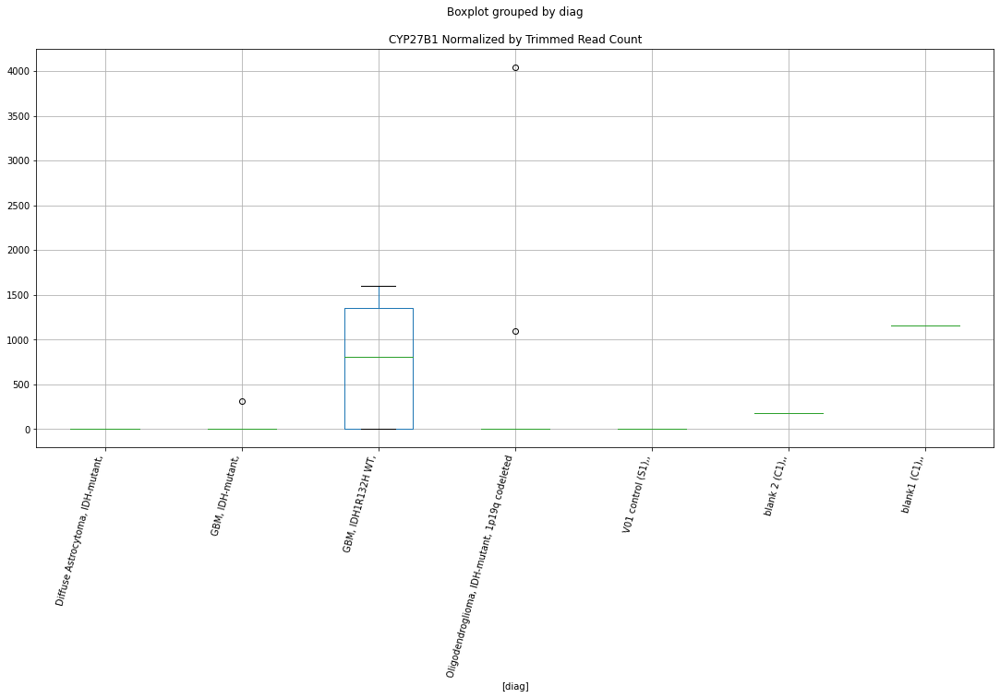

 p : 0.005496705561595507  ( t : 3.1534400974123518 ) :  D-plex  :  cutadapt2  :  LOC105377272
Control and blanks
76     0.0
340    0.0
Name: LOC105377272, dtype: float64
208    352.72
Name: LOC105377272, dtype: float64
472    1155.91
Name: LOC105377272, dtype: float64


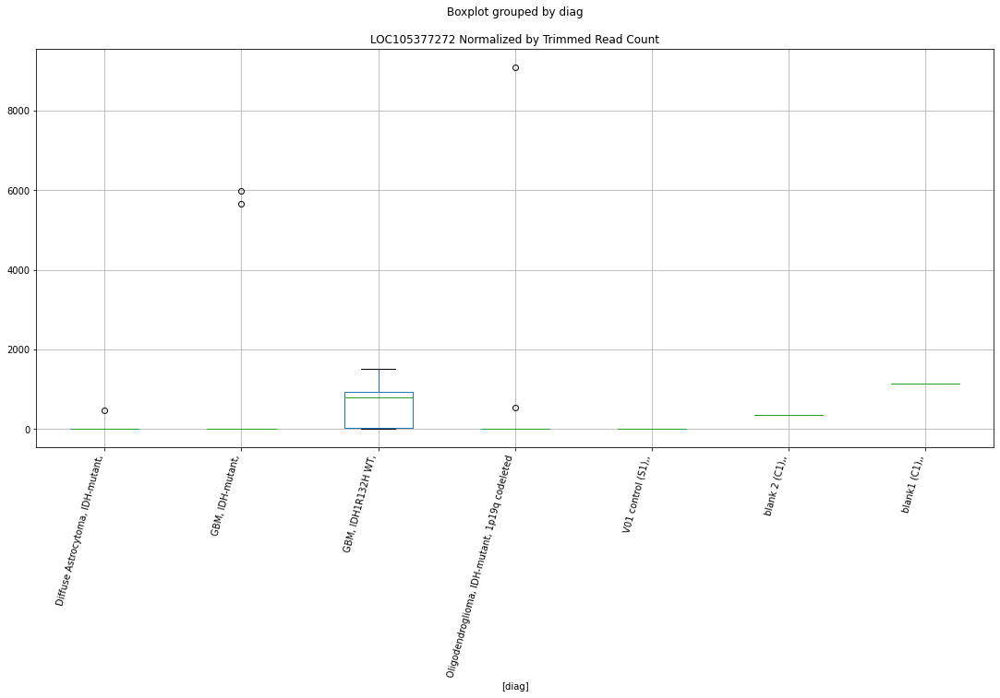

 p : 0.005500590141143207  ( t : 3.1531180182371883 ) :  Lexogen  :  cutadapt2  :  HOXB7
Control and blanks
82         0.00
346    10100.86
Name: HOXB7, dtype: float64
214    0.0
Name: HOXB7, dtype: float64
478    0.0
Name: HOXB7, dtype: float64


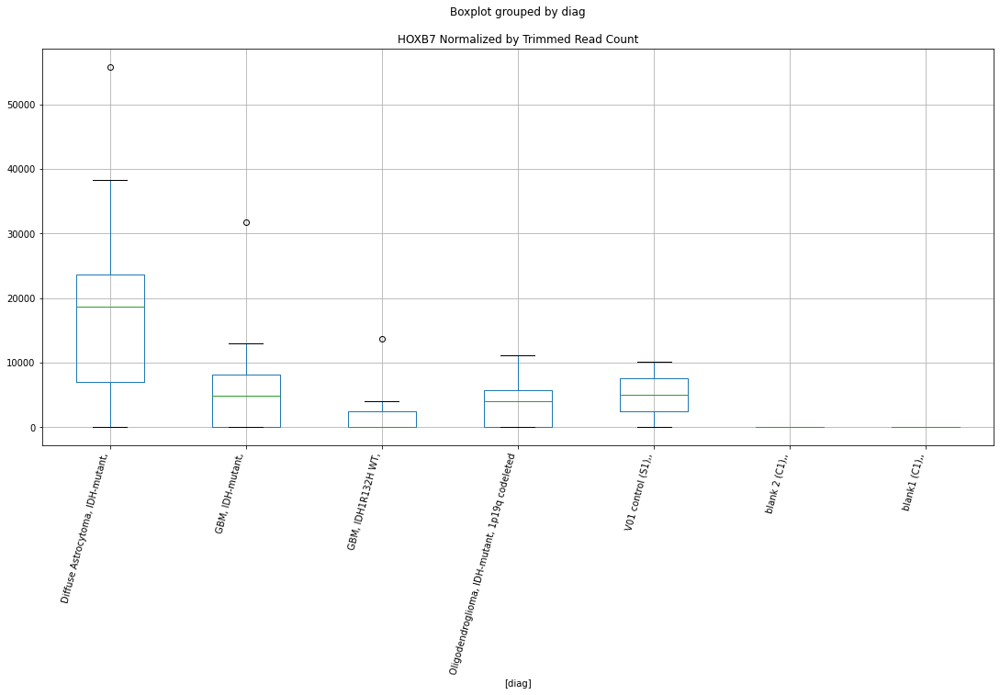

 p : 0.005552105138588785  ( t : 3.148867691867706 ) :  D-plex  :  bbduk2  :  CYP27B1
Control and blanks
73     0.0
337    0.0
Name: CYP27B1, dtype: float64
205    179.09
Name: CYP27B1, dtype: float64
469    1183.05
Name: CYP27B1, dtype: float64


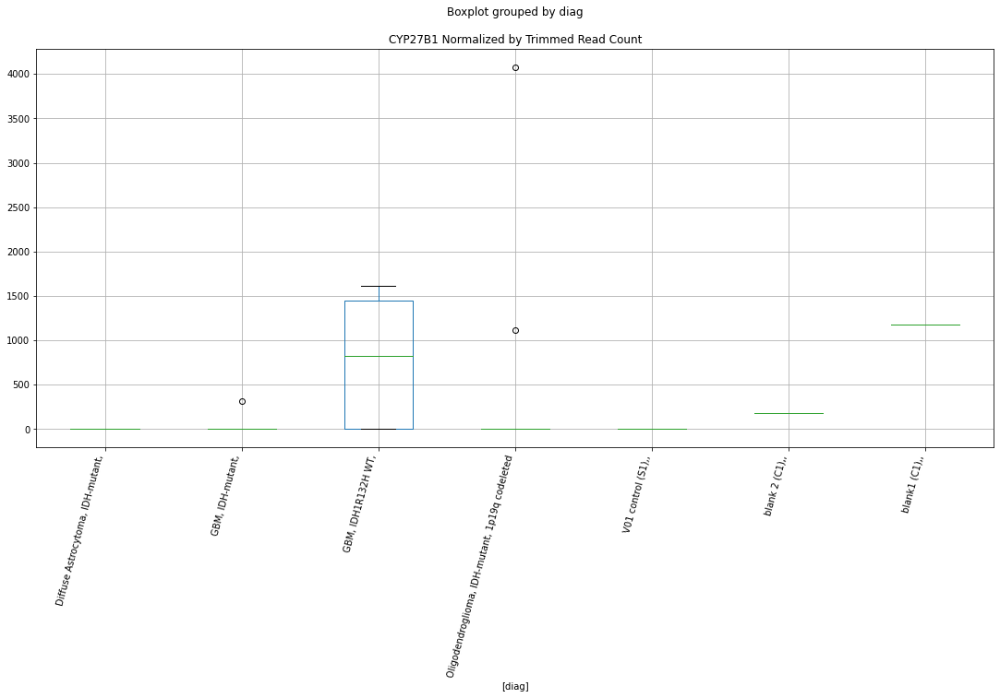

 p : 0.005558571700234226  ( t : 3.1483368830339264 ) :  D-plex  :  cutadapt2  :  CD3D
Control and blanks
76     0.0
340    0.0
Name: CD3D, dtype: float64
208    5819.89
Name: CD3D, dtype: float64
472    146800.78
Name: CD3D, dtype: float64


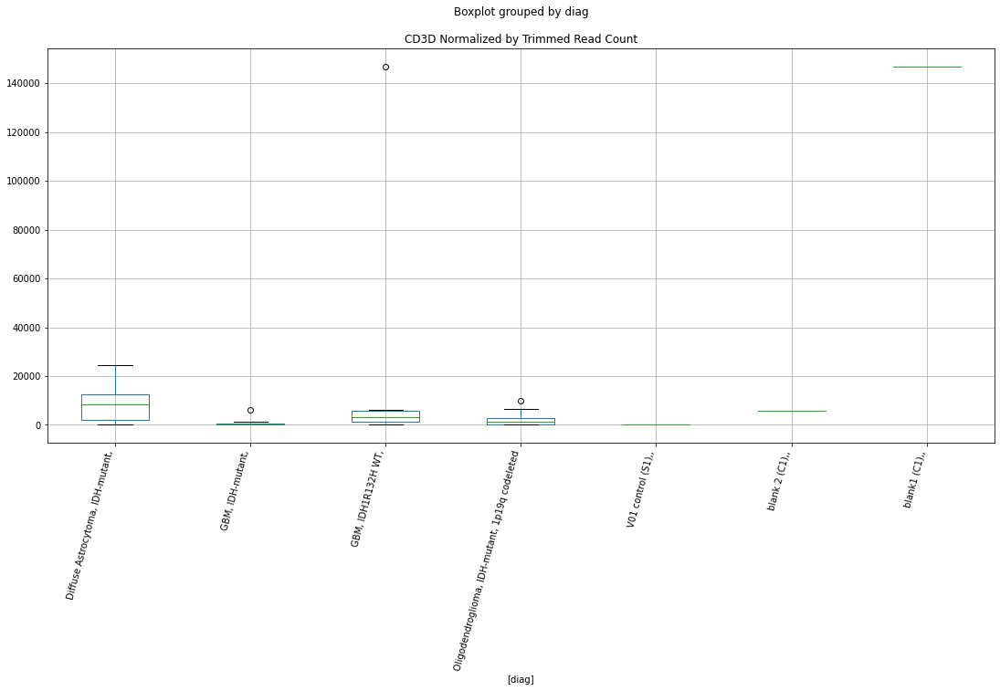

 p : 0.005605520395230268  ( t : 3.144501089970877 ) :  D-plex  :  cutadapt2  :  DNA2
Control and blanks
76        0.0
340    2642.2
Name: DNA2, dtype: float64
208    263482.17
Name: DNA2, dtype: float64
472    3467.74
Name: DNA2, dtype: float64


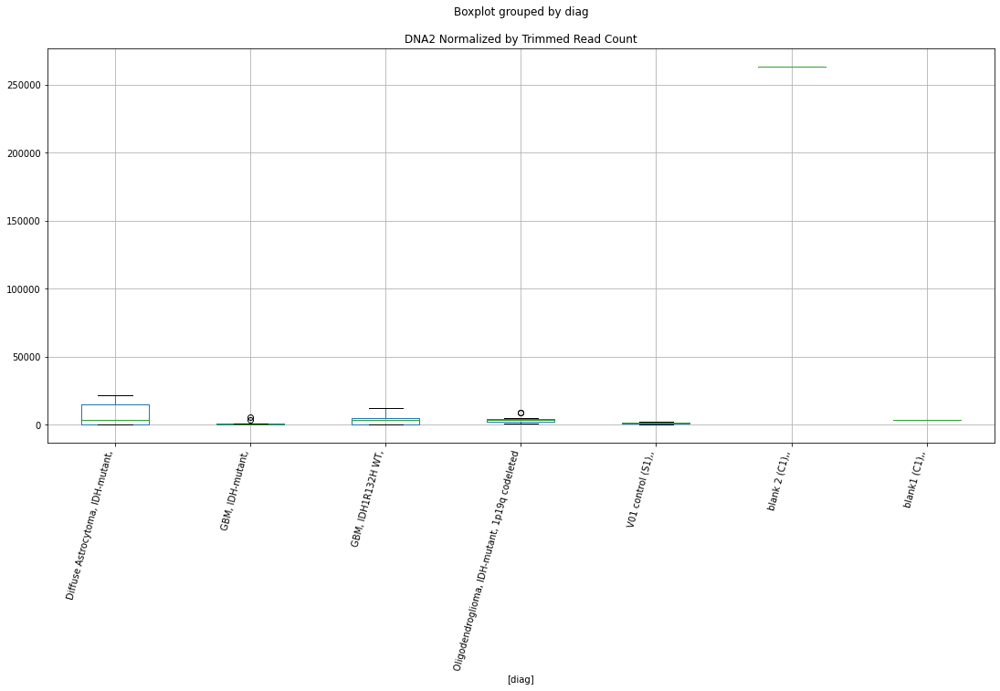

 p : 0.00561444067682849  ( t : 3.14377583725347 ) :  D-plex  :  bbduk2  :  LOC105371934
Control and blanks
73     0.0
337    0.0
Name: LOC105371934, dtype: float64
205    53727.29
Name: LOC105371934, dtype: float64
469    5915.27
Name: LOC105371934, dtype: float64


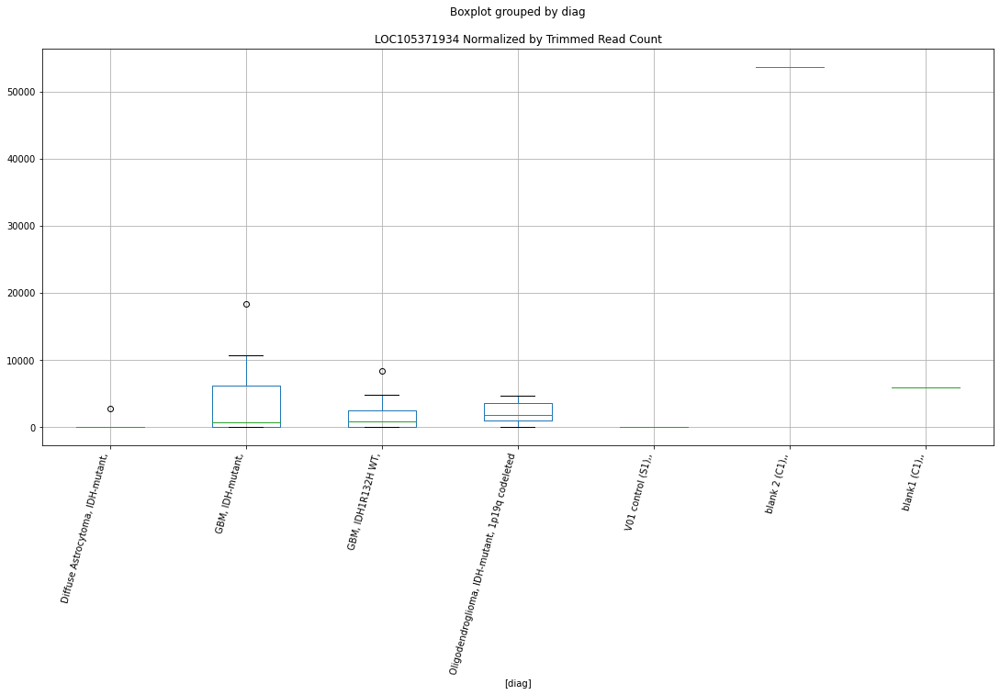

 p : 0.005668753979126676  ( t : 3.1393841092152184 ) :  D-plex  :  bbduk2  :  B3GALNT2
Control and blanks
73     6184.07
337    8901.57
Name: B3GALNT2, dtype: float64
205    0.0
Name: B3GALNT2, dtype: float64
469    4732.22
Name: B3GALNT2, dtype: float64


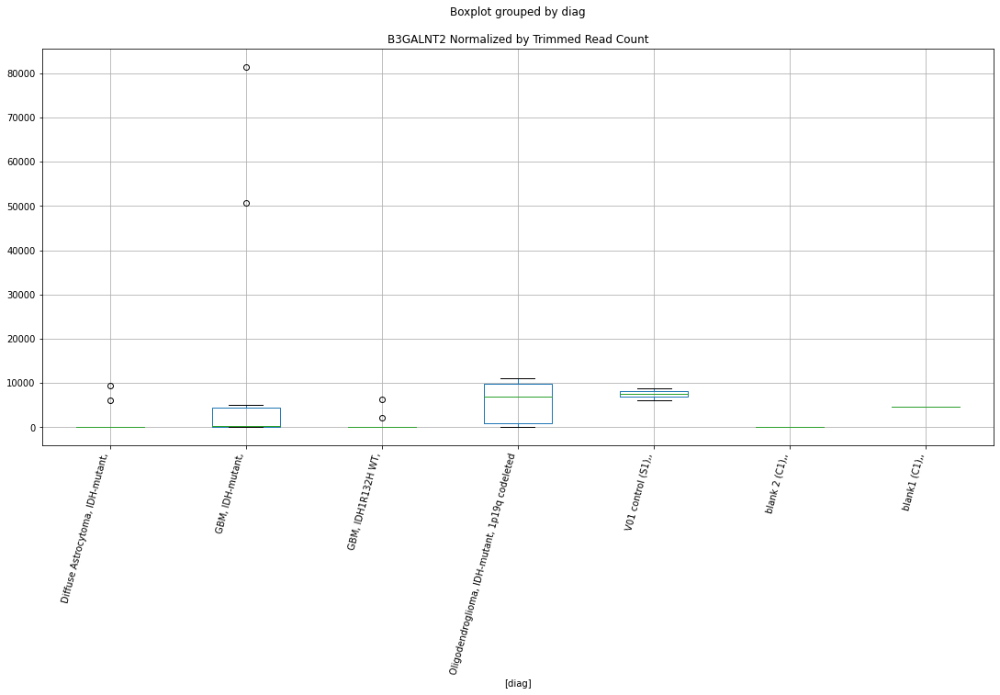

 p : 0.005681865275553582  ( t : 3.1383301011518836 ) :  D-plex  :  bbduk2  :  HRH3
Control and blanks
73     0.0
337    0.0
Name: HRH3, dtype: float64
205    358.18
Name: HRH3, dtype: float64
469    4140.69
Name: HRH3, dtype: float64


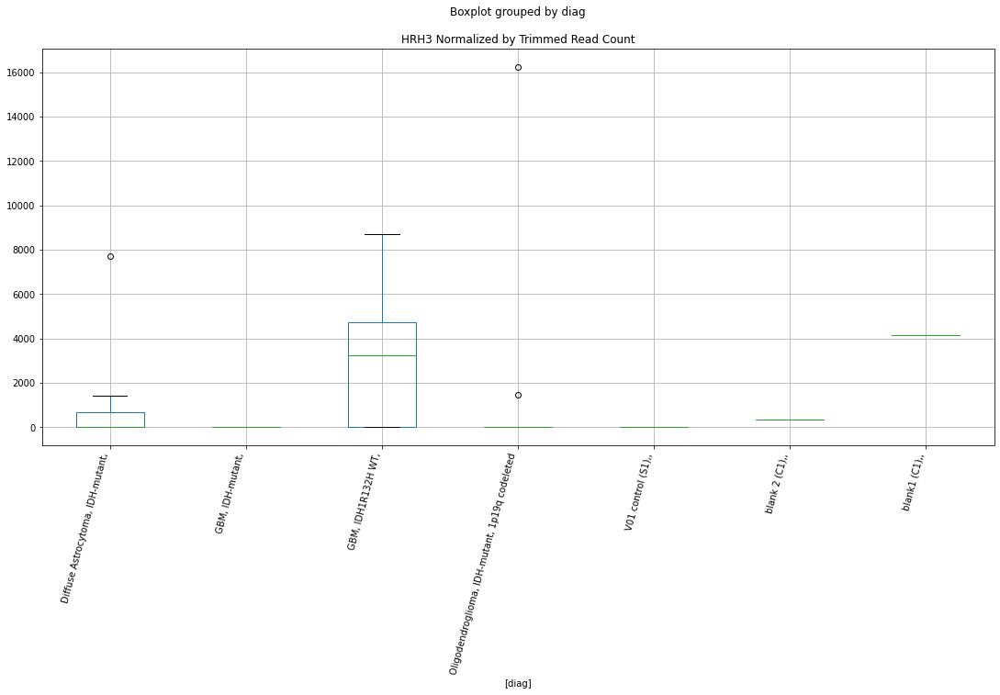

 p : 0.005720385482627487  ( t : 3.135247176447247 ) :  D-plex  :  cutadapt2  :  LOC112268020
Control and blanks
76         0.00
340    17614.64
Name: LOC112268020, dtype: float64
208    352.72
Name: LOC112268020, dtype: float64
472    1733.87
Name: LOC112268020, dtype: float64


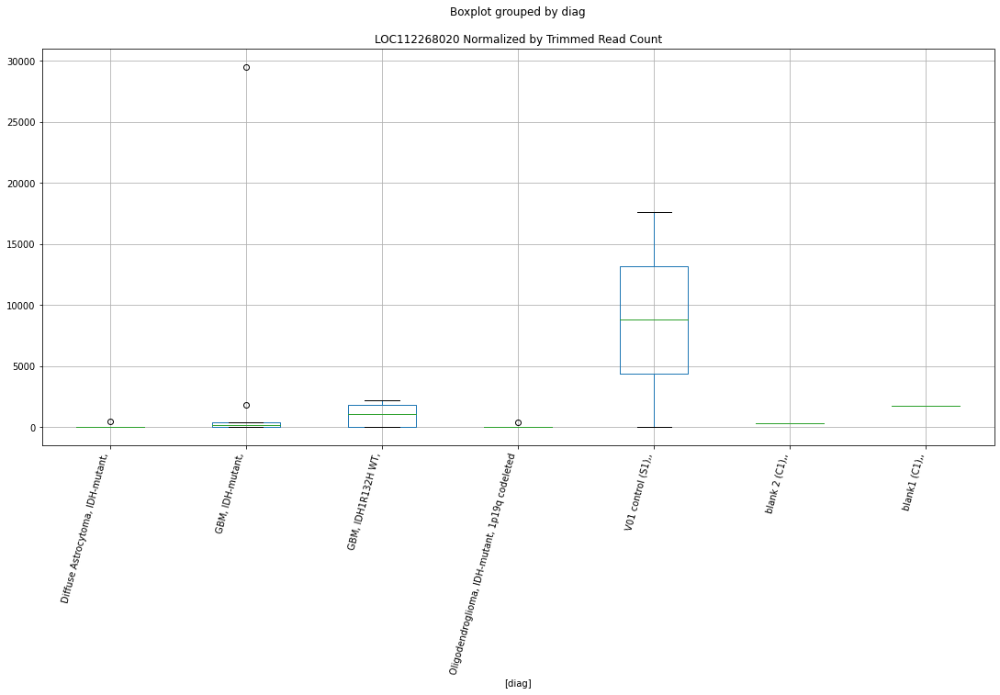

 p : 0.005763308896934287  ( t : 3.1318356419416395 ) :  D-plex  :  bbduk2  :  LOC105370786
Control and blanks
73     0.0
337    0.0
Name: LOC105370786, dtype: float64
205    716.36
Name: LOC105370786, dtype: float64
469    1183.05
Name: LOC105370786, dtype: float64


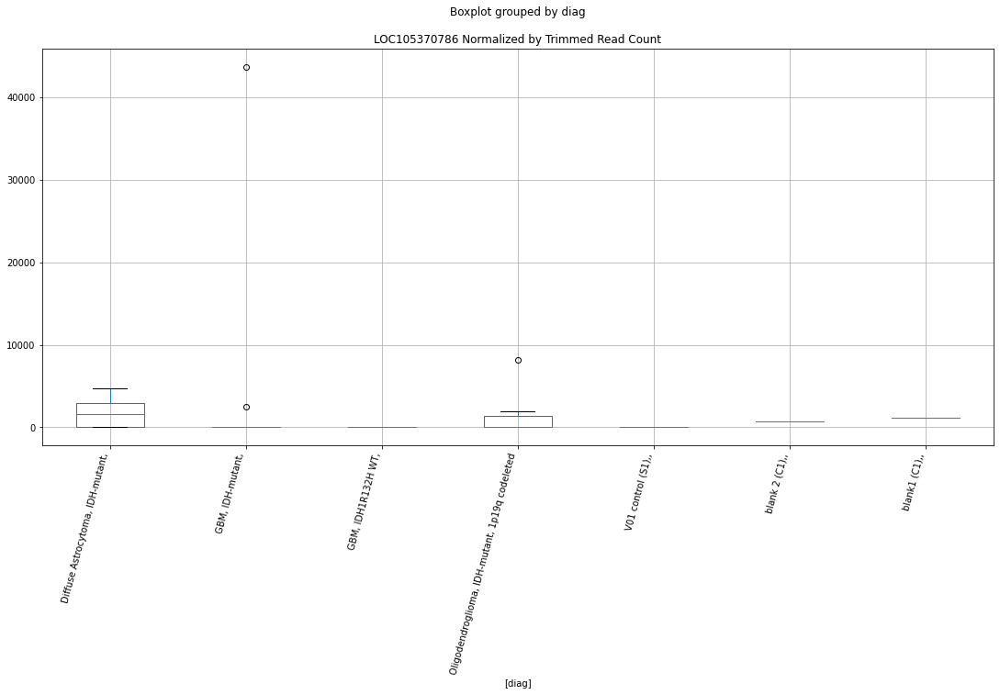

 p : 0.005838298129543949  ( t : 3.1259346405458484 ) :  D-plex  :  cutadapt2  :  DOCK2
Control and blanks
76     4545.69
340    2642.20
Name: DOCK2, dtype: float64
208    7759.85
Name: DOCK2, dtype: float64
472    10403.21
Name: DOCK2, dtype: float64


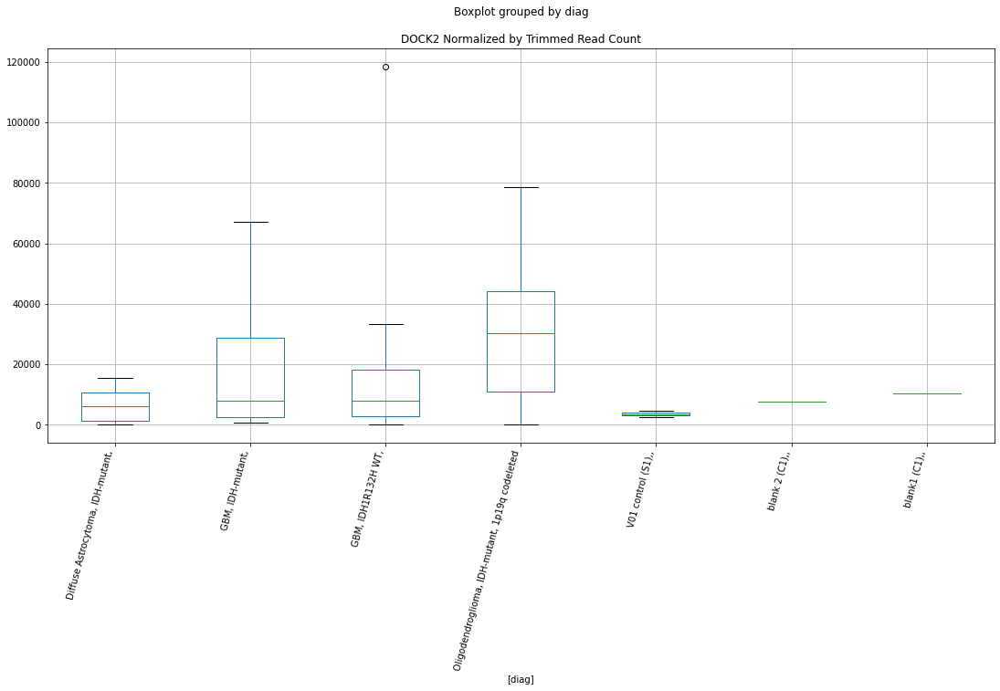

 p : 0.0059018852797736955  ( t : 3.120988578724177 ) :  D-plex  :  bbduk2  :  LOC112268020
Control and blanks
73         0.00
337    17803.15
Name: LOC112268020, dtype: float64
205    358.18
Name: LOC112268020, dtype: float64
469    1774.58
Name: LOC112268020, dtype: float64


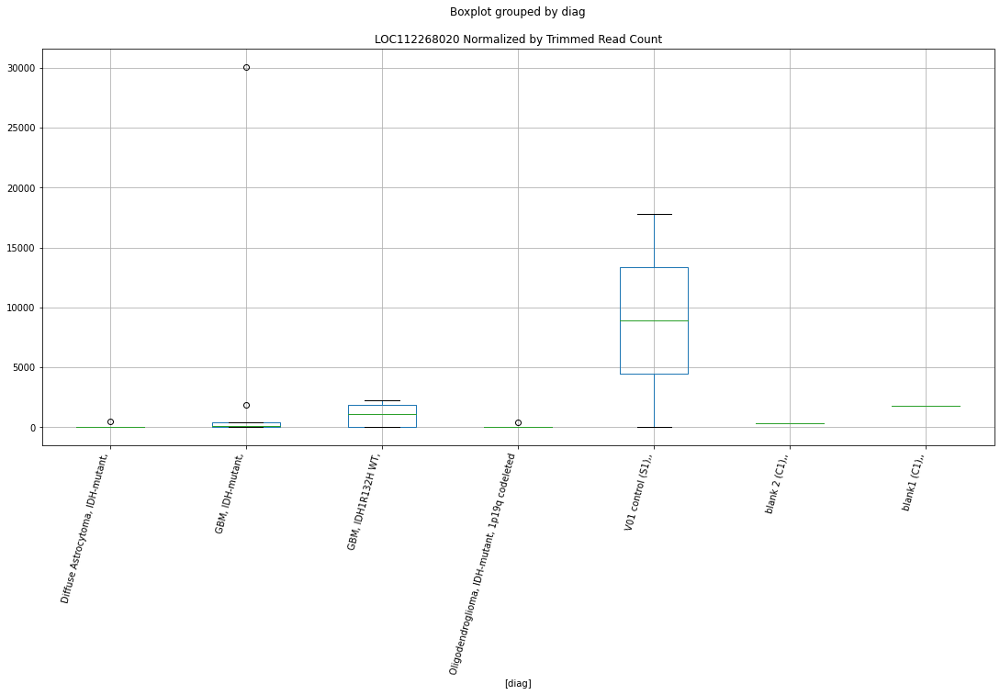

 p : 0.0059379909841582226  ( t : 3.118203237617442 ) :  Lexogen  :  cutadapt2  :  CCR2
Control and blanks
82     17040.61
346        0.00
Name: CCR2, dtype: float64
214    0.0
Name: CCR2, dtype: float64
478    0.0
Name: CCR2, dtype: float64


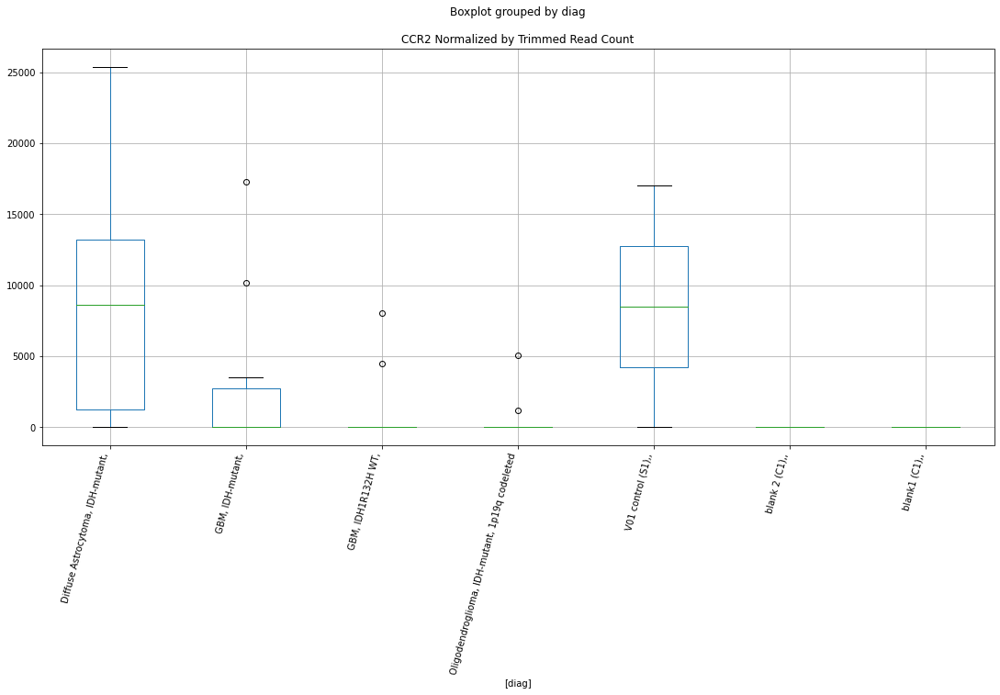

 p : 0.005956386963144691  ( t : 3.1167904473311054 ) :  Lexogen  :  bbduk2  :  CHRD
Control and blanks
79     0.0
343    0.0
Name: CHRD, dtype: float64
211    5192.82
Name: CHRD, dtype: float64
475    0.0
Name: CHRD, dtype: float64


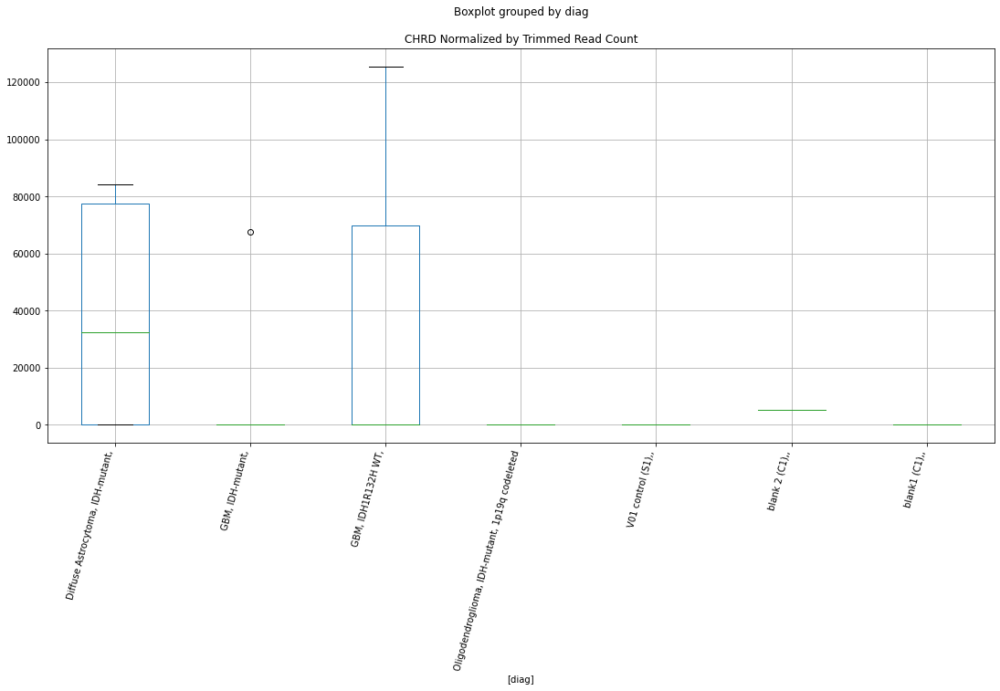

 p : 0.006037472720963815  ( t : 3.1106134794696616 ) :  D-plex  :  bbduk2  :  LOC105379506
Control and blanks
73     61840.67
337     3560.63
Name: LOC105379506, dtype: float64
205    6089.09
Name: LOC105379506, dtype: float64
469    6506.8
Name: LOC105379506, dtype: float64


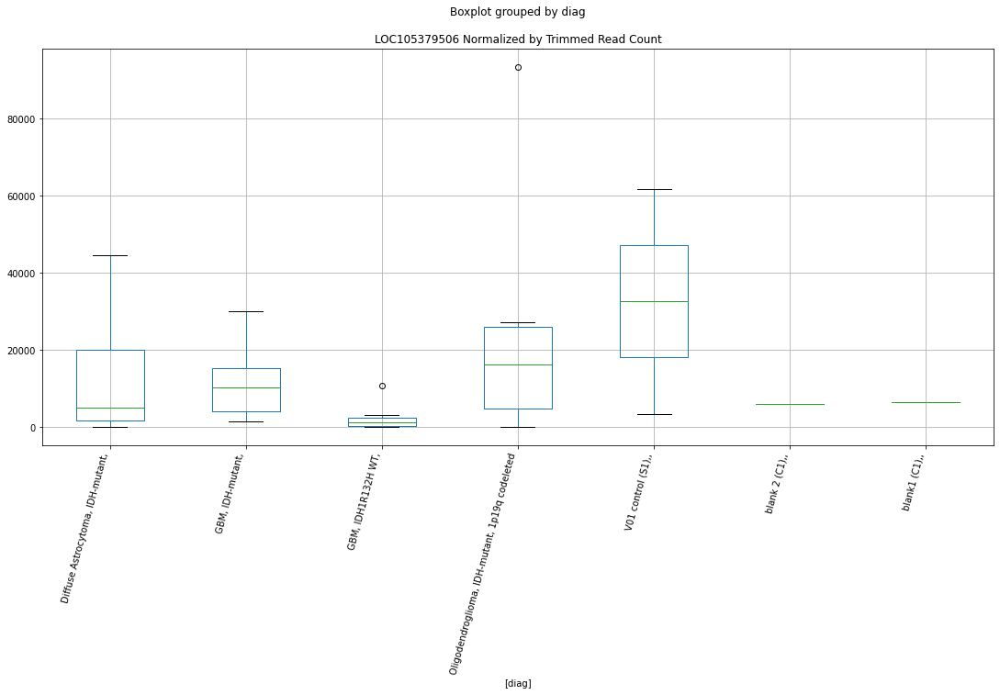

 p : 0.006037472720963815  ( t : 3.1106134794696616 ) :  D-plex  :  bbduk2  :  LOC105379507
Control and blanks
73     61840.67
337     3560.63
Name: LOC105379507, dtype: float64
205    6089.09
Name: LOC105379507, dtype: float64
469    6506.8
Name: LOC105379507, dtype: float64


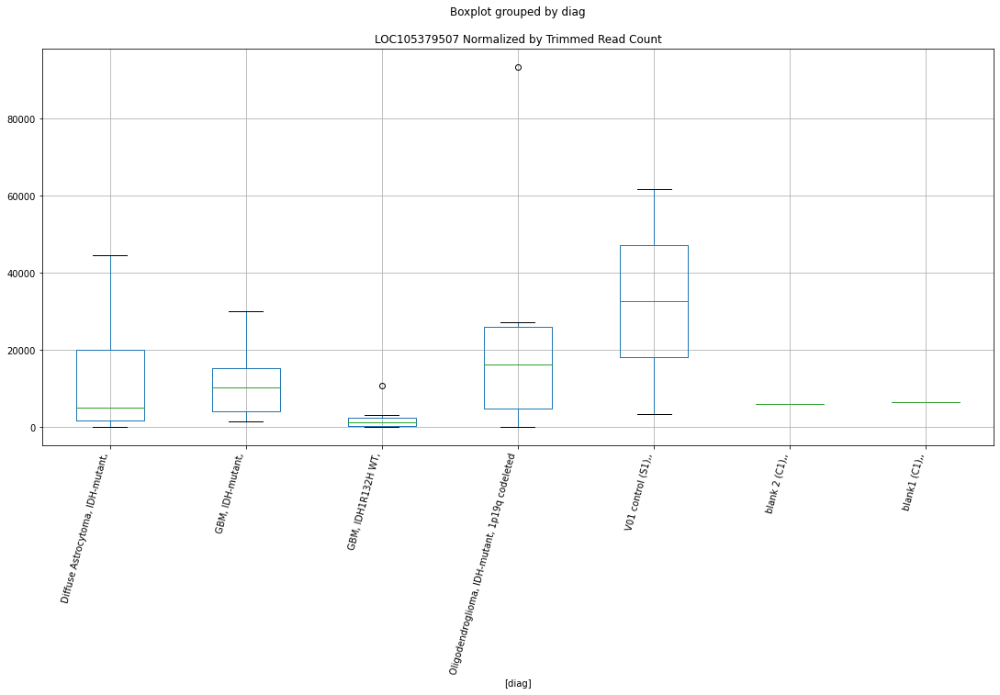

 p : 0.006054016499208707  ( t : 3.1093631519708937 ) :  D-plex  :  bbduk2  :  LOC105379508
Control and blanks
73     61840.67
337     3560.63
Name: LOC105379508, dtype: float64
205    5910.0
Name: LOC105379508, dtype: float64
469    6506.8
Name: LOC105379508, dtype: float64


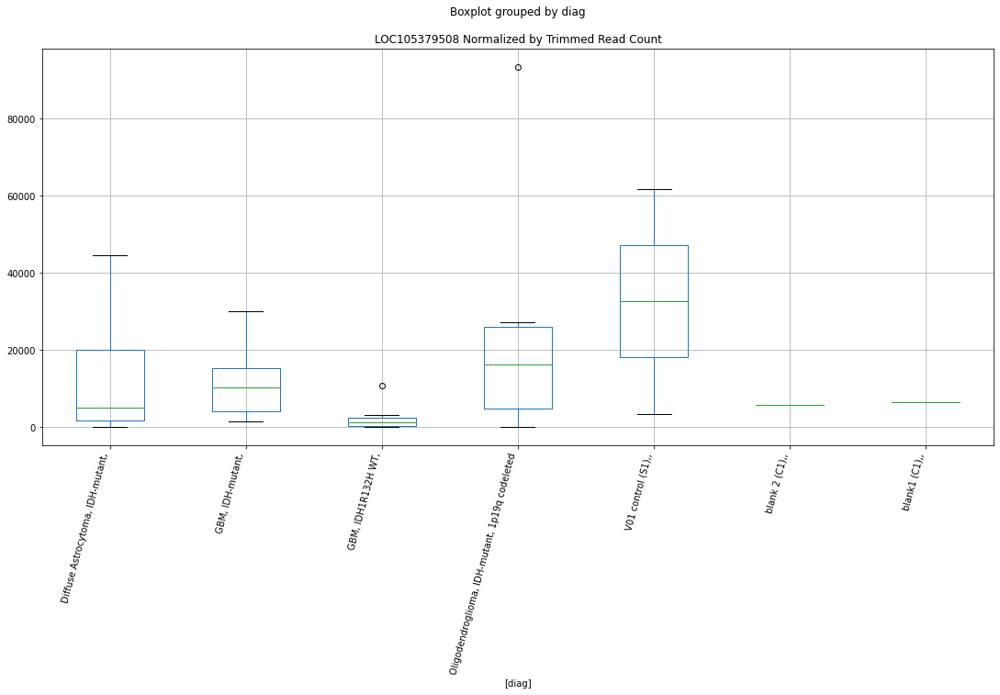

 p : 0.006067425435878584  ( t : 3.1083521896027557 ) :  Lexogen  :  bbduk2  :  CCR2
Control and blanks
79     17167.19
343        0.00
Name: CCR2, dtype: float64
211    0.0
Name: CCR2, dtype: float64
475    0.0
Name: CCR2, dtype: float64


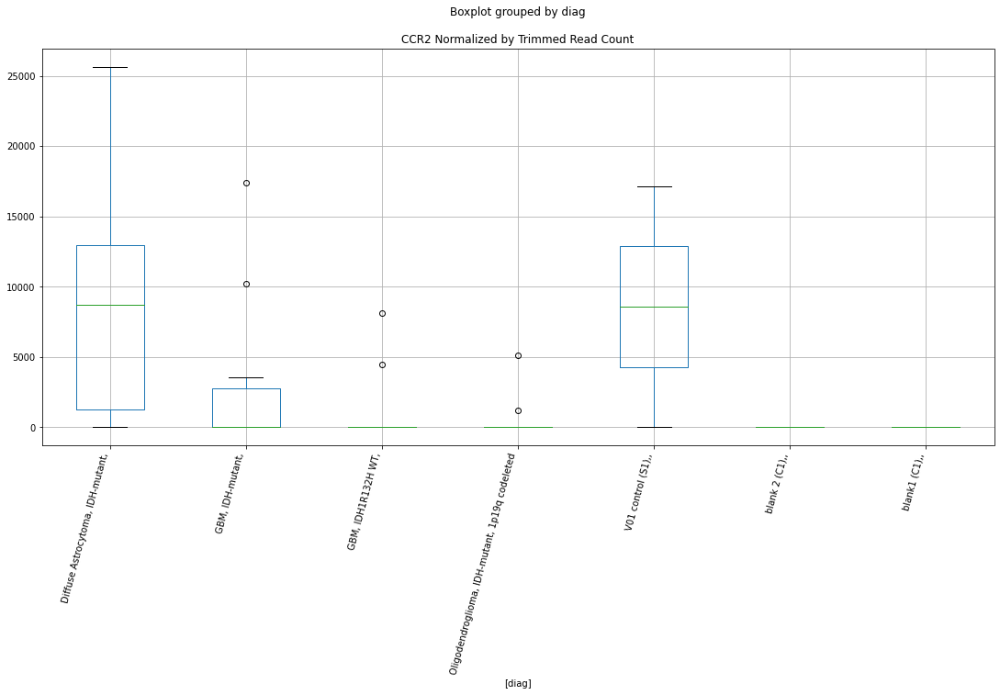

 p : 0.006095253729470362  ( t : 3.106261022159846 ) :  D-plex  :  bbduk2  :  PCDHAC2
Control and blanks
73     0.0
337    0.0
Name: PCDHAC2, dtype: float64
205    716.36
Name: PCDHAC2, dtype: float64
469    2366.11
Name: PCDHAC2, dtype: float64


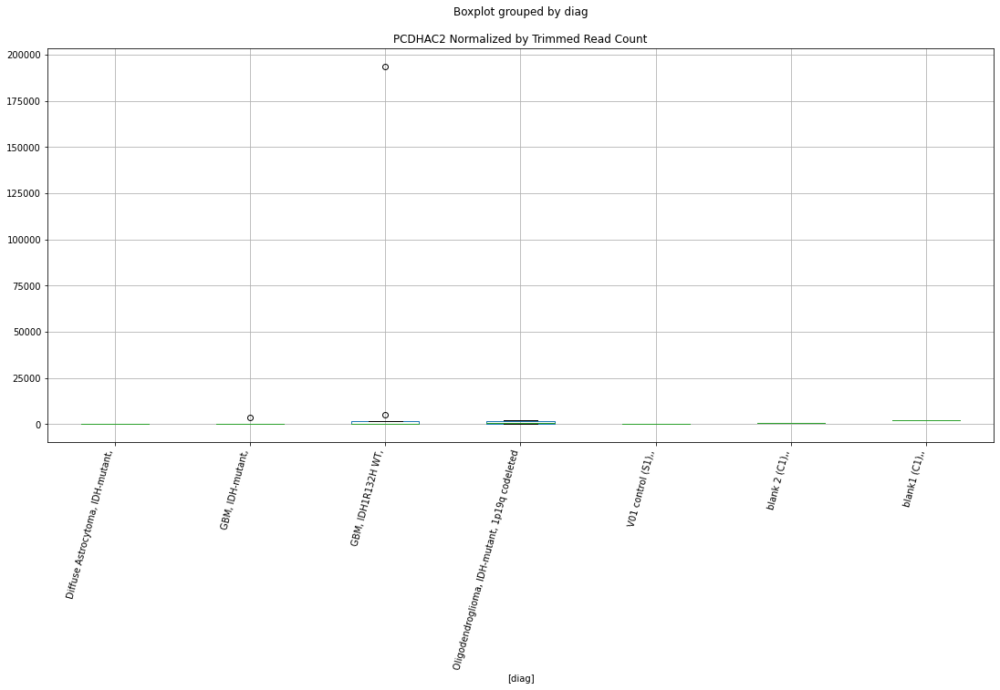

 p : 0.0061250106412170345  ( t : 3.1040352072783883 ) :  D-plex  :  bbduk2  :  RIMS3
Control and blanks
73     0.0
337    0.0
Name: RIMS3, dtype: float64
205    2865.46
Name: RIMS3, dtype: float64
469    4732.22
Name: RIMS3, dtype: float64


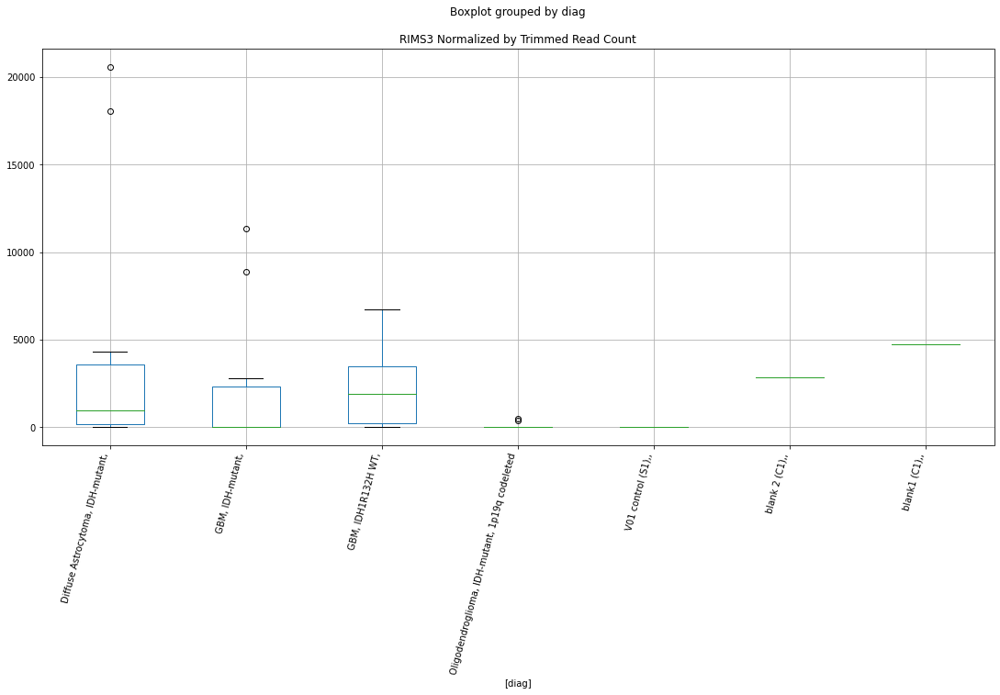

 p : 0.00614535070588001  ( t : 3.102519832857557 ) :  Lexogen  :  cutadapt2  :  CH507-42P11.6
Control and blanks
82     0.0
346    0.0
Name: CH507-42P11.6, dtype: float64
214    813.68
Name: CH507-42P11.6, dtype: float64
478    0.0
Name: CH507-42P11.6, dtype: float64


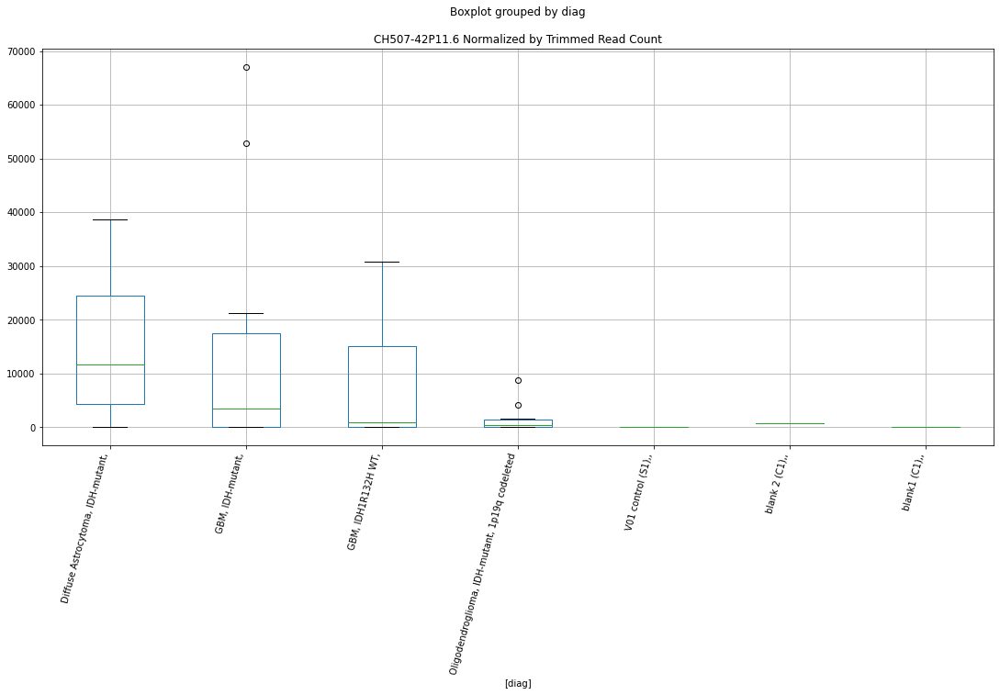

 p : 0.006146885632611355  ( t : 3.102405676426917 ) :  D-plex  :  cutadapt2  :  LOC105376731
Control and blanks
76     0.0
340    0.0
Name: LOC105376731, dtype: float64
208    705.44
Name: LOC105376731, dtype: float64
472    1155.91
Name: LOC105376731, dtype: float64


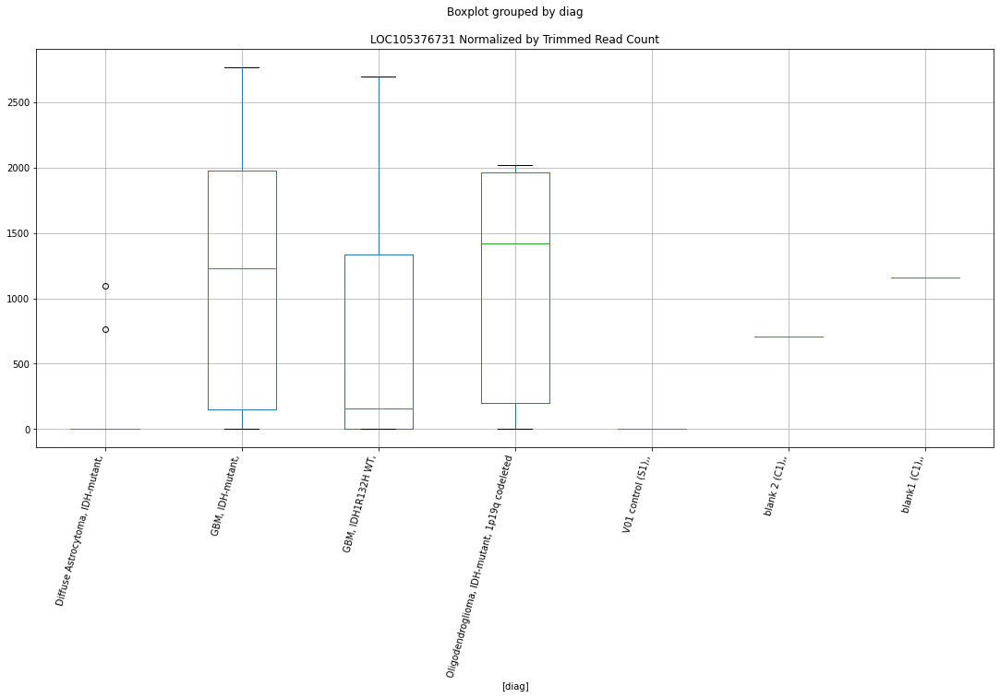

 p : 0.006150026875046898  ( t : 3.1021721408326592 ) :  Lexogen  :  bbduk2  :  FAM210A
Control and blanks
79     0.0
343    0.0
Name: FAM210A, dtype: float64
211    0.0
Name: FAM210A, dtype: float64
475    0.0
Name: FAM210A, dtype: float64


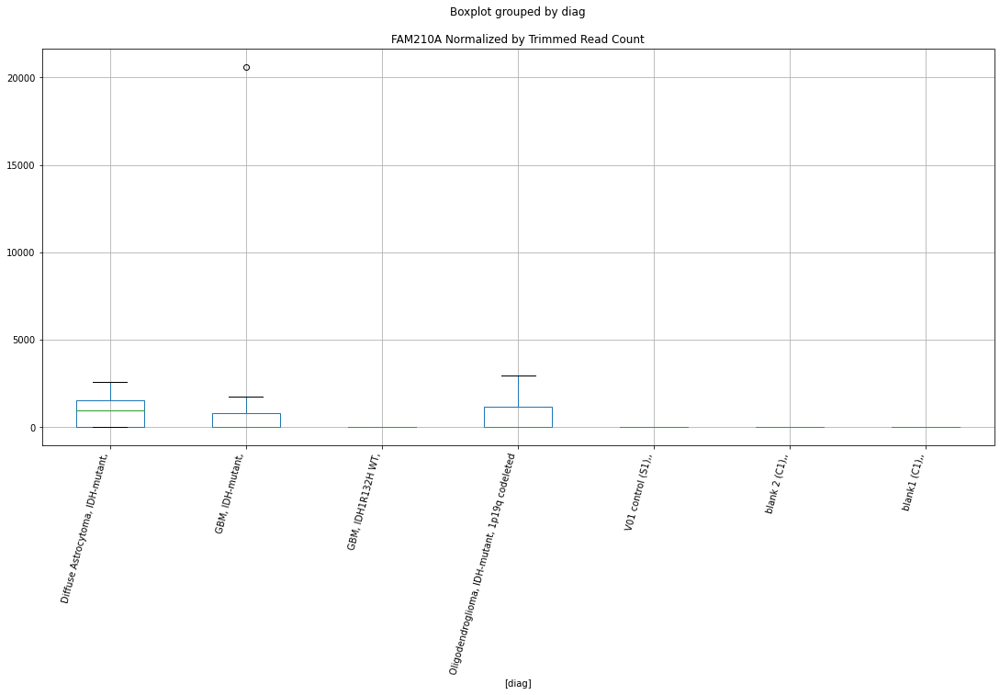

 p : 0.006169002214275082  ( t : 3.100763888927082 ) :  Lexogen  :  bbduk2  :  CH507-42P11.6
Control and blanks
79     0.0
343    0.0
Name: CH507-42P11.6, dtype: float64
211    819.92
Name: CH507-42P11.6, dtype: float64
475    0.0
Name: CH507-42P11.6, dtype: float64


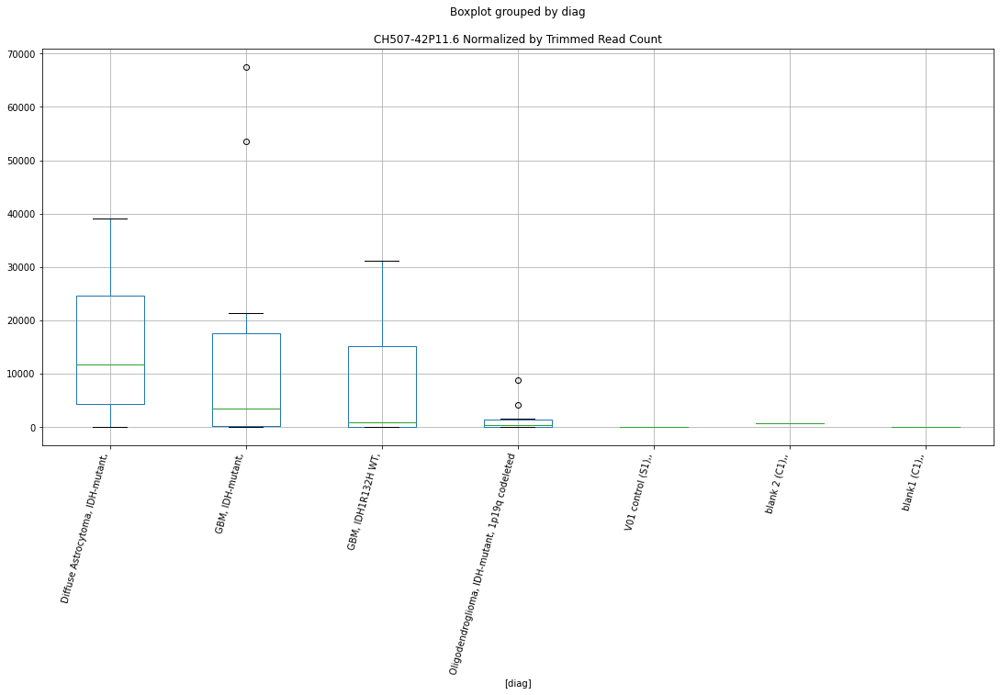

 p : 0.0061720495352421915  ( t : 3.100538126255283 ) :  D-plex  :  cutadapt2  :  RASSF9
Control and blanks
76     3030.46
340       0.00
Name: RASSF9, dtype: float64
208    2292.68
Name: RASSF9, dtype: float64
472    6935.47
Name: RASSF9, dtype: float64


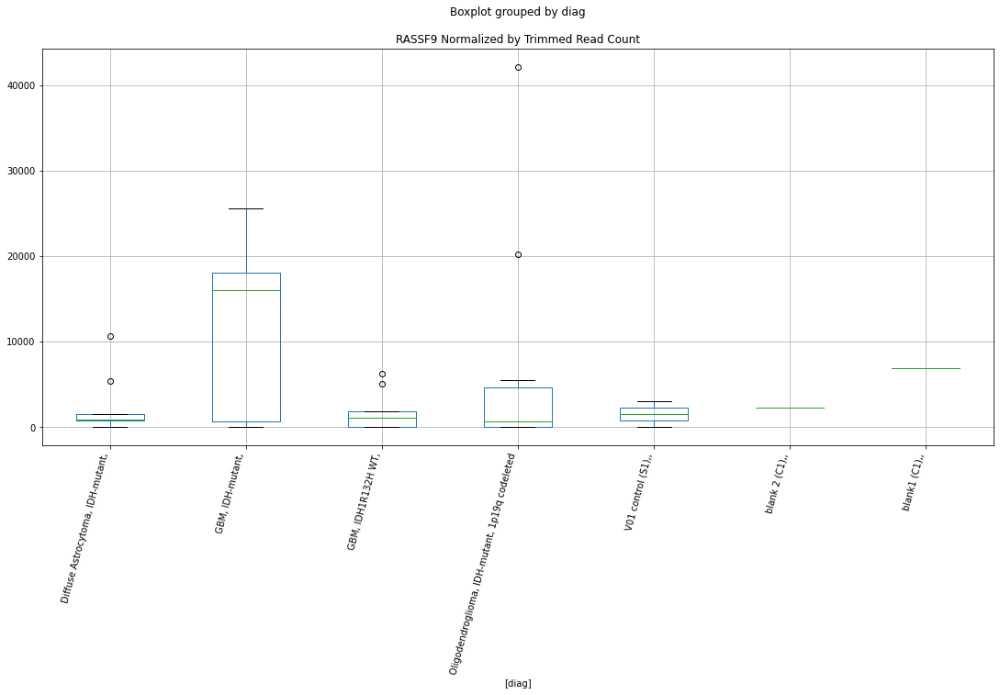

 p : 0.0061813037129822305  ( t : 3.099853190475982 ) :  D-plex  :  cutadapt2  :  COIL
Control and blanks
76     0.0
340    0.0
Name: COIL, dtype: float64
208    352.72
Name: COIL, dtype: float64
472    0.0
Name: COIL, dtype: float64


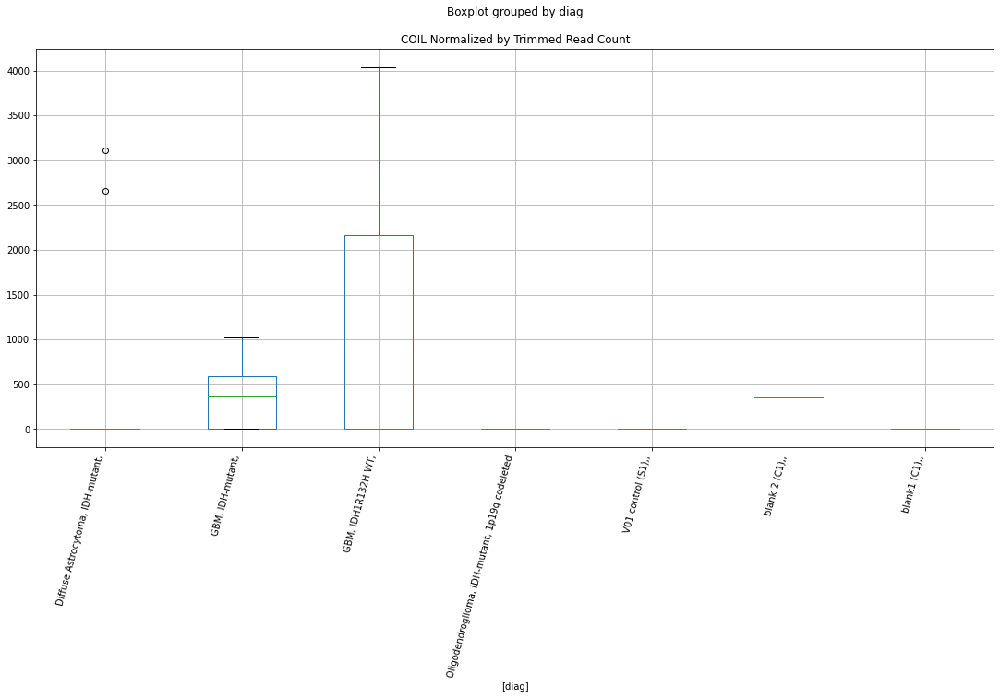

 p : 0.006232368262030093  ( t : 3.0960916058567602 ) :  D-plex  :  bbduk2  :  GABRB3
Control and blanks
73     0.0
337    0.0
Name: GABRB3, dtype: float64
205    11820.0
Name: GABRB3, dtype: float64
469    8281.38
Name: GABRB3, dtype: float64


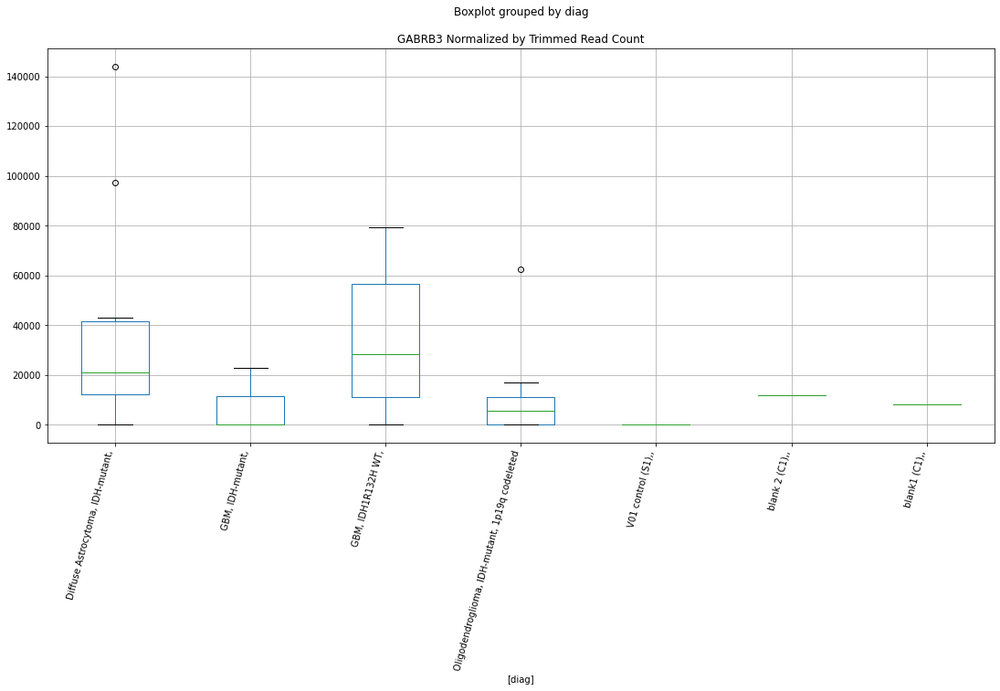

 p : 0.006256467076384987  ( t : 3.094326833378509 ) :  D-plex  :  cutadapt2  :  TLE6
Control and blanks
76     0.0
340    0.0
Name: TLE6, dtype: float64
208    7407.13
Name: TLE6, dtype: float64
472    5201.6
Name: TLE6, dtype: float64


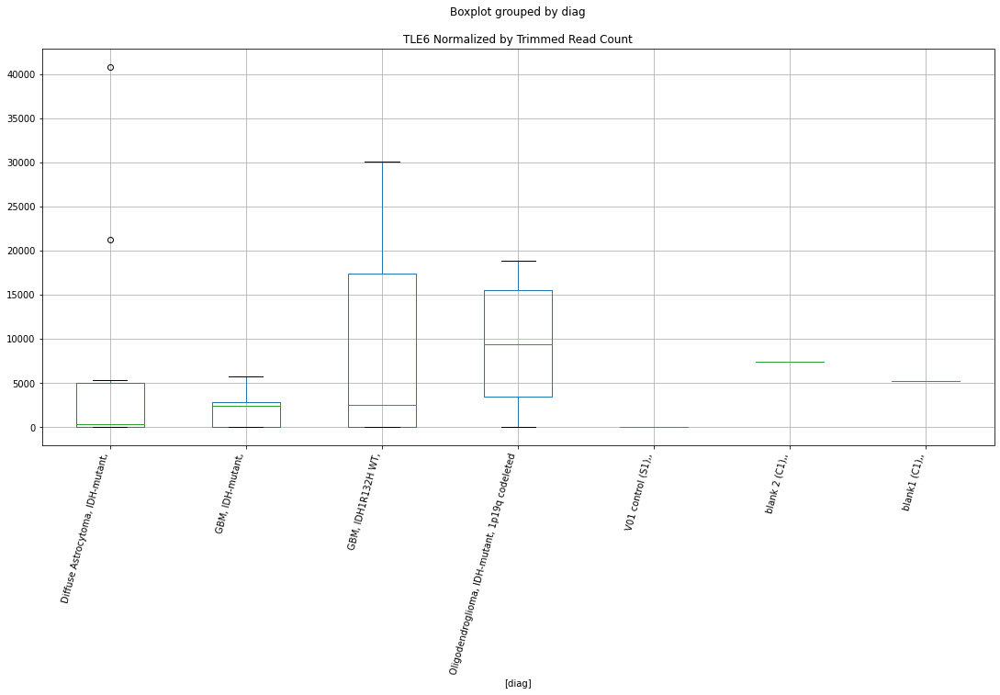

 p : 0.0063141563453283705  ( t : 3.090128986954425 ) :  D-plex  :  cutadapt2  :  LOC105370786
Control and blanks
76     0.0
340    0.0
Name: LOC105370786, dtype: float64
208    705.44
Name: LOC105370786, dtype: float64
472    1155.91
Name: LOC105370786, dtype: float64


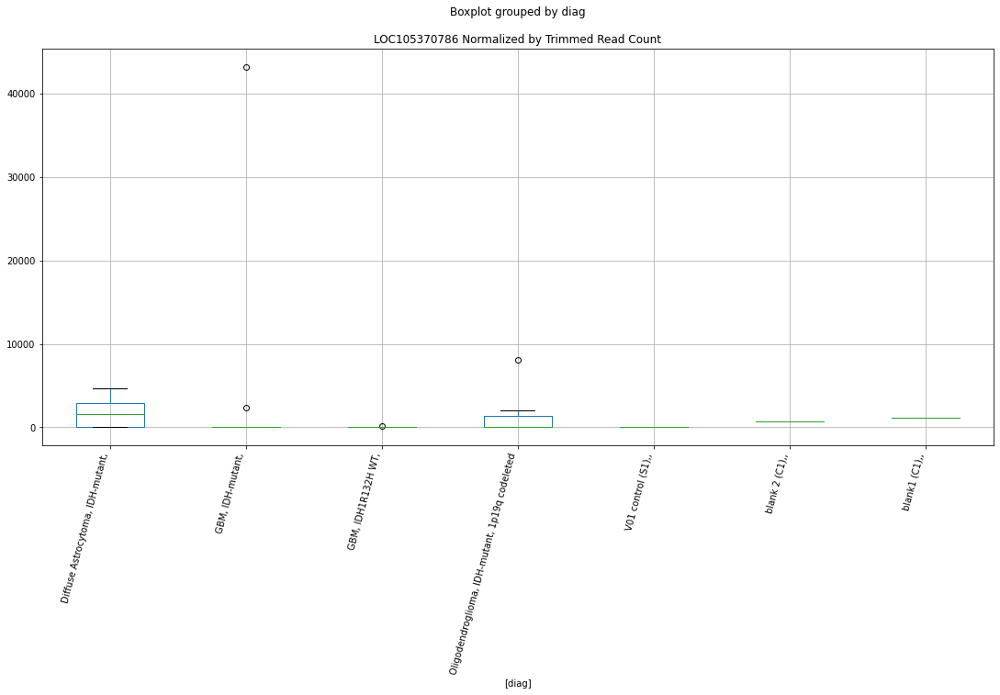

 p : 0.006325826819626959  ( t : 3.0892843160359225 ) :  D-plex  :  cutadapt2  :  IL2
Control and blanks
76     3030.46
340    5284.39
Name: IL2, dtype: float64
208    11639.77
Name: IL2, dtype: float64
472    528251.64
Name: IL2, dtype: float64


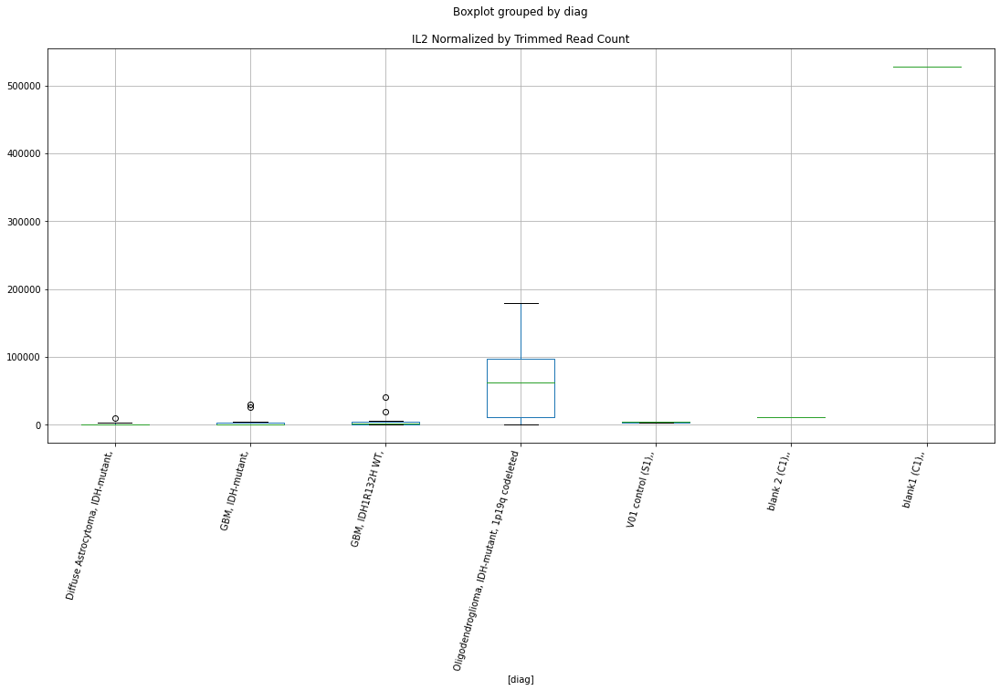

 p : 0.006346833817966892  ( t : 3.087767718799981 ) :  D-plex  :  cutadapt2  :  TNIP3
Control and blanks
76     0.0
340    0.0
Name: TNIP3, dtype: float64
208    21163.23
Name: TNIP3, dtype: float64
472    13870.94
Name: TNIP3, dtype: float64


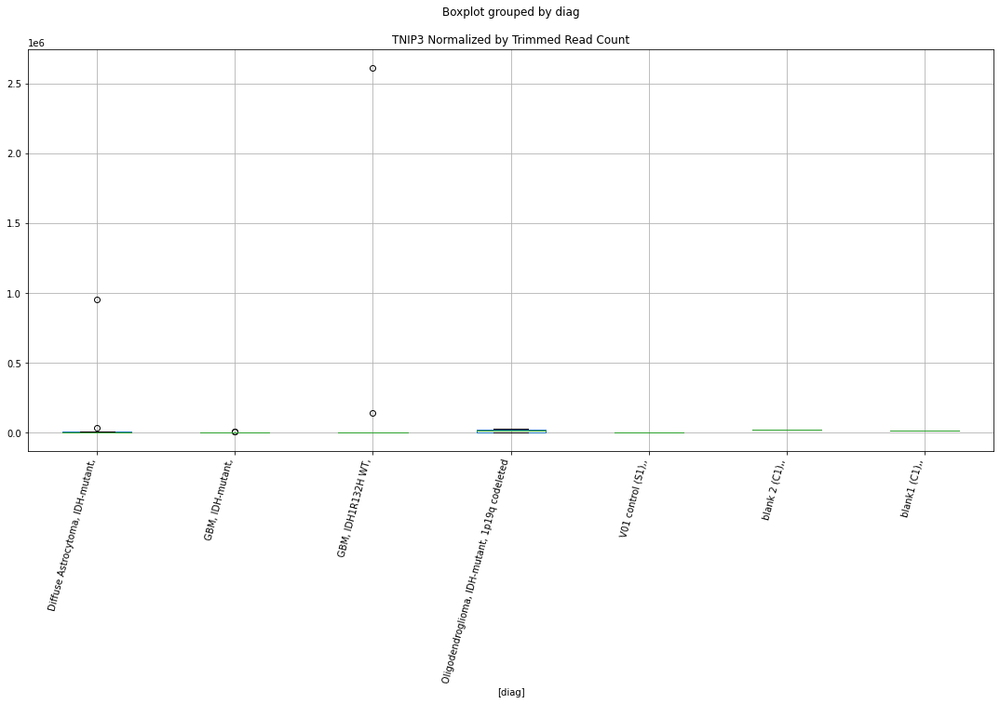

 p : 0.006409494157041358  ( t : 3.083272856021729 ) :  D-plex  :  cutadapt2  :  GABRB3
Control and blanks
76     0.0
340    0.0
Name: GABRB3, dtype: float64
208    11639.77
Name: GABRB3, dtype: float64
472    7513.43
Name: GABRB3, dtype: float64


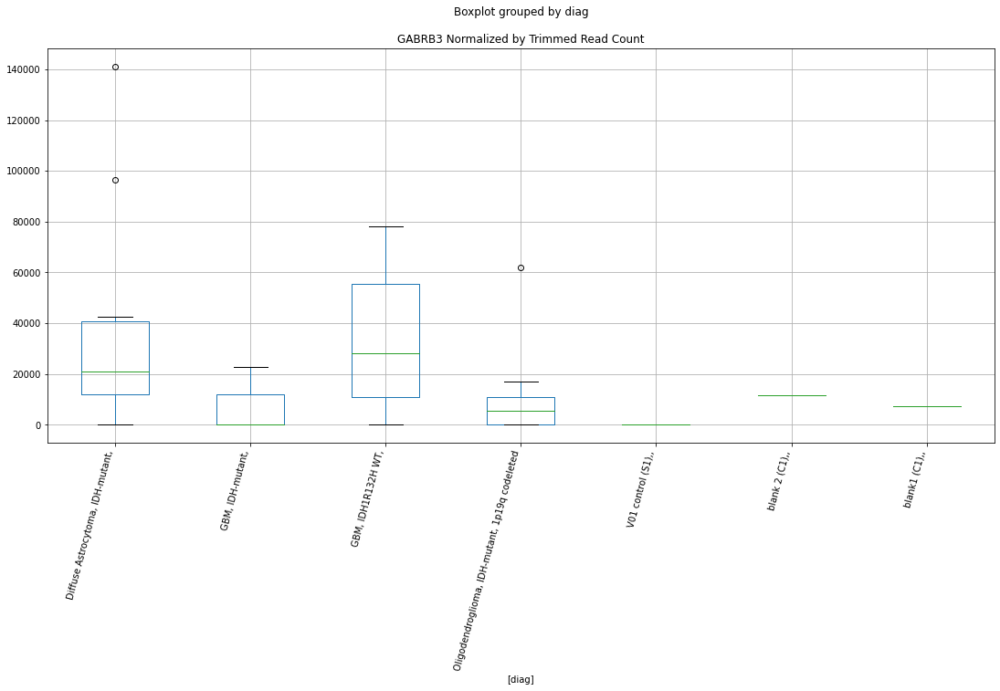

 p : 0.0064307132188752905  ( t : 3.0817604343810254 ) :  Lexogen  :  bbduk2  :  ROBO2
Control and blanks
79         0.00
343    13163.49
Name: ROBO2, dtype: float64
211    0.0
Name: ROBO2, dtype: float64
475    7424.99
Name: ROBO2, dtype: float64


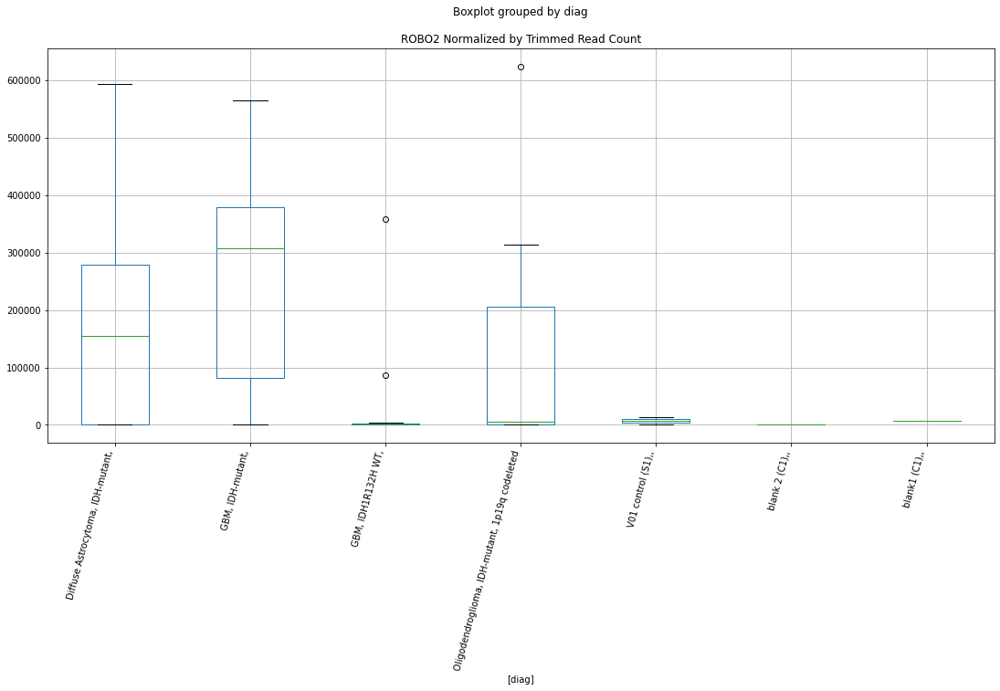

 p : 0.006432813599949634  ( t : 3.0816109910614737 ) :  D-plex  :  bbduk2  :  IL2
Control and blanks
73     3092.03
337    5340.94
Name: IL2, dtype: float64
205    11461.82
Name: IL2, dtype: float64
469    538289.86
Name: IL2, dtype: float64


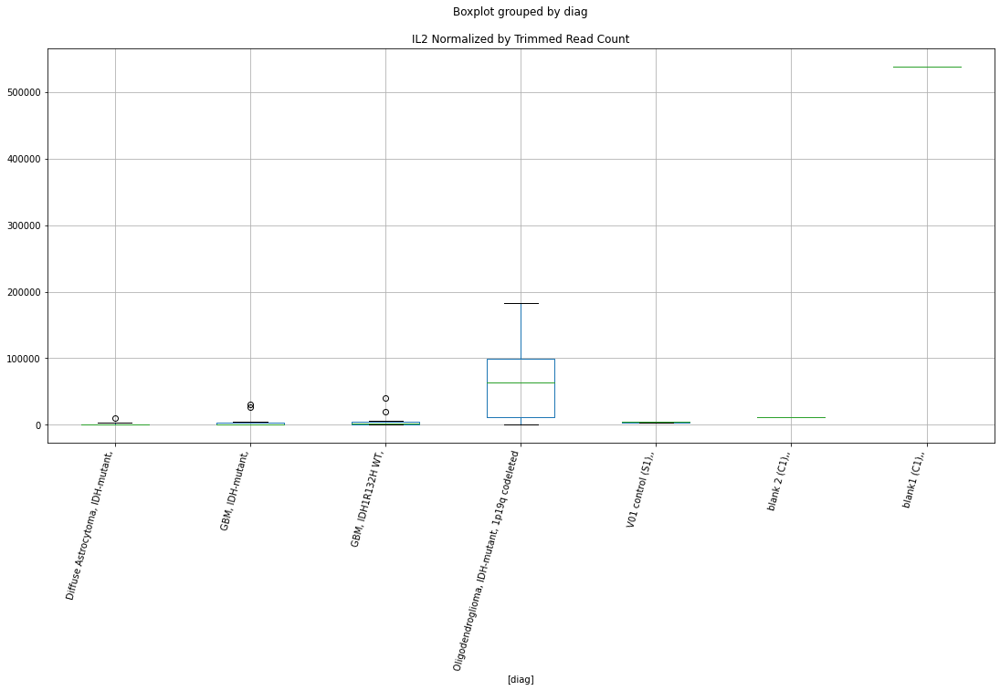

 p : 0.006547326075241541  ( t : 3.073534489906478 ) :  D-plex  :  cutadapt2  :  GGCX
Control and blanks
76        0.00
340    6165.12
Name: GGCX, dtype: float64
208    881.8
Name: GGCX, dtype: float64
472    0.0
Name: GGCX, dtype: float64


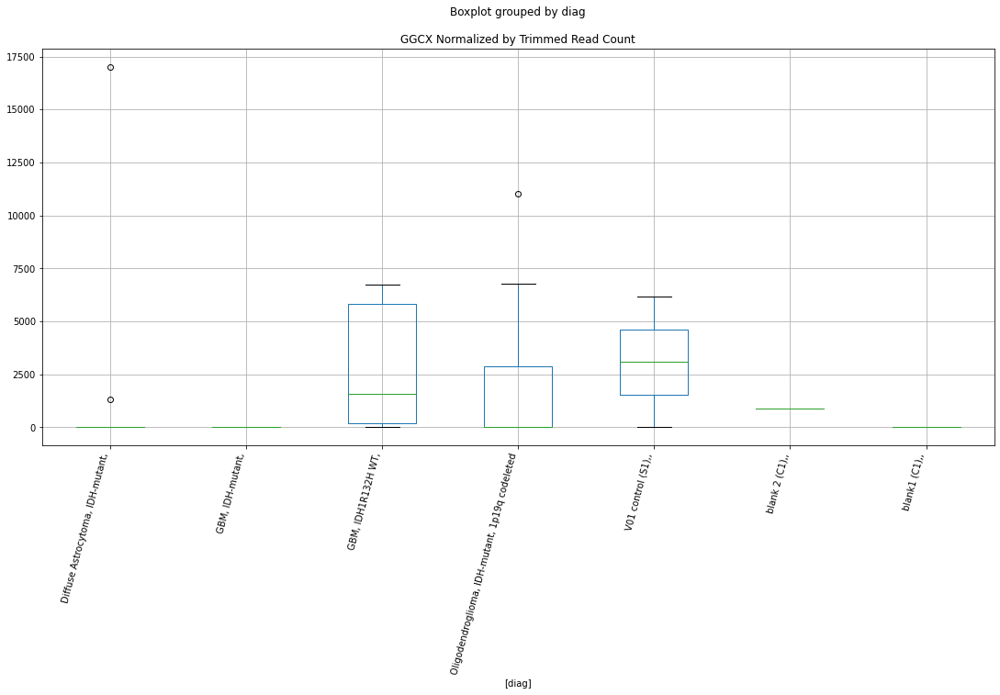

 p : 0.006560857278644601  ( t : 3.072589248015574 ) :  D-plex  :  cutadapt2  :  MUC16
Control and blanks
76       9848.98
340    160293.25
Name: MUC16, dtype: float64
208    61020.64
Name: MUC16, dtype: float64
472    1.86e+06
Name: MUC16, dtype: float64


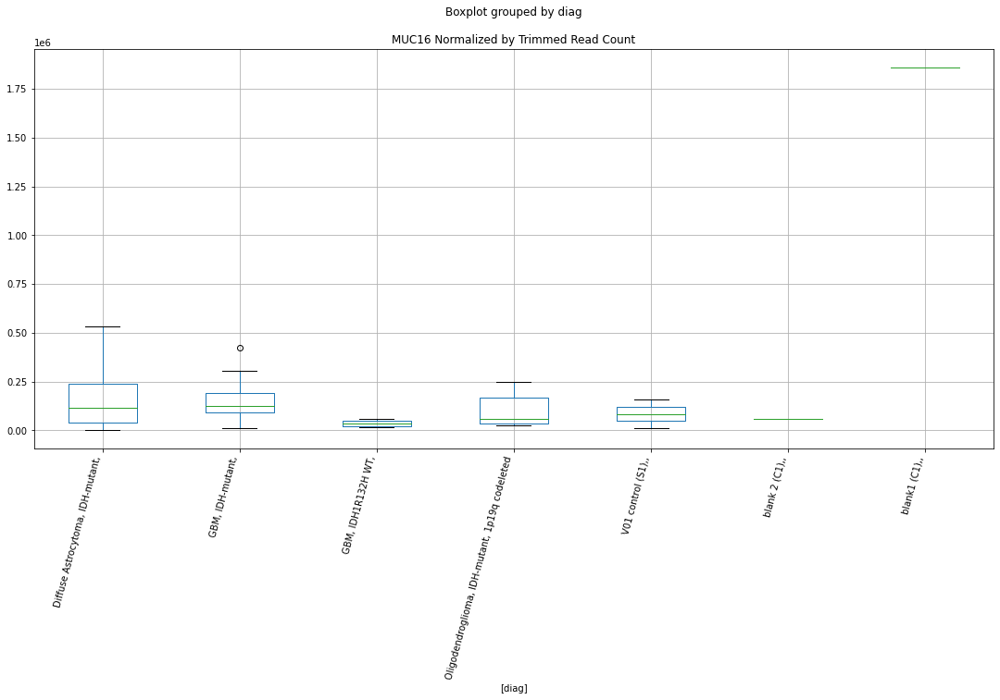

 p : 0.006567703479083845  ( t : 3.0721117199380257 ) :  D-plex  :  cutadapt2  :  KIF21A
Control and blanks
76     0.0
340    0.0
Name: KIF21A, dtype: float64
208    6348.97
Name: KIF21A, dtype: float64
472    18494.59
Name: KIF21A, dtype: float64


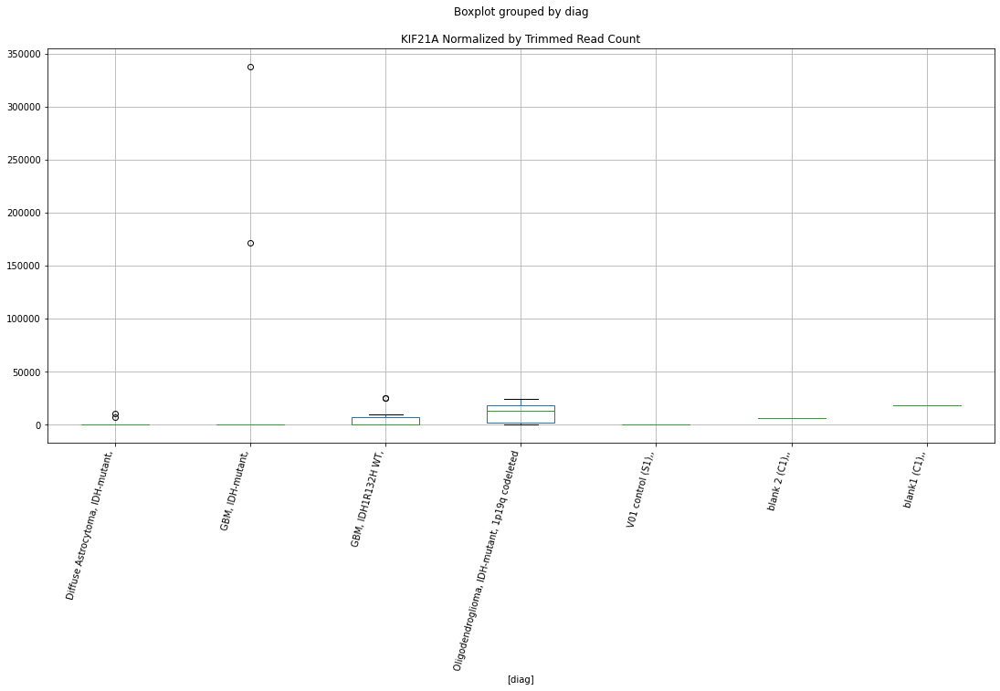

 p : 0.006601442501955663  ( t : 3.0697654552538793 ) :  D-plex  :  bbduk2  :  DOCK2
Control and blanks
73     4638.05
337    1780.31
Name: DOCK2, dtype: float64
205    7880.0
Name: DOCK2, dtype: float64
469    9464.44
Name: DOCK2, dtype: float64


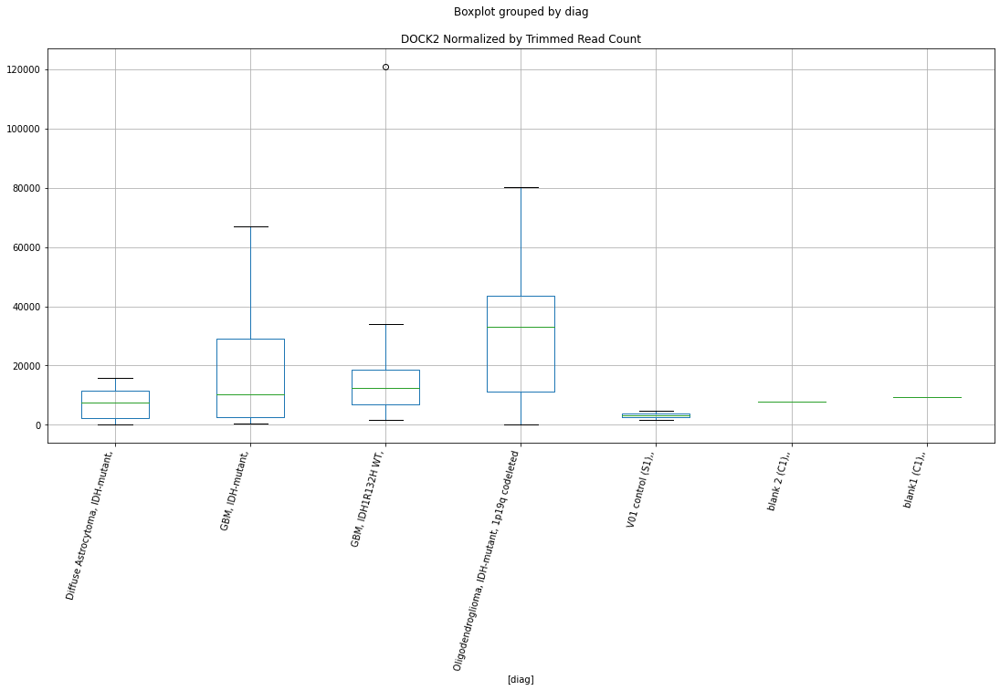

 p : 0.006646784985421223  ( t : 3.0666305954567674 ) :  D-plex  :  bbduk2  :  LINC01900
Control and blanks
73     33239.36
337        0.00
Name: LINC01900, dtype: float64
205    716.36
Name: LINC01900, dtype: float64
469    1183.05
Name: LINC01900, dtype: float64


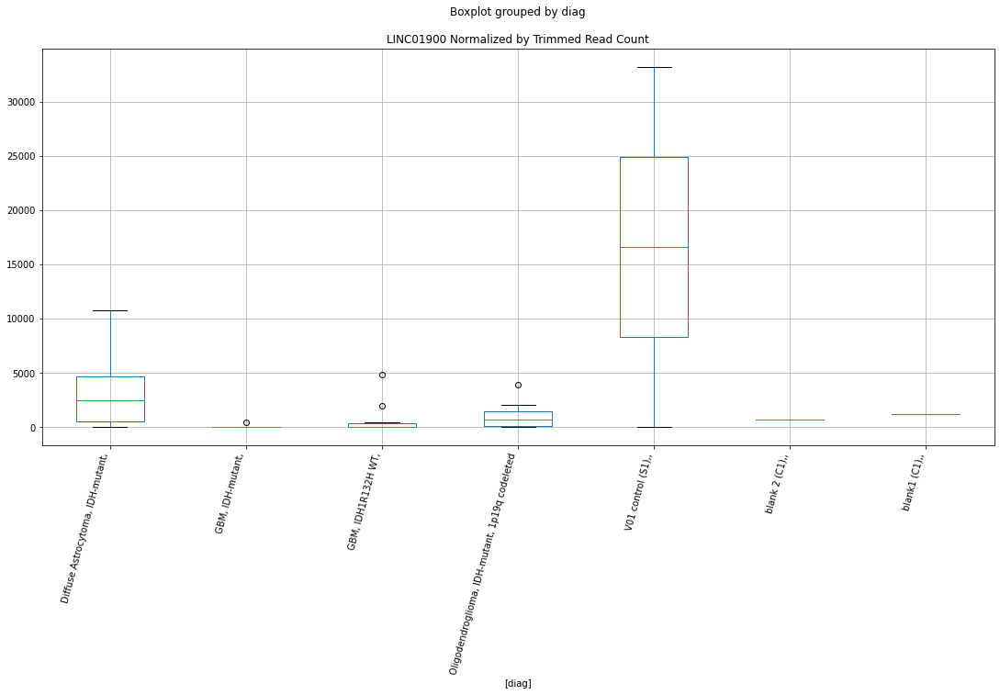

 p : 0.00669858789158025  ( t : 3.063074465814266 ) :  D-plex  :  cutadapt2  :  CHD8
Control and blanks
76     0.0
340    0.0
Name: CHD8, dtype: float64
208    1410.88
Name: CHD8, dtype: float64
472    577.96
Name: CHD8, dtype: float64


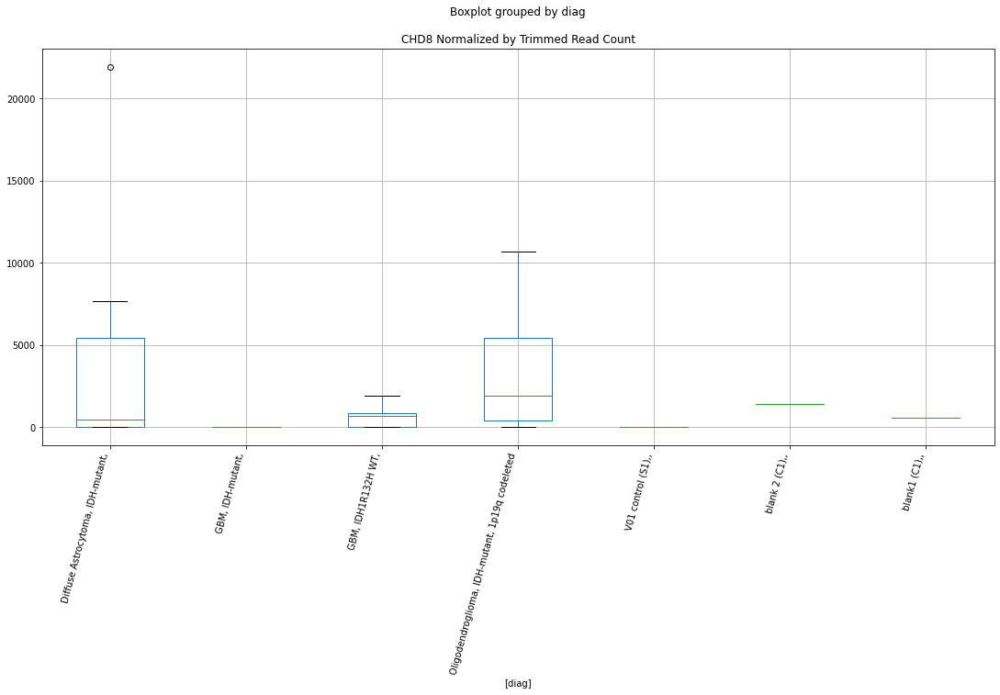

 p : 0.00686598733797817  ( t : 3.051763276213625 ) :  D-plex  :  bbduk2  :  LINC02812
Control and blanks
73        0.00
337    8901.57
Name: LINC02812, dtype: float64
205    358.18
Name: LINC02812, dtype: float64
469    0.0
Name: LINC02812, dtype: float64


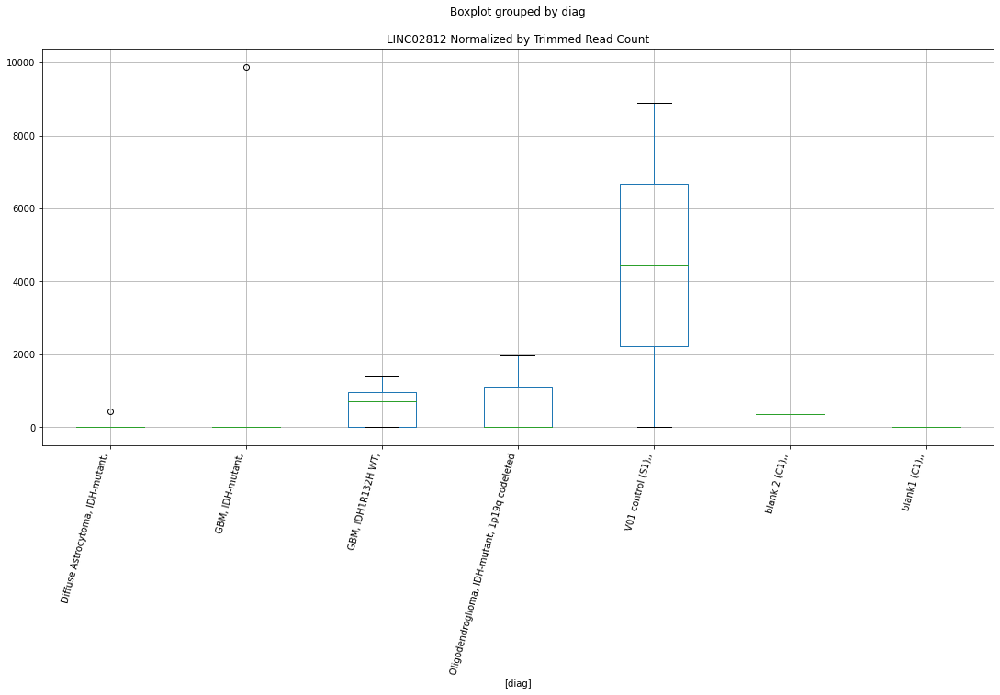

 p : 0.006878436554823846  ( t : 3.050932837538514 ) :  Lexogen  :  cutadapt2  :  ROBO2
Control and blanks
82         0.00
346    15151.29
Name: ROBO2, dtype: float64
214    0.0
Name: ROBO2, dtype: float64
478    7361.27
Name: ROBO2, dtype: float64


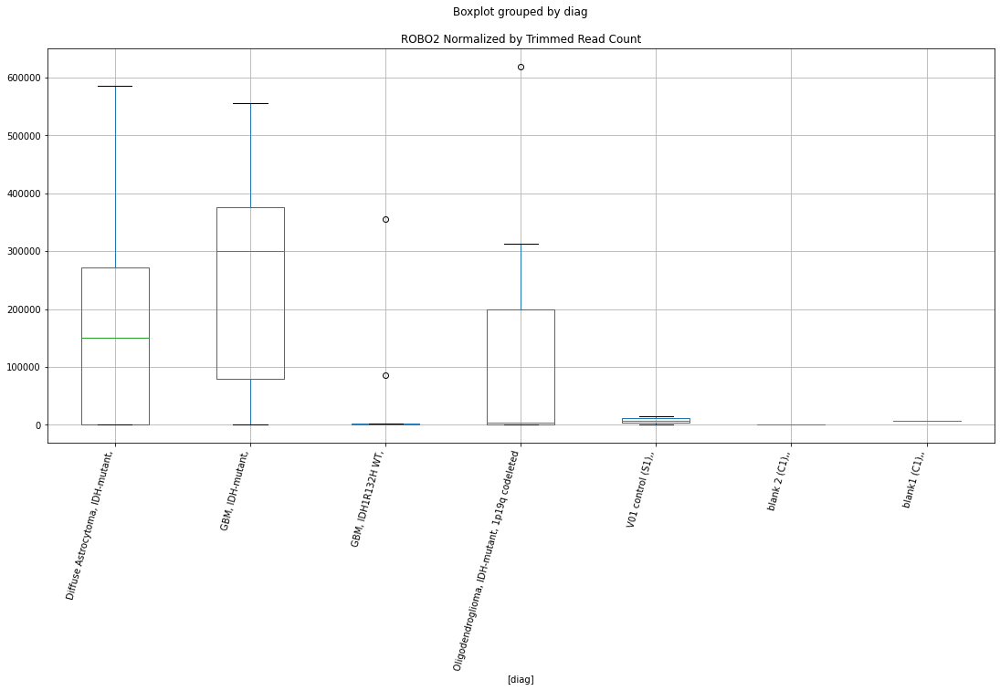

 p : 0.006927483317420045  ( t : 3.0476752889577003 ) :  D-plex  :  cutadapt2  :  LINC01900
Control and blanks
76     32577.41
340        0.00
Name: LINC01900, dtype: float64
208    881.8
Name: LINC01900, dtype: float64
472    1155.91
Name: LINC01900, dtype: float64


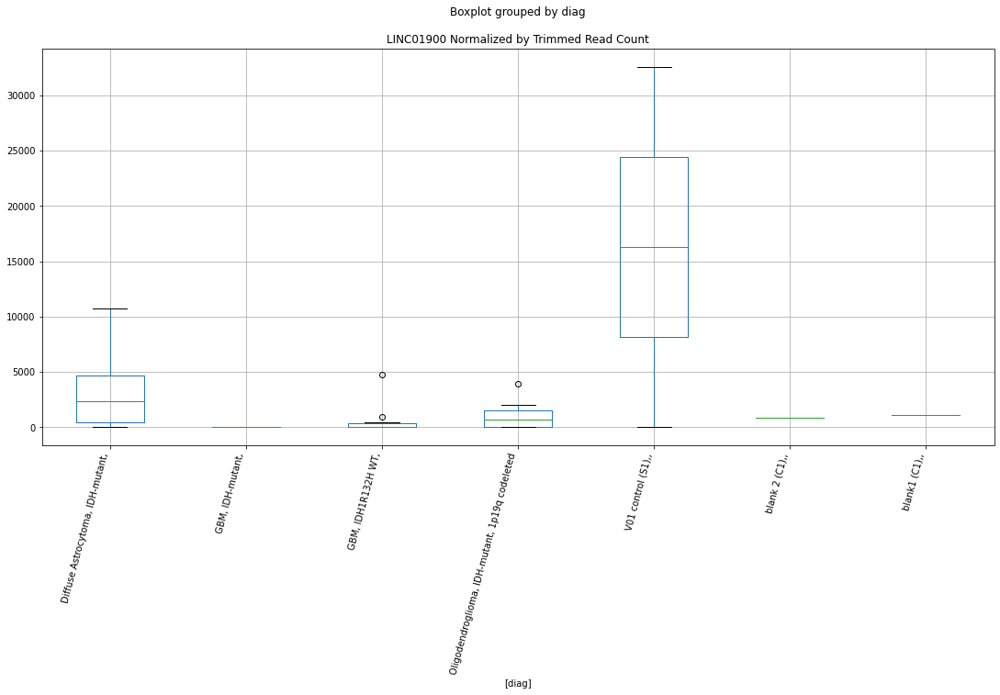

 p : 0.007135634124609691  ( t : 3.0340956268608172 ) :  D-plex  :  bbduk2  :  RPS27L
Control and blanks
73     0.0
337    0.0
Name: RPS27L, dtype: float64
205    1074.55
Name: RPS27L, dtype: float64
469    2366.11
Name: RPS27L, dtype: float64


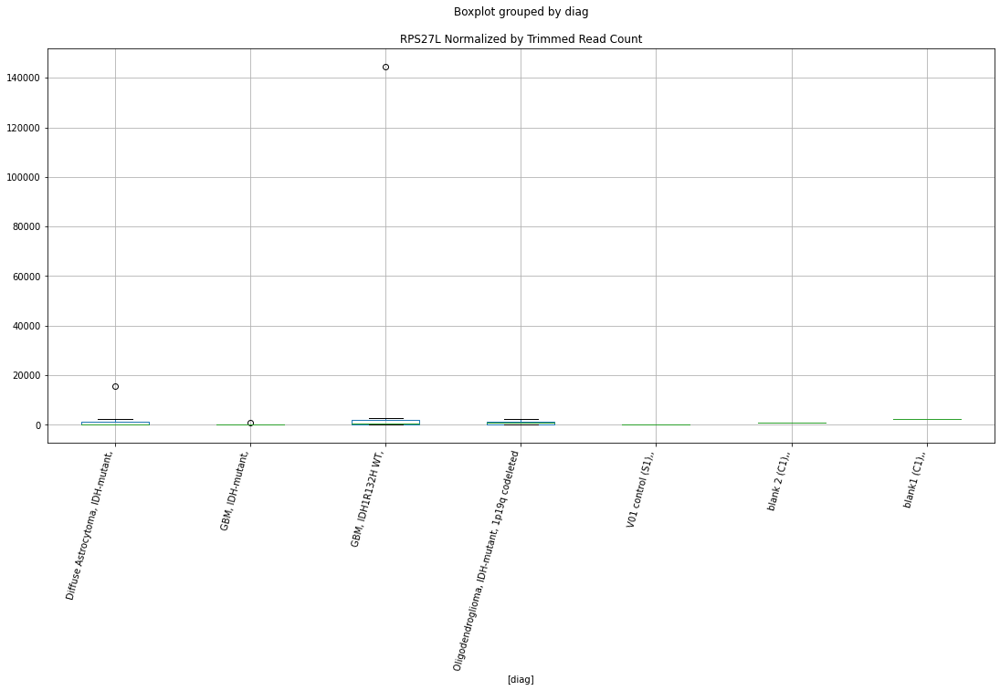

 p : 0.007140322904466106  ( t : 3.0337941904914487 ) :  D-plex  :  bbduk2  :  NCKAP1L
Control and blanks
73     1546.02
337       0.00
Name: NCKAP1L, dtype: float64
205    1432.73
Name: NCKAP1L, dtype: float64
469    2366.11
Name: NCKAP1L, dtype: float64


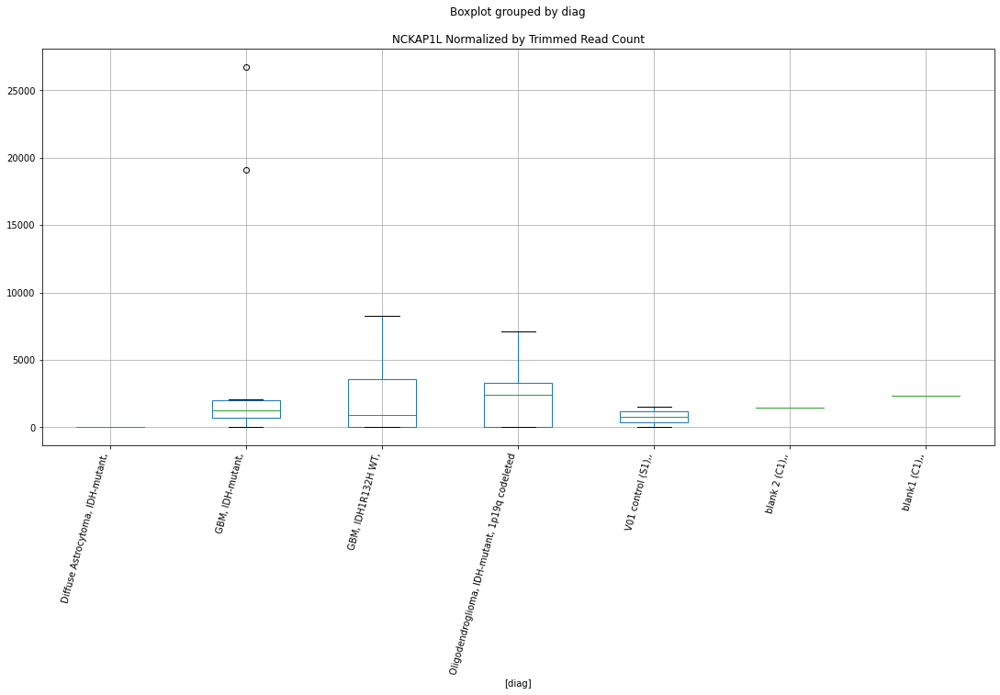

 p : 0.007158907967539978  ( t : 3.03260126810264 ) :  D-plex  :  bbduk2  :  TNIP3
Control and blanks
73     0.0
337    0.0
Name: TNIP3, dtype: float64
205    21490.91
Name: TNIP3, dtype: float64
469    14196.66
Name: TNIP3, dtype: float64


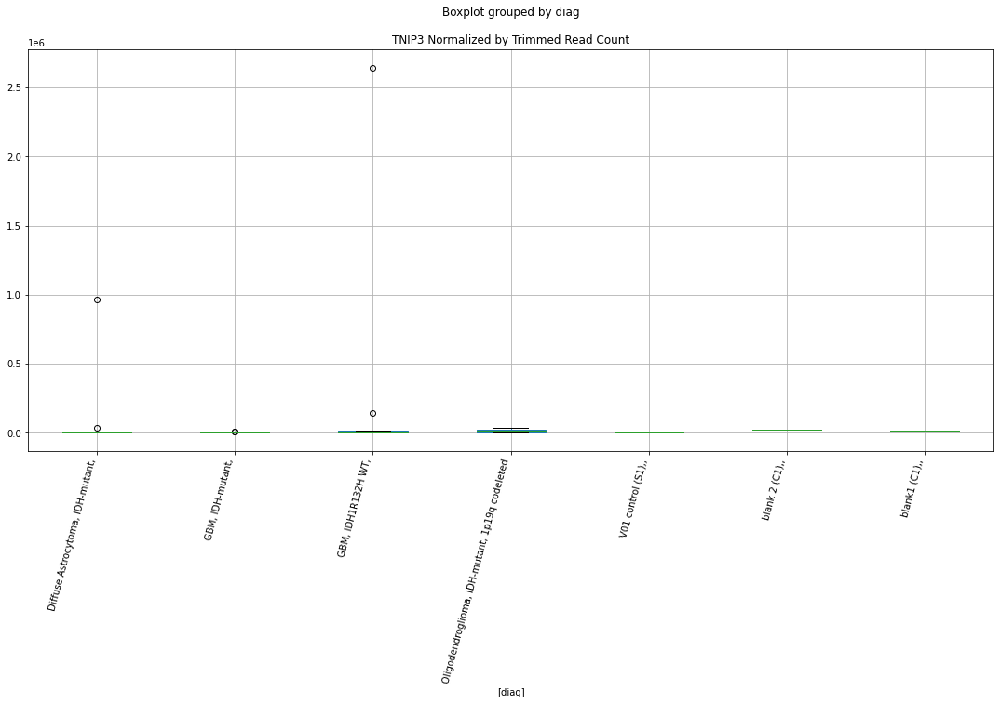

 p : 0.007297234969805112  ( t : 3.0238159058173153 ) :  D-plex  :  cutadapt2  :  HRH3
Control and blanks
76     0.0
340    0.0
Name: HRH3, dtype: float64
208    352.72
Name: HRH3, dtype: float64
472    4045.69
Name: HRH3, dtype: float64


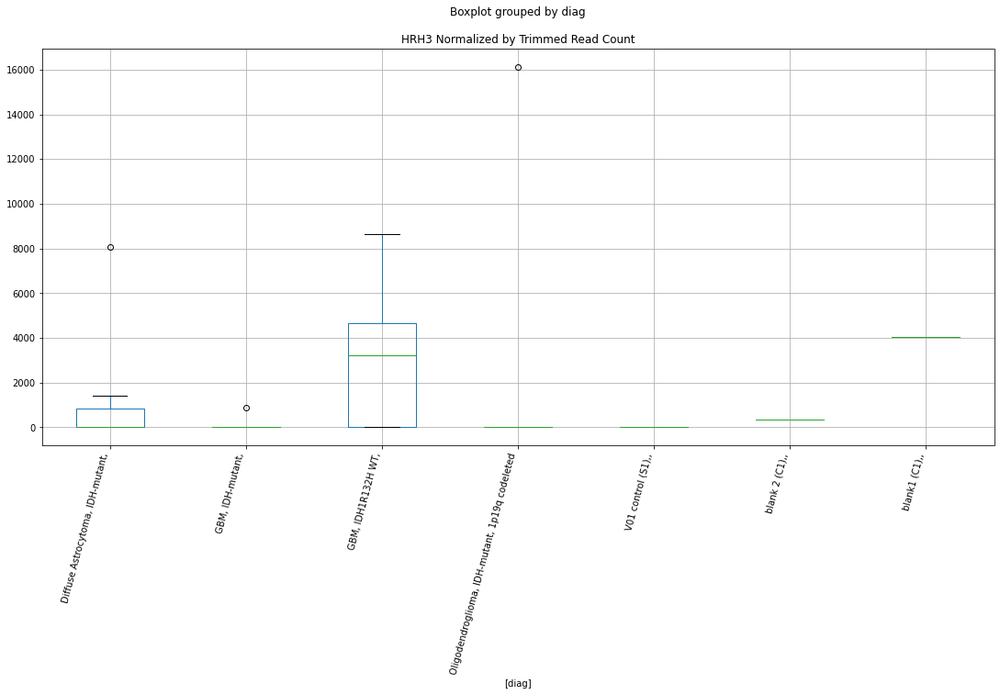

 p : 0.00737104526286178  ( t : 3.0191941066922006 ) :  D-plex  :  bbduk2  :  PM20D2
Control and blanks
73     0.0
337    0.0
Name: PM20D2, dtype: float64
205    2686.36
Name: PM20D2, dtype: float64
469    6506.8
Name: PM20D2, dtype: float64


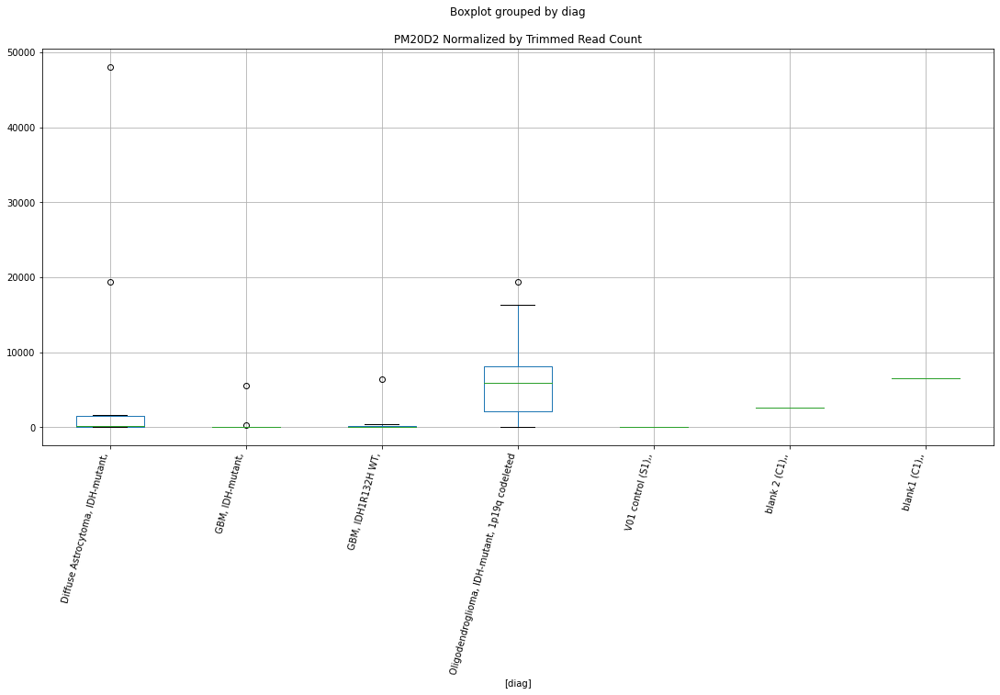

 p : 0.007406196635974806  ( t : 3.0170088100748433 ) :  Lexogen  :  bbduk2  :  MYO3A
Control and blanks
79     0.0
343    0.0
Name: MYO3A, dtype: float64
211    0.0
Name: MYO3A, dtype: float64
475    0.0
Name: MYO3A, dtype: float64


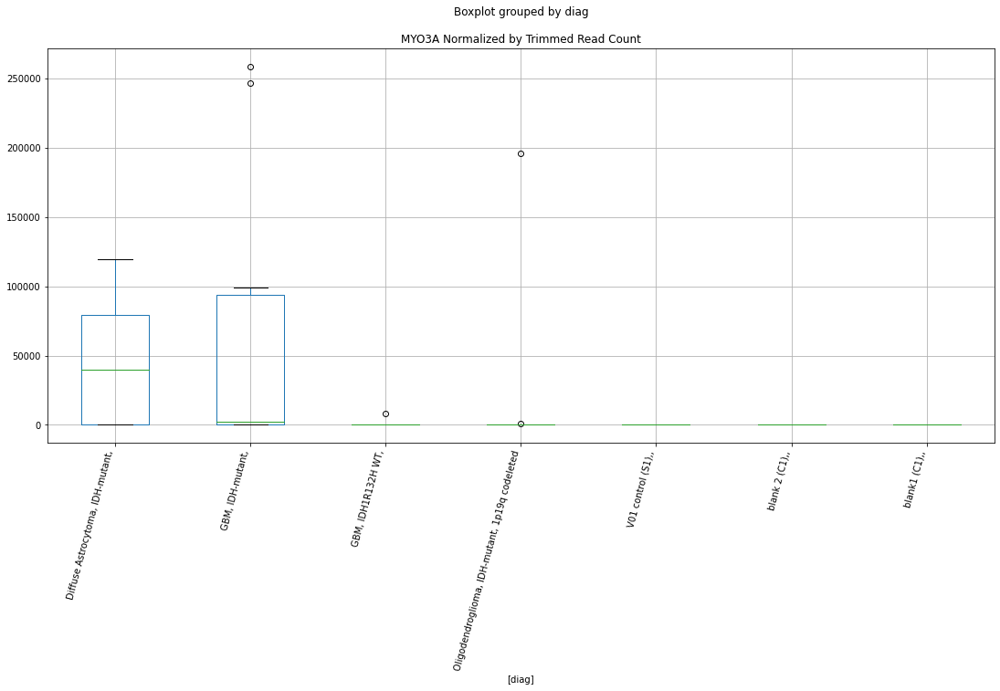

 p : 0.007440065199270884  ( t : 3.0149127748956044 ) :  D-plex  :  cutadapt2  :  MAFIP
Control and blanks
76     757.61
340      0.00
Name: MAFIP, dtype: float64
208    4585.37
Name: MAFIP, dtype: float64
472    4045.69
Name: MAFIP, dtype: float64


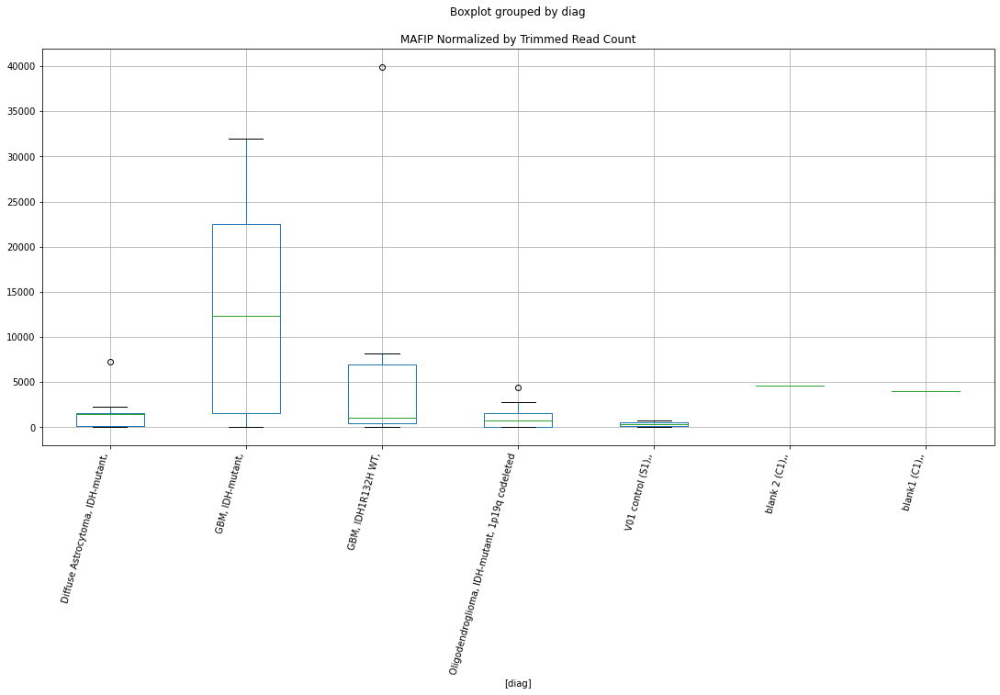

 p : 0.007463548344718934  ( t : 3.013464900349663 ) :  D-plex  :  cutadapt2  :  IL2
Control and blanks
76     3030.46
340    5284.39
Name: IL2, dtype: float64
208    11639.77
Name: IL2, dtype: float64
472    528251.64
Name: IL2, dtype: float64


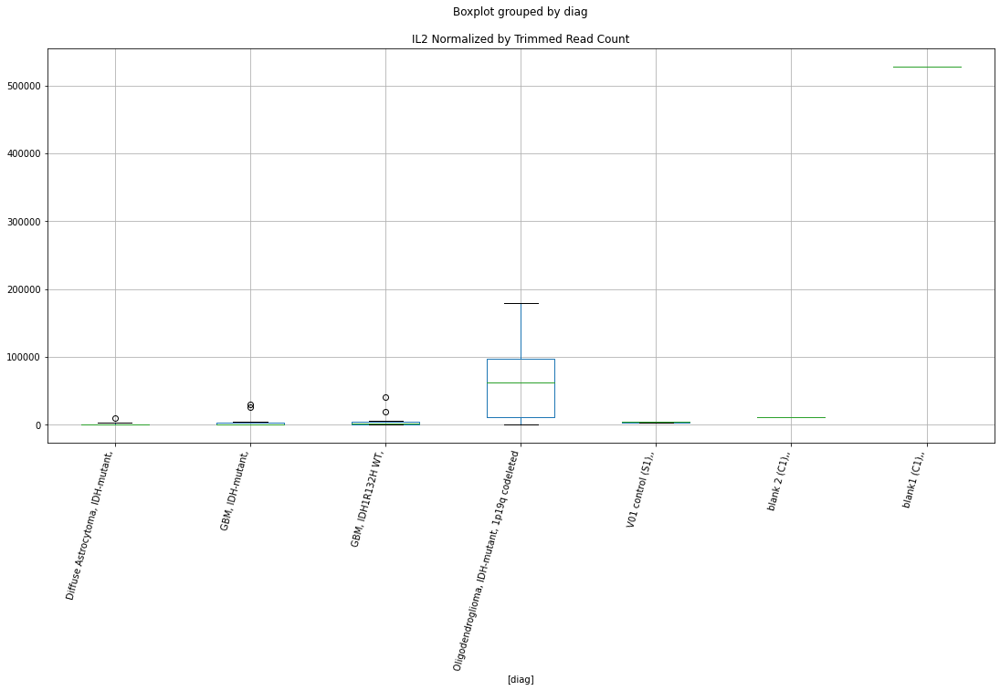

 p : 0.007475489949250835  ( t : 3.012730326469399 ) :  Lexogen  :  bbduk2  :  ADARB2
Control and blanks
79         0.0
343    14862.0
Name: ADARB2, dtype: float64
211    2459.76
Name: ADARB2, dtype: float64
475    0.0
Name: ADARB2, dtype: float64


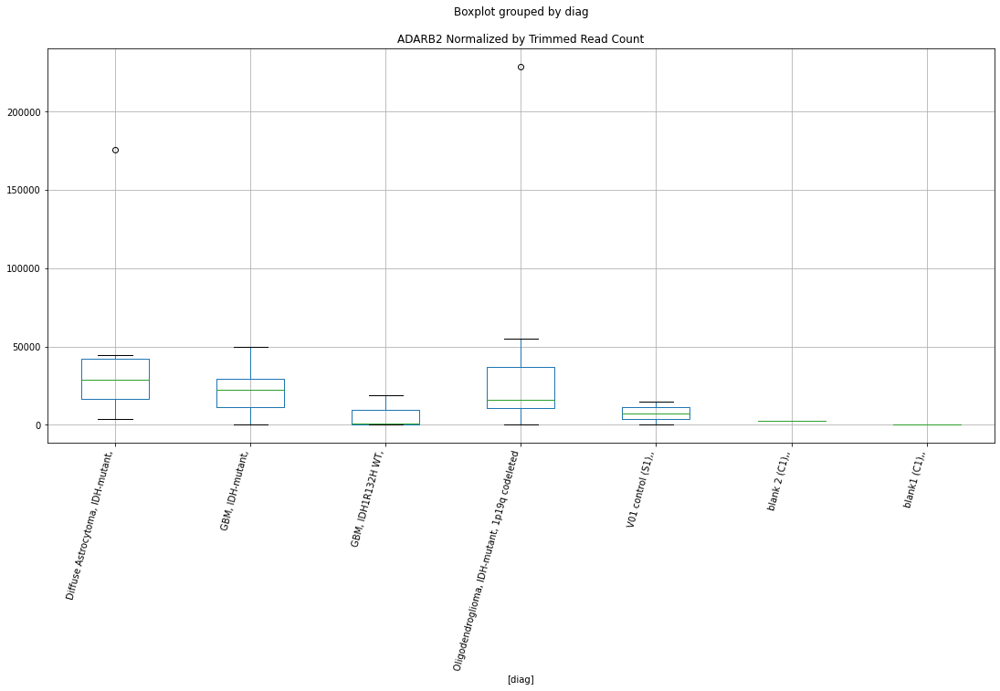

 p : 0.00749041656354098  ( t : 3.0118137344012794 ) :  Lexogen  :  cutadapt2  :  ADARB2
Control and blanks
82         0.00
346    14940.85
Name: ADARB2, dtype: float64
214    2441.04
Name: ADARB2, dtype: float64
478    0.0
Name: ADARB2, dtype: float64


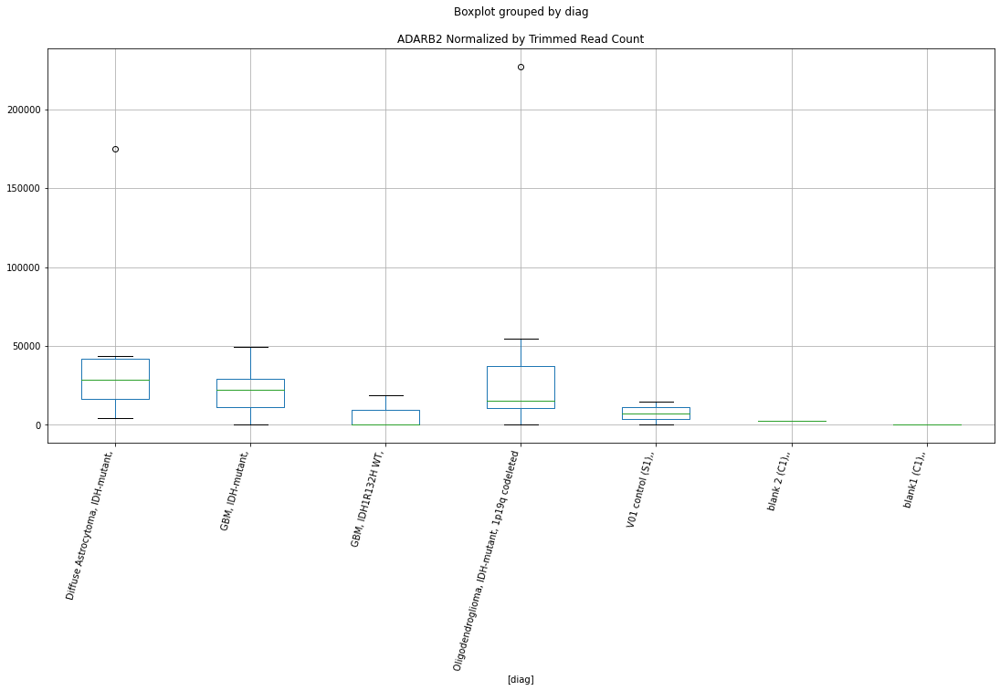

 p : 0.0075273588981610105  ( t : 3.0095528397882805 ) :  Lexogen  :  cutadapt2  :  MYO3A
Control and blanks
82     0.0
346    0.0
Name: MYO3A, dtype: float64
214    0.0
Name: MYO3A, dtype: float64
478    0.0
Name: MYO3A, dtype: float64


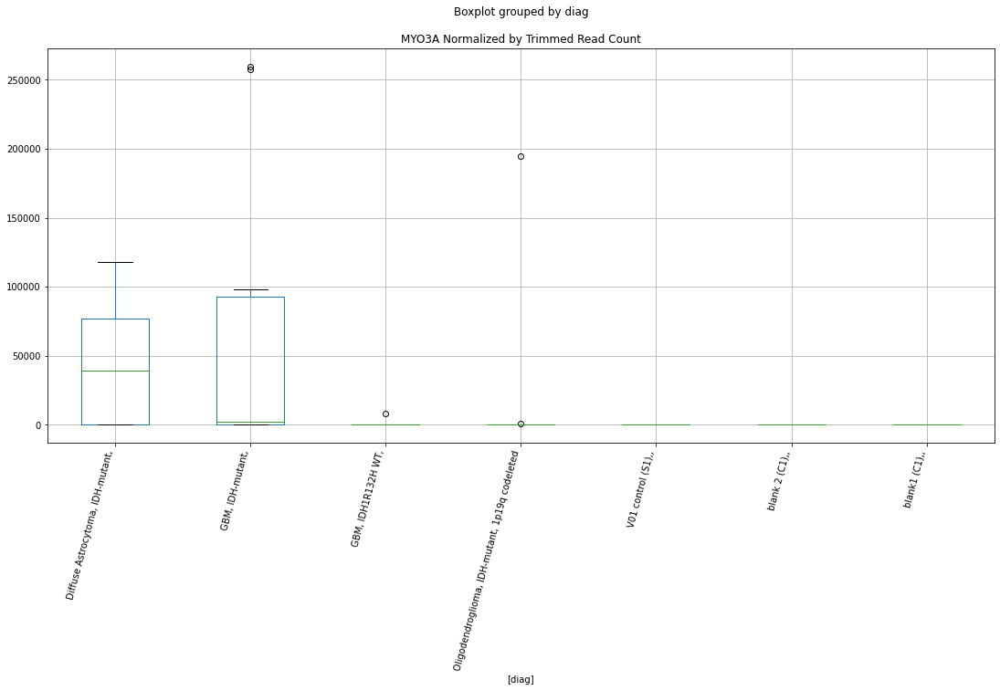

 p : 0.007549202392994358  ( t : 3.0082210685737736 ) :  Lexogen  :  bbduk2  :  LOC105375322
Control and blanks
79     0.0
343    0.0
Name: LOC105375322, dtype: float64
211    2733.06
Name: LOC105375322, dtype: float64
475    0.0
Name: LOC105375322, dtype: float64


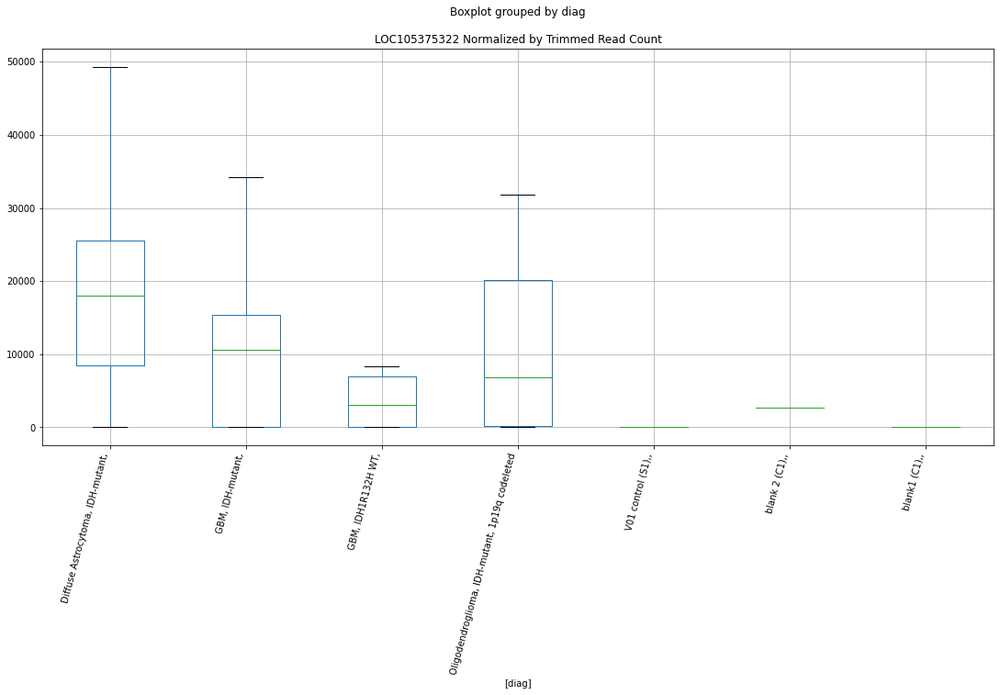

 p : 0.007565590163116123  ( t : 3.0072243810418713 ) :  D-plex  :  cutadapt2  :  GEMIN4
Control and blanks
76      6060.91
340    14091.71
Name: GEMIN4, dtype: float64
208    321151.96
Name: GEMIN4, dtype: float64
472    73978.35
Name: GEMIN4, dtype: float64


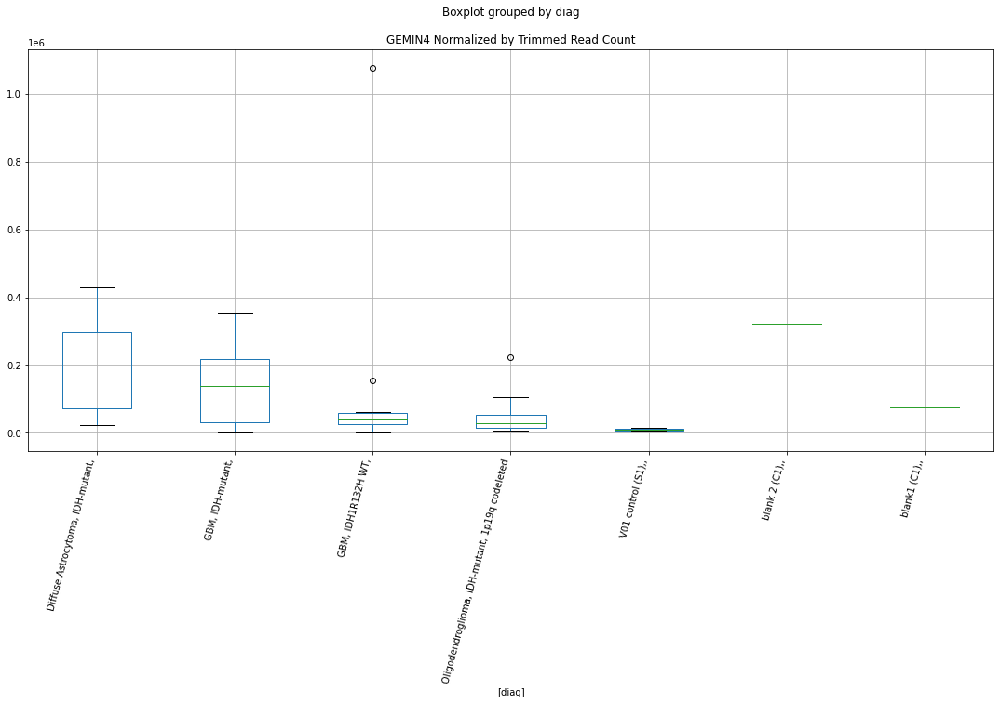

 p : 0.007612233806683337  ( t : 3.0043989958751887 ) :  Lexogen  :  bbduk2  :  ZNF771
Control and blanks
79     0.0
343    0.0
Name: ZNF771, dtype: float64
211    0.0
Name: ZNF771, dtype: float64
475    12933.85
Name: ZNF771, dtype: float64


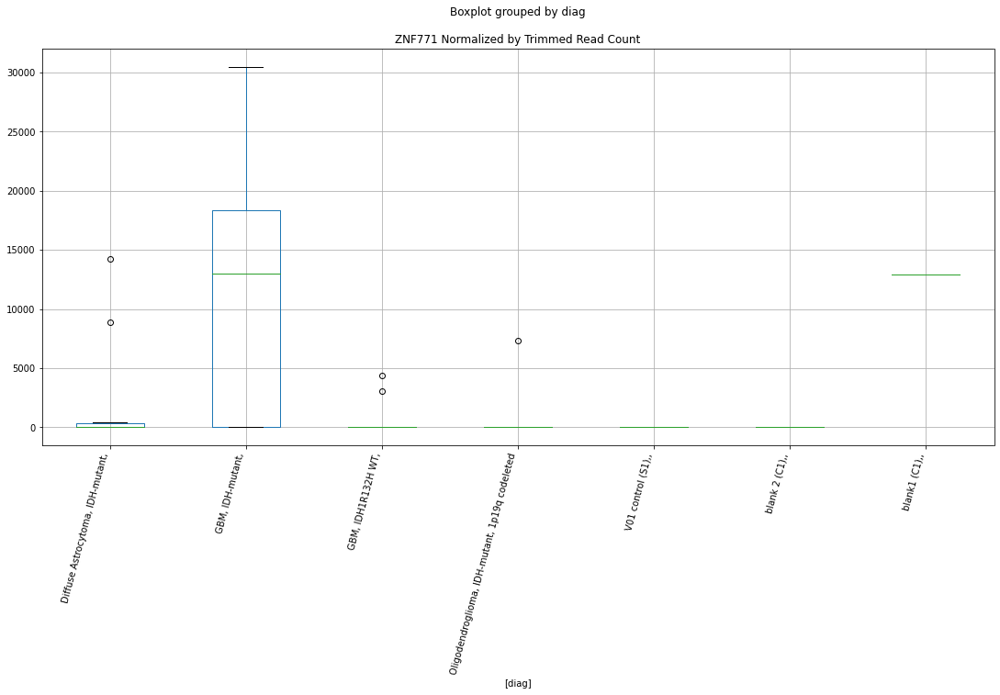

 p : 0.00761409555433088  ( t : 3.004286571857205 ) :  D-plex  :  cutadapt2  :  IL34
Control and blanks
76     2272.84
340       0.00
Name: IL34, dtype: float64
208    91707.31
Name: IL34, dtype: float64
472    924151.39
Name: IL34, dtype: float64


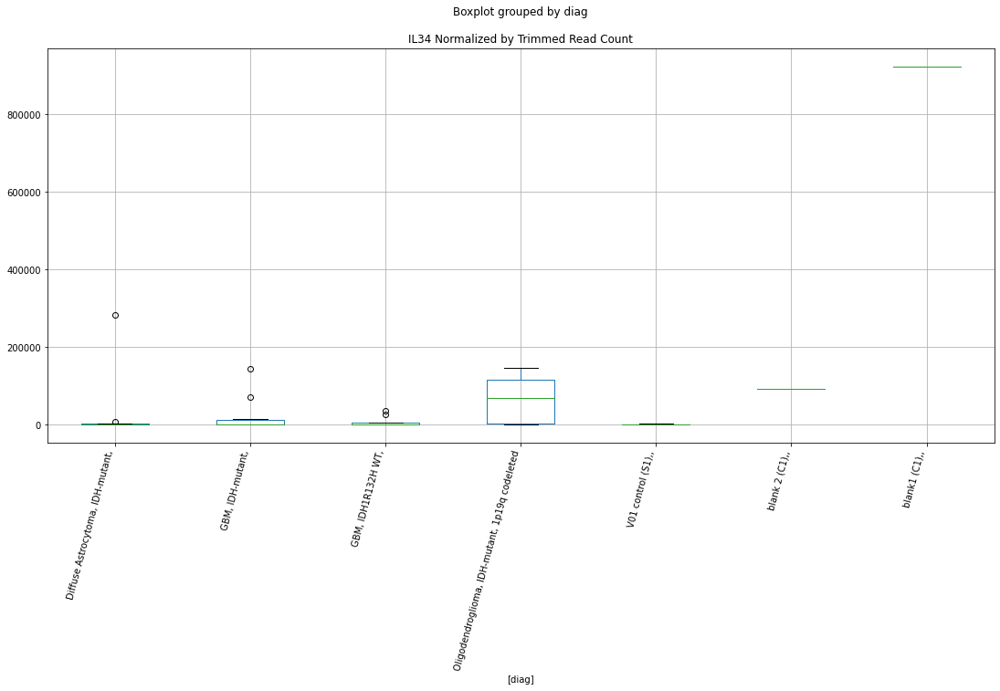

 p : 0.007634942153469109  ( t : 3.003029542794728 ) :  D-plex  :  bbduk2  :  IL34
Control and blanks
73     2319.03
337       0.00
Name: IL34, dtype: float64
205    92590.02
Name: IL34, dtype: float64
469    942303.02
Name: IL34, dtype: float64


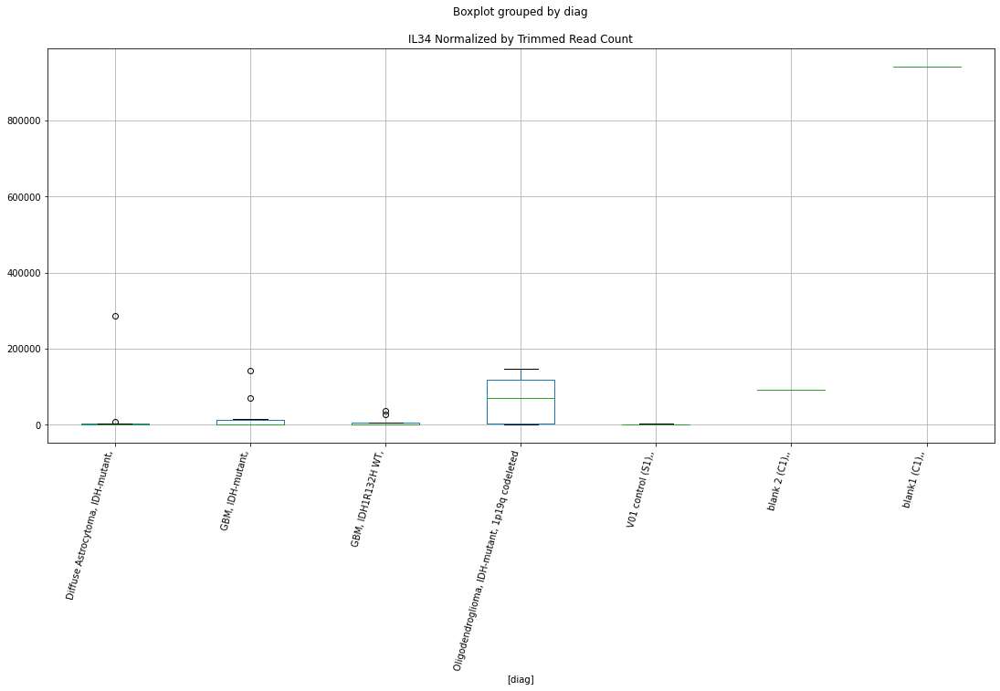

 p : 0.007653356804447795  ( t : 3.0019219267244566 ) :  Lexogen  :  cutadapt2  :  ZNF771
Control and blanks
82     0.0
346    0.0
Name: ZNF771, dtype: float64
214    0.0
Name: ZNF771, dtype: float64
478    12822.87
Name: ZNF771, dtype: float64


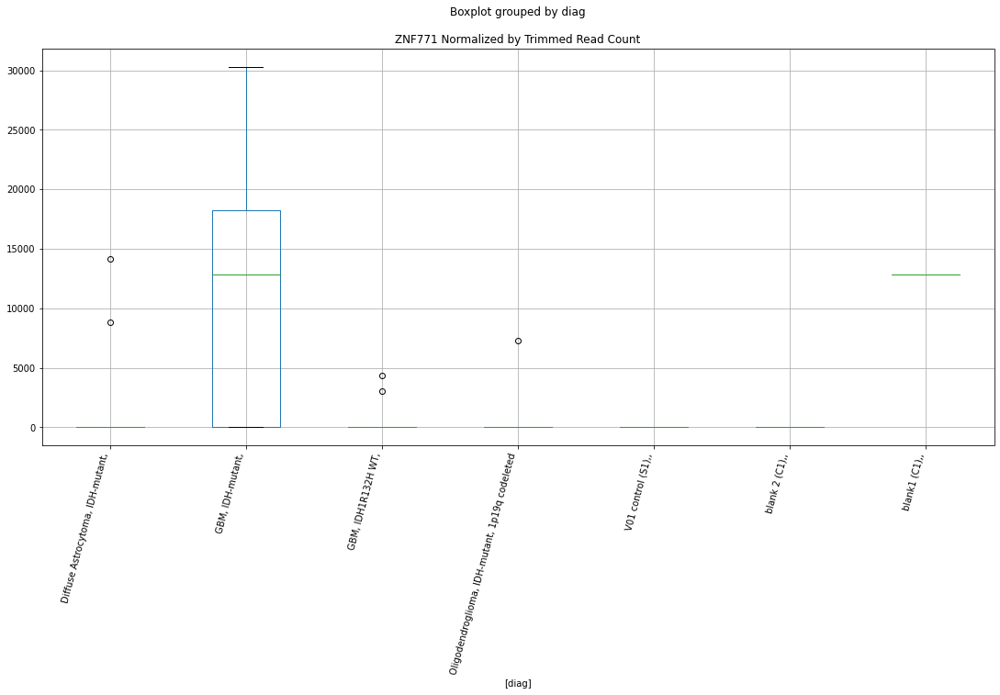

 p : 0.007681276021055589  ( t : 3.0002475495873204 ) :  D-plex  :  bbduk2  :  IL2
Control and blanks
73     3092.03
337    5340.94
Name: IL2, dtype: float64
205    11461.82
Name: IL2, dtype: float64
469    538289.86
Name: IL2, dtype: float64


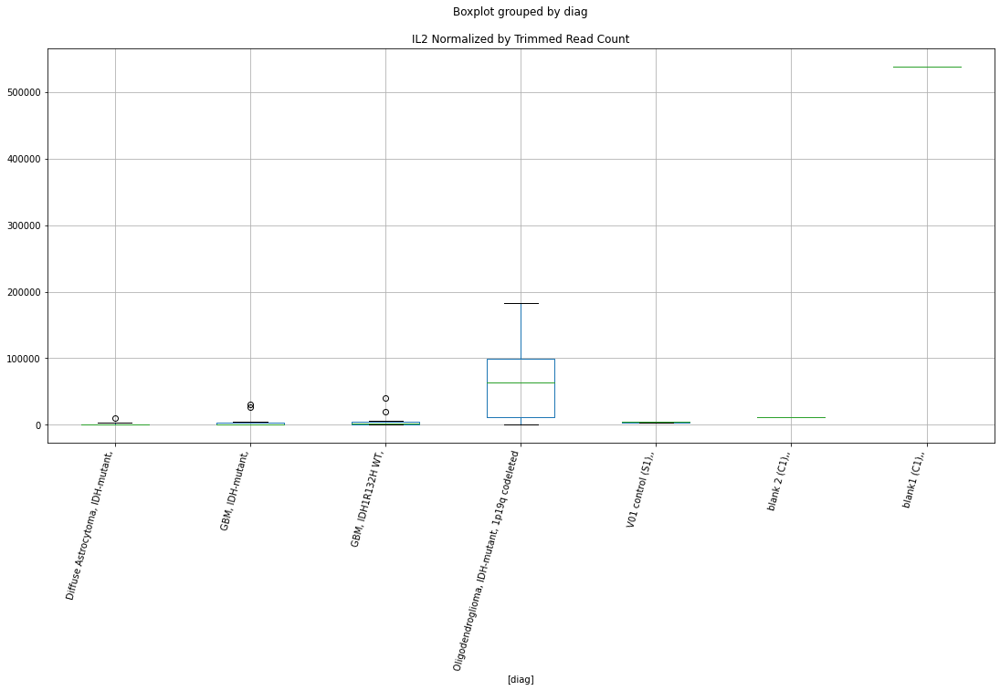

 p : 0.007698477248115684  ( t : 2.9992188929494086 ) :  D-plex  :  cutadapt2  :  UBE2QL1
Control and blanks
76     0.0
340    0.0
Name: UBE2QL1, dtype: float64
208    881.8
Name: UBE2QL1, dtype: float64
472    2311.82
Name: UBE2QL1, dtype: float64


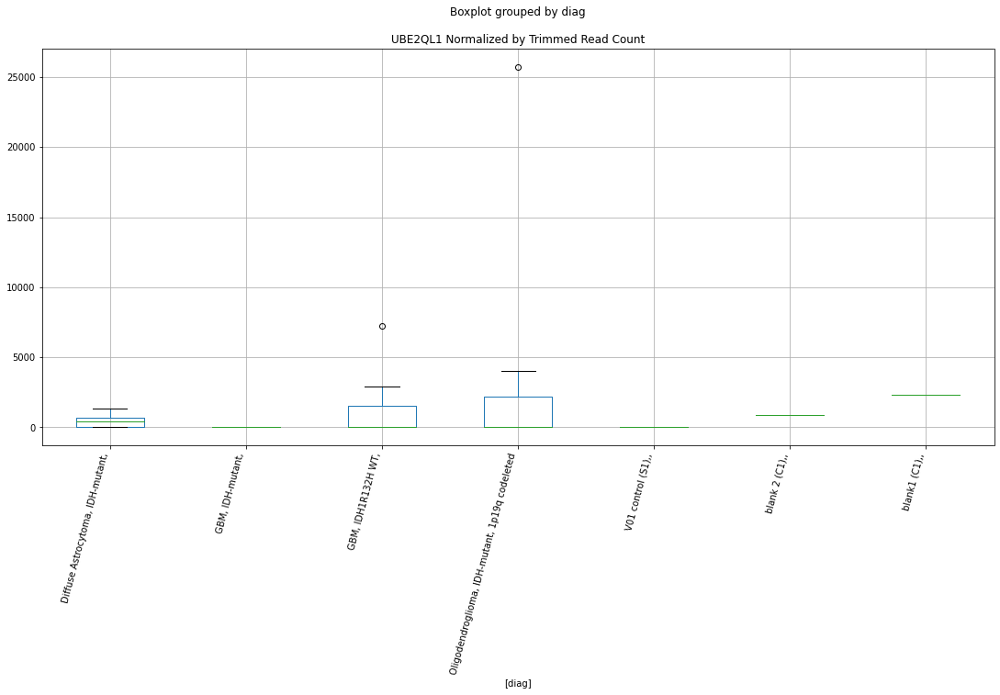

 p : 0.0077875505902624135  ( t : 2.9939276208270917 ) :  D-plex  :  cutadapt2  :  HSPH1
Control and blanks
76     102277.92
340     13210.98
Name: HSPH1, dtype: float64
208    38975.61
Name: HSPH1, dtype: float64
472    67042.88
Name: HSPH1, dtype: float64


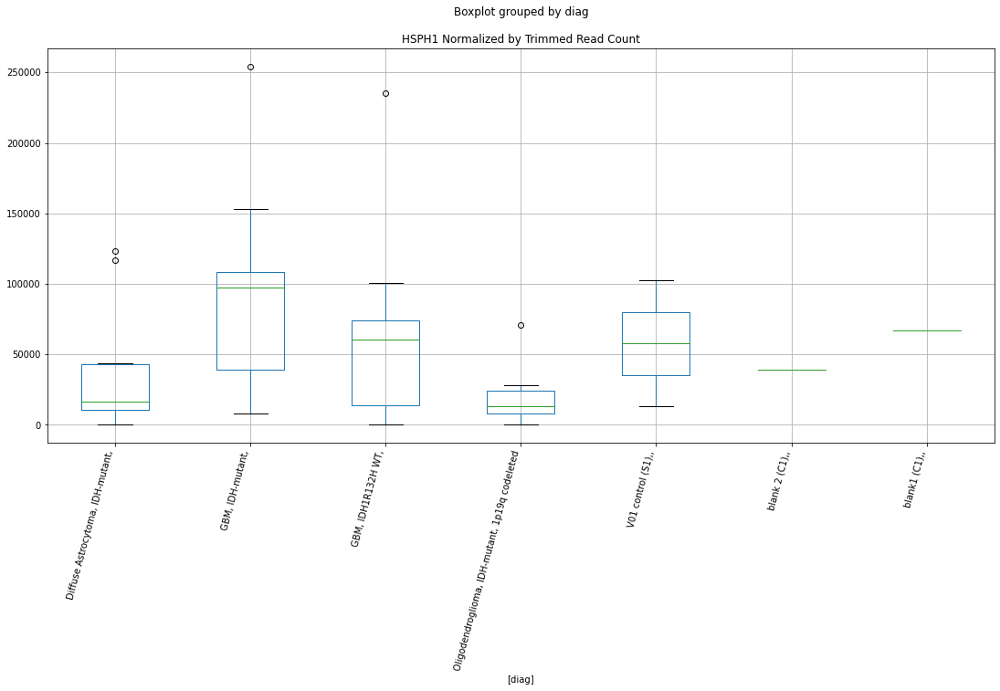

 p : 0.007789672704706444  ( t : 2.9938022774147868 ) :  D-plex  :  cutadapt2  :  POMC
Control and blanks
76     6060.91
340       0.00
Name: POMC, dtype: float64
208    7759.85
Name: POMC, dtype: float64
472    13292.98
Name: POMC, dtype: float64


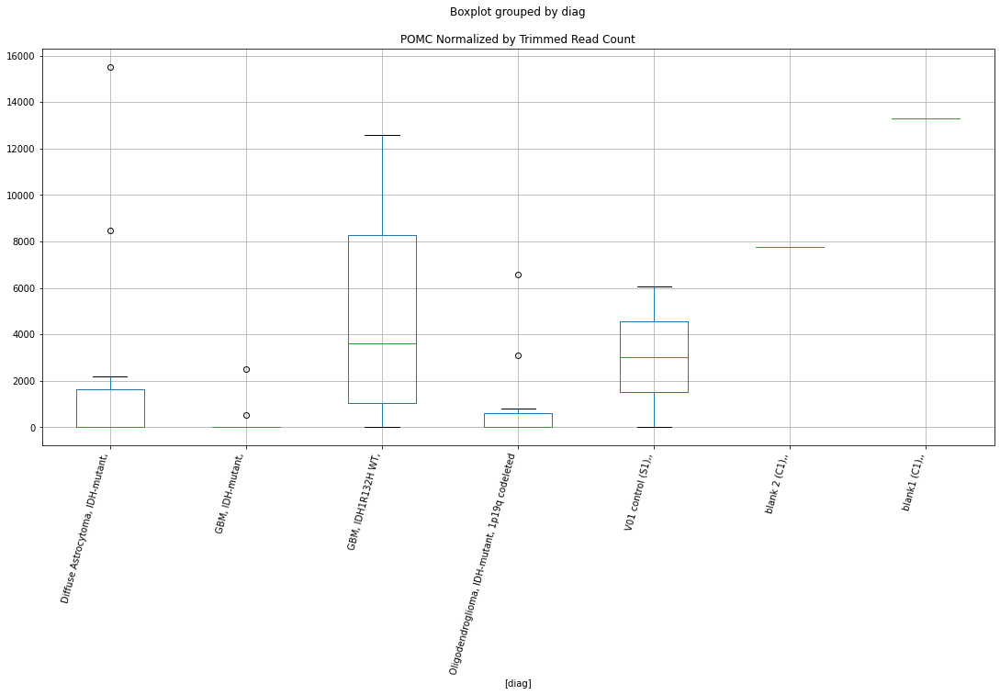

 p : 0.007874960157458945  ( t : 2.9887919789009443 ) :  Lexogen  :  bbduk2  :  SELL
Control and blanks
79     0.0
343    0.0
Name: SELL, dtype: float64
211    0.0
Name: SELL, dtype: float64
475    0.0
Name: SELL, dtype: float64


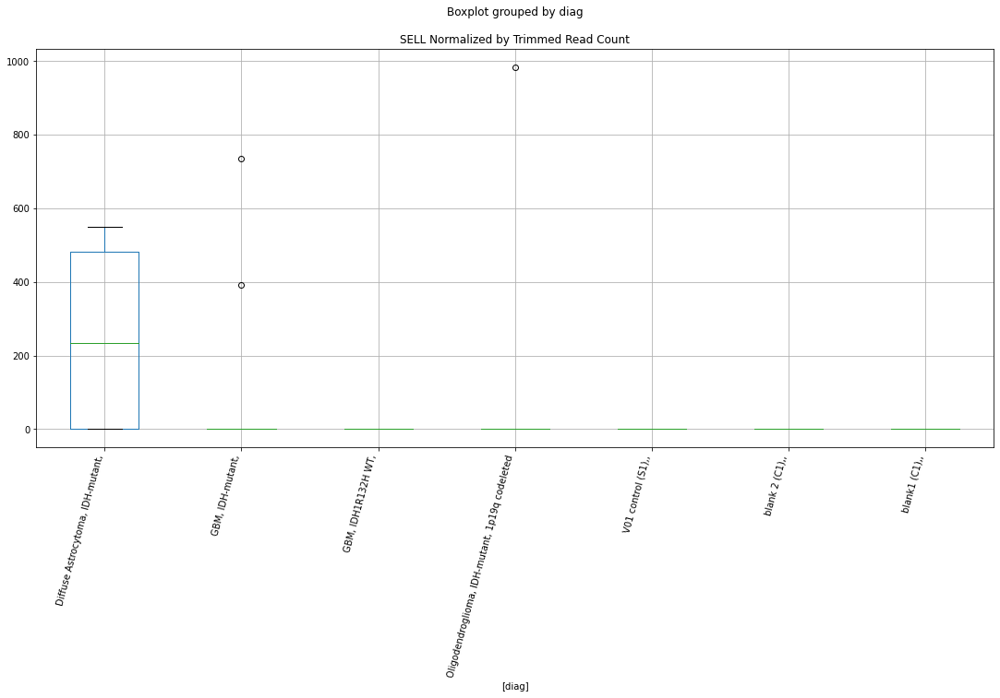

 p : 0.00805929741567664  ( t : 2.978140369166568 ) :  D-plex  :  bbduk2  :  PCDHB10
Control and blanks
73     0.0
337    0.0
Name: PCDHB10, dtype: float64
205    30266.37
Name: PCDHB10, dtype: float64
469    591.53
Name: PCDHB10, dtype: float64


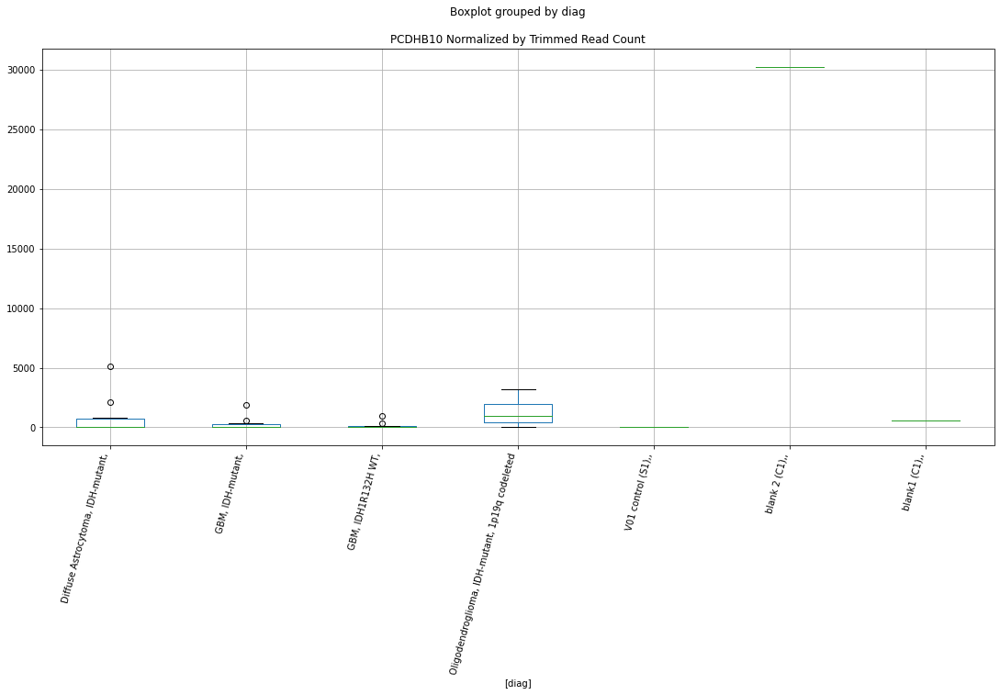

 p : 0.008139284039649754  ( t : 2.973591804479684 ) :  D-plex  :  cutadapt2  :  LOC105373946
Control and blanks
76     757.61
340      0.00
Name: LOC105373946, dtype: float64
208    2469.04
Name: LOC105373946, dtype: float64
472    3467.74
Name: LOC105373946, dtype: float64


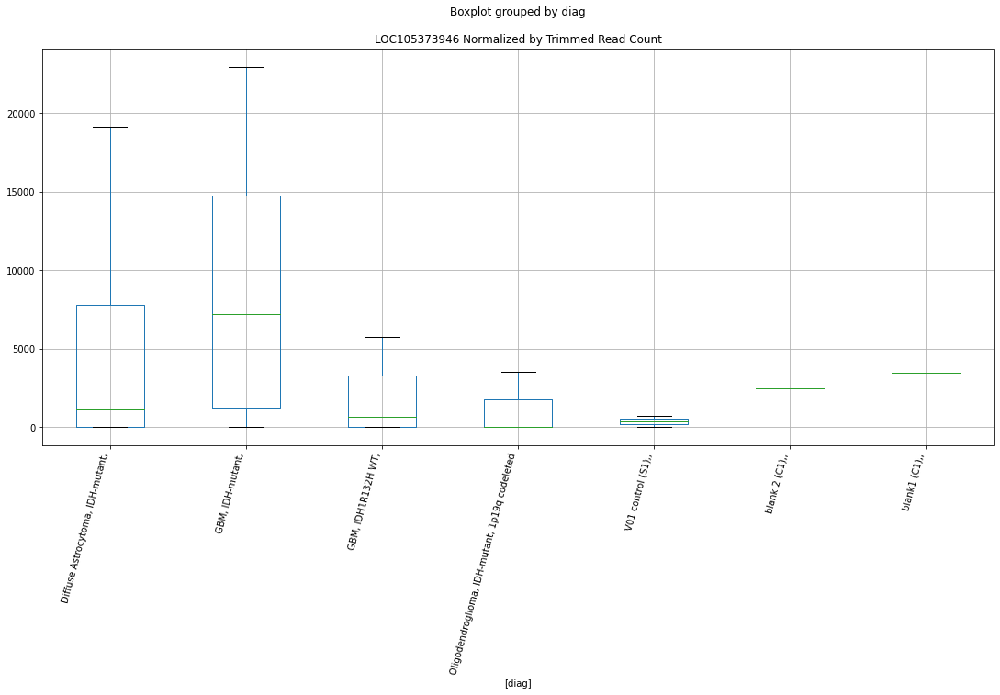

 p : 0.008141508808798182  ( t : 2.9734659099774707 ) :  Lexogen  :  bbduk2  :  ZNF771
Control and blanks
79     0.0
343    0.0
Name: ZNF771, dtype: float64
211    0.0
Name: ZNF771, dtype: float64
475    12933.85
Name: ZNF771, dtype: float64


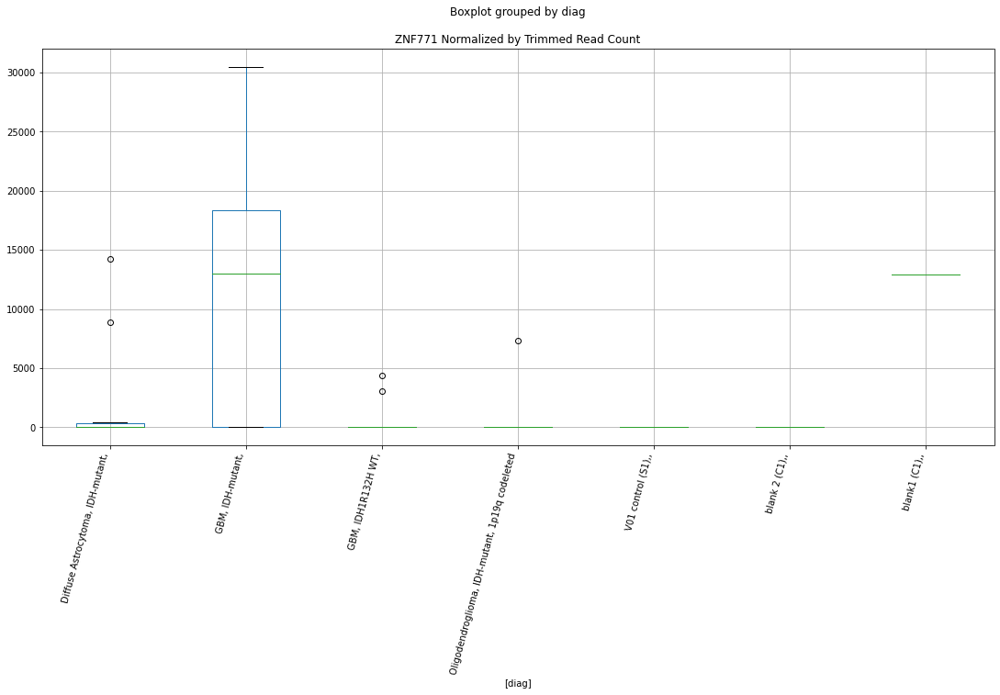

 p : 0.008172007266528444  ( t : 2.9717434279324855 ) :  D-plex  :  cutadapt2  :  SNX5
Control and blanks
76     0.0
340    0.0
Name: SNX5, dtype: float64
208    529.08
Name: SNX5, dtype: float64
472    3467.74
Name: SNX5, dtype: float64


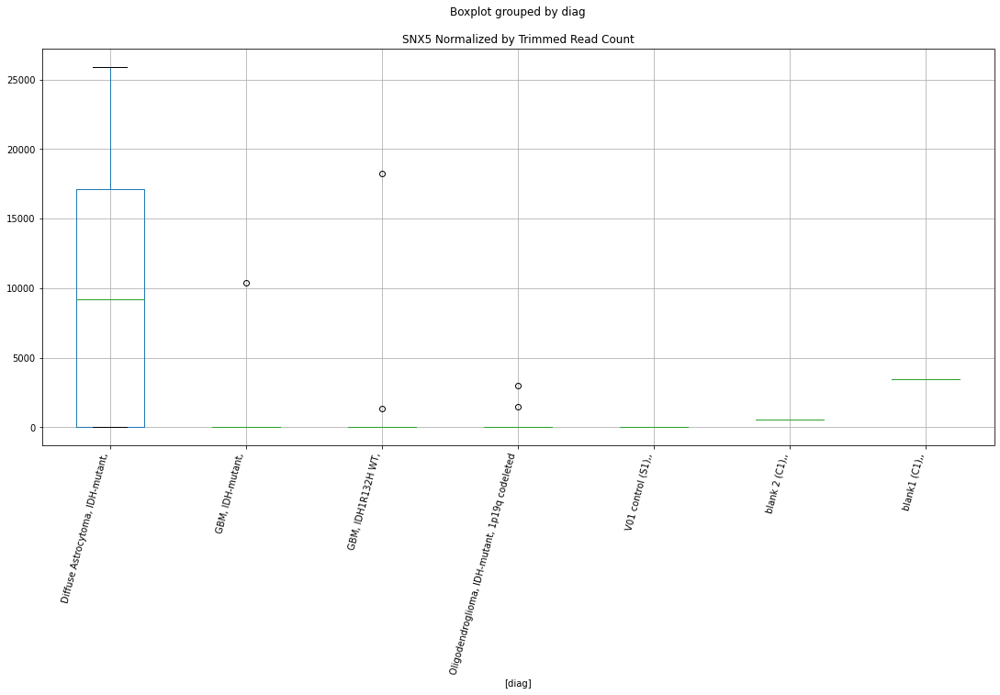

 p : 0.008181085932439398  ( t : 2.9712318896139562 ) :  Lexogen  :  cutadapt2  :  ZNF771
Control and blanks
82     0.0
346    0.0
Name: ZNF771, dtype: float64
214    0.0
Name: ZNF771, dtype: float64
478    12822.87
Name: ZNF771, dtype: float64


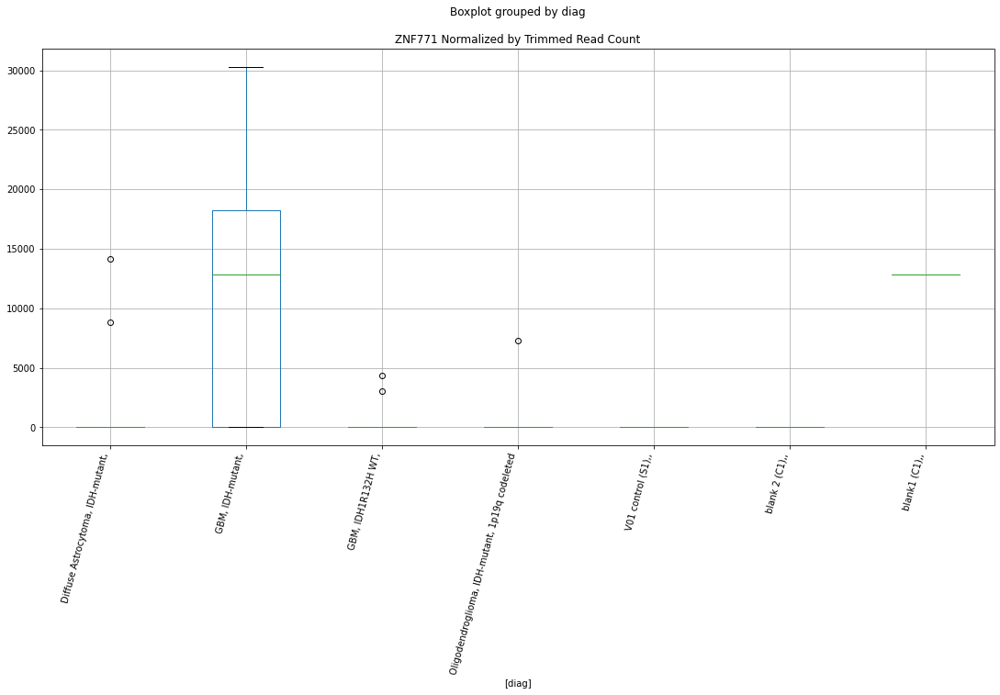

 p : 0.00820723278430788  ( t : 2.969761711637172 ) :  D-plex  :  bbduk2  :  DYNC2H1
Control and blanks
73     4638.05
337    4450.79
Name: DYNC2H1, dtype: float64
205    12357.28
Name: DYNC2H1, dtype: float64
469    13605.13
Name: DYNC2H1, dtype: float64


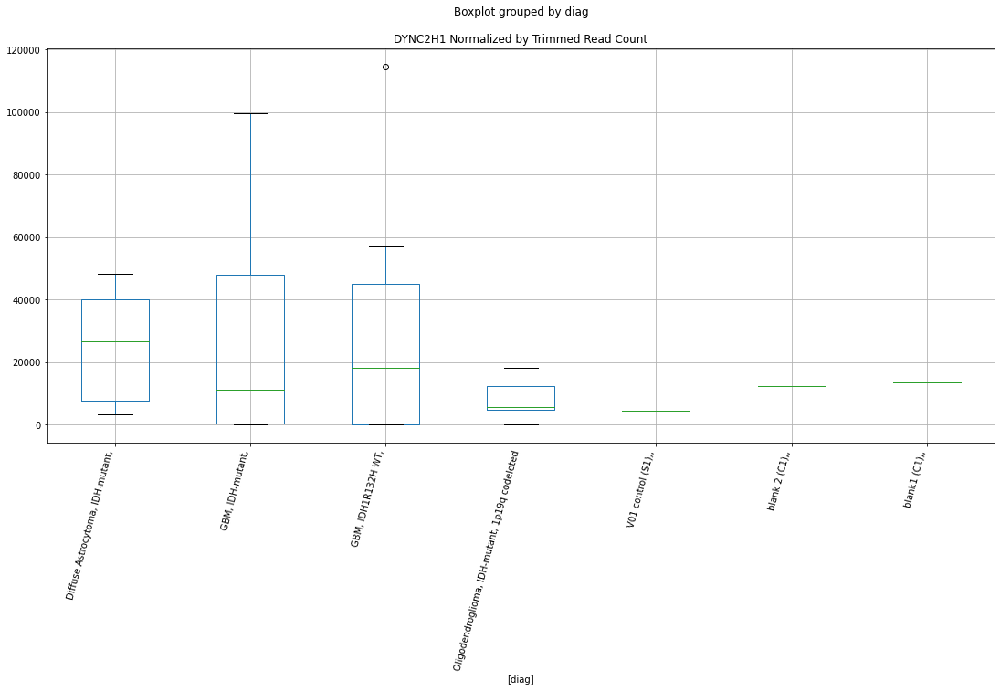

 p : 0.008229137350892264  ( t : 2.968533558664873 ) :  D-plex  :  bbduk2  :  LOC105373946
Control and blanks
73     773.01
337      0.00
Name: LOC105373946, dtype: float64
205    2507.27
Name: LOC105373946, dtype: float64
469    3549.16
Name: LOC105373946, dtype: float64


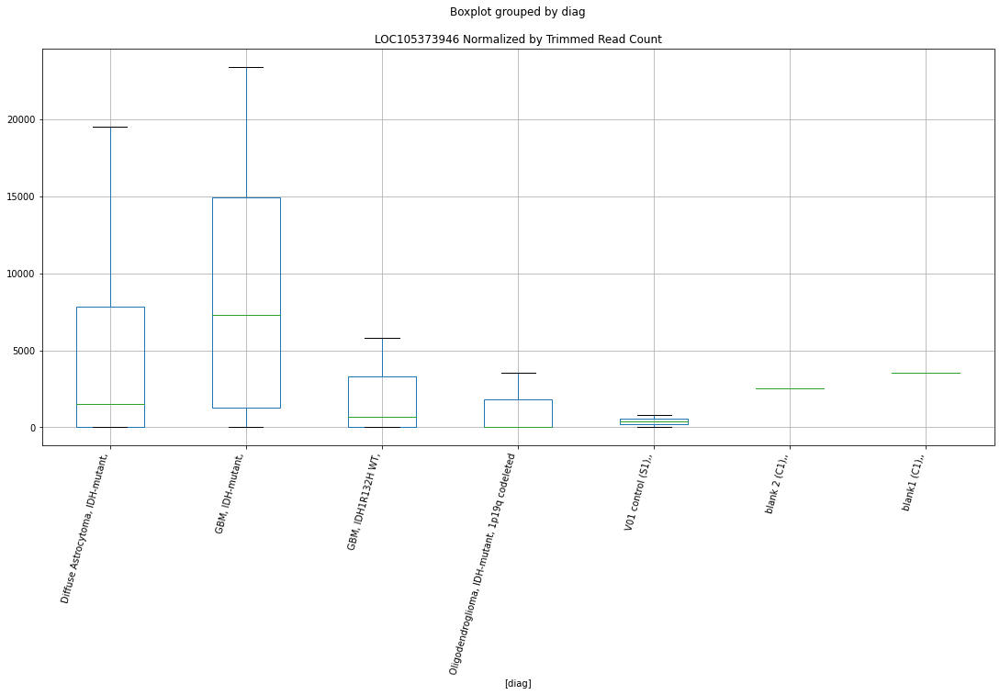

 p : 0.008258654896497136  ( t : 2.9668835612907754 ) :  D-plex  :  bbduk2  :  SNX5
Control and blanks
73     0.0
337    0.0
Name: SNX5, dtype: float64
205    537.27
Name: SNX5, dtype: float64
469    3549.16
Name: SNX5, dtype: float64


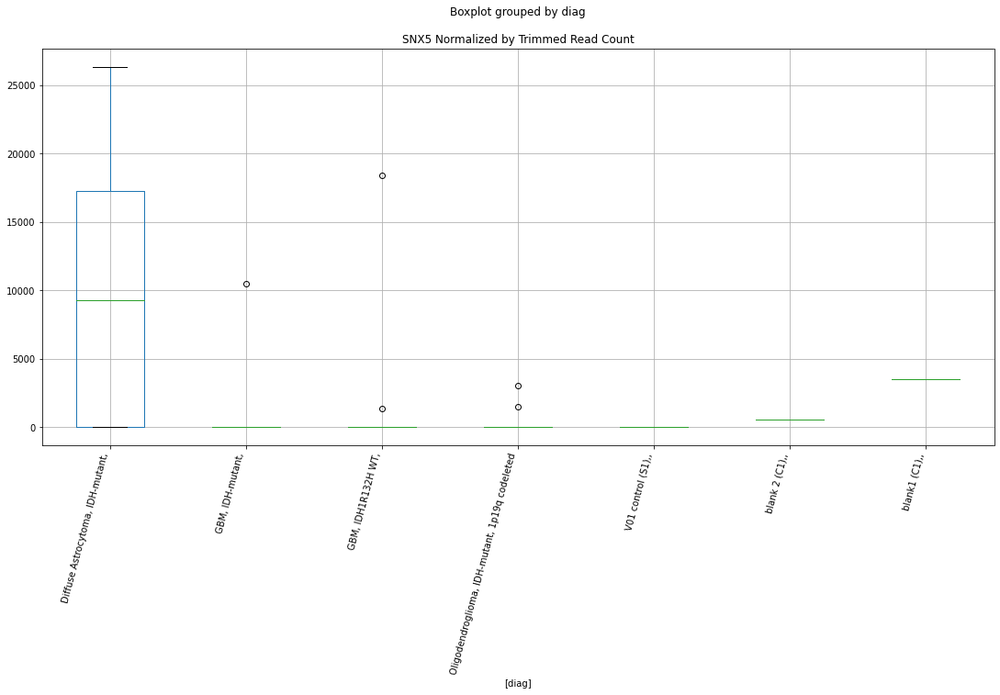

 p : 0.008290669422217536  ( t : 2.9651004348787233 ) :  Lexogen  :  bbduk2  :  LOC107986211
Control and blanks
79         0.00
343    38428.89
Name: LOC107986211, dtype: float64
211    12298.79
Name: LOC107986211, dtype: float64
475    239.52
Name: LOC107986211, dtype: float64


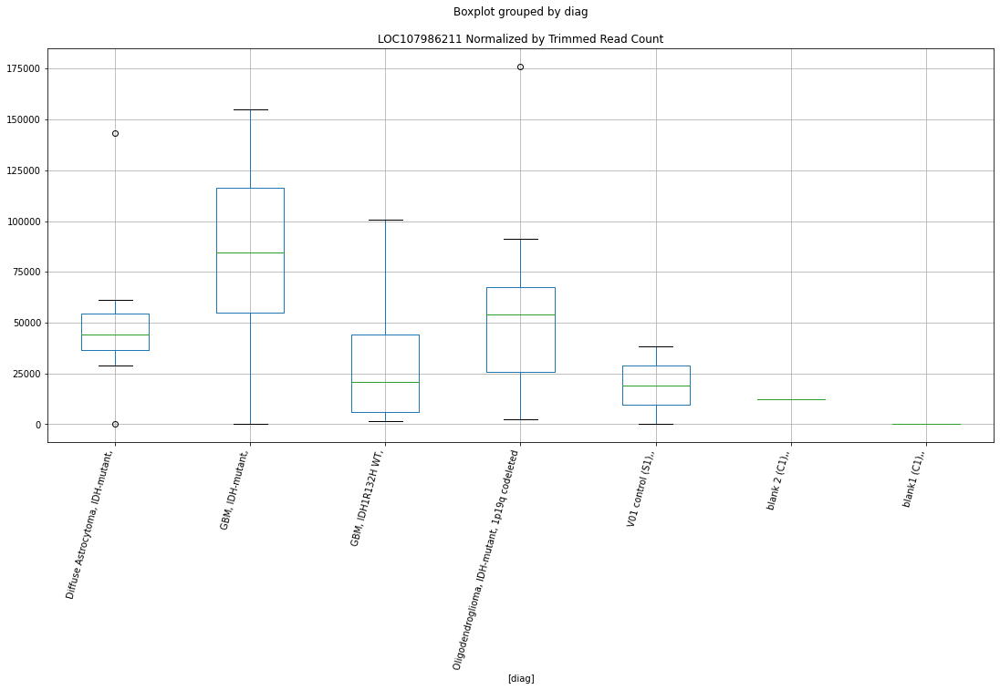

 p : 0.008311338987268841  ( t : 2.963952735170636 ) :  Lexogen  :  bbduk2  :  HTATSF1P2
Control and blanks
79       0.00
343    424.63
Name: HTATSF1P2, dtype: float64
211    0.0
Name: HTATSF1P2, dtype: float64
475    0.0
Name: HTATSF1P2, dtype: float64


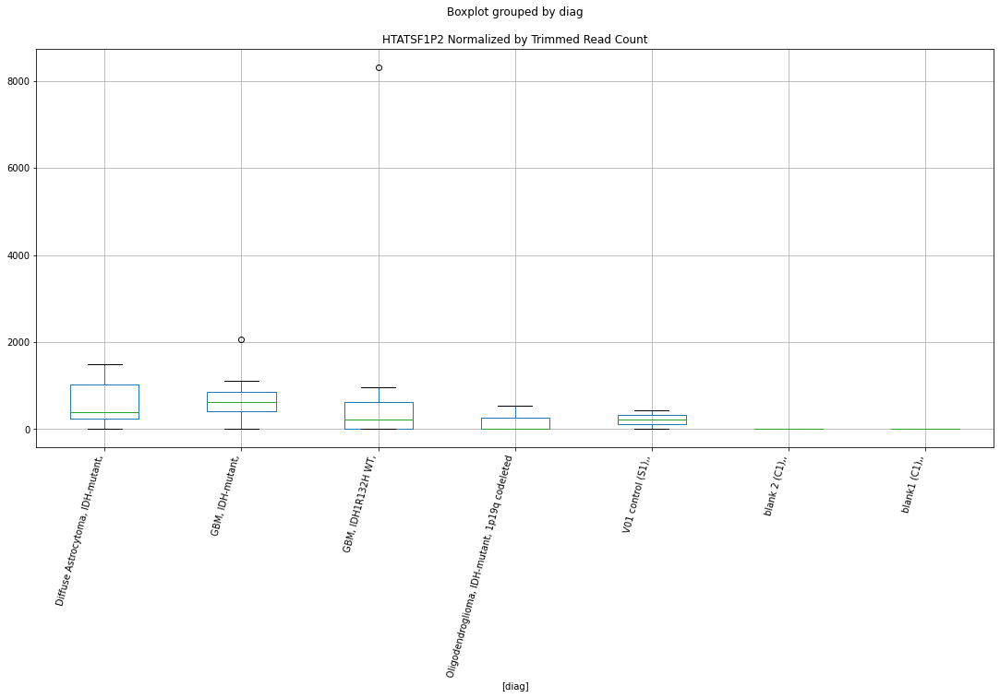

 p : 0.008321321201581017  ( t : 2.96339945219886 ) :  D-plex  :  bbduk2  :  UCKL1-AS1
Control and blanks
73       0.00
337    890.16
Name: UCKL1-AS1, dtype: float64
205    0.0
Name: UCKL1-AS1, dtype: float64
469    1183.05
Name: UCKL1-AS1, dtype: float64


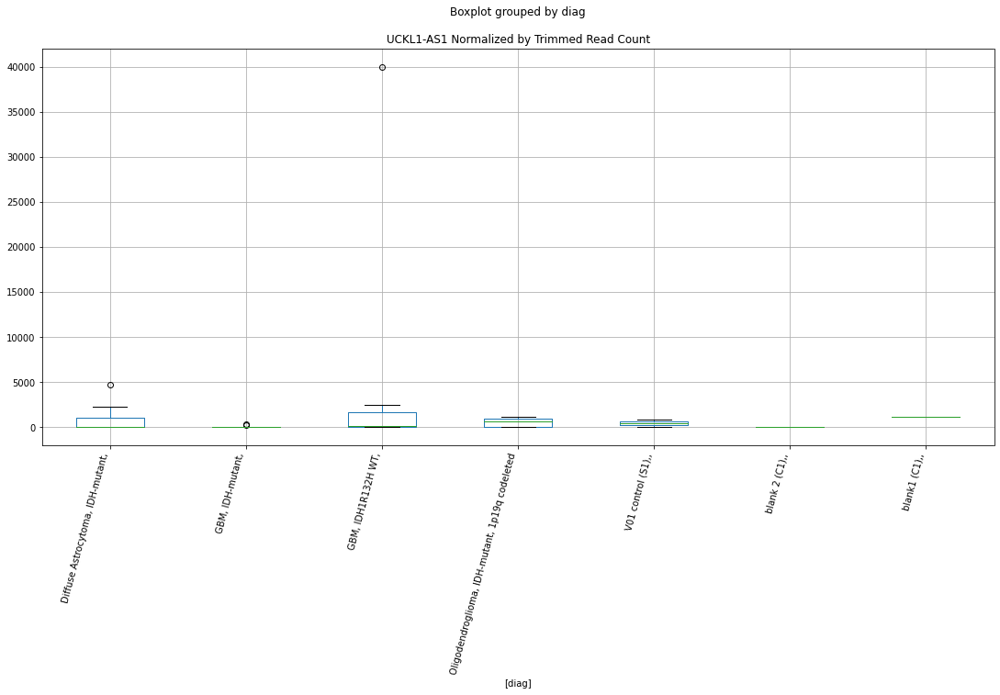

 p : 0.00835163981652714  ( t : 2.9617229209130693 ) :  D-plex  :  cutadapt2  :  ACTA1
Control and blanks
76     0.0
340    0.0
Name: ACTA1, dtype: float64
208    1058.16
Name: ACTA1, dtype: float64
472    1155.91
Name: ACTA1, dtype: float64


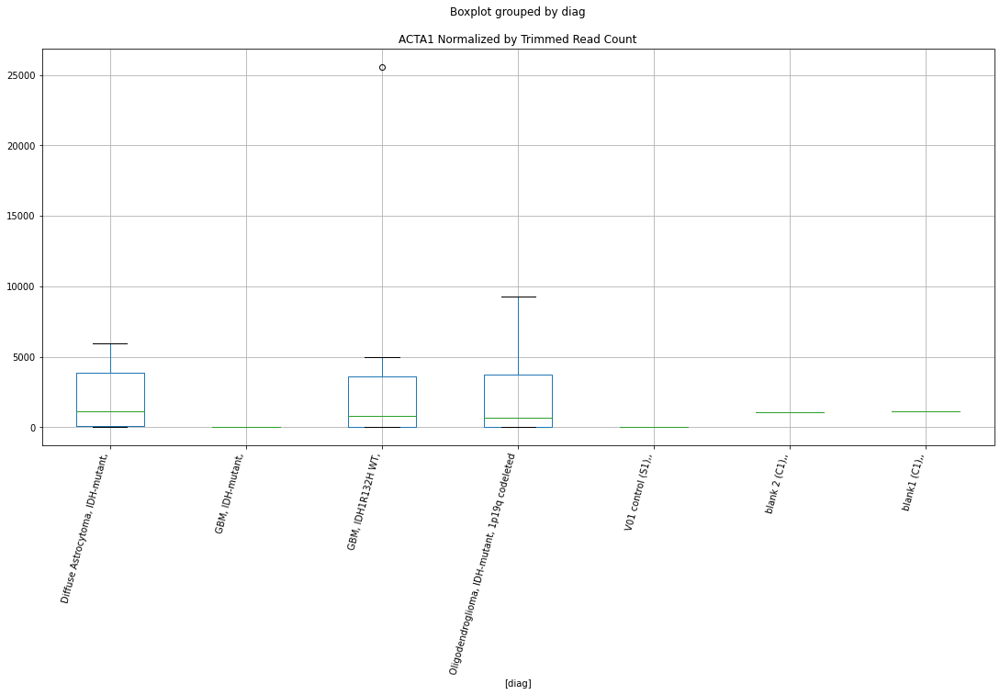

 p : 0.008365245956703233  ( t : 2.960972457315351 ) :  D-plex  :  cutadapt2  :  SIPA1L2
Control and blanks
76     5303.30
340    1761.46
Name: SIPA1L2, dtype: float64
208    18870.54
Name: SIPA1L2, dtype: float64
472    9825.25
Name: SIPA1L2, dtype: float64


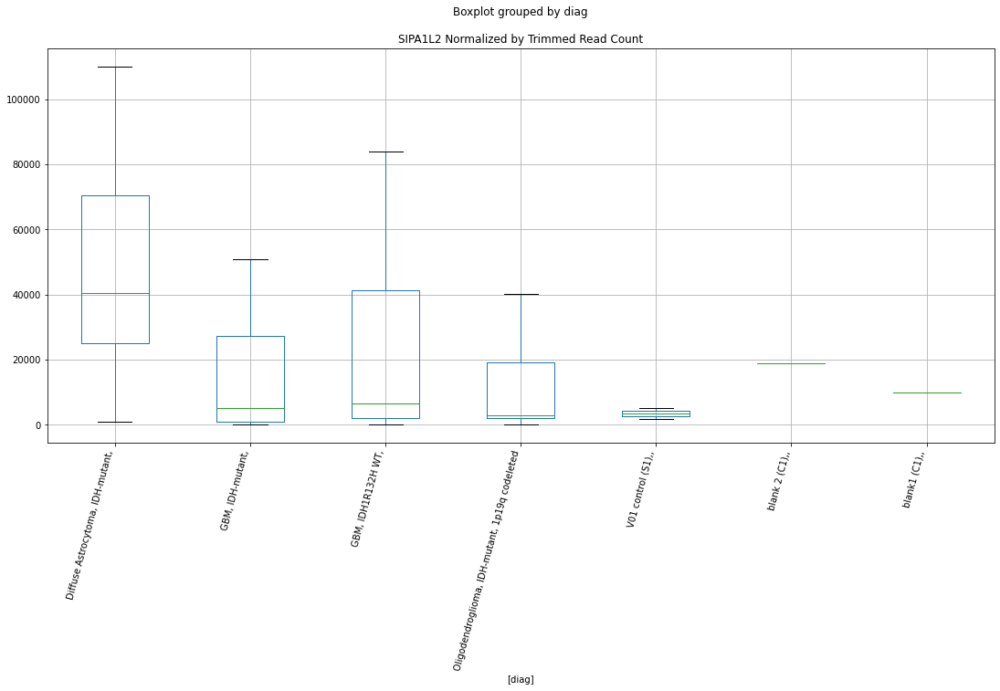

 p : 0.008390302731763376  ( t : 2.959593509162457 ) :  D-plex  :  cutadapt2  :  CHD8
Control and blanks
76     0.0
340    0.0
Name: CHD8, dtype: float64
208    1410.88
Name: CHD8, dtype: float64
472    577.96
Name: CHD8, dtype: float64


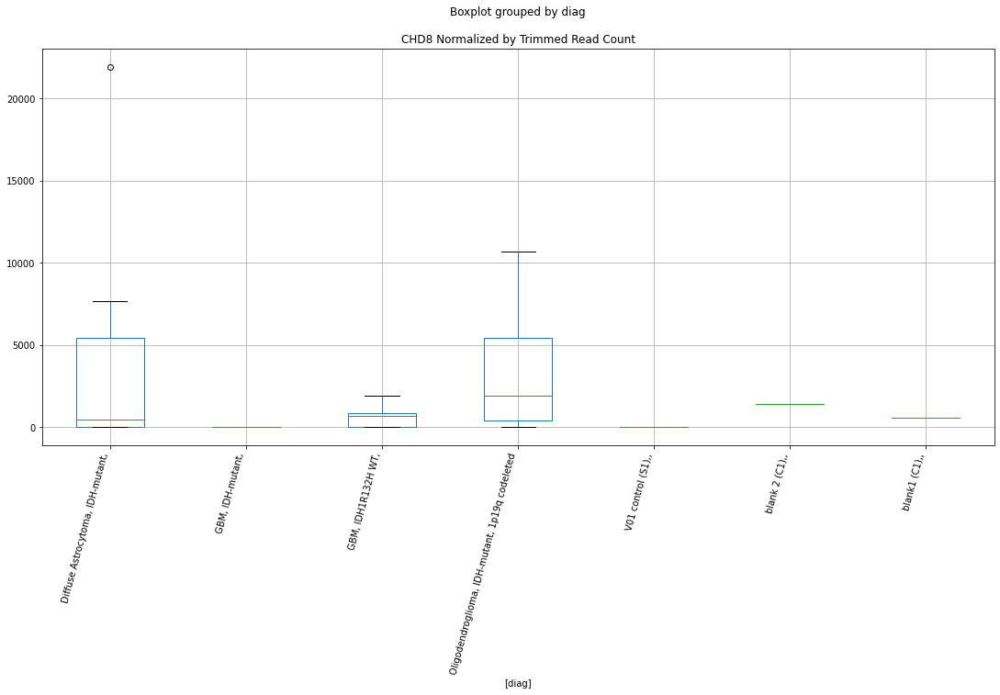

 p : 0.008406133511328294  ( t : 2.958724350053944 ) :  D-plex  :  bbduk2  :  GEMIN4
Control and blanks
73      6184.07
337    14242.52
Name: GEMIN4, dtype: float64
205    327557.35
Name: GEMIN4, dtype: float64
469    70983.28
Name: GEMIN4, dtype: float64


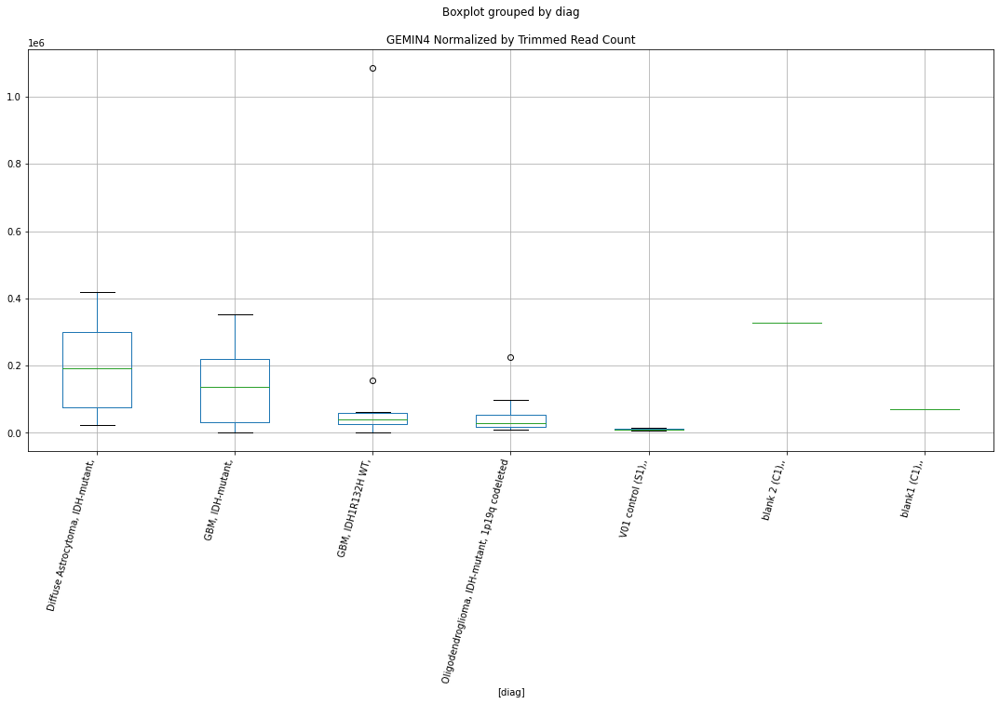

 p : 0.008440313587121289  ( t : 2.9568531531507833 ) :  D-plex  :  cutadapt2  :  DIRAS1
Control and blanks
76      1515.23
340    15853.18
Name: DIRAS1, dtype: float64
208    4409.01
Name: DIRAS1, dtype: float64
472    2311.82
Name: DIRAS1, dtype: float64


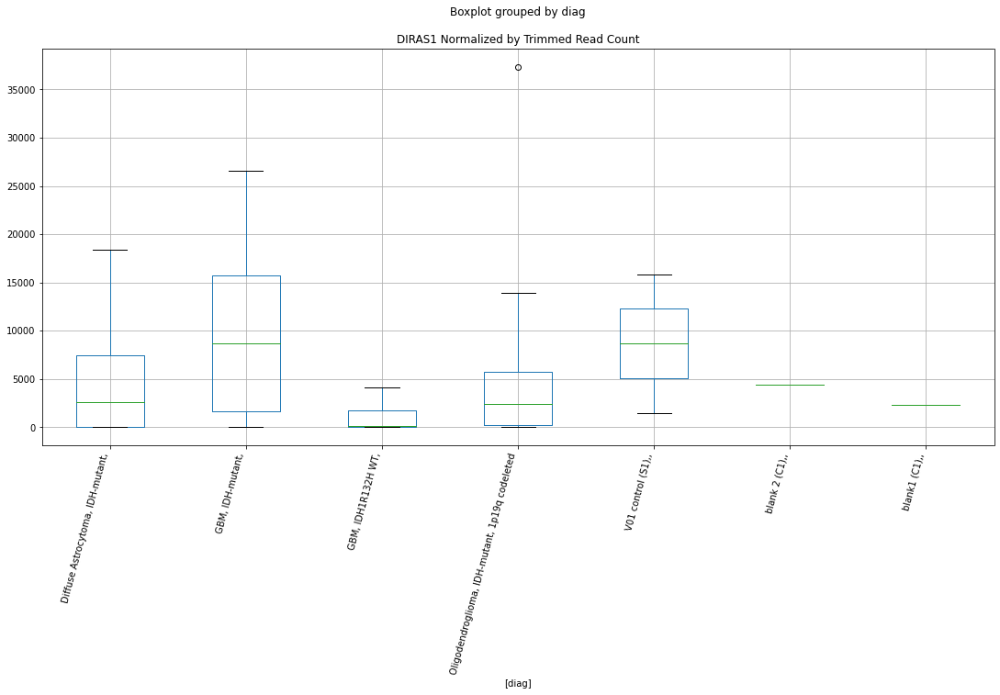

 p : 0.008451047467393223  ( t : 2.9562670386627237 ) :  D-plex  :  cutadapt2  :  UCKL1-AS1
Control and blanks
76     0.0
340    0.0
Name: UCKL1-AS1, dtype: float64
208    0.0
Name: UCKL1-AS1, dtype: float64
472    2311.82
Name: UCKL1-AS1, dtype: float64


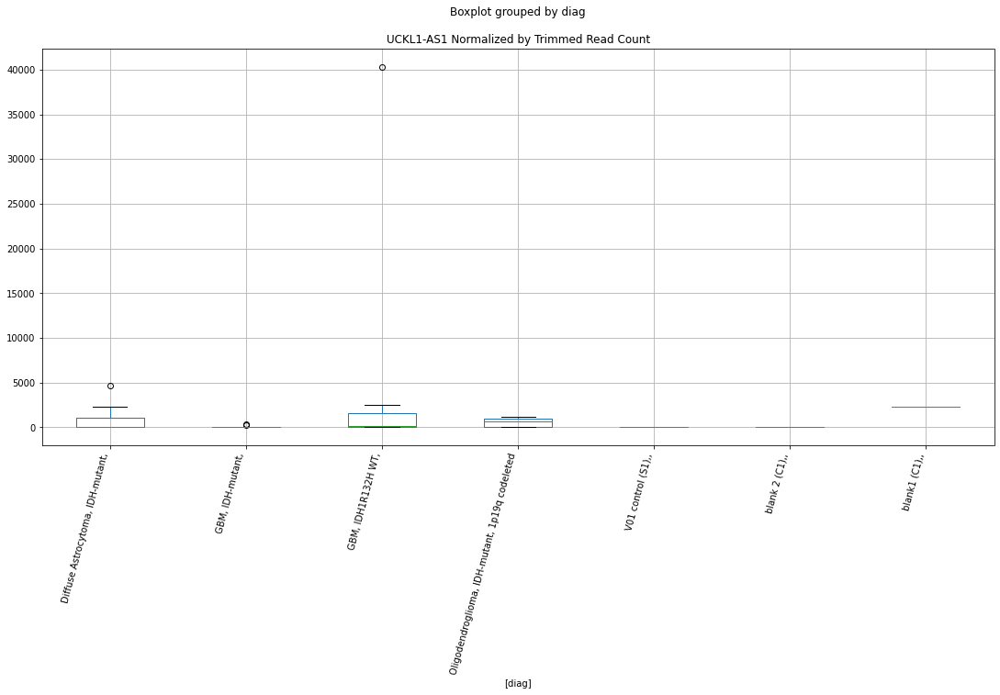

 p : 0.00852099075167219  ( t : 2.9524654122774168 ) :  Lexogen  :  cutadapt2  :  LOC107986211
Control and blanks
82         0.00
346    38088.65
Name: LOC107986211, dtype: float64
214    12205.19
Name: LOC107986211, dtype: float64
478    237.46
Name: LOC107986211, dtype: float64


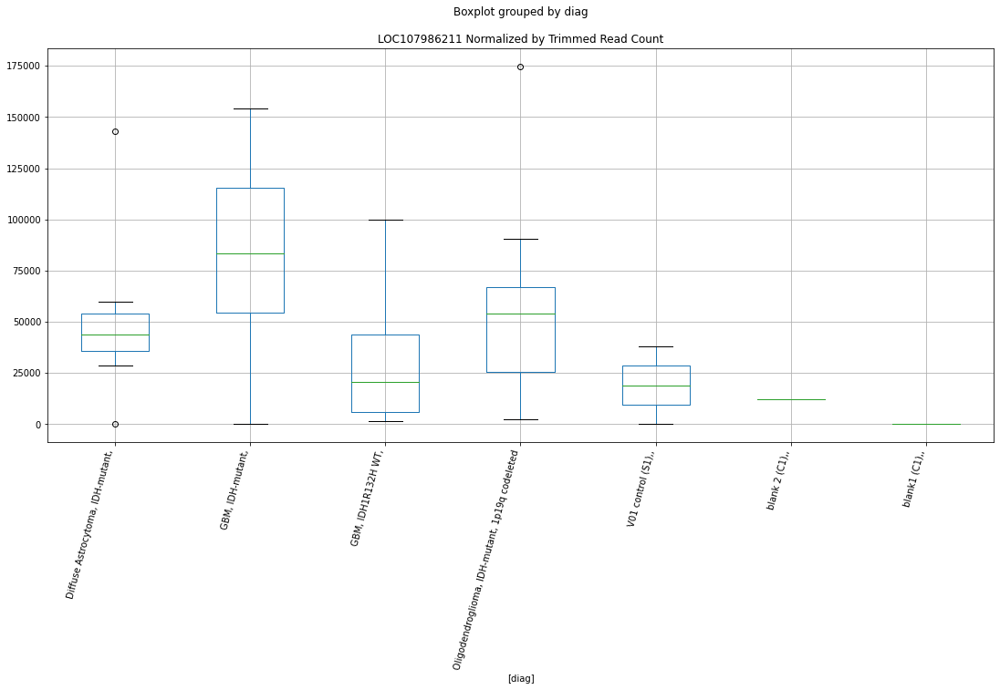

 p : 0.008528735751515387  ( t : 2.95204630874099 ) :  Lexogen  :  cutadapt2  :  GOLGA2P6
Control and blanks
82     0.0
346    0.0
Name: GOLGA2P6, dtype: float64
214    0.0
Name: GOLGA2P6, dtype: float64
478    0.0
Name: GOLGA2P6, dtype: float64


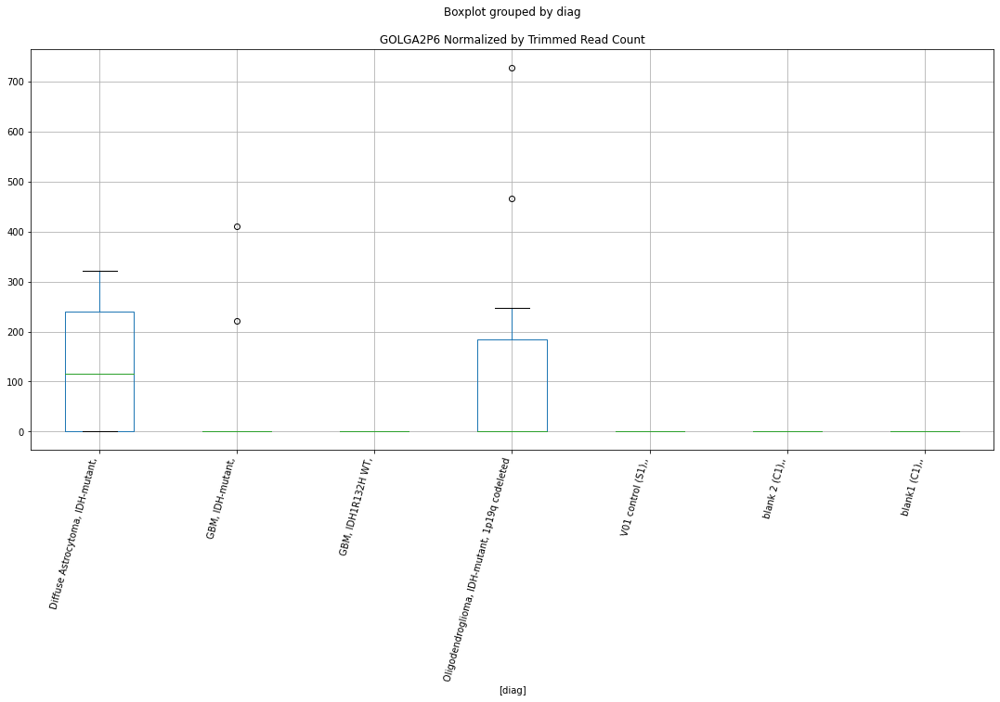

 p : 0.00852897842598346  ( t : 2.9520331829057054 ) :  Lexogen  :  bbduk2  :  GOLGA2P6
Control and blanks
79     0.0
343    0.0
Name: GOLGA2P6, dtype: float64
211    0.0
Name: GOLGA2P6, dtype: float64
475    0.0
Name: GOLGA2P6, dtype: float64


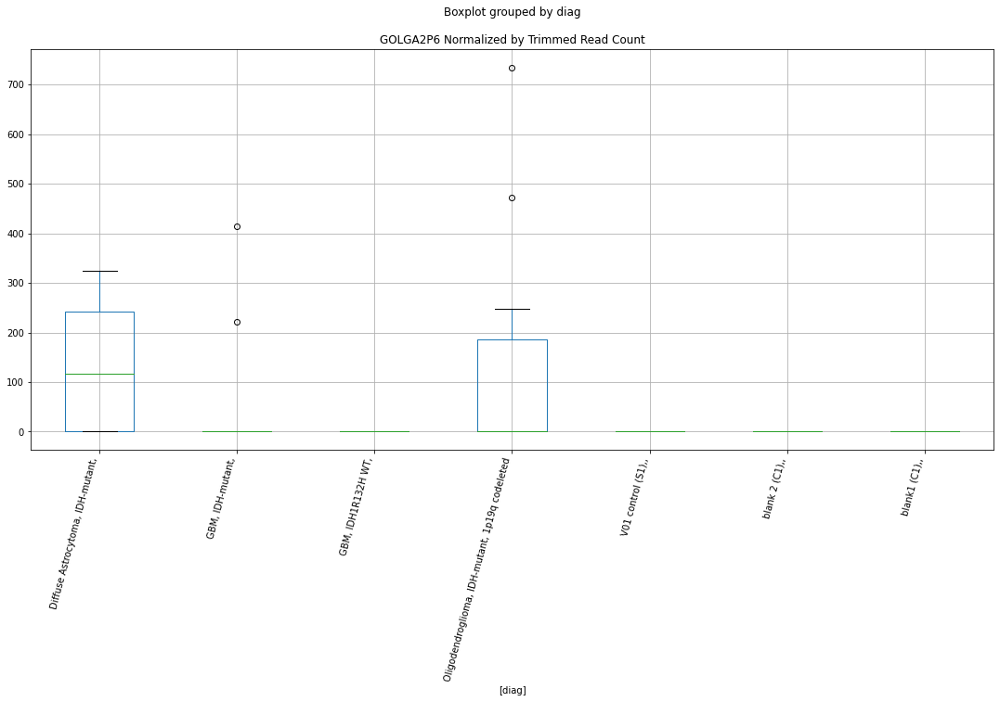

 p : 0.00859741634766151  ( t : 2.9483458550851385 ) :  Lexogen  :  cutadapt2  :  NRXN1
Control and blanks
82       0.00
346    841.74
Name: NRXN1, dtype: float64
214    0.0
Name: NRXN1, dtype: float64
478    0.0
Name: NRXN1, dtype: float64


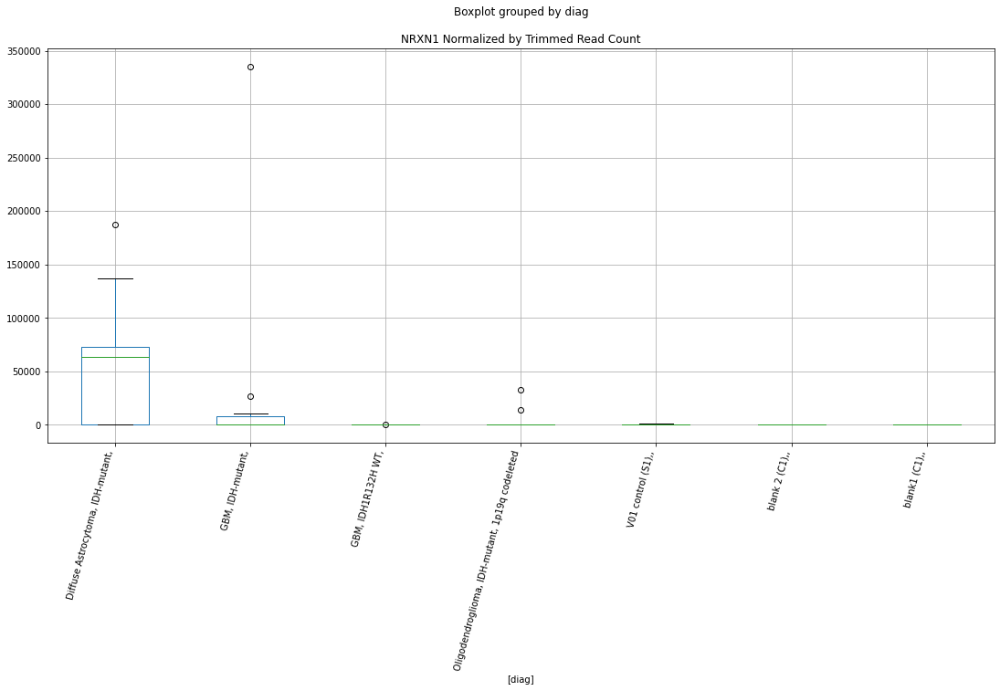

 p : 0.008686234638645238  ( t : 2.9436026176018775 ) :  D-plex  :  cutadapt2  :  PAIP2
Control and blanks
76     0.0
340    0.0
Name: PAIP2, dtype: float64
208    352.72
Name: PAIP2, dtype: float64
472    1733.87
Name: PAIP2, dtype: float64


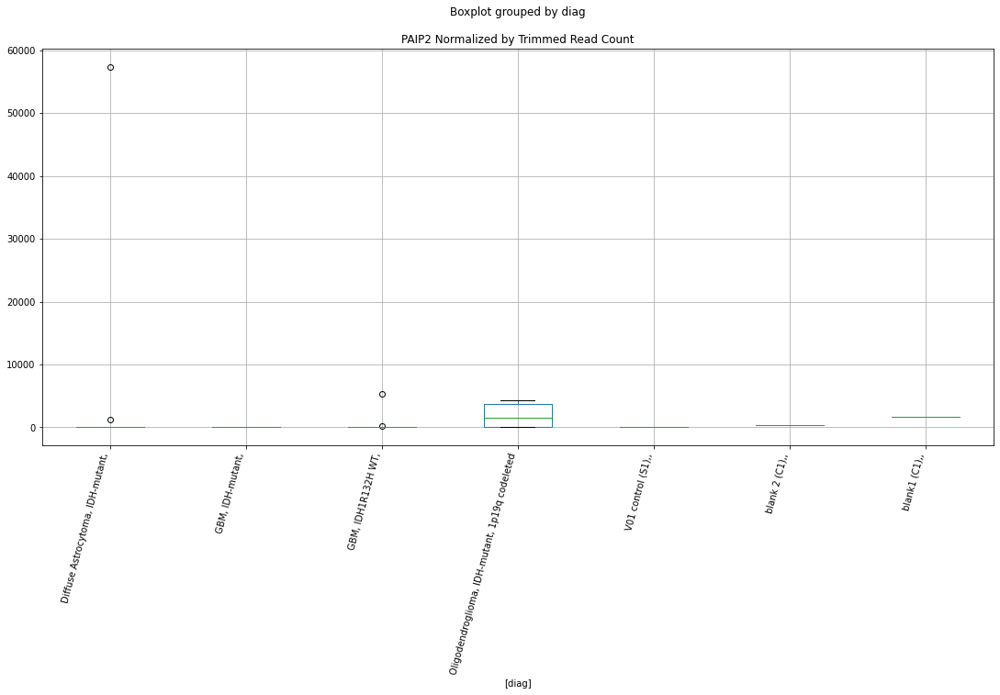

 p : 0.008714870665321226  ( t : 2.9420833504481347 ) :  D-plex  :  cutadapt2  :  DYNC2H1
Control and blanks
76     4545.69
340    4403.66
Name: DYNC2H1, dtype: float64
208    12168.86
Name: DYNC2H1, dtype: float64
472    13292.98
Name: DYNC2H1, dtype: float64


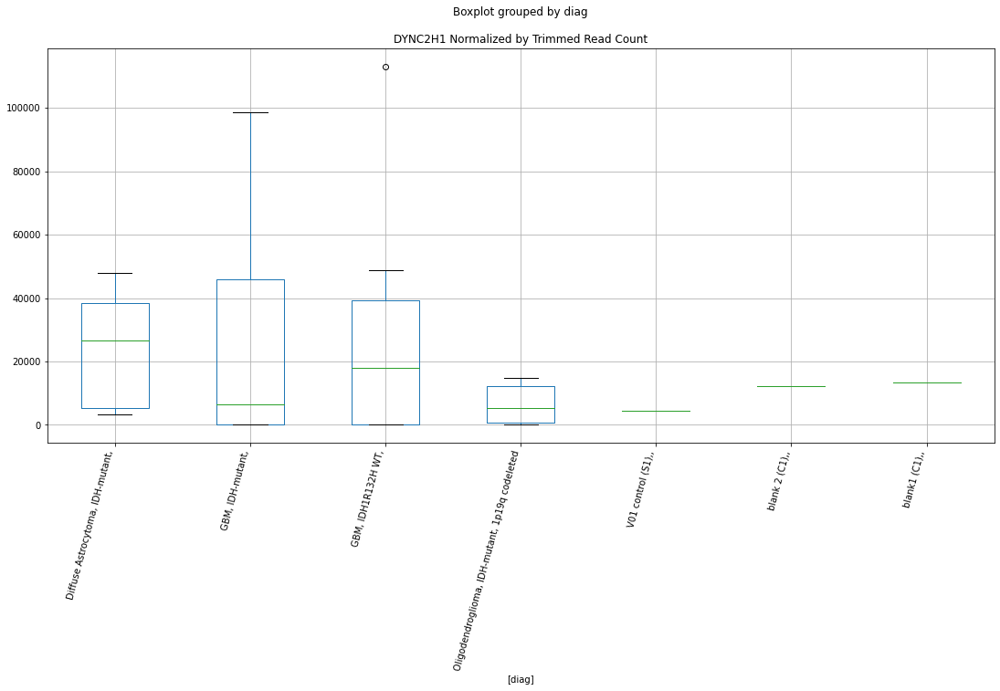

 p : 0.008781925535931882  ( t : 2.9385446174239354 ) :  D-plex  :  cutadapt2  :  AKAP8L
Control and blanks
76         0.00
340    10568.79
Name: AKAP8L, dtype: float64
208    6348.97
Name: AKAP8L, dtype: float64
472    12137.07
Name: AKAP8L, dtype: float64


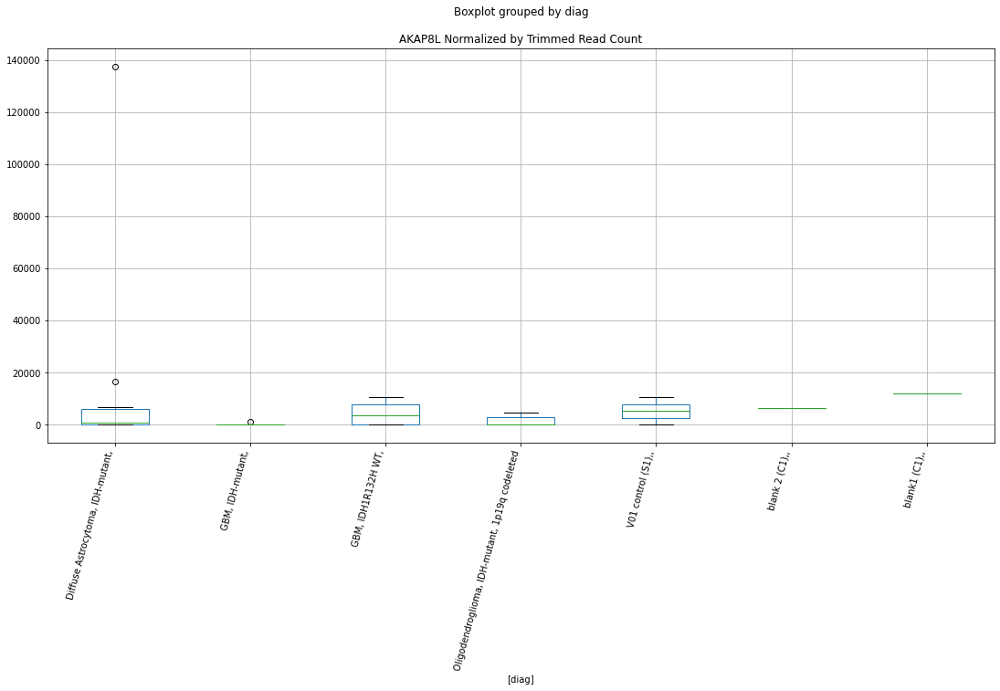

 p : 0.008839411652138762  ( t : 2.9355316224259496 ) :  D-plex  :  bbduk2  :  POMC
Control and blanks
73     6184.07
337       0.00
Name: POMC, dtype: float64
205    7880.0
Name: POMC, dtype: float64
469    13605.13
Name: POMC, dtype: float64


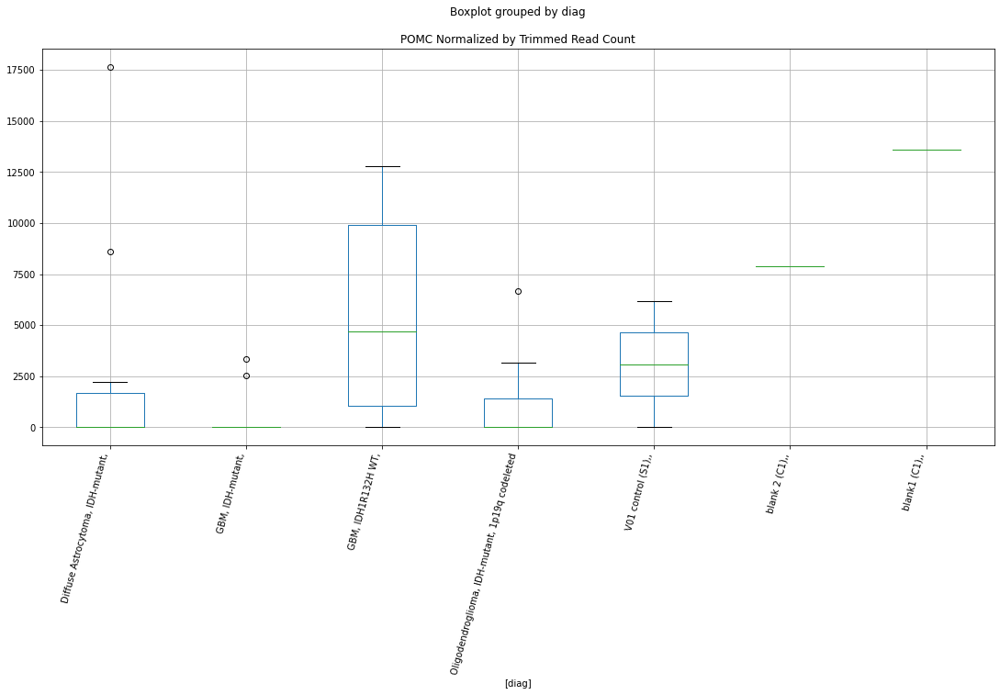

 p : 0.00887316846702945  ( t : 2.933771166089372 ) :  D-plex  :  cutadapt2  :  LRRC37A8P
Control and blanks
76     0.0
340    0.0
Name: LRRC37A8P, dtype: float64
208    705.44
Name: LRRC37A8P, dtype: float64
472    0.0
Name: LRRC37A8P, dtype: float64


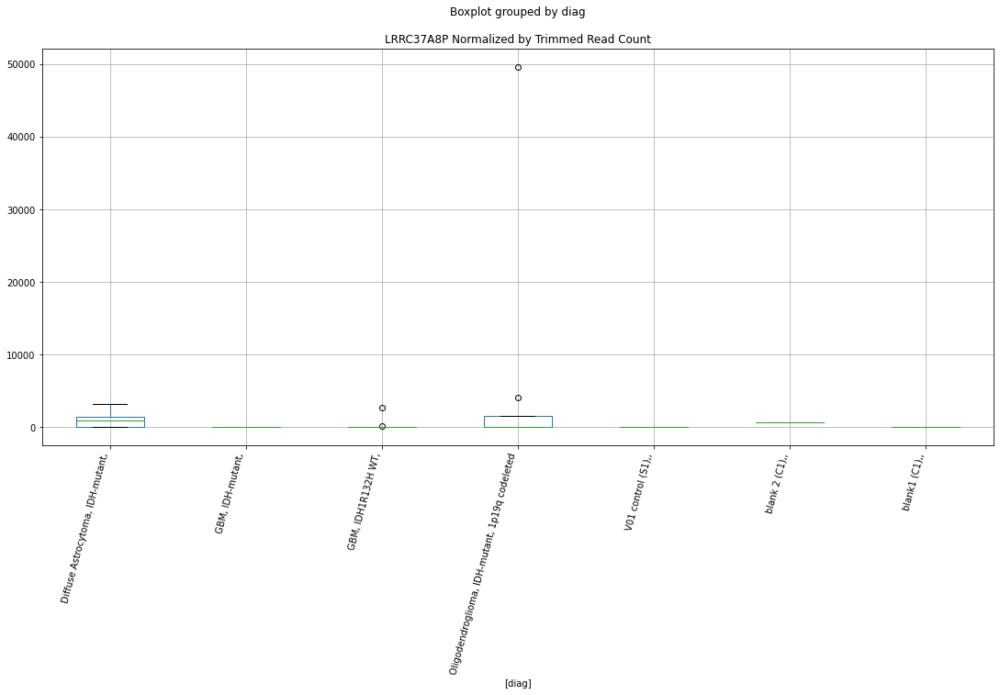

 p : 0.008875891415507195  ( t : 2.9336294438313857 ) :  Lexogen  :  bbduk2  :  LOC105377167
Control and blanks
79     0.0
343    0.0
Name: LOC105377167, dtype: float64
211    0.0
Name: LOC105377167, dtype: float64
475    718.55
Name: LOC105377167, dtype: float64


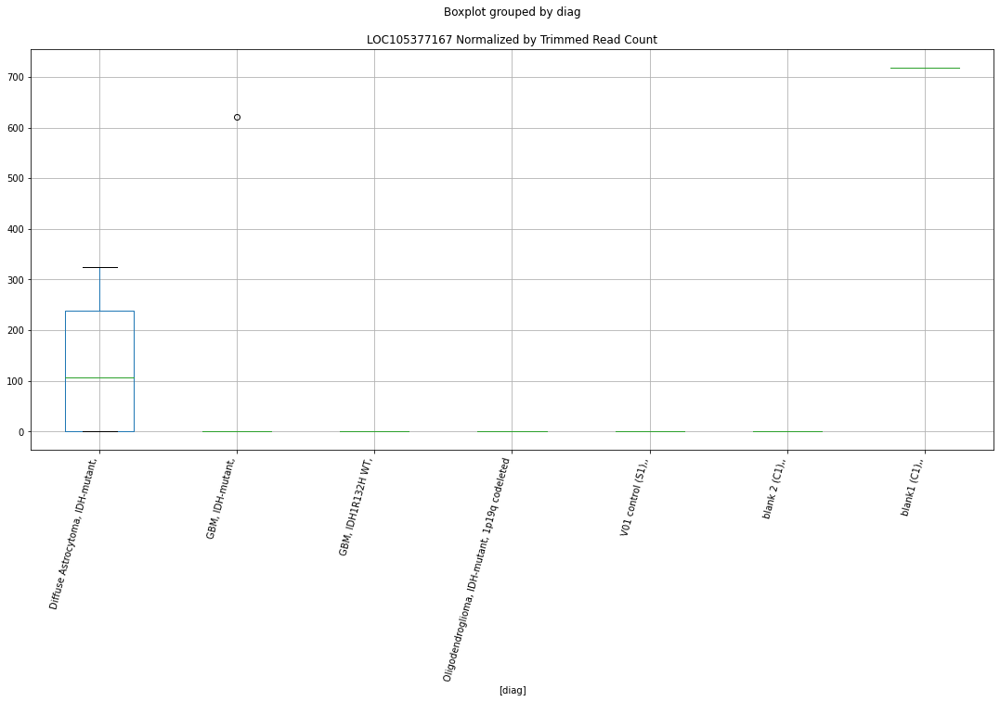

 p : 0.008880510739873195  ( t : 2.93338911642708 ) :  Lexogen  :  cutadapt2  :  LOC105377167
Control and blanks
82     0.0
346    0.0
Name: LOC105377167, dtype: float64
214    0.0
Name: LOC105377167, dtype: float64
478    712.38
Name: LOC105377167, dtype: float64


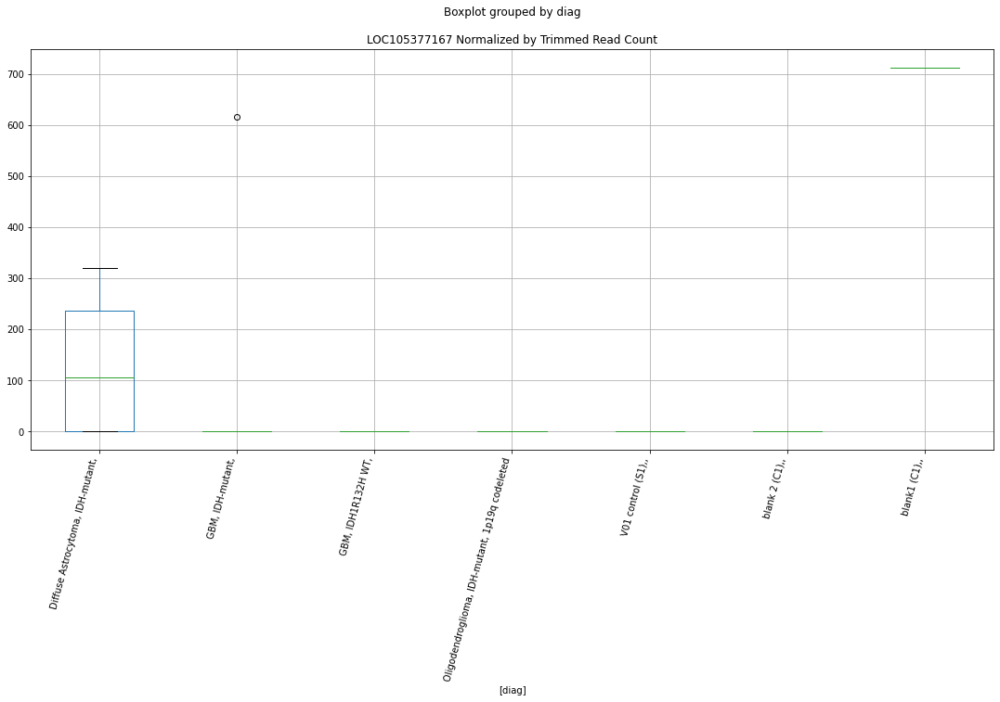

 p : 0.008922091056954297  ( t : 2.931231265613516 ) :  D-plex  :  bbduk2  :  RASSF9
Control and blanks
73     3092.03
337       0.00
Name: RASSF9, dtype: float64
205    2328.18
Name: RASSF9, dtype: float64
469    7098.33
Name: RASSF9, dtype: float64


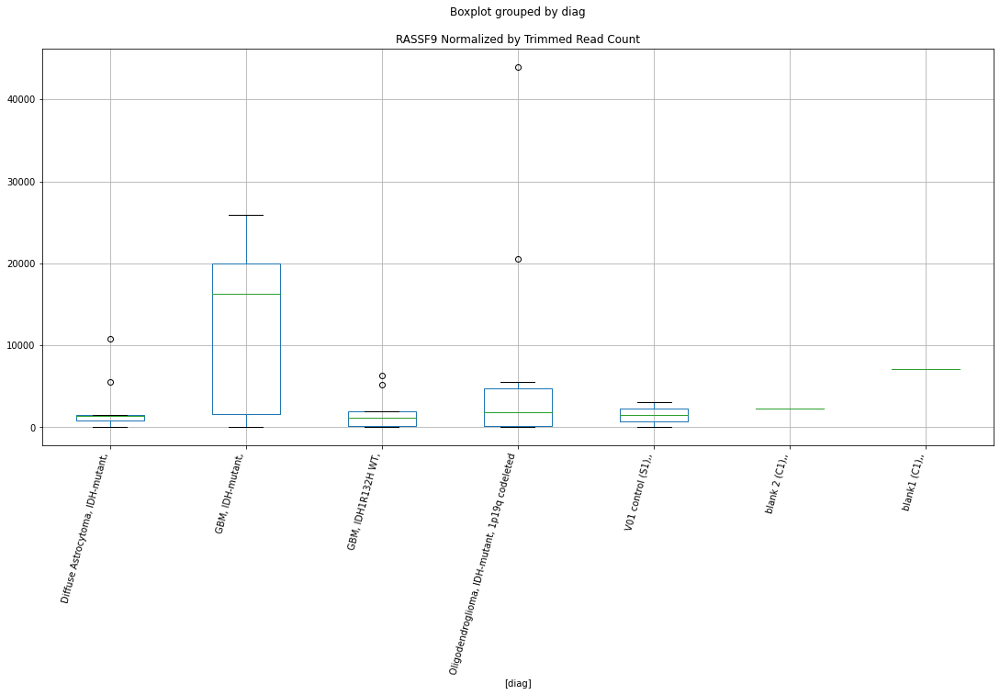

 p : 0.008925209187159359  ( t : 2.9310698396533246 ) :  D-plex  :  cutadapt2  :  LOC105369293
Control and blanks
76     0.0
340    0.0
Name: LOC105369293, dtype: float64
208    352.72
Name: LOC105369293, dtype: float64
472    577.96
Name: LOC105369293, dtype: float64


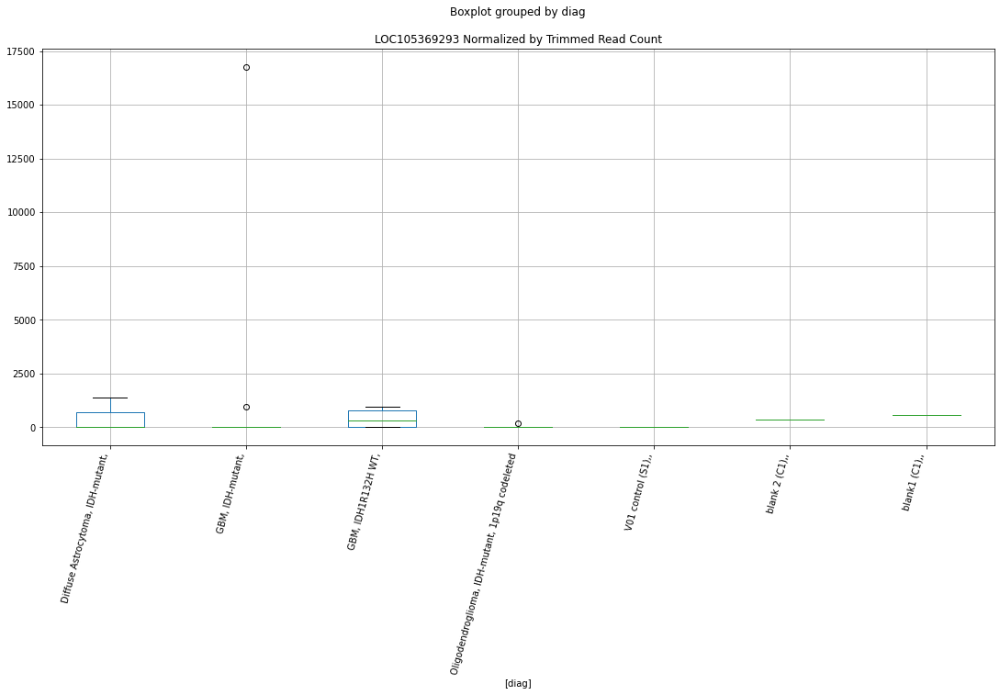

 p : 0.008957372494852286  ( t : 2.929407918339133 ) :  D-plex  :  bbduk2  :  PM20D2
Control and blanks
73     0.0
337    0.0
Name: PM20D2, dtype: float64
205    2686.36
Name: PM20D2, dtype: float64
469    6506.8
Name: PM20D2, dtype: float64


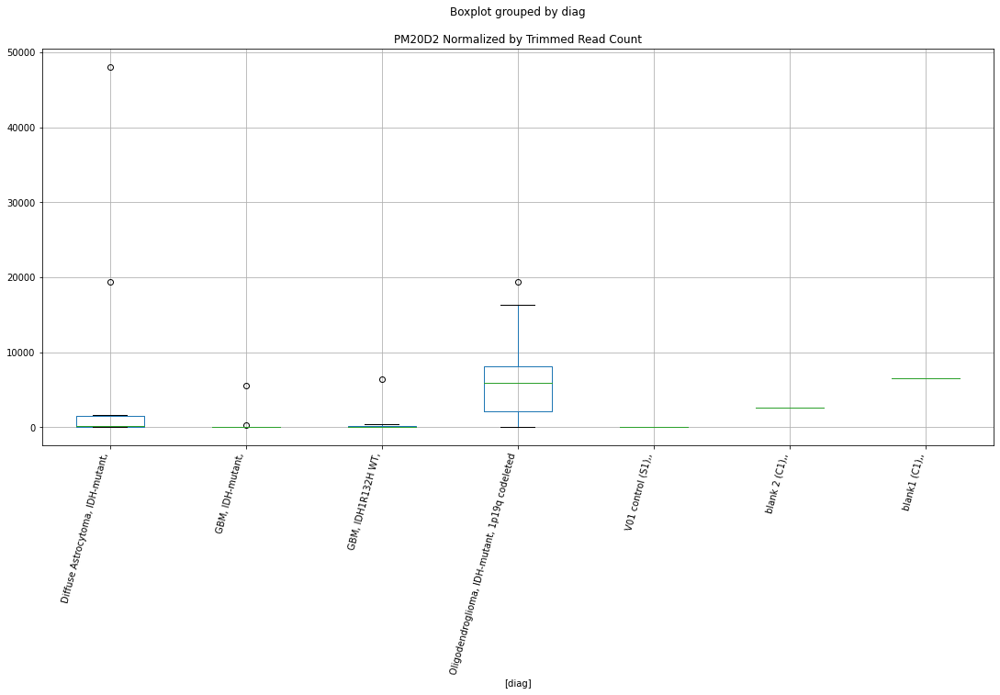

 p : 0.009014412057227283  ( t : 2.9264747548473786 ) :  D-plex  :  cutadapt2  :  SIPA1L3
Control and blanks
76     156826.14
340         0.00
Name: SIPA1L3, dtype: float64
208    15872.42
Name: SIPA1L3, dtype: float64
472    25430.06
Name: SIPA1L3, dtype: float64


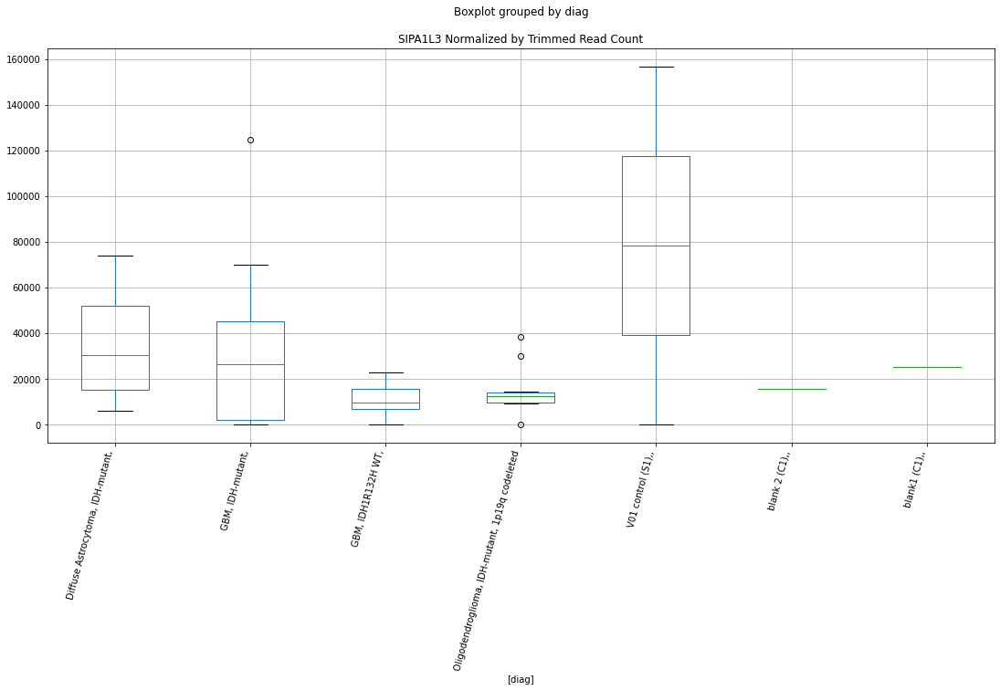

 p : 0.009018367913037652  ( t : 2.92627199791322 ) :  D-plex  :  bbduk2  :  LRRC37A8P
Control and blanks
73     0.0
337    0.0
Name: LRRC37A8P, dtype: float64
205    716.36
Name: LRRC37A8P, dtype: float64
469    0.0
Name: LRRC37A8P, dtype: float64


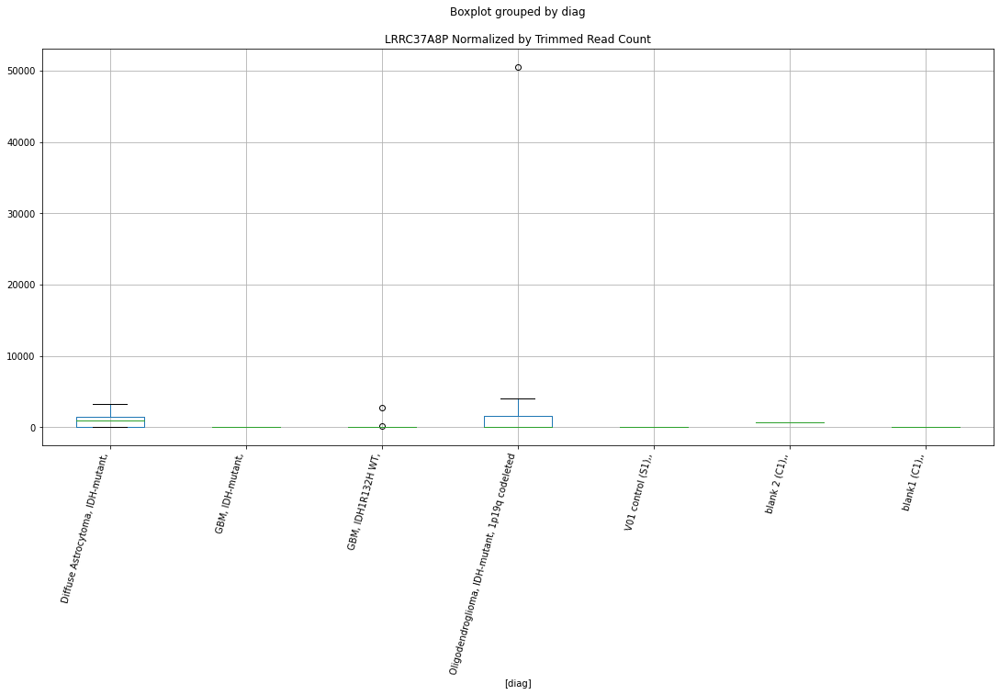

 p : 0.009153102738868673  ( t : 2.919417045135805 ) :  D-plex  :  bbduk2  :  CTXND1
Control and blanks
73     29374.32
337    18693.30
Name: CTXND1, dtype: float64
205    20774.55
Name: CTXND1, dtype: float64
469    29576.37
Name: CTXND1, dtype: float64


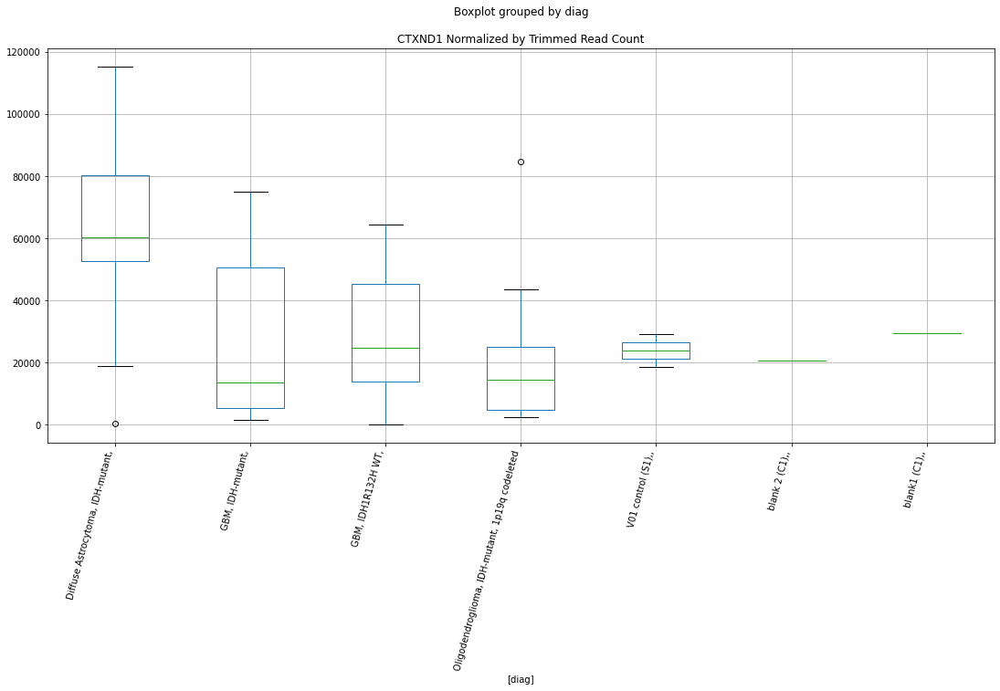

 p : 0.009186613988277555  ( t : 2.9177272367601703 ) :  Lexogen  :  cutadapt2  :  LOC107985115
Control and blanks
82     0.0
346    0.0
Name: LOC107985115, dtype: float64
214    0.0
Name: LOC107985115, dtype: float64
478    0.0
Name: LOC107985115, dtype: float64


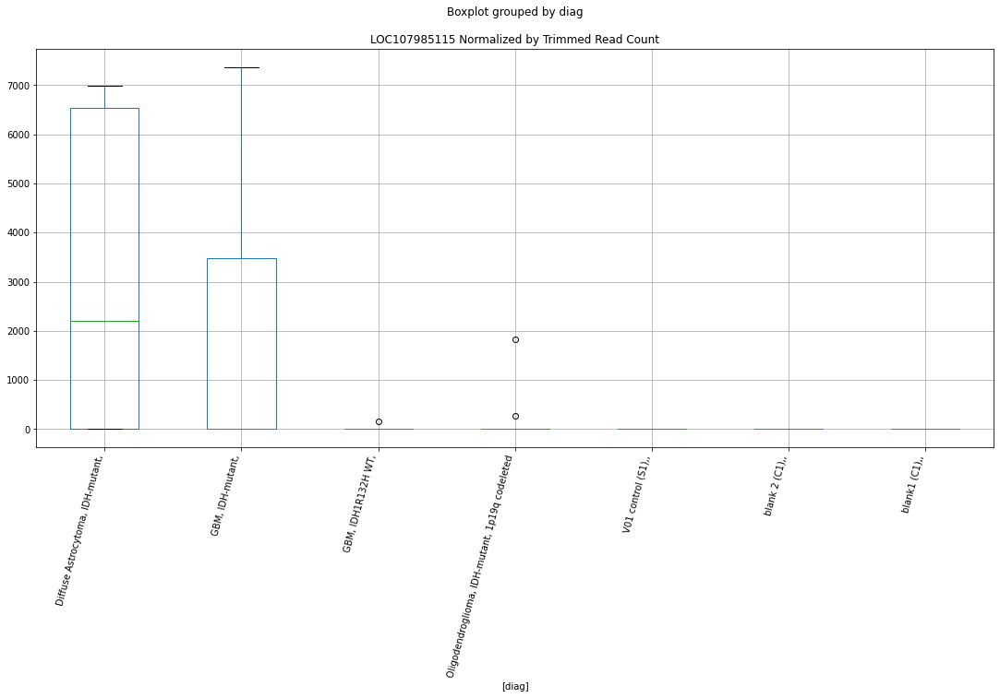

 p : 0.00918922917981236  ( t : 2.917595616266513 ) :  Lexogen  :  bbduk2  :  GNAS
Control and blanks
79         0.00
343    62845.04
Name: GNAS, dtype: float64
211    83631.74
Name: GNAS, dtype: float64
475    0.0
Name: GNAS, dtype: float64


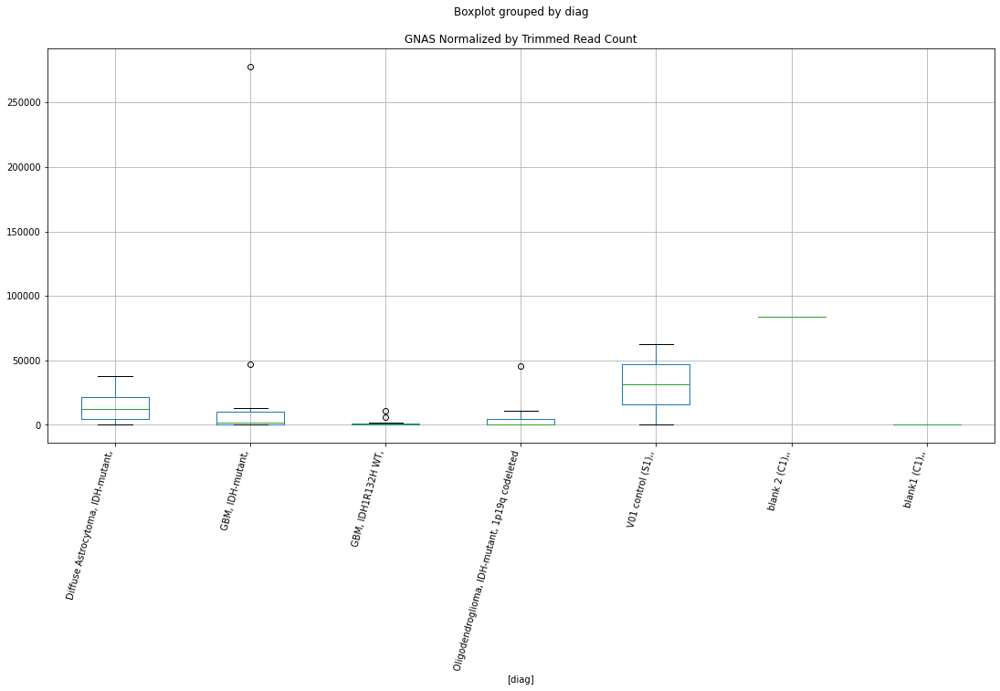

 p : 0.009211049348164751  ( t : 2.9164988342844884 ) :  Lexogen  :  bbduk2  :  LOC107985115
Control and blanks
79     0.0
343    0.0
Name: LOC107985115, dtype: float64
211    0.0
Name: LOC107985115, dtype: float64
475    0.0
Name: LOC107985115, dtype: float64


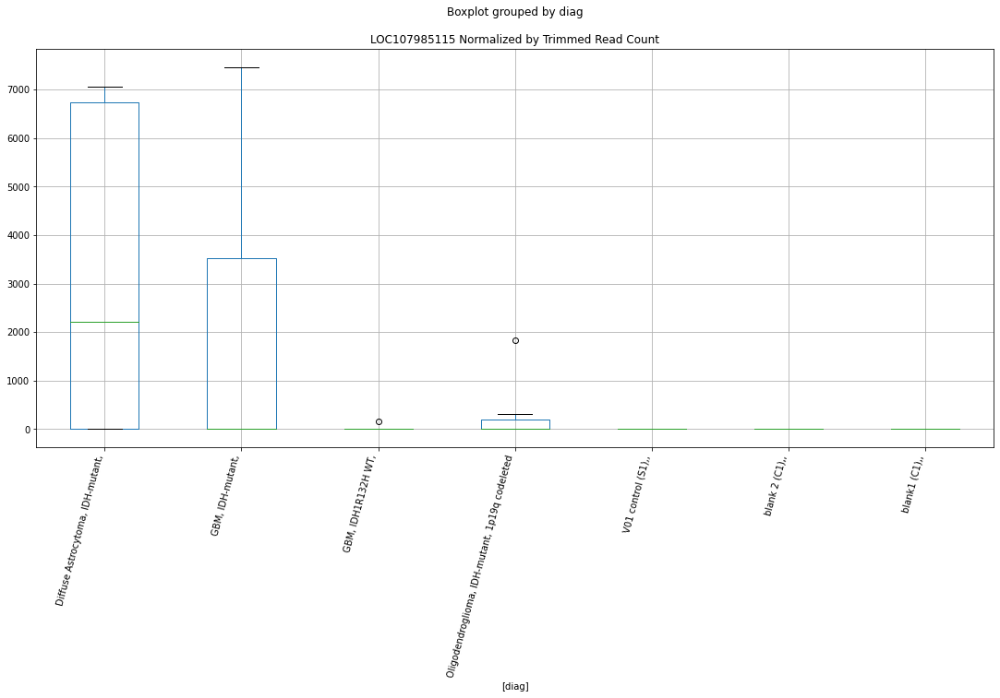

 p : 0.009240888667791962  ( t : 2.915003032277323 ) :  Lexogen  :  cutadapt2  :  PSD3
Control and blanks
82        0.00
346    1683.48
Name: PSD3, dtype: float64
214    2169.81
Name: PSD3, dtype: float64
478    5699.05
Name: PSD3, dtype: float64


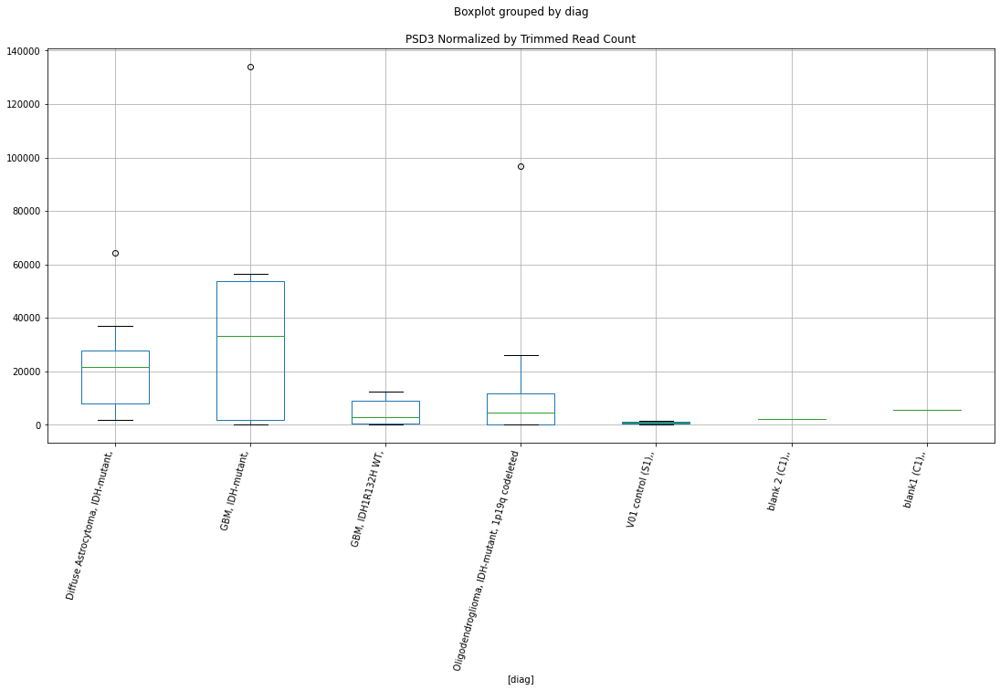

 p : 0.009247438887642765  ( t : 2.9146753042928135 ) :  D-plex  :  cutadapt2  :  LOC105371934
Control and blanks
76     0.0
340    0.0
Name: LOC105371934, dtype: float64
208    52908.07
Name: LOC105371934, dtype: float64
472    4623.65
Name: LOC105371934, dtype: float64


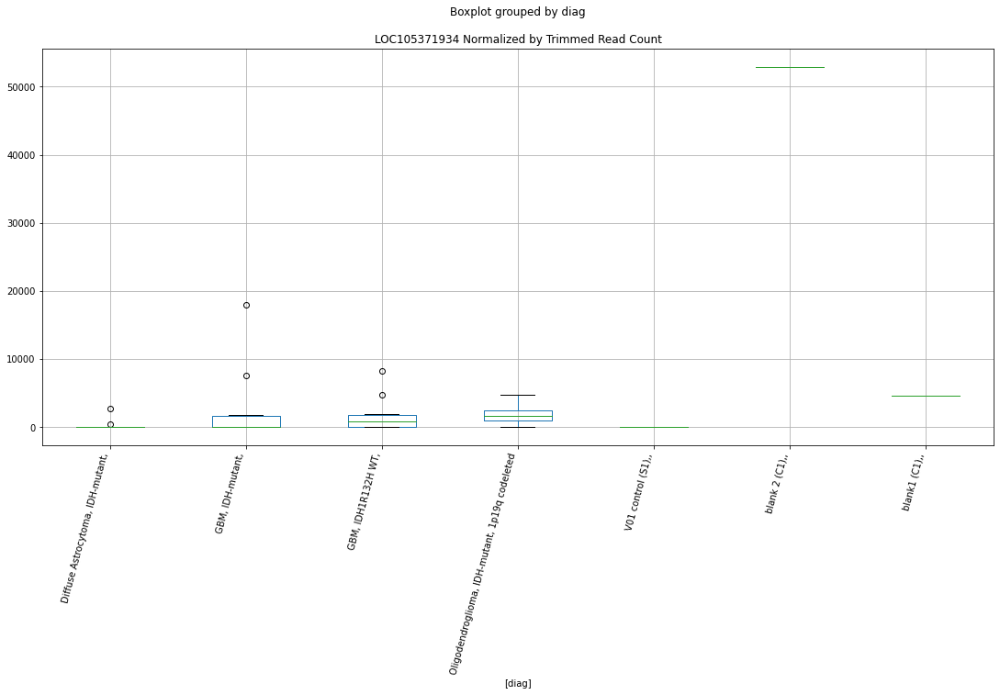

 p : 0.009265219567103695  ( t : 2.913786811397814 ) :  Lexogen  :  cutadapt2  :  KMT2A
Control and blanks
82        0.00
346    5892.17
Name: KMT2A, dtype: float64
214    17087.27
Name: KMT2A, dtype: float64
478    1662.22
Name: KMT2A, dtype: float64


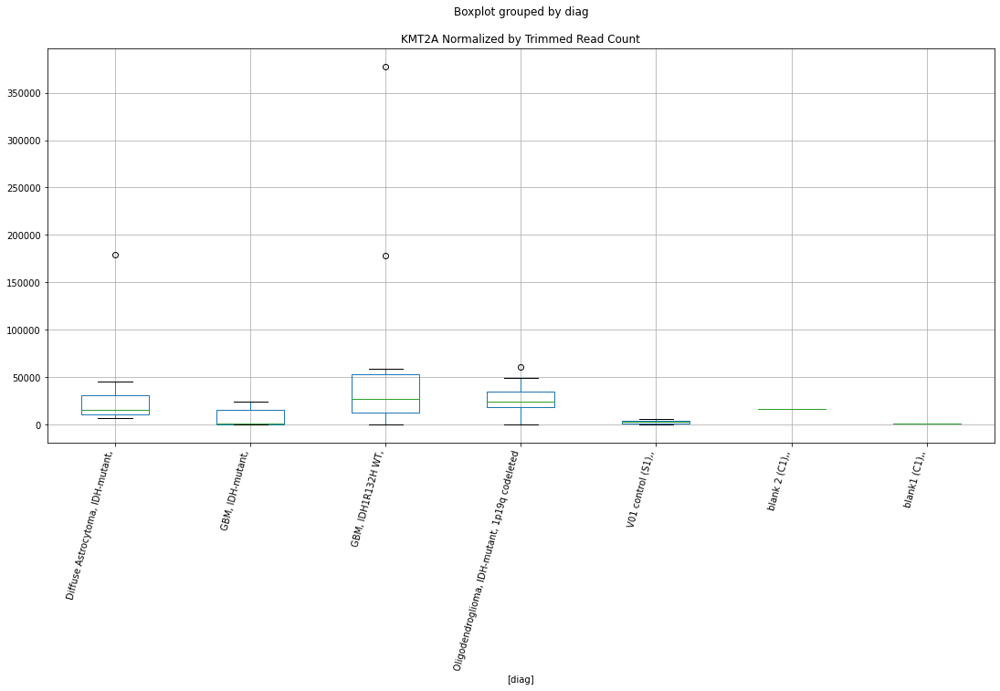

 p : 0.009330357292204544  ( t : 2.9105459263783637 ) :  D-plex  :  cutadapt2  :  LOC112268112
Control and blanks
76     0.0
340    0.0
Name: LOC112268112, dtype: float64
208    1058.16
Name: LOC112268112, dtype: float64
472    1155.91
Name: LOC112268112, dtype: float64


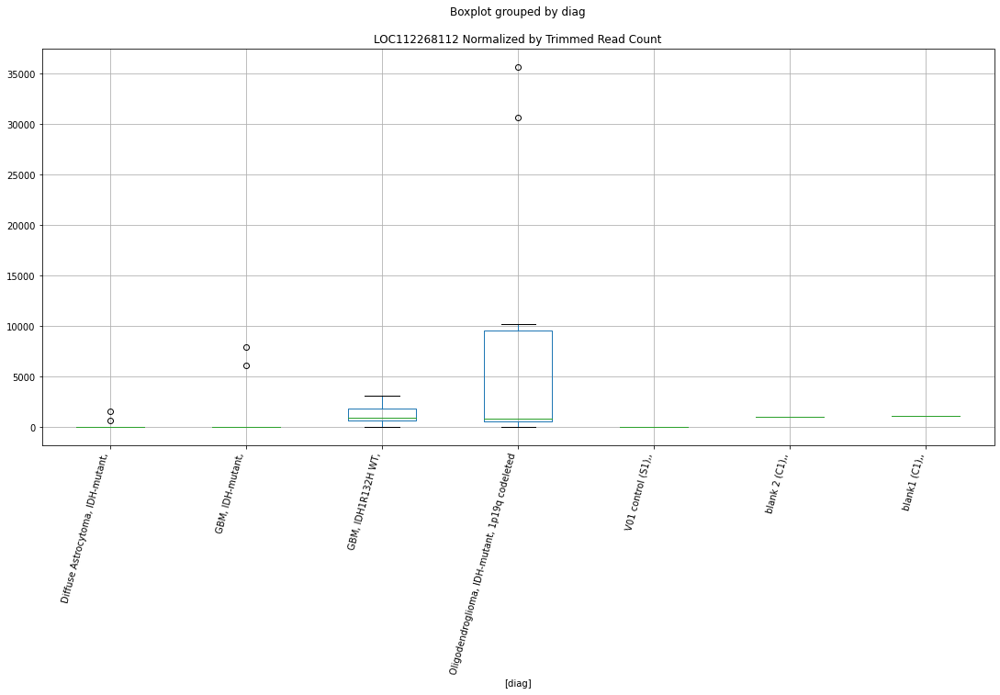

 p : 0.009343281369940736  ( t : 2.9099054980950423 ) :  Lexogen  :  bbduk2  :  KIF19
Control and blanks
79     0.0
343    0.0
Name: KIF19, dtype: float64
211    0.0
Name: KIF19, dtype: float64
475    0.0
Name: KIF19, dtype: float64


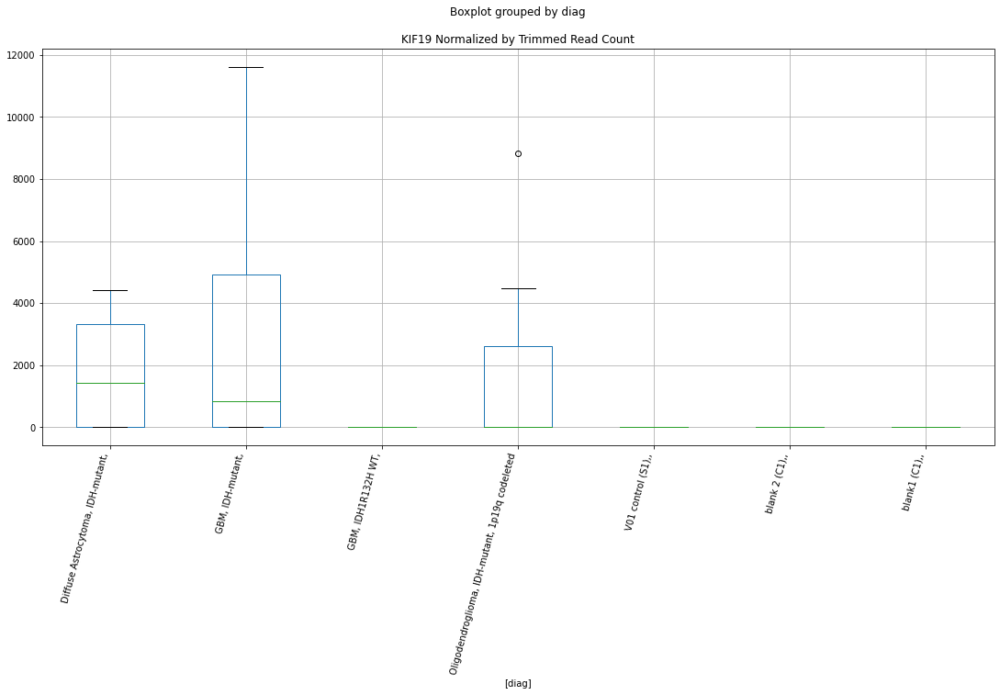

 p : 0.009354589263301202  ( t : 2.9093458586706418 ) :  D-plex  :  bbduk2  :  EYA1
Control and blanks
73     0.0
337    0.0
Name: EYA1, dtype: float64
205    3760.91
Name: EYA1, dtype: float64
469    591.53
Name: EYA1, dtype: float64


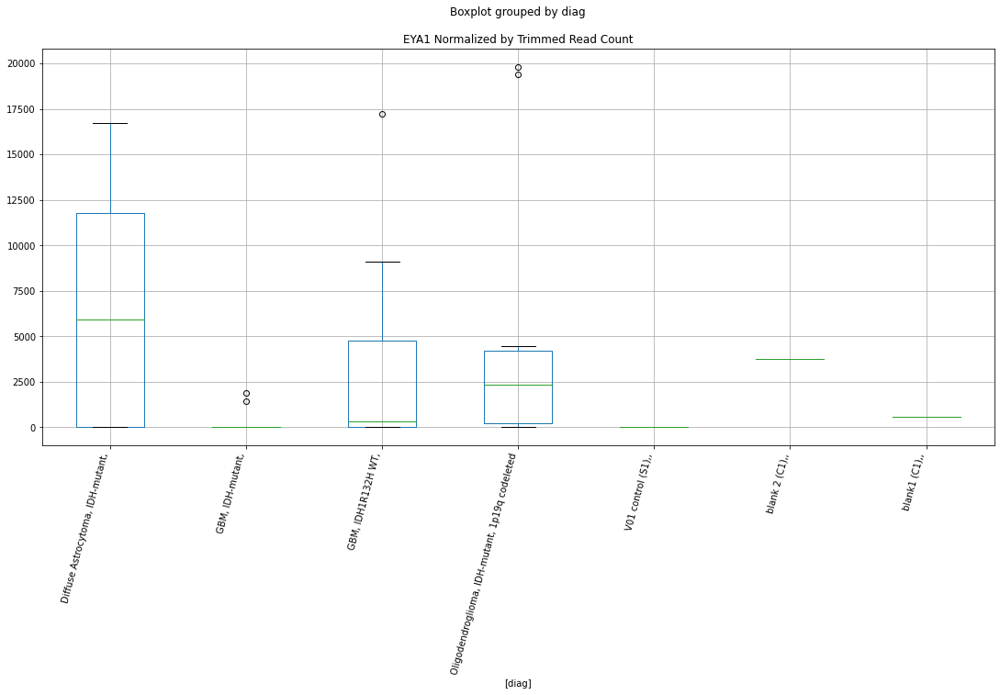

 p : 0.00936637723560713  ( t : 2.908763155244695 ) :  D-plex  :  cutadapt2  :  TXK
Control and blanks
76     0.0
340    0.0
Name: TXK, dtype: float64
208    365594.73
Name: TXK, dtype: float64
472    0.0
Name: TXK, dtype: float64


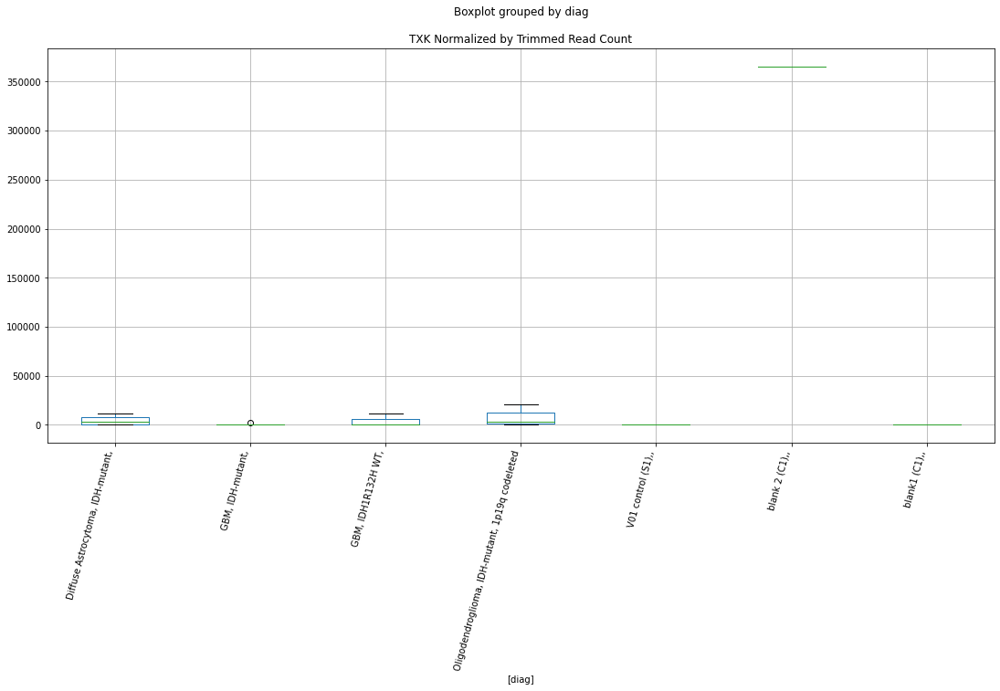

 p : 0.00944517742277203  ( t : 2.904886009484316 ) :  D-plex  :  cutadapt2  :  GBE1
Control and blanks
76     0.0
340    0.0
Name: GBE1, dtype: float64
208    881.8
Name: GBE1, dtype: float64
472    0.0
Name: GBE1, dtype: float64


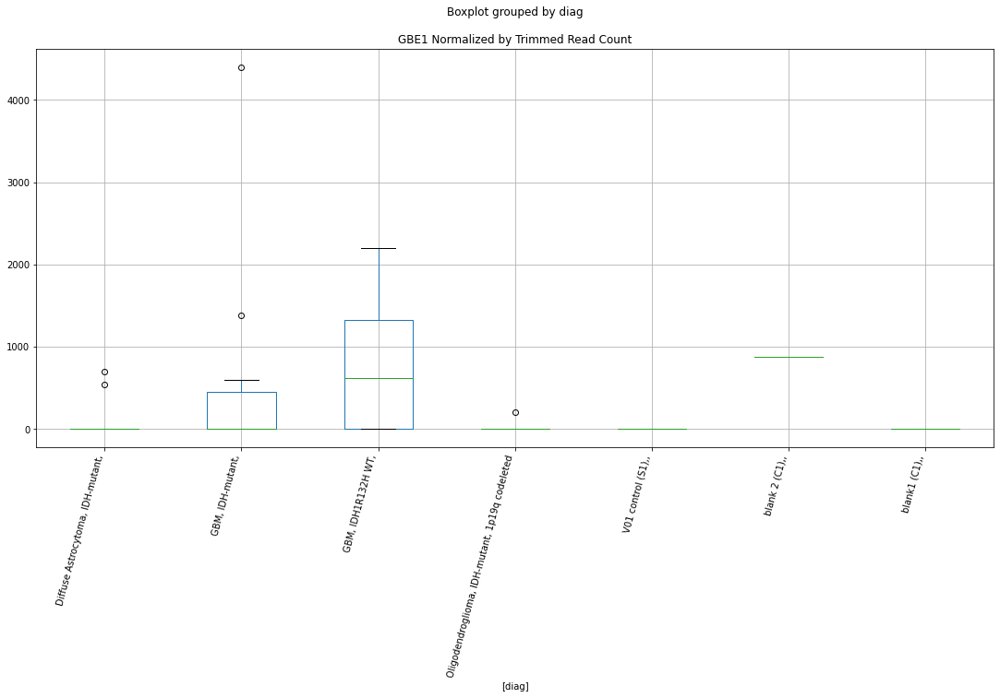

 p : 0.009459176259247262  ( t : 2.9042005064730922 ) :  D-plex  :  bbduk2  :  RNF19A
Control and blanks
73         0.00
337    50738.96
Name: RNF19A, dtype: float64
205    11103.64
Name: RNF19A, dtype: float64
469    0.0
Name: RNF19A, dtype: float64


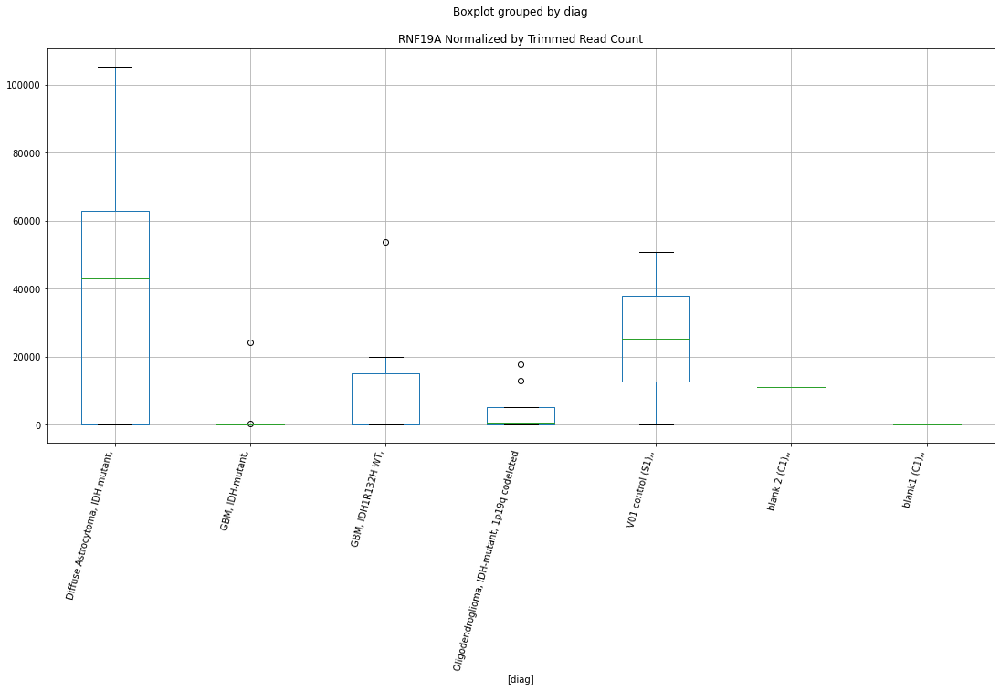

 p : 0.00946160070482046  ( t : 2.904081884429963 ) :  D-plex  :  cutadapt2  :  RNGTT
Control and blanks
76     4545.69
340       0.00
Name: RNGTT, dtype: float64
208    23279.55
Name: RNGTT, dtype: float64
472    24274.15
Name: RNGTT, dtype: float64


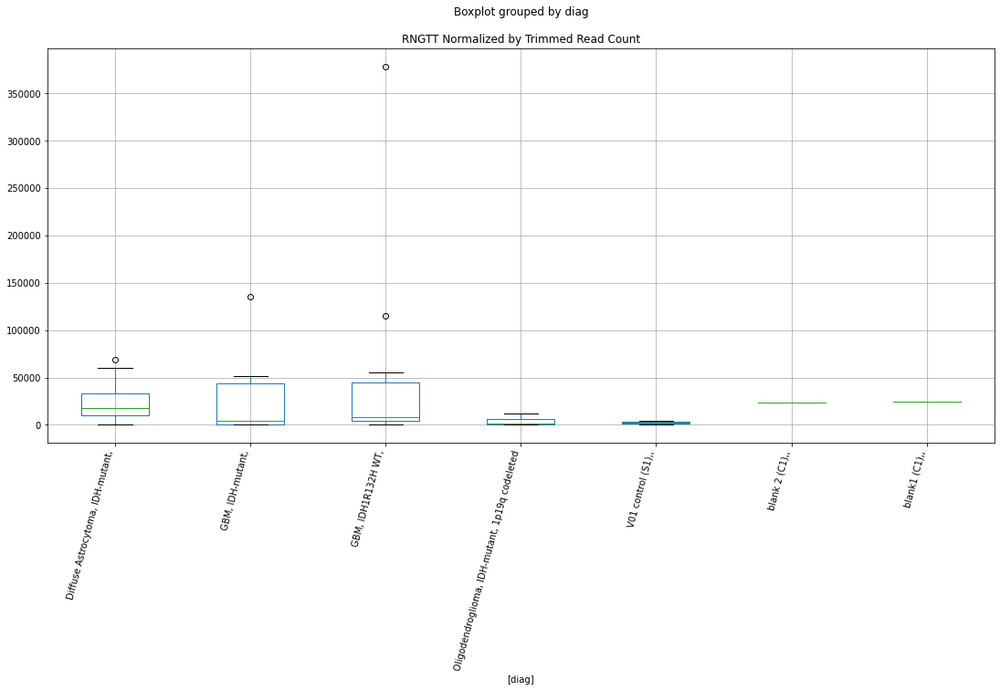

 p : 0.009468013730465805  ( t : 2.90376825269248 ) :  Lexogen  :  bbduk2  :  KMT2A
Control and blanks
79        0.0
343    5944.8
Name: KMT2A, dtype: float64
211    17218.3
Name: KMT2A, dtype: float64
475    1676.61
Name: KMT2A, dtype: float64


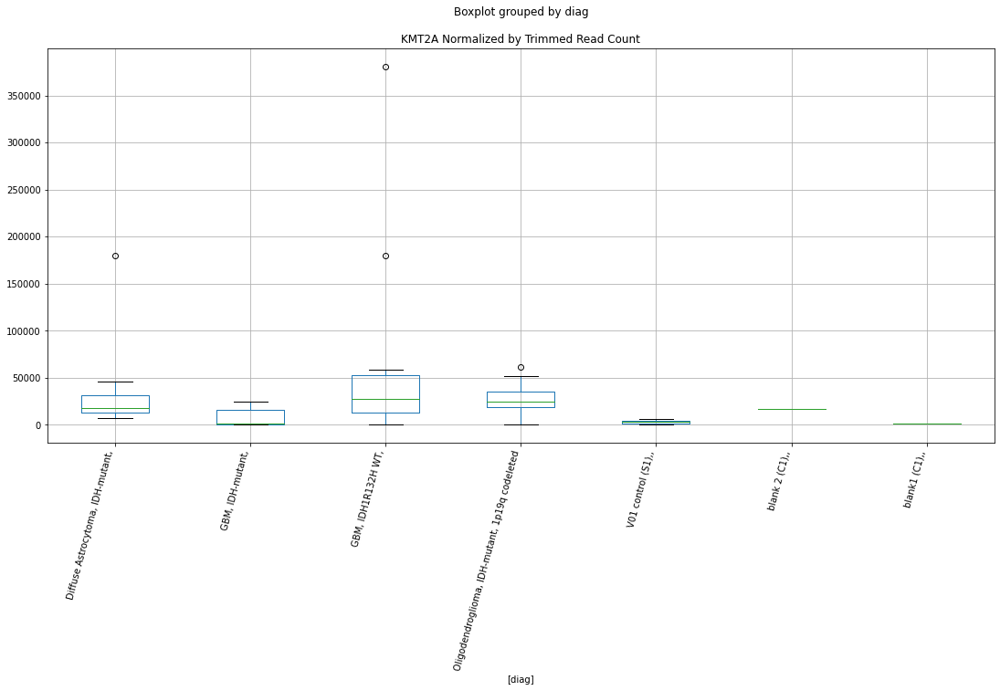

 p : 0.00947014062500278  ( t : 2.9036642813365185 ) :  Lexogen  :  cutadapt2  :  MIR10B
Control and blanks
82       1420.05
346    119947.68
Name: MIR10B, dtype: float64
214    5966.98
Name: MIR10B, dtype: float64
478    237.46
Name: MIR10B, dtype: float64


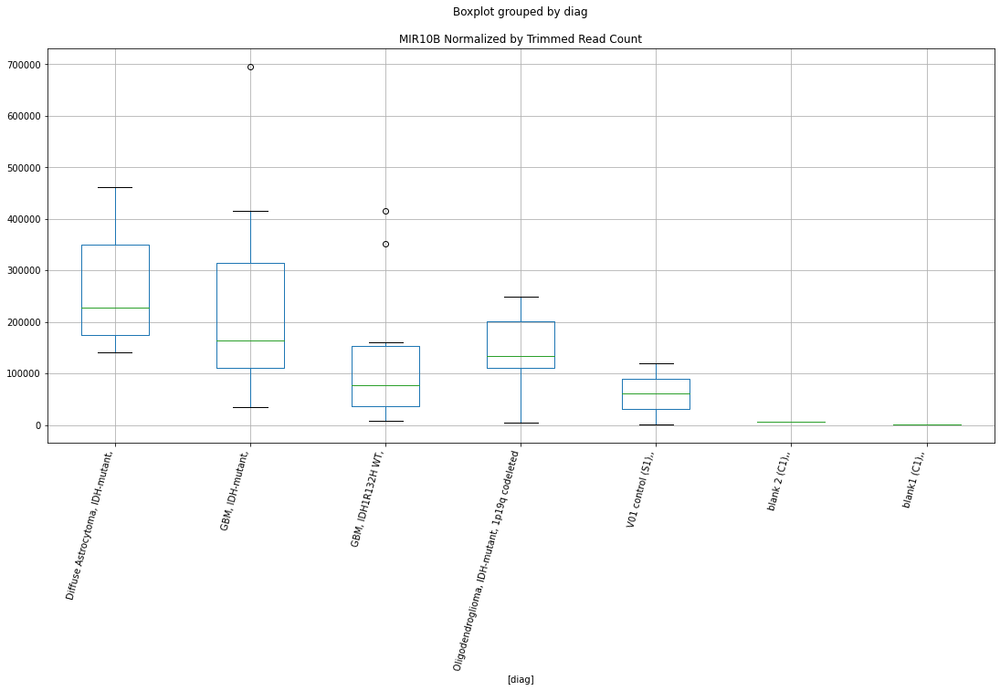

 p : 0.009475283293434642  ( t : 2.9034129797405765 ) :  Lexogen  :  bbduk2  :  UBE2D1
Control and blanks
79     0.0
343    0.0
Name: UBE2D1, dtype: float64
211    0.0
Name: UBE2D1, dtype: float64
475    0.0
Name: UBE2D1, dtype: float64


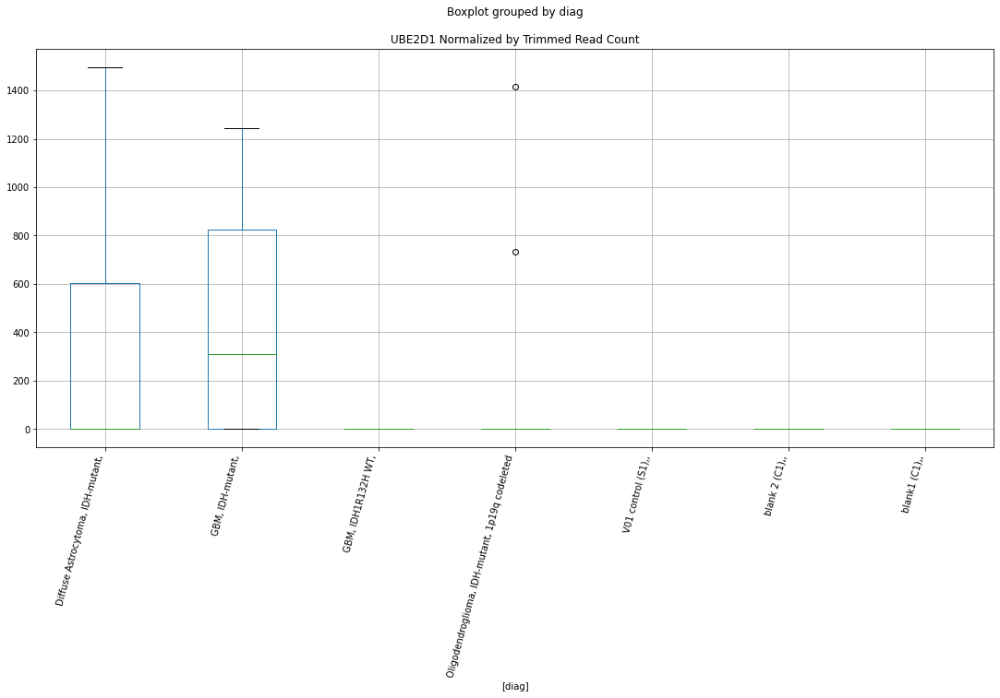

 p : 0.0094967120147954  ( t : 2.9023672605843682 ) :  D-plex  :  cutadapt2  :  ACTN3
Control and blanks
76     1515.23
340       0.00
Name: ACTN3, dtype: float64
208    4056.29
Name: ACTN3, dtype: float64
472    6935.47
Name: ACTN3, dtype: float64


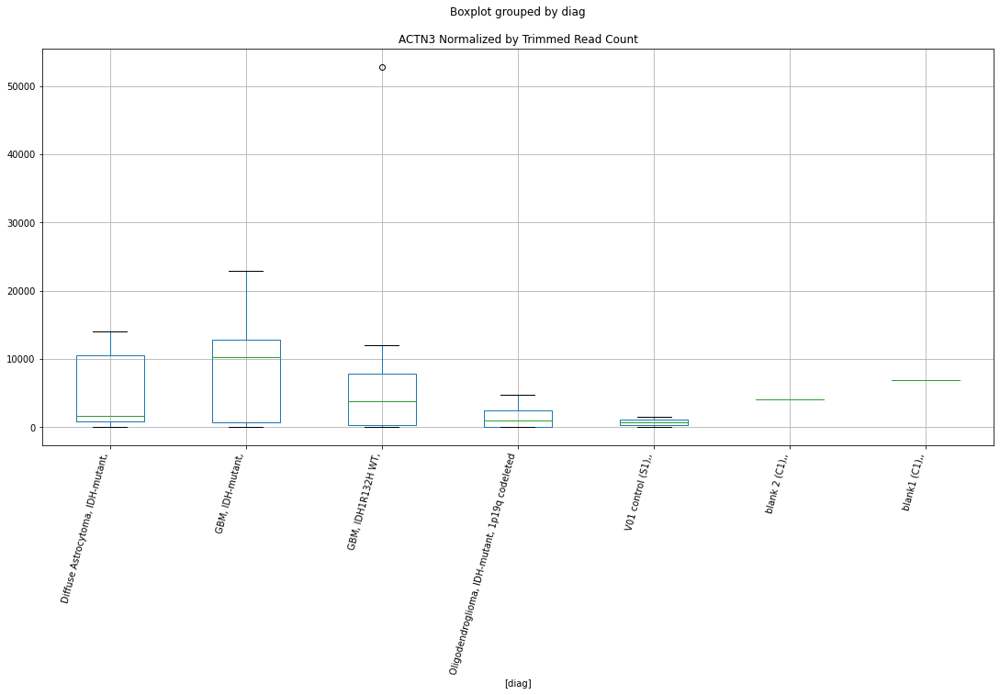

 p : 0.00952560236962854  ( t : 2.9009610173025577 ) :  Lexogen  :  bbduk2  :  MIR10B
Control and blanks
79       1430.60
343    121231.47
Name: MIR10B, dtype: float64
211    6012.74
Name: MIR10B, dtype: float64
475    239.52
Name: MIR10B, dtype: float64


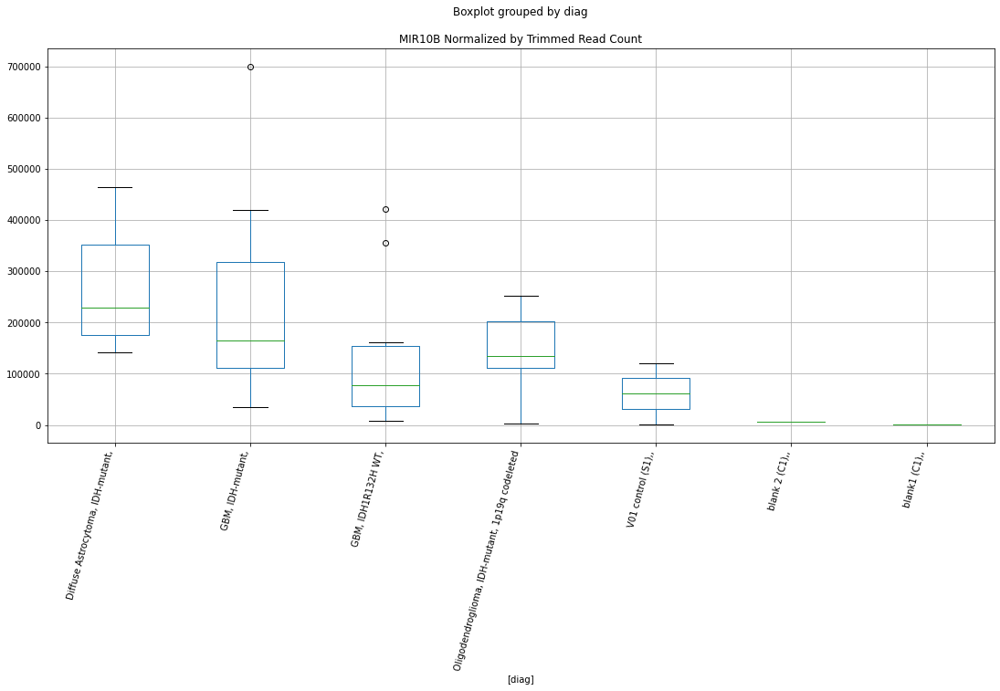

 p : 0.00954786690458309  ( t : 2.89988009534706 ) :  D-plex  :  cutadapt2  :  DOK1
Control and blanks
76     36365.48
340        0.00
Name: DOK1, dtype: float64
208    10581.61
Name: DOK1, dtype: float64
472    1155.91
Name: DOK1, dtype: float64


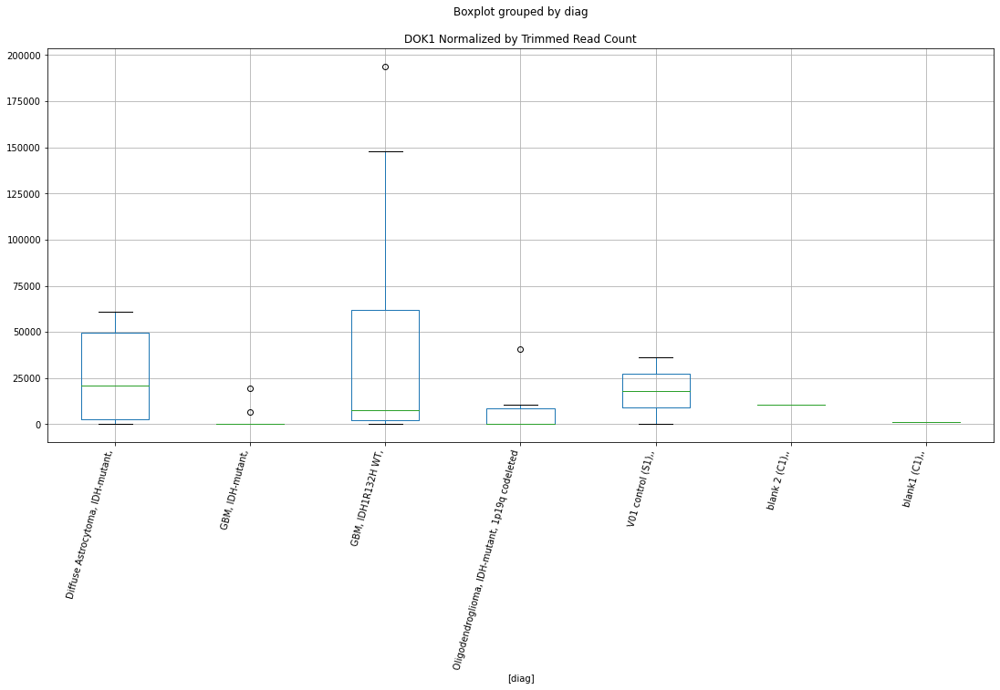

 p : 0.00959282605926025  ( t : 2.89770477388757 ) :  Lexogen  :  bbduk2  :  LOC105373874
Control and blanks
79     0.0
343    0.0
Name: LOC105373874, dtype: float64
211    0.0
Name: LOC105373874, dtype: float64
475    0.0
Name: LOC105373874, dtype: float64


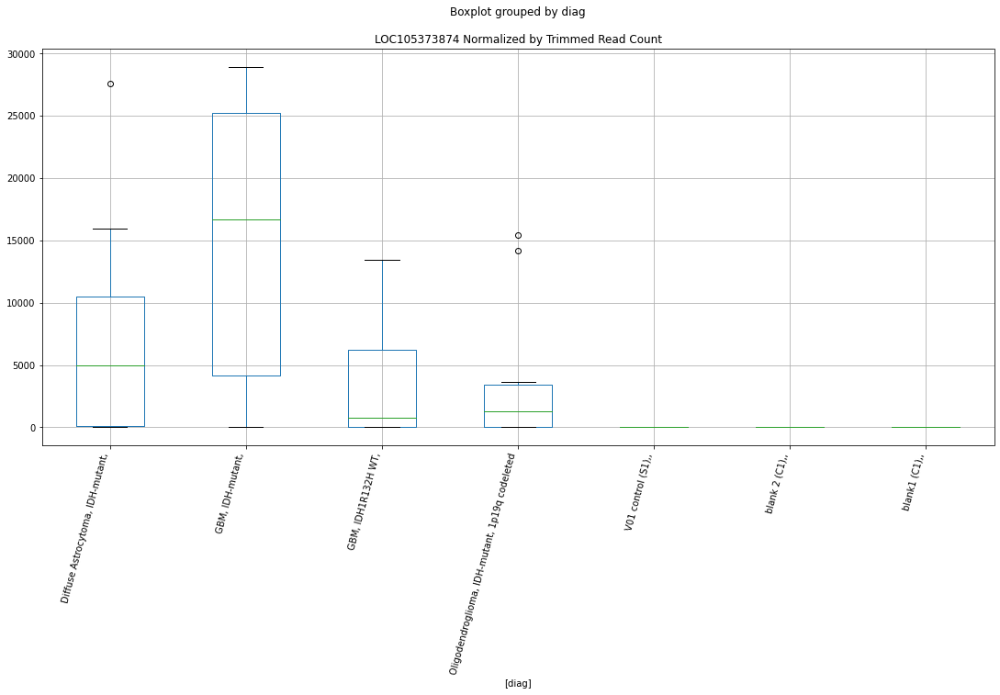

 p : 0.009606161885131323  ( t : 2.8970614215634627 ) :  Lexogen  :  cutadapt2  :  RIMBP3B
Control and blanks
82     0.0
346    0.0
Name: RIMBP3B, dtype: float64
214    0.0
Name: RIMBP3B, dtype: float64
478    237.46
Name: RIMBP3B, dtype: float64


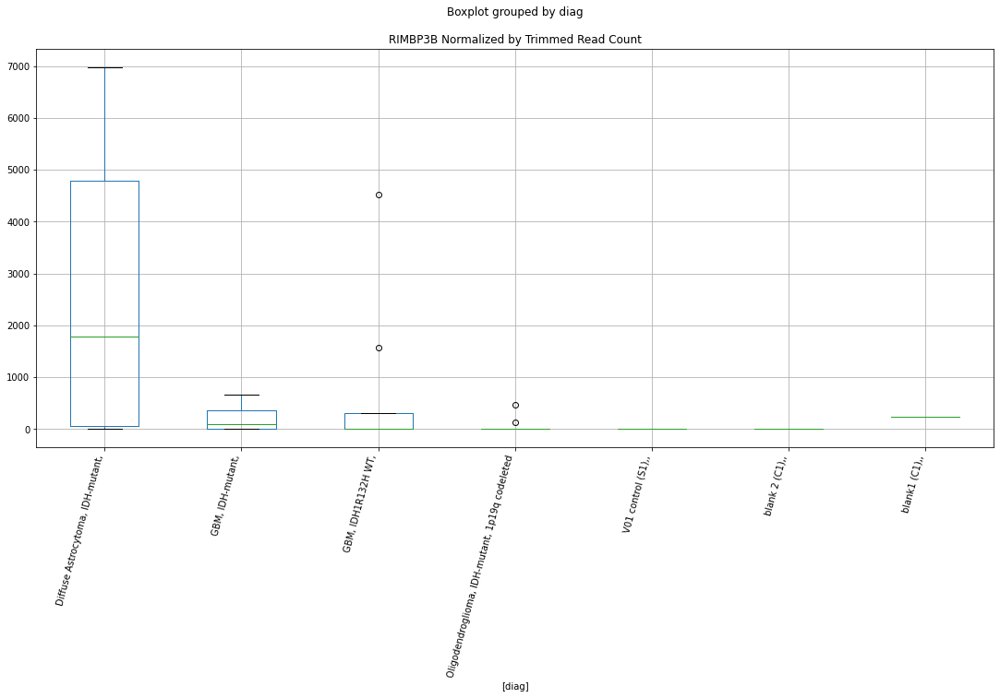

 p : 0.009606161885131323  ( t : 2.8970614215634627 ) :  Lexogen  :  cutadapt2  :  RIMBP3C
Control and blanks
82     0.0
346    0.0
Name: RIMBP3C, dtype: float64
214    0.0
Name: RIMBP3C, dtype: float64
478    237.46
Name: RIMBP3C, dtype: float64


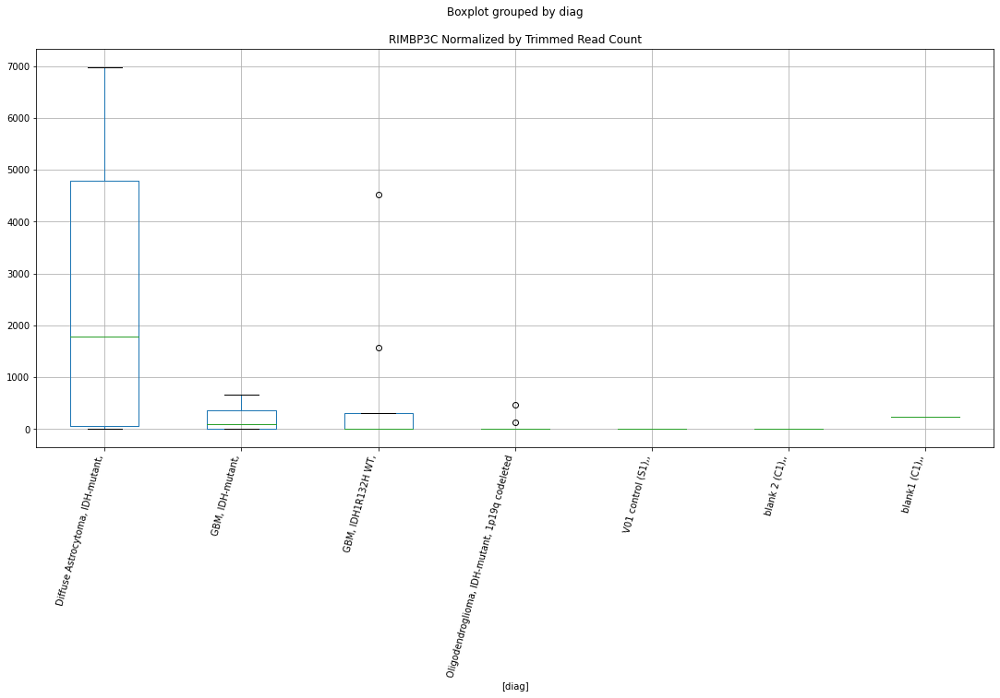

 p : 0.009630559410402124  ( t : 2.895886655753919 ) :  D-plex  :  cutadapt2  :  CDC25B
Control and blanks
76        0.00
340    3522.93
Name: CDC25B, dtype: float64
208    41444.65
Name: CDC25B, dtype: float64
472    4045.69
Name: CDC25B, dtype: float64


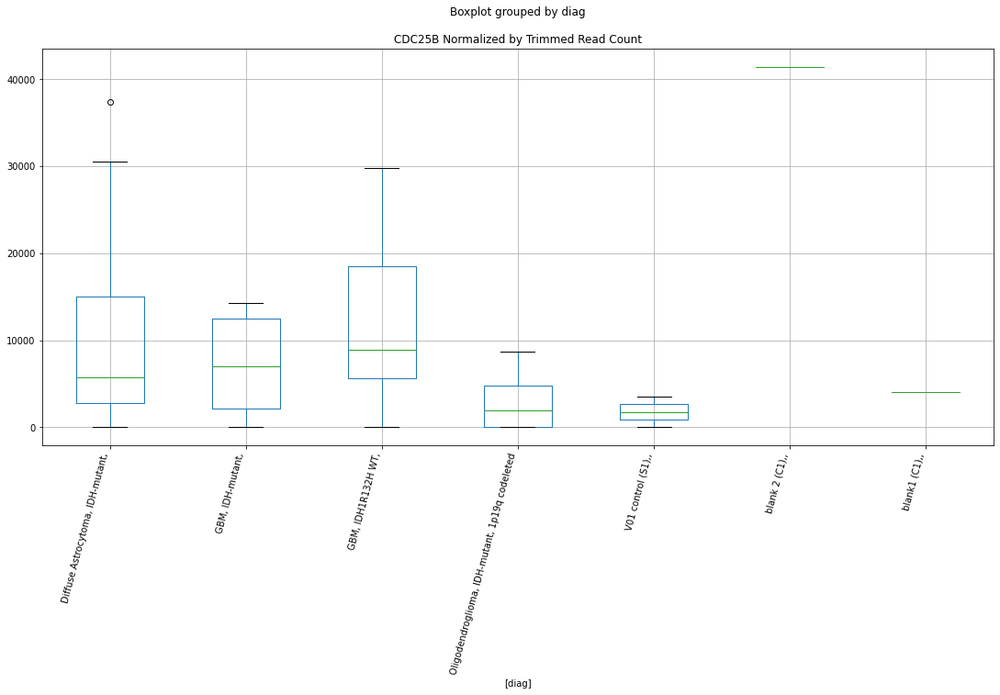

 p : 0.009635350716182278  ( t : 2.895656287179688 ) :  Lexogen  :  bbduk2  :  RIMBP3B
Control and blanks
79       0.00
343    212.31
Name: RIMBP3B, dtype: float64
211    0.0
Name: RIMBP3B, dtype: float64
475    239.52
Name: RIMBP3B, dtype: float64


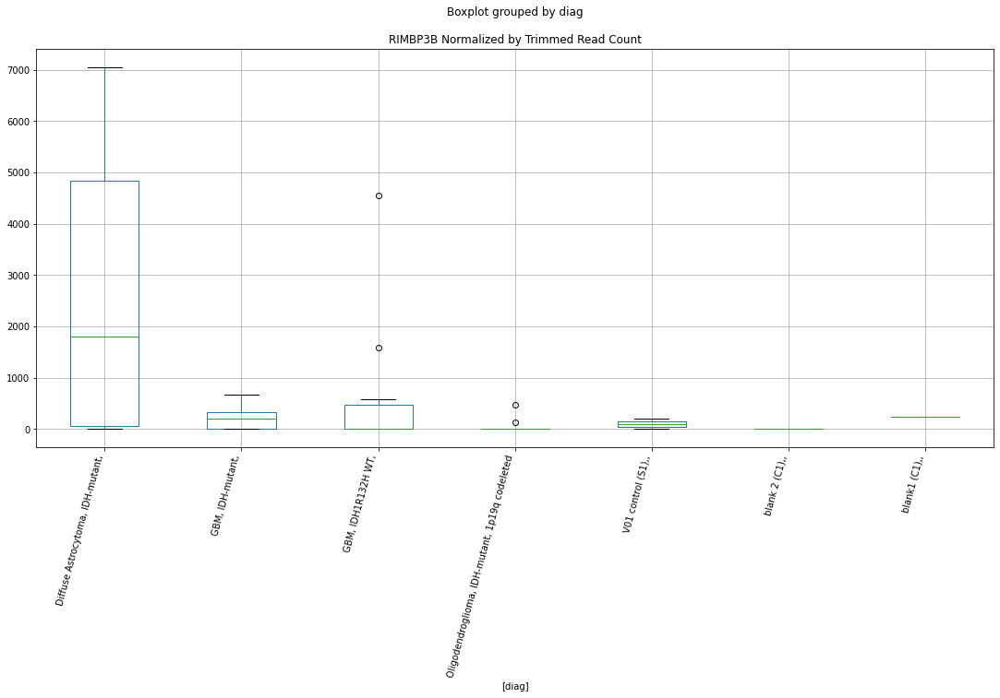

 p : 0.009635350716182278  ( t : 2.895656287179688 ) :  Lexogen  :  bbduk2  :  RIMBP3C
Control and blanks
79       0.00
343    212.31
Name: RIMBP3C, dtype: float64
211    0.0
Name: RIMBP3C, dtype: float64
475    239.52
Name: RIMBP3C, dtype: float64


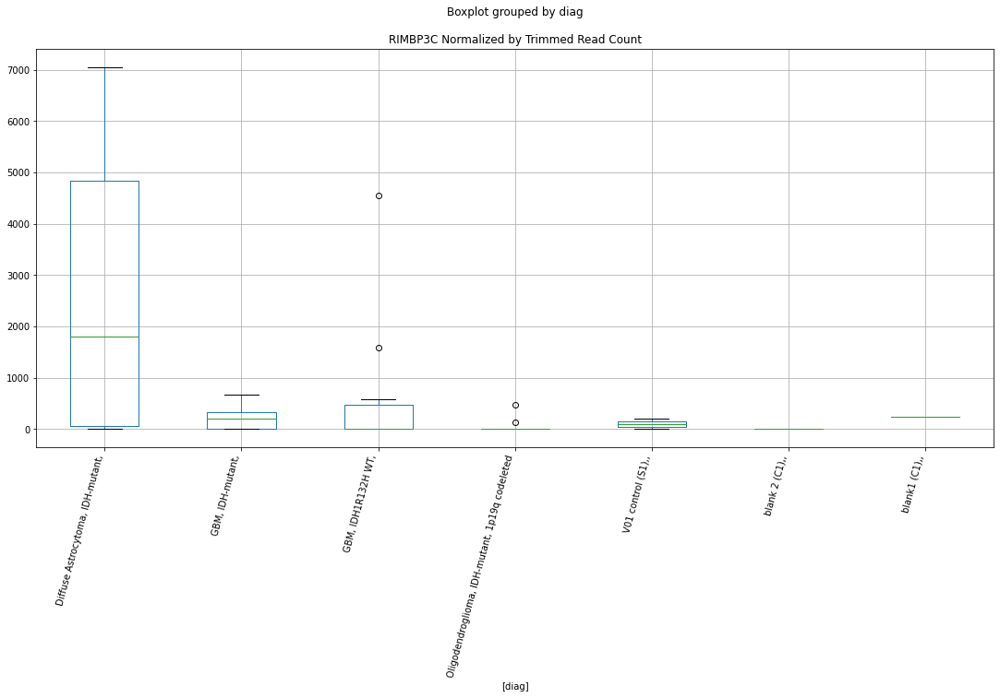

 p : 0.009636793445346046  ( t : 2.895586941652993 ) :  Lexogen  :  cutadapt2  :  LOC105373874
Control and blanks
82     0.0
346    0.0
Name: LOC105373874, dtype: float64
214    0.0
Name: LOC105373874, dtype: float64
478    0.0
Name: LOC105373874, dtype: float64


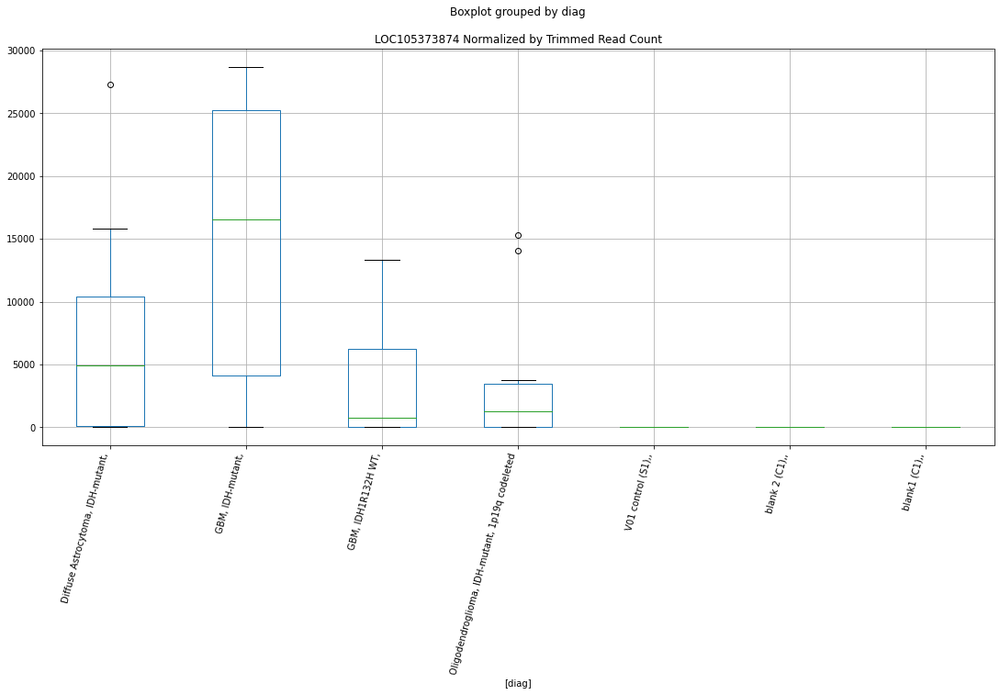

 p : 0.0096553843825977  ( t : 2.894694254511459 ) :  D-plex  :  cutadapt2  :  RNF19A
Control and blanks
76         0.00
340    38752.21
Name: RNF19A, dtype: float64
208    8641.65
Name: RNF19A, dtype: float64
472    0.0
Name: RNF19A, dtype: float64


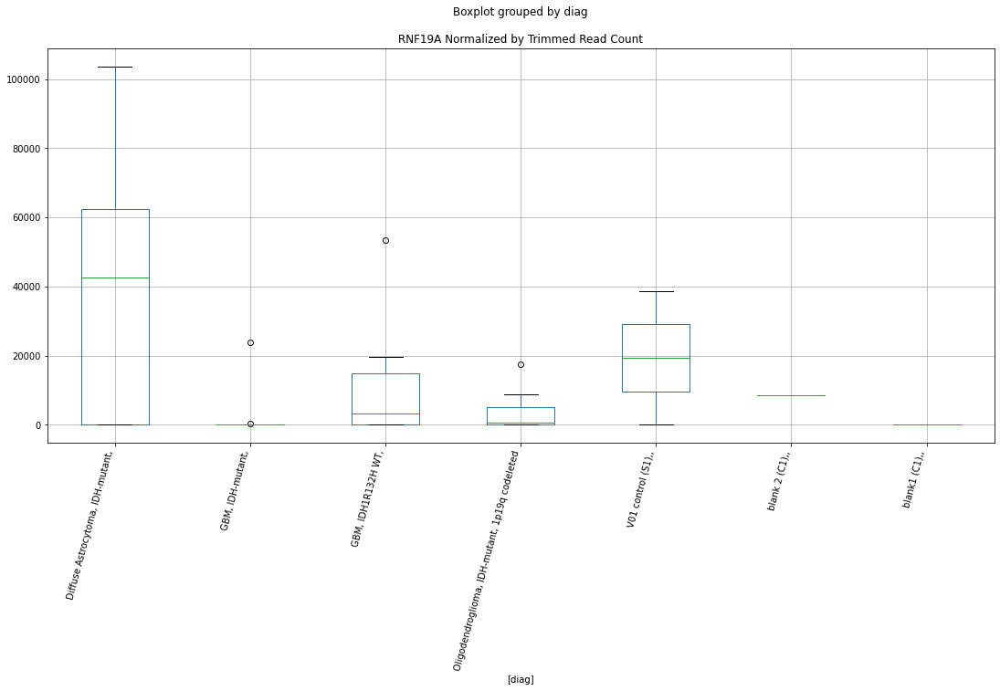

 p : 0.00967235461229129  ( t : 2.893880837403186 ) :  D-plex  :  cutadapt2  :  LOC101928077
Control and blanks
76     0.0
340    0.0
Name: LOC101928077, dtype: float64
208    0.0
Name: LOC101928077, dtype: float64
472    0.0
Name: LOC101928077, dtype: float64


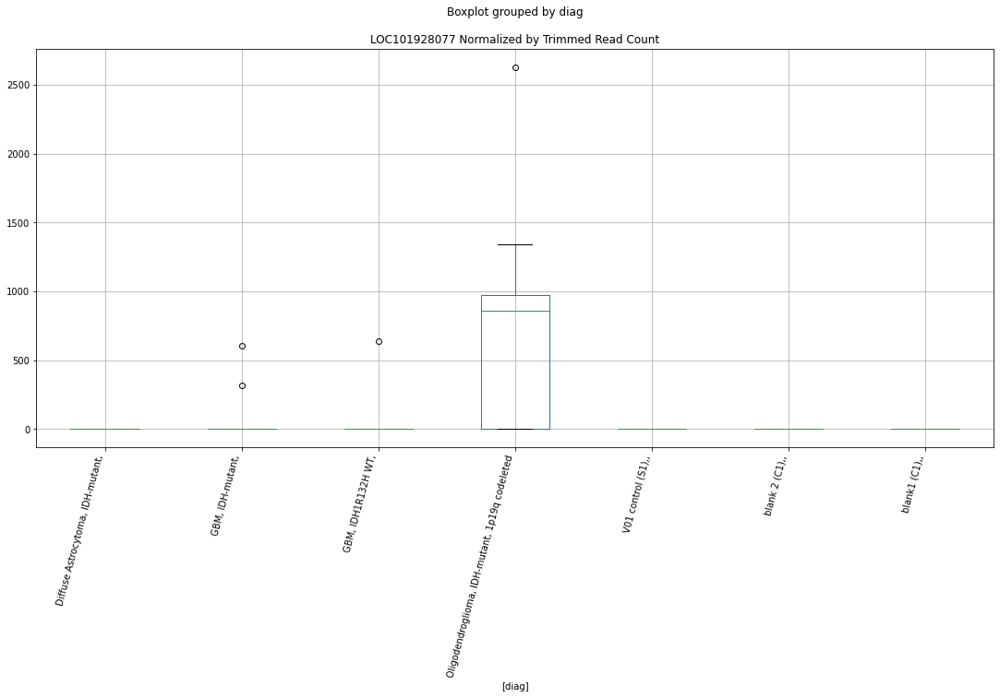

 p : 0.00968993026404235  ( t : 2.893039852727409 ) :  Lexogen  :  bbduk2  :  DDA1
Control and blanks
79         0.00
343    25477.72
Name: DDA1, dtype: float64
211    2733.06
Name: DDA1, dtype: float64
475    0.0
Name: DDA1, dtype: float64


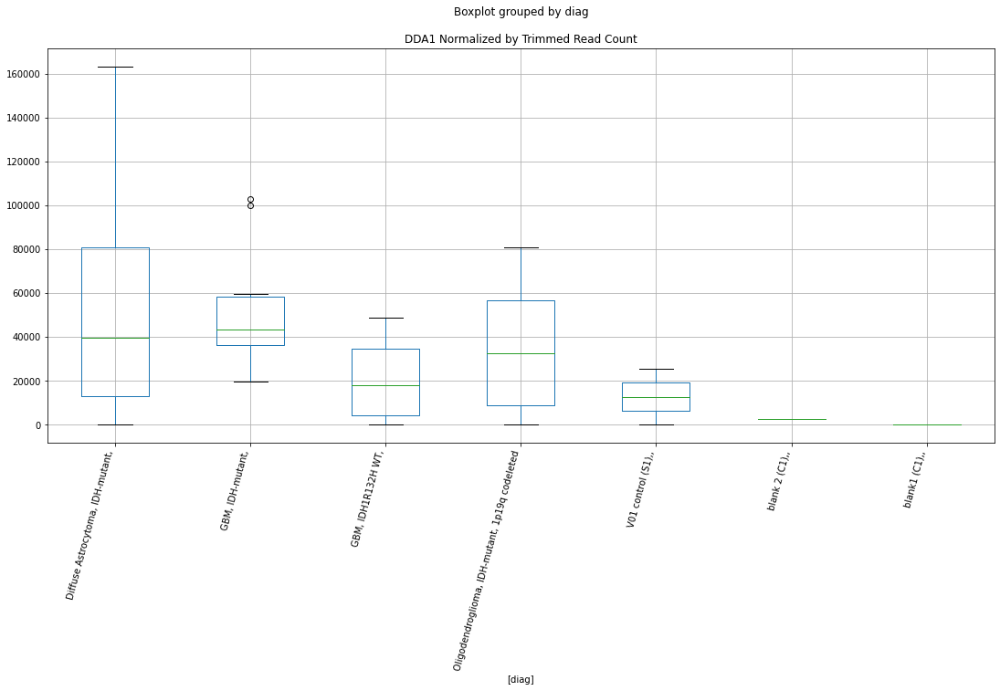

 p : 0.009702342656204729  ( t : 2.892446814007122 ) :  Lexogen  :  cutadapt2  :  GNAS
Control and blanks
82         0.00
346    62288.62
Name: GNAS, dtype: float64
214    82995.29
Name: GNAS, dtype: float64
478    0.0
Name: GNAS, dtype: float64


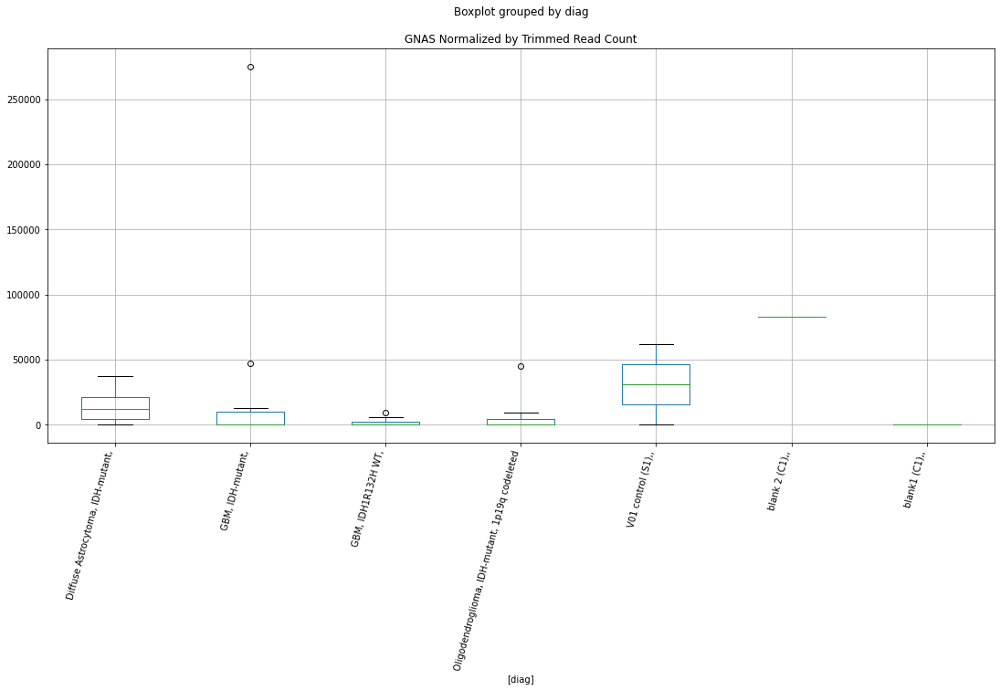

 p : 0.009724958145531941  ( t : 2.891368173112225 ) :  D-plex  :  bbduk2  :  PTPN11
Control and blanks
73         0.00
337    81894.47
Name: PTPN11, dtype: float64
205    0.0
Name: PTPN11, dtype: float64
469    0.0
Name: PTPN11, dtype: float64


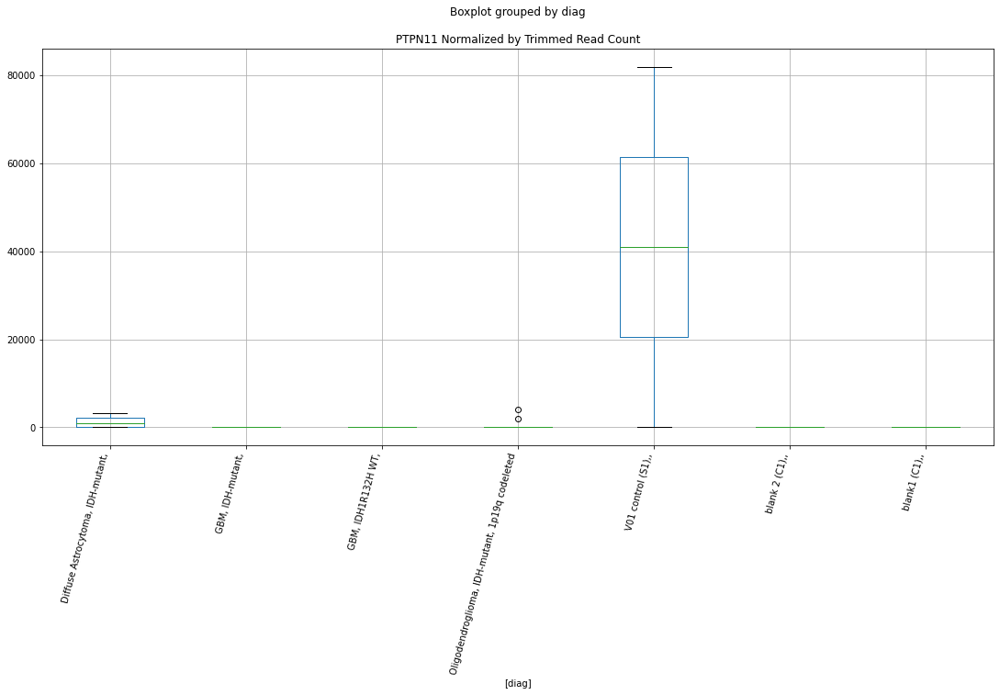

 p : 0.00973478861194129  ( t : 2.89090006615781 ) :  Lexogen  :  cutadapt2  :  LOC105369983
Control and blanks
82         0.00
346    27356.49
Name: LOC105369983, dtype: float64
214    5424.53
Name: LOC105369983, dtype: float64
478    0.0
Name: LOC105369983, dtype: float64


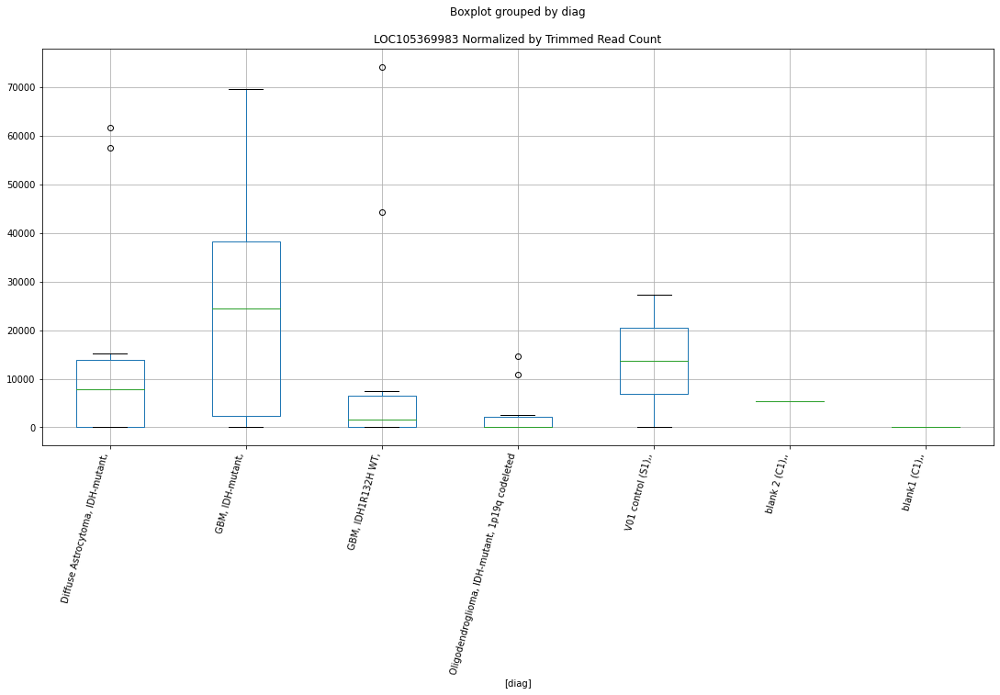

 p : 0.00973732516134846  ( t : 2.8907793548779996 ) :  Lexogen  :  bbduk2  :  LOC105369983
Control and blanks
79         0.00
343    27600.86
Name: LOC105369983, dtype: float64
211    5466.13
Name: LOC105369983, dtype: float64
475    0.0
Name: LOC105369983, dtype: float64


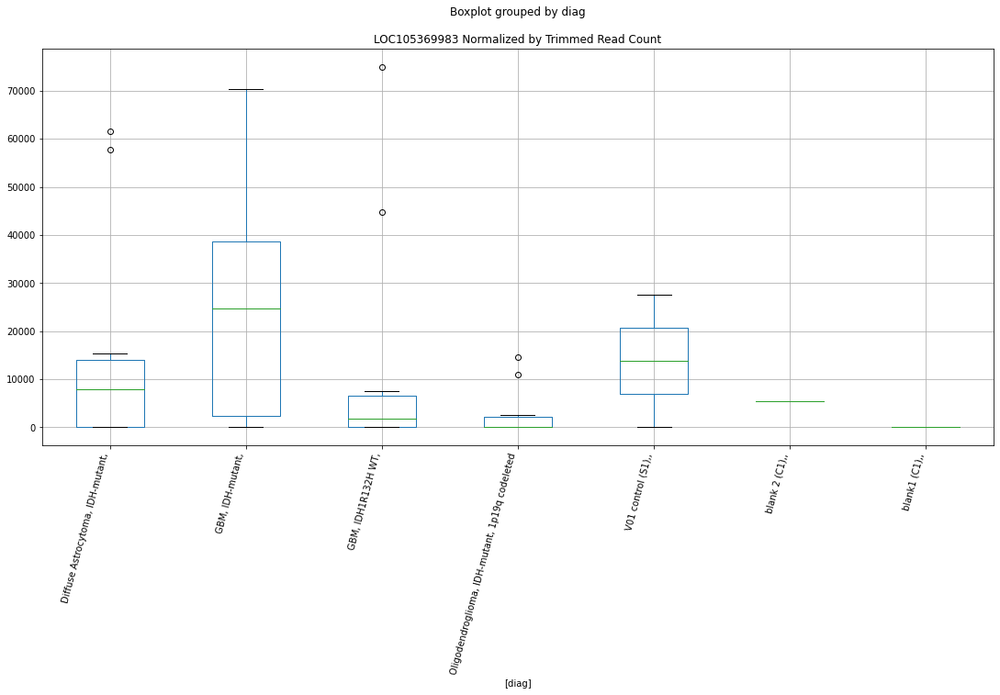

 p : 0.009738809272076258  ( t : 2.890708741944123 ) :  D-plex  :  cutadapt2  :  LOC105376731
Control and blanks
76     0.0
340    0.0
Name: LOC105376731, dtype: float64
208    705.44
Name: LOC105376731, dtype: float64
472    1155.91
Name: LOC105376731, dtype: float64


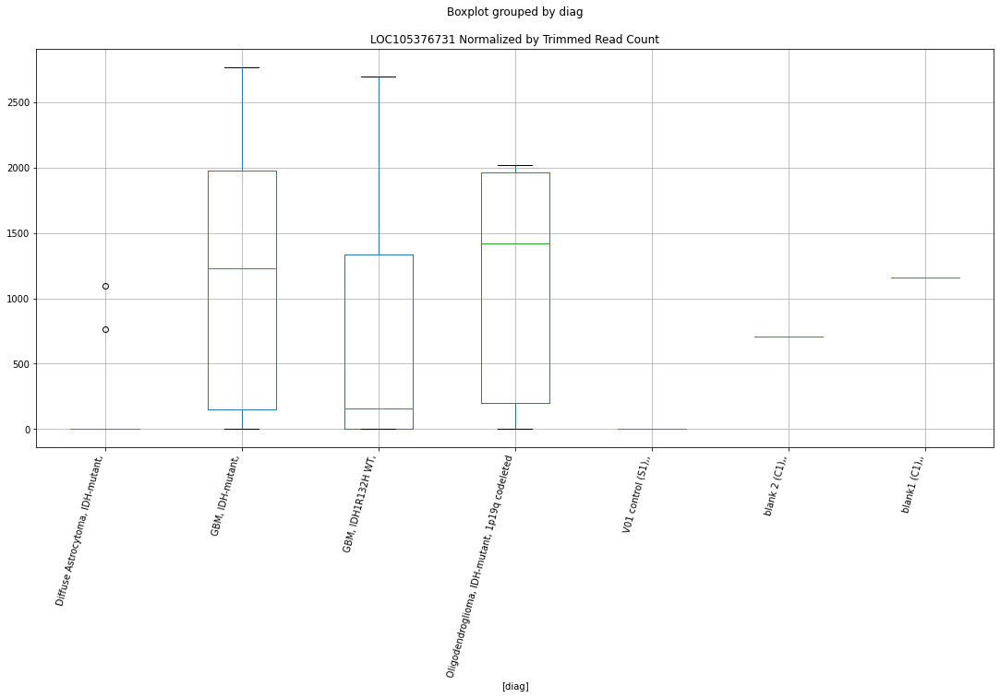

 p : 0.009761876942716447  ( t : 2.8896125322909043 ) :  D-plex  :  cutadapt2  :  MYO1C
Control and blanks
76     40911.17
340     5284.39
Name: MYO1C, dtype: float64
208    121688.55
Name: MYO1C, dtype: float64
472    55483.76
Name: MYO1C, dtype: float64


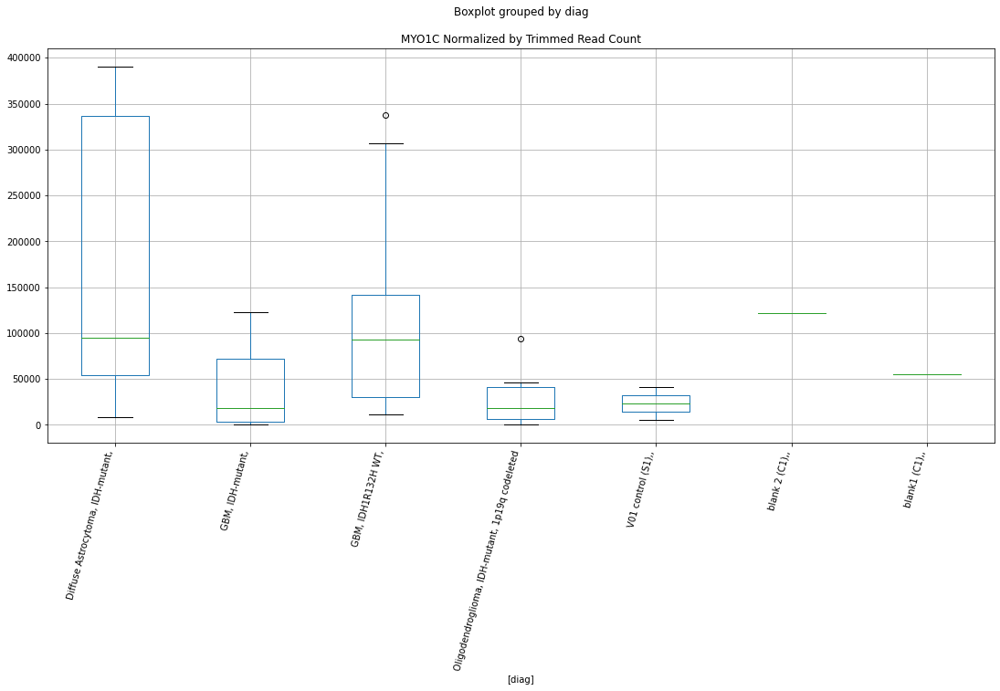

 p : 0.009782559905699172  ( t : 2.8886317718796586 ) :  D-plex  :  bbduk2  :  AP4E1
Control and blanks
73     6184.07
337       0.00
Name: AP4E1, dtype: float64
205    1074.55
Name: AP4E1, dtype: float64
469    4732.22
Name: AP4E1, dtype: float64


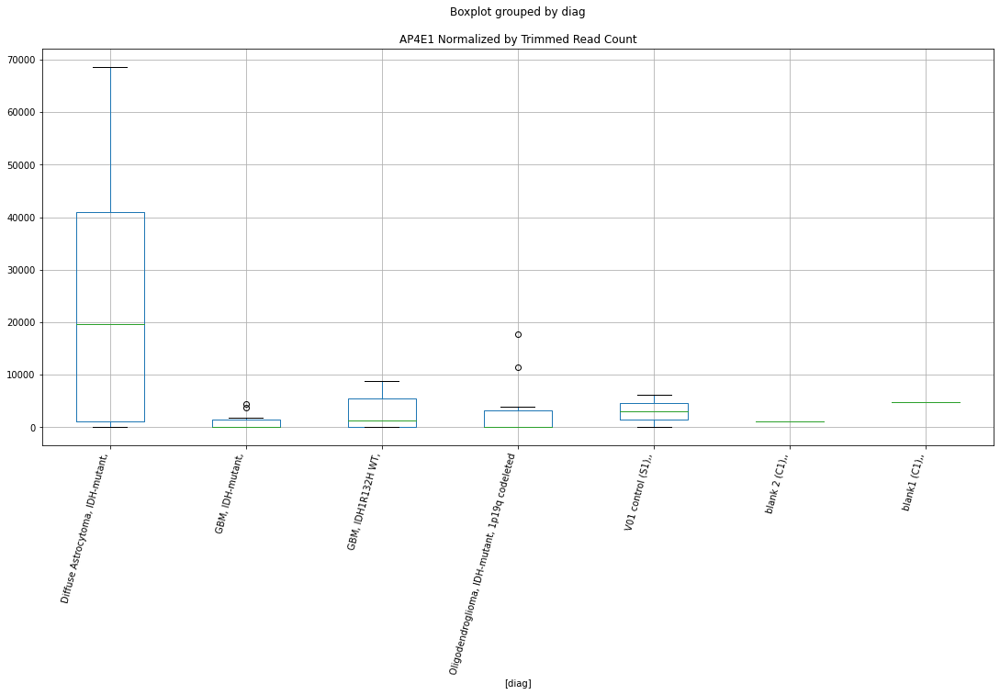

 p : 0.009791791309882775  ( t : 2.8881946761562176 ) :  D-plex  :  bbduk2  :  ASIC1
Control and blanks
73     0.0
337    0.0
Name: ASIC1, dtype: float64
205    8059.09
Name: ASIC1, dtype: float64
469    591.53
Name: ASIC1, dtype: float64


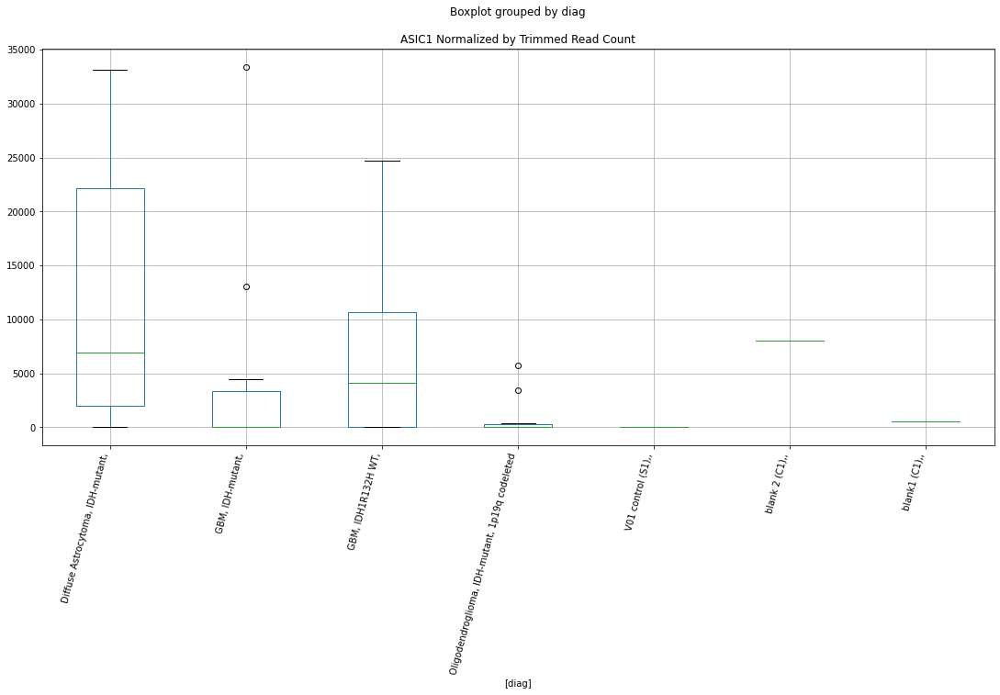

 p : 0.009795065449882597  ( t : 2.8880397451886646 ) :  Lexogen  :  bbduk2  :  HUWE1
Control and blanks
79        0.00
343    4246.29
Name: HUWE1, dtype: float64
211    4919.51
Name: HUWE1, dtype: float64
475    4790.31
Name: HUWE1, dtype: float64


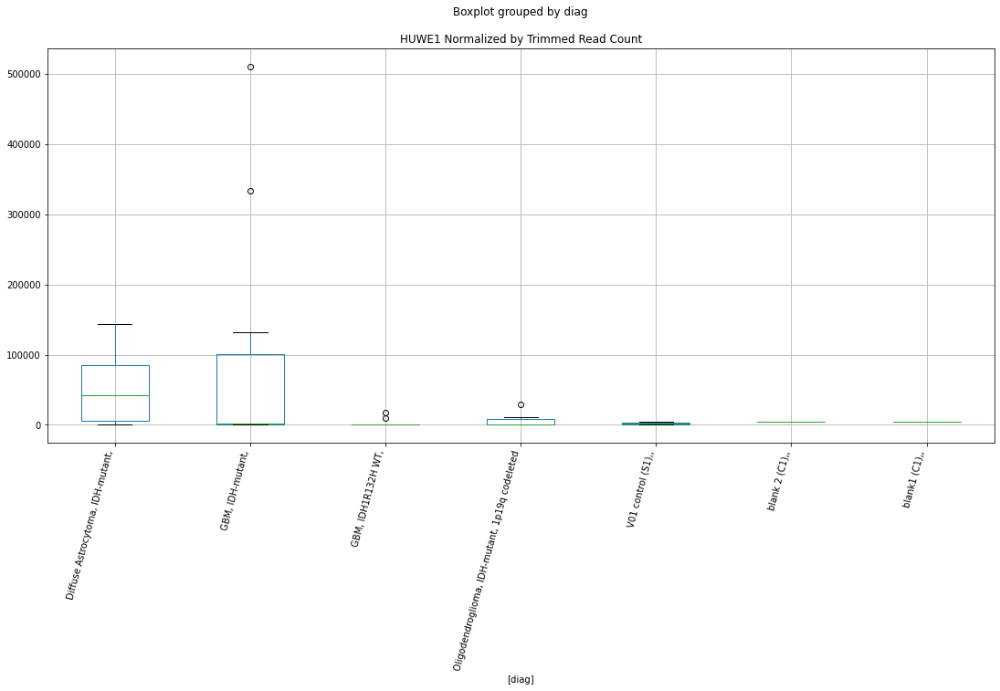

 p : 0.009848533200708168  ( t : 2.8855167226387186 ) :  D-plex  :  bbduk2  :  COL9A2
Control and blanks
73     32466.35
337        0.00
Name: COL9A2, dtype: float64
205    9133.64
Name: COL9A2, dtype: float64
469    20703.46
Name: COL9A2, dtype: float64


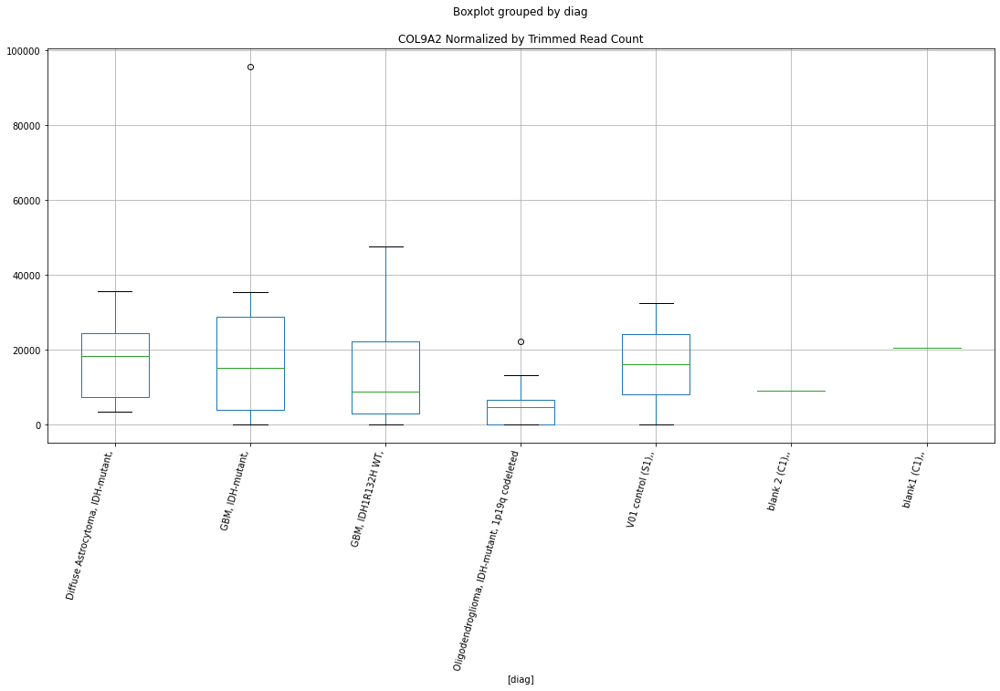

 p : 0.009853593232329826  ( t : 2.8852786364450003 ) :  D-plex  :  cutadapt2  :  LOC105375457
Control and blanks
76     2272.84
340     880.73
Name: LOC105375457, dtype: float64
208    3703.56
Name: LOC105375457, dtype: float64
472    1733.87
Name: LOC105375457, dtype: float64


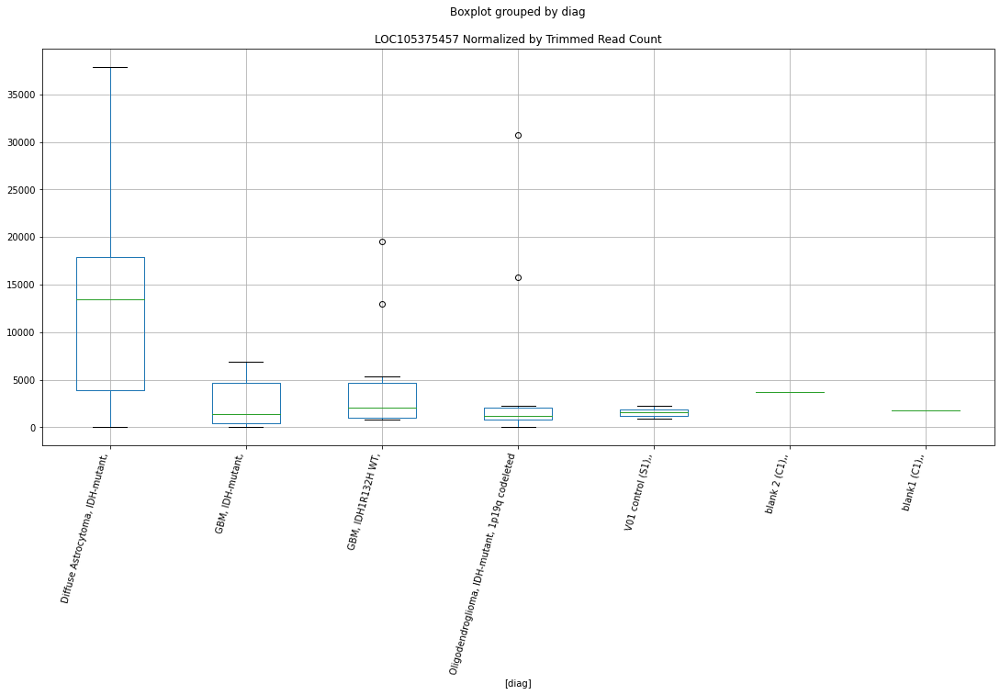

 p : 0.009886662384111535  ( t : 2.8837255560680424 ) :  D-plex  :  cutadapt2  :  RHOH
Control and blanks
76     0.0
340    0.0
Name: RHOH, dtype: float64
208    28923.08
Name: RHOH, dtype: float64
472    9247.29
Name: RHOH, dtype: float64


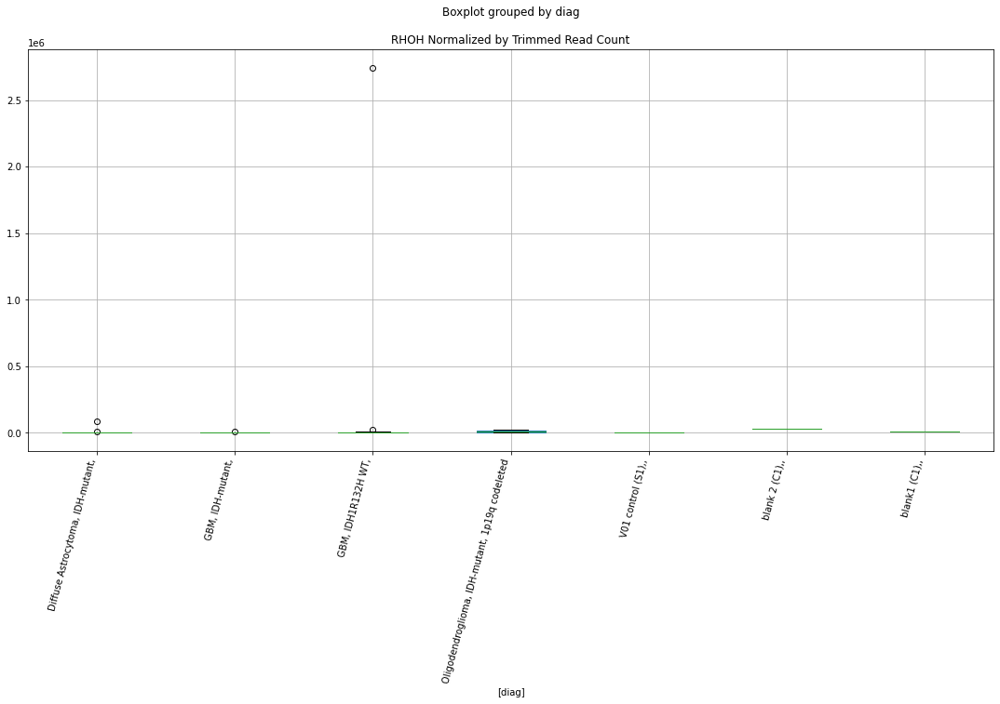

 p : 0.009993422743646823  ( t : 2.8787455952238177 ) :  Lexogen  :  cutadapt2  :  B3GALT6
Control and blanks
82         0.00
346    32406.92
Name: B3GALT6, dtype: float64
214    271.23
Name: B3GALT6, dtype: float64
478    237.46
Name: B3GALT6, dtype: float64


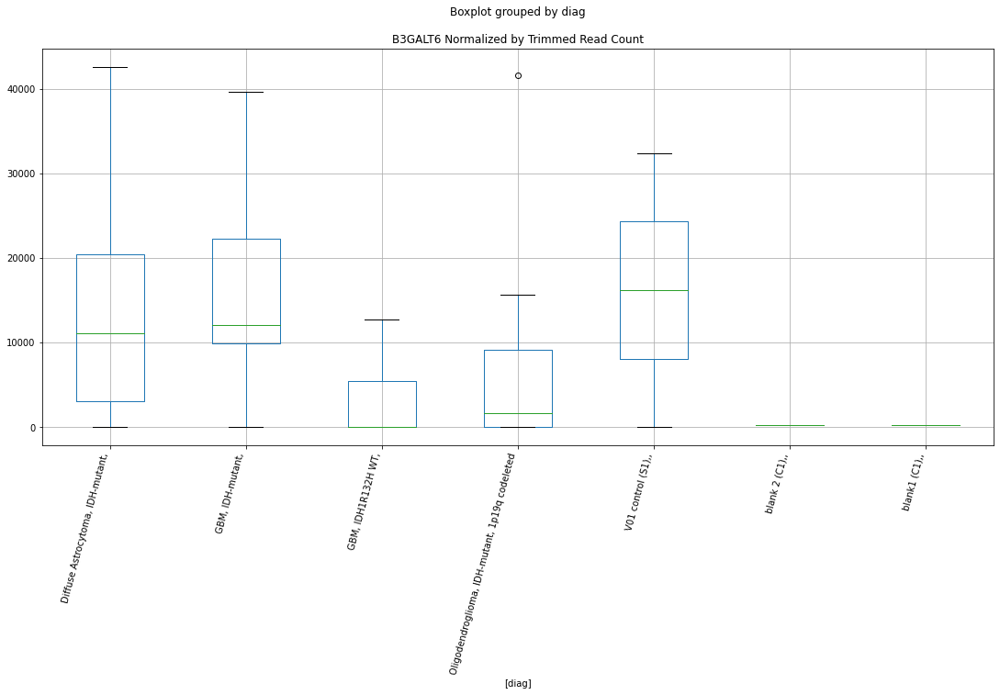

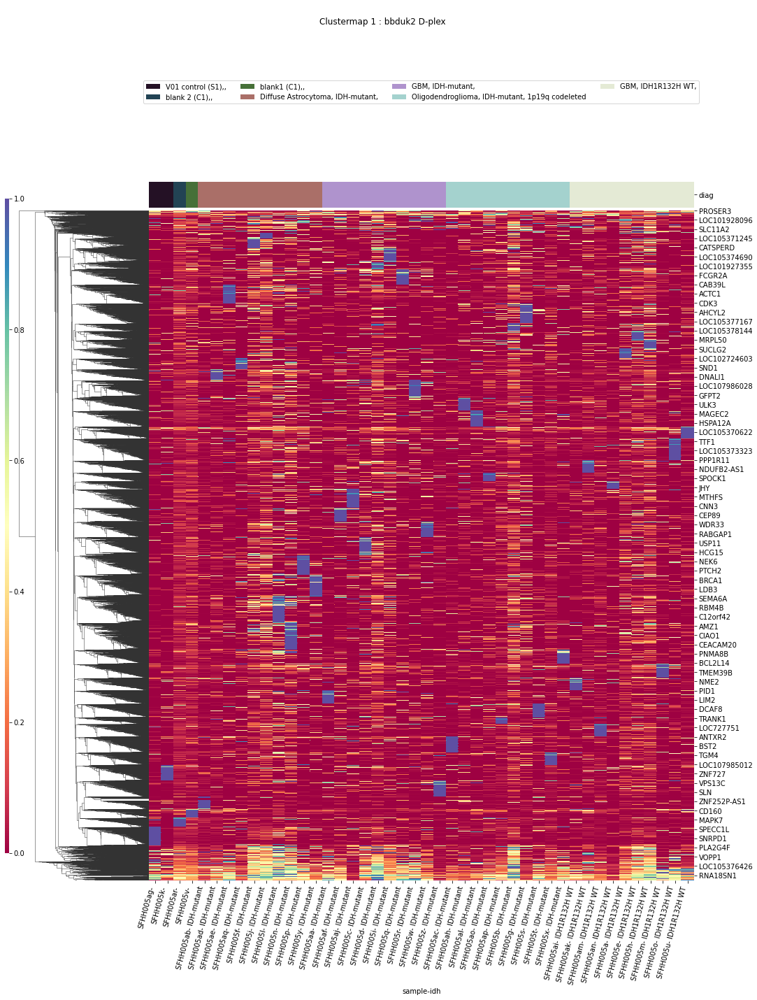

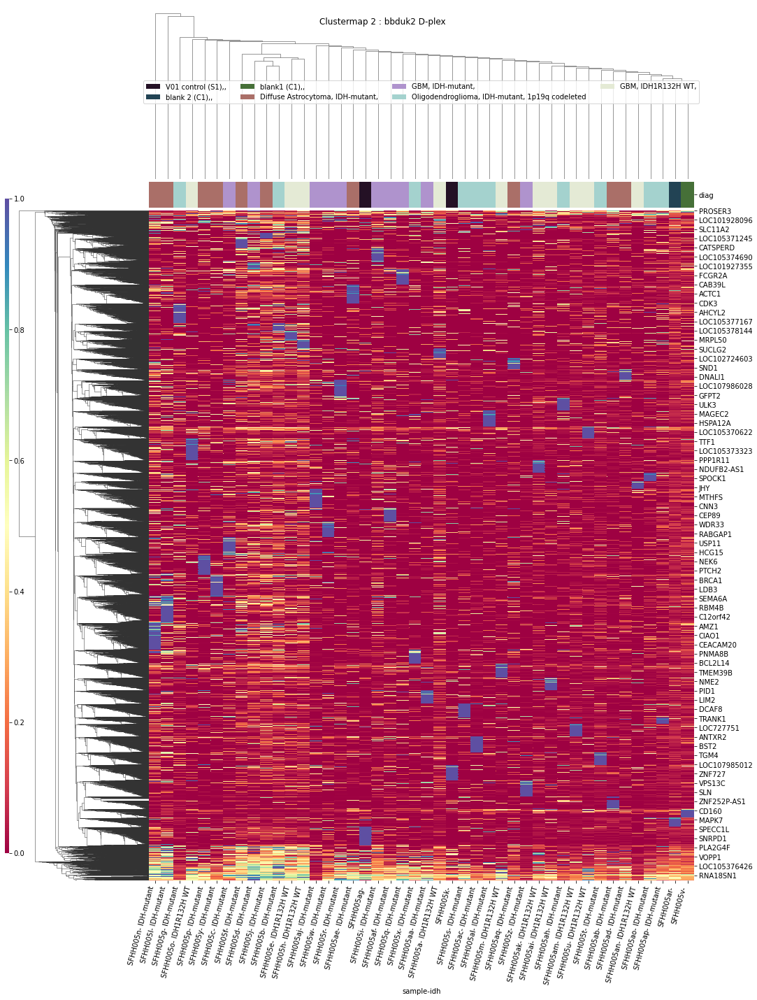

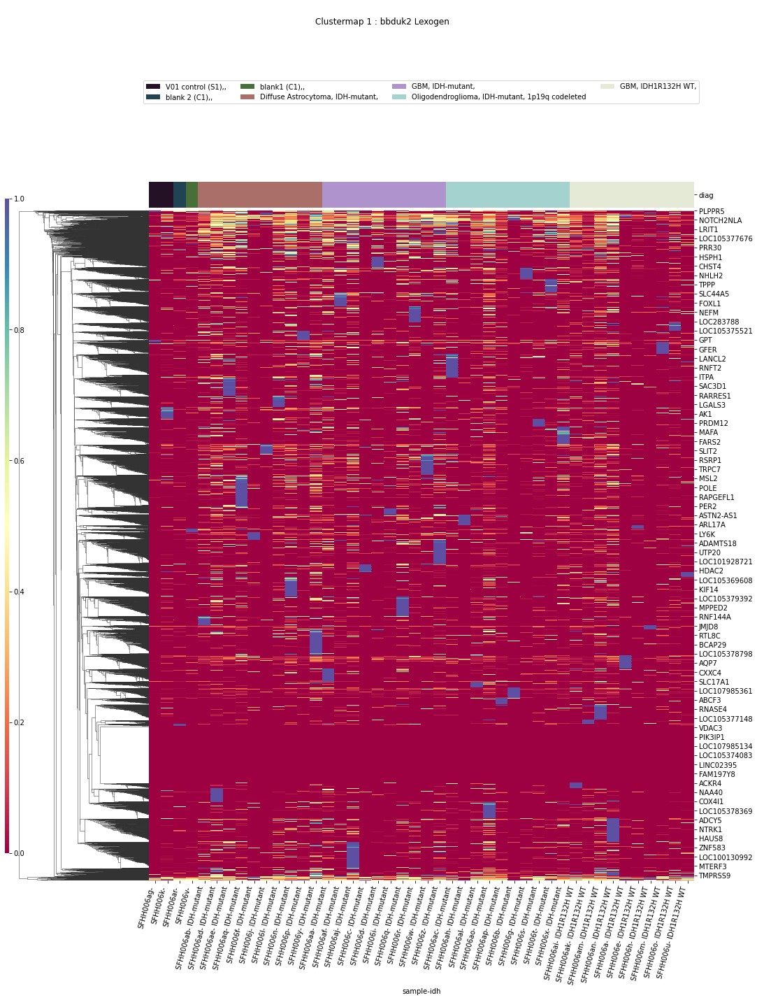

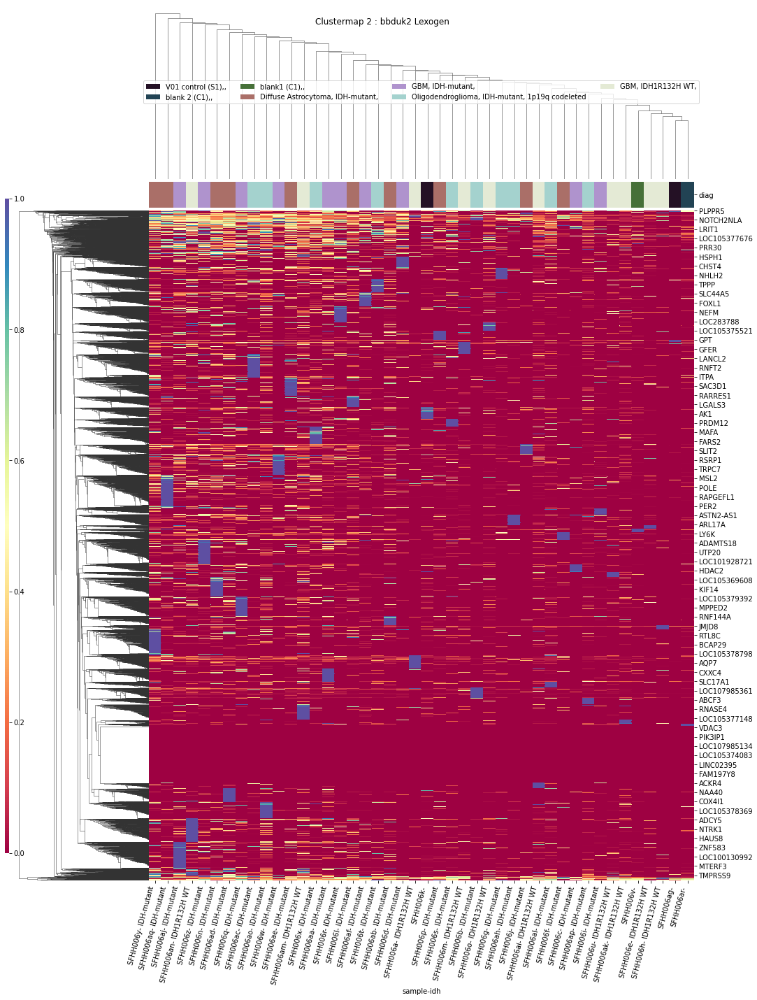

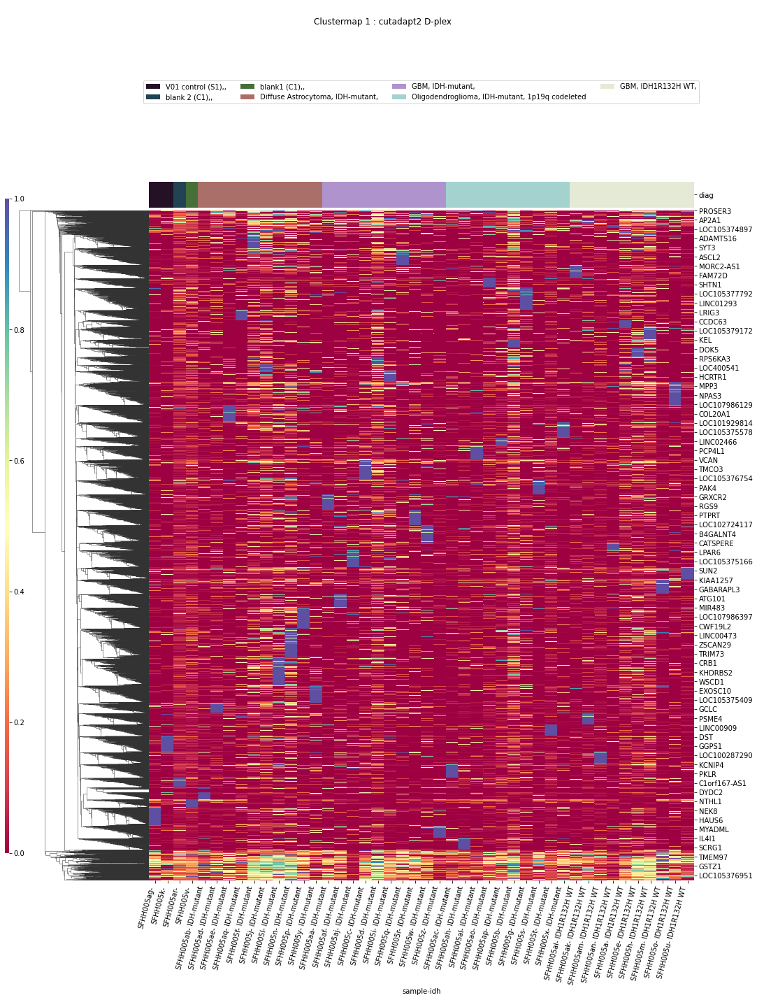

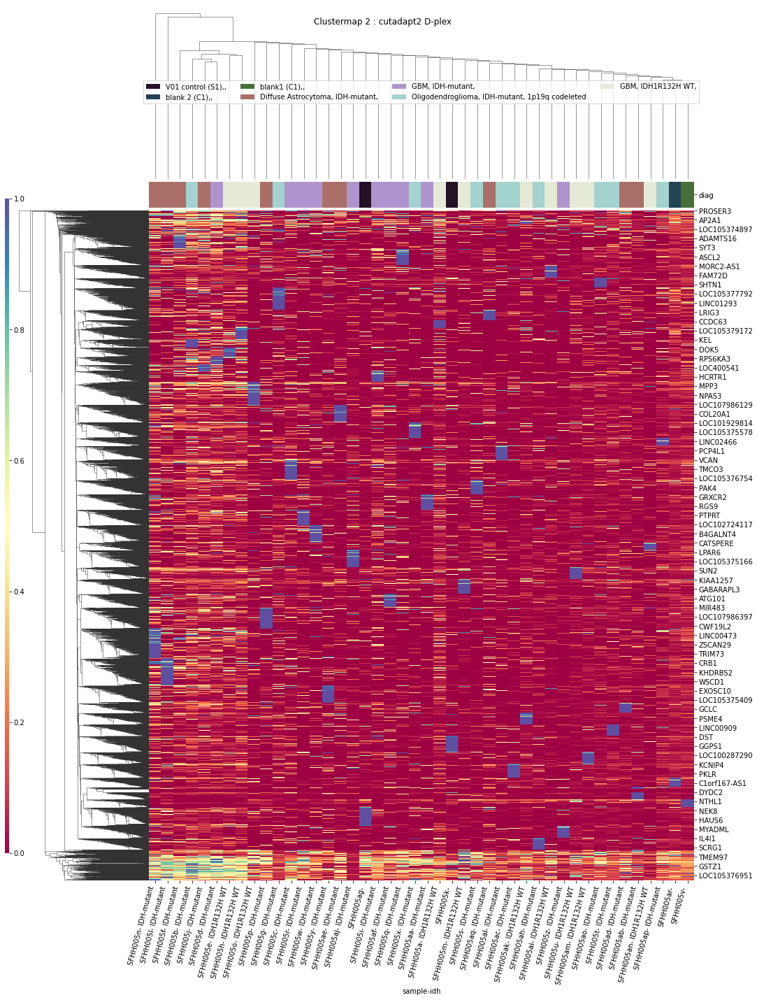

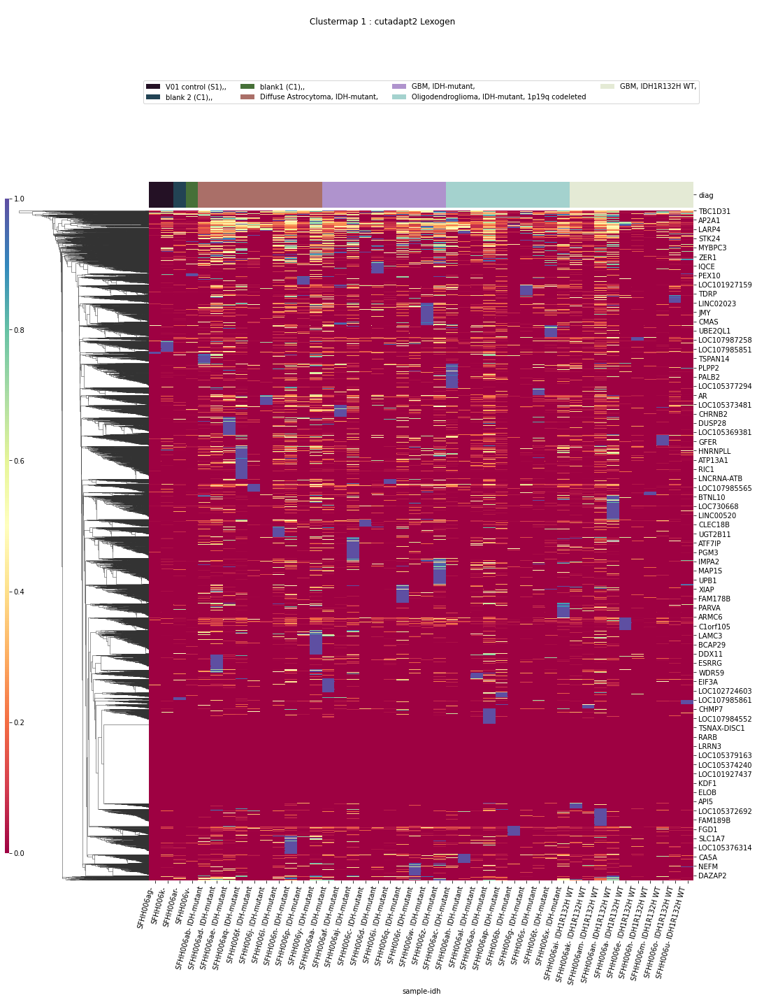

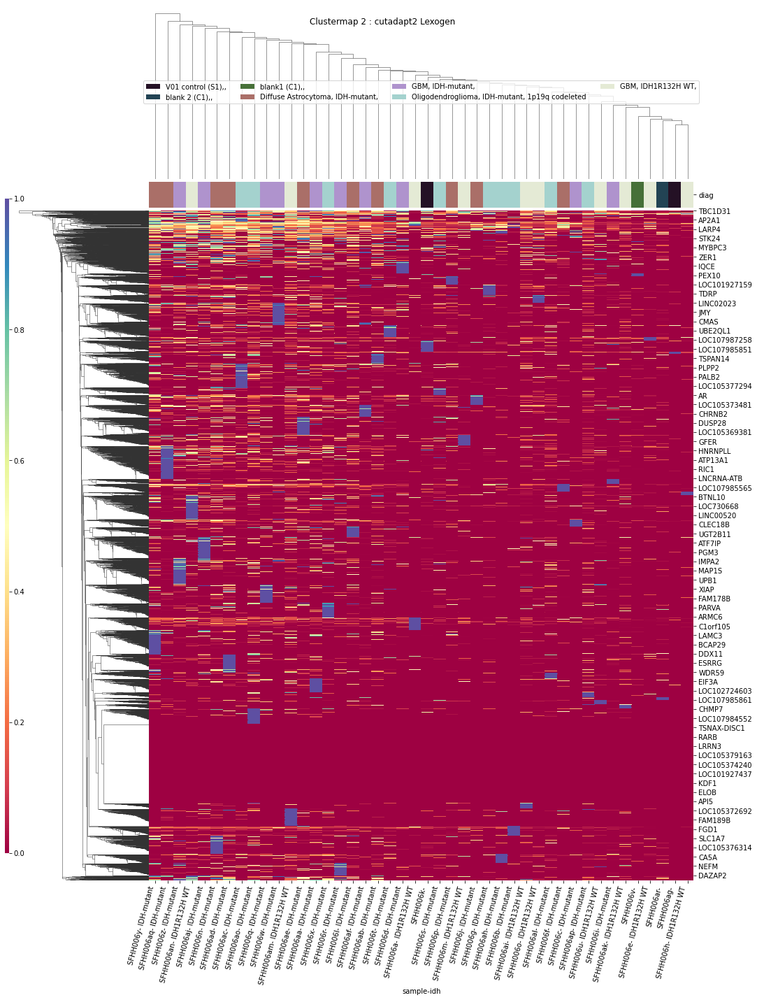

In [67]:
ttests_boxplots_and_heatmaps(dfn,elements,box_p=0.01,heat_p=0.1)

In [68]:
datetime.now().strftime("%H:%M:%S")

'13:25:12'

# PCA

In [87]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
#alldiags=dfn['diag'].unique().tolist()

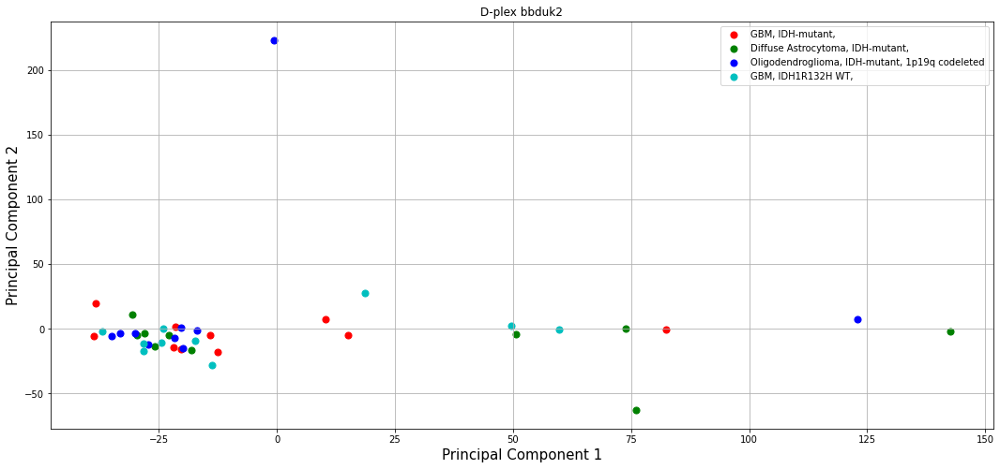

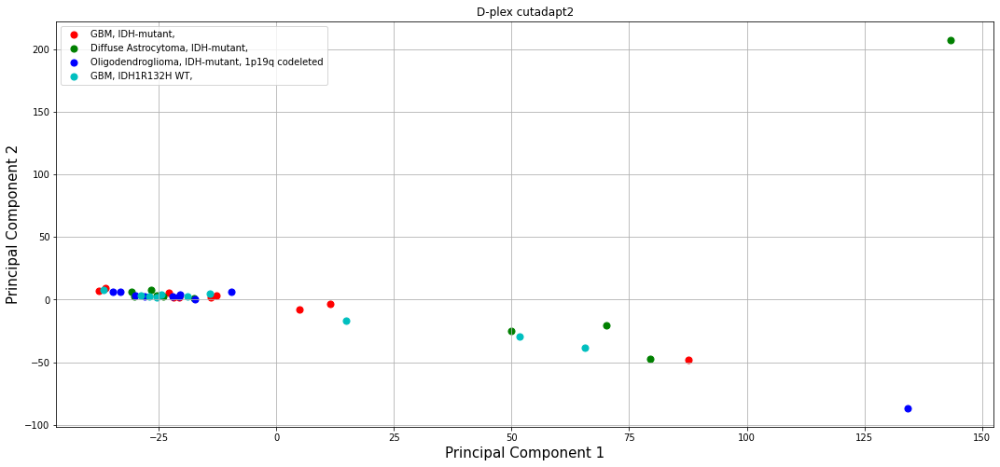

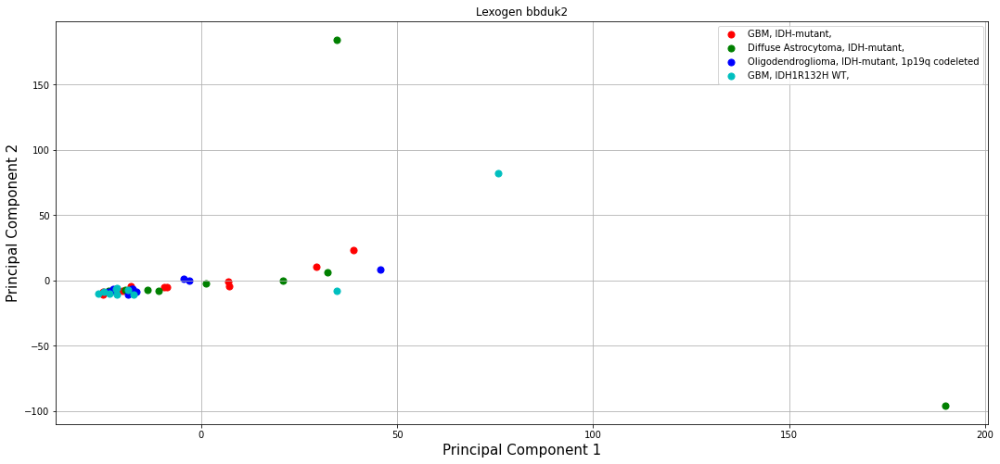

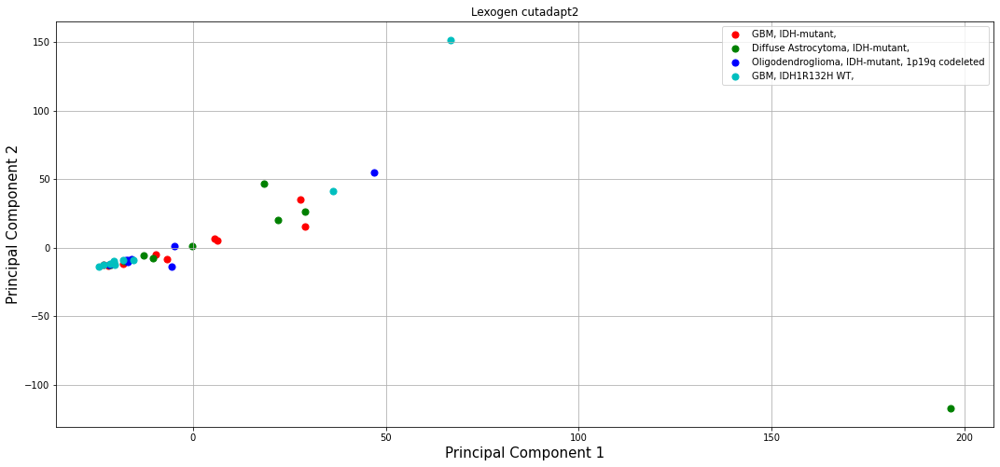

In [88]:
for labkit in dfn['Lab kit'].unique():
    #"D-plex","Lexogen":
    for trimmer in 'bbduk2','cutadapt2':
        #localdf['Trimmer'].unique():
        #pcadf=dfn[(dfn["Lab kit"]==labkit) & (dfn["trimmer"]==trimmer).copy()
        pcadf=dfn[(dfn["Lab kit"]==labkit) & (dfn["trimmer"]==trimmer) & dfn['diag'].isin(diags)].copy()

        scaler = StandardScaler()
        scaler.fit(pcadf[elements])
        scaled_data = scaler.transform(pcadf[elements])
        #scaled_data[0]
        pca = PCA(n_components=2)
        pca.fit(scaled_data)
        x_pca = pca.transform(scaled_data)
        #pcadf['diag_index']=pcadf['diag'].apply(lambda x: alldiags.index(x))
        pcadf['diag_index']=pcadf['diag'].apply(lambda x: diags.index(x))
        fig = plt.figure(figsize = (18,8))
        ax = fig.add_subplot(1,1,1) 
        ax.set_xlabel('Principal Component 1', fontsize = 15)
        ax.set_ylabel('Principal Component 2', fontsize = 15)
        ax.set_title('2 component PCA', fontsize = 20)
        #targets = alldiags
        targets = diags
        colors = ['r','g','b','c','m','y','k']
        for target, color in zip(targets,colors):
            indicesToKeep = pcadf['diag'] == target
            ax.scatter(x_pca[indicesToKeep, 0], x_pca[indicesToKeep, 1], c = color, s = 50)
        ax.legend(targets)
        ax.grid()
        plt.title(labkit + " " + trimmer)
        plt.show()
        

In [83]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [84]:
pd.set_option('display.max_columns', default_max_columns)

In [85]:
pd.set_option('display.max_rows',default_max_rows)

In [86]:
pd.set_option('display.precision', default_precision)